In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
%matplotlib inline

In [3]:
df = pd.read_csv('CustomerChurn.csv')

In [3]:
df.sample(5)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
1257,0723-VSOBE,Female,1,No,No,45,No,No phone service,DSL,No,...,No,No,No,Yes,One year,No,Electronic check,34.20,1596.6,No
2754,6351-SCJKT,Male,0,No,No,3,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,Month-to-month,No,Mailed check,41.35,107.25,No
5388,5515-IDEJJ,Male,0,Yes,Yes,1,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Mailed check,19.90,19.9,Yes
3208,8550-XSXUQ,Male,0,Yes,No,48,Yes,Yes,DSL,No,...,Yes,No,No,Yes,One year,Yes,Credit card (automatic),70.55,3420.5,No
4035,1485-YDHMM,Male,0,Yes,Yes,52,Yes,Yes,Fiber optic,No,...,No,Yes,No,Yes,Month-to-month,Yes,Bank transfer (automatic),93.25,4631.7,No


In [4]:
df.shape

(7043, 21)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


No missing values so far

3 numerical value having columns : 
- SeniorCitizen
- tenure
- MonthlyCharges

In [7]:
df.SeniorCitizen.unique()

array([0, 1], dtype=int64)

Senior citizen coln it seems like is a coln of only 0s and 1s so it can be treated as categorical coln instead of numerical.
Lets put it as follows :
- 1 -> Yes
- 0 -> No

In [4]:
df.SeniorCitizen.replace([0,1],['No','Yes'],inplace=True)

C:\Users\rohit\AppData\Local\Temp\ipykernel_1788\1476157487.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df.SeniorCitizen.replace([0,1],['No','Yes'],inplace=True)


In [10]:
df.sample(5)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
6112,5553-AOINX,Female,Yes,Yes,Yes,66,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Electronic check,104.90,6891.45,No
1743,3768-VHXQO,Male,No,Yes,No,67,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Credit card (automatic),24.85,1583.5,No
3849,5089-IFSDP,Female,No,Yes,No,58,Yes,Yes,Fiber optic,Yes,...,Yes,No,Yes,Yes,Two year,Yes,Bank transfer (automatic),109.45,6144.55,Yes
1047,4026-SKKHW,Male,No,No,No,3,Yes,No,DSL,No,...,No,Yes,No,No,Month-to-month,Yes,Mailed check,50.25,152.3,No
6734,8182-PNAGI,Male,No,No,No,12,Yes,No,DSL,No,...,No,Yes,No,No,Month-to-month,No,Bank transfer (automatic),50.25,593.75,Yes


Another insight is that TotalCharges is of object datatype but it will be better if it is numerical instead<br/>
So convert TotalCharges to numerical values

In [26]:
df.TotalCharges.values.astype(float)

ValueError: could not convert string to float: ' '

This fails so there might be missing values in the totalcharges coln lets check it out

In [5]:
df[df.TotalCharges.values == " "].TotalCharges.count()

11

So it would seem there are 11 blank values in the Total charges coln this is problematic because this is interfering with the conversion process of the coln from object to float

Lets replace the empty spaces with np.nan

In [6]:
df.TotalCharges.replace(" ",np.nan,inplace=True)

C:\Users\rohit\AppData\Local\Temp\ipykernel_1788\3754360897.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df.TotalCharges.replace(" ",np.nan,inplace=True)


Lets check again if the empty strings are gone

In [7]:
df[df.TotalCharges.values == " "].TotalCharges.count()

0

They are gone now we can smoothly perfrom conversion 

In [8]:
df.TotalCharges = df.TotalCharges.values.astype(float)

Lets check the datatype now

In [100]:
df.TotalCharges.dtype

dtype('float64')

It is float so we can use this numerical coln easily now for analysis

Lets get a quick summary of the numerical colns for now

In [107]:
df.describe()

,tenure,MonthlyCharges,TotalCharges
count,7043.000000,7043.000000,7032.000000
mean,32.371149,64.761692,2283.300441
std,24.559481,30.090047,2266.771362
min,0.000000,18.250000,18.800000
25%,9.000000,35.500000,401.450000
50%,29.000000,70.350000,1397.475000
75%,55.000000,89.850000,3794.737500
max,72.000000,118.750000,8684.800000


Now we have missing values to treat.... Here the amount of missing values is very less its just (11/7043*100)% = 0.1562% which is very less so we can very easily remove these colns and process the remaining data but we can also plug these values with the mean or median value..... lets try all the three methods in 3 seperate dataframes with the same data 

In [9]:
df_missing_removed = df.copy()
df_missing_mean = df.copy()
df_missing_median = df.copy()

In [104]:
df_missing_removed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   object 
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [105]:
df_missing_mean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   object 
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [106]:
df_missing_median.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   object 
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


All the above dataframes have 11 missing values in TotalCharges now lets process each step by step

1. Removing the missing values

Current shape

In [115]:
df_missing_removed.shape

(7043, 21)

Current status of missing values

In [10]:
df_missing_removed.isna().sum()

customerID           0
gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

We will drop the records or rows with missing values here 

In [11]:
df_missing_removed.dropna(axis=0,inplace=True)

Lets check the present details 

New shape

In [120]:
df_missing_removed.shape

(7032, 21)

Current Status of missing values

In [12]:
df_missing_removed.isna().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

The removal of missing values is successful

Lets get a quick summary again 

In [124]:
df_missing_removed.describe()

,tenure,MonthlyCharges,TotalCharges
count,7032.000000,7032.000000,7032.000000
mean,32.421786,64.798208,2283.300441
std,24.545260,30.085974,2266.771362
min,1.000000,18.250000,18.800000
25%,9.000000,35.587500,401.450000
50%,29.000000,70.350000,1397.475000
75%,55.000000,89.862500,3794.737500
max,72.000000,118.750000,8684.800000


Insights:
- tenure
1. mean: 32.42
2. median: 29.00
3. 25% have tenure more than 55
4. Outliers are not very high as mean and median are close to each other

- MonthlyCharges
1. mean: 64.798
2. median: 70.35
3. 25% have to pay more than 89.86
4. Outliers are not very high as mean and median are close to each other

- TotalCharges
1. mean: 2283.300
2. median: 1397.475
3. 25% have to pay more than 3794.73
4. Chances are that Outliers are high as mean and median are not close to each other

2. Replacing missing values with mean

Lets find the mean value of TotalCharges

In [122]:
mean = df_missing_mean.TotalCharges.mean()
mean

2283.3004408418656

Current Status of data and missing count

In [127]:
df_missing_mean.shape

(7043, 21)

In [128]:
df_missing_mean.isna().sum()

customerID           0
gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

Now we replace the null values with this mean value

In [129]:
df_missing_mean.fillna(mean,inplace=True)

Lets check the current details of the data 

In [130]:
df_missing_mean.shape

(7043, 21)

In [131]:
df_missing_mean.isna().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

Replacement of missing values with mean value successful

Lets get a quick summary now

In [132]:
df_missing_mean.describe()

,tenure,MonthlyCharges,TotalCharges
count,7043.000000,7043.000000,7043.000000
mean,32.371149,64.761692,2283.300441
std,24.559481,30.090047,2265.000258
min,0.000000,18.250000,18.800000
25%,9.000000,35.500000,402.225000
50%,29.000000,70.350000,1400.550000
75%,55.000000,89.850000,3786.600000
max,72.000000,118.750000,8684.800000


Insights:
- tenure
1. mean: 32.37
2. median: 29.00
3. 25% have tenure more than 55
4. Outliers are not very high as mean and median are close to each other

- MonthlyCharges
1. mean: 64.761
2. median: 70.35
3. 25% have to pay more than 89.85
4. Outliers are not very high as mean and median are close to each other

- TotalCharges
1. mean: 2283.300
2. median: 1400.55
3. 25% have to pay more than 3786.600
4. Chances are that Outliers are high as mean and median are not close to each other

3. Replacing missing value with median

In [133]:
median = df_missing_median.TotalCharges.median()
median

1397.475

Getting current info of data

In [134]:
df_missing_median.shape

(7043, 21)

In [135]:
df_missing_median.isna().sum()

customerID           0
gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

Lets replace null values with this median value

In [136]:
df_missing_median.fillna(median,inplace=True)

Current Status of data

In [138]:
df_missing_median.shape

(7043, 21)

In [139]:
df_missing_median.isna().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

Replacement of values with median successful

Lets get a quick summary of data

In [140]:
df.describe()

,tenure,MonthlyCharges,TotalCharges
count,7043.000000,7043.000000,7032.000000
mean,32.371149,64.761692,2283.300441
std,24.559481,30.090047,2266.771362
min,0.000000,18.250000,18.800000
25%,9.000000,35.500000,401.450000
50%,29.000000,70.350000,1397.475000
75%,55.000000,89.850000,3794.737500
max,72.000000,118.750000,8684.800000


Insights:
- tenure
1. mean: 32.37
2. median: 29.00
3. 25% have tenure more than 55
4. Outliers are not very high as mean and median are close to each other

- MonthlyCharges
1. mean: 64.761
2. median: 70.35
3. 25% have to pay more than 89.85
4. Outliers are not very high as mean and median are close to each other

- TotalCharges
1. mean: 2283.300
2. median: 1397.475
3. 25% have to pay more than 3794.738
4. Chances are that Outliers are high as mean and median are not close to each other

Not much of a difference is observed between the results of the 3 techniques so lets proceed with the removed values dataframe

Now lets drop the Customer ID coln as its a randomly generated id which has nothing to do with churning

In [148]:
df_missing_removed.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,No,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,No,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,No,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,No,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,No,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [13]:
df_missing_removed.drop(['customerID'],axis=1,inplace=True)

In [150]:
df_missing_removed.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,No,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,No,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,No,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,No,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,No,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


Now lets divide the coln tenure into bins of 12 months

In [14]:
labels = ["{0} - {1}".format(i, i + 11) for i in range(1, 72, 12)]
df_missing_removed['tenure_bins'] = pd.cut(df_missing_removed.tenure,np.arange(0,80,12),labels=labels)

In [15]:
df_missing_removed[['tenure','tenure_bins']]

,tenure,tenure_bins
0,1,1 - 12
1,34,25 - 36
2,2,1 - 12
3,45,37 - 48
4,2,1 - 12
...,...,...
7038,24,13 - 24
7039,72,61 - 72
7040,11,1 - 12
7041,4,1 - 12


In [177]:
df_missing_removed.tenure_bins.value_counts()

tenure_bins
1 - 12     2175
61 - 72    1407
13 - 24    1024
25 - 36     832
49 - 60     832
37 - 48     762
Name: count, dtype: int64

We dont need the tenure coln anymore so lets drop it

In [16]:
df_missing_removed.drop(['tenure'],axis=1,inplace=True)

Lets see some visual representations of data colns with Churn as the coloring factor to recognise potential insights

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


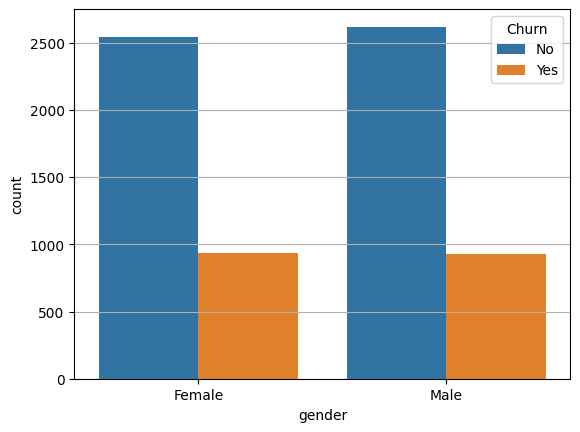

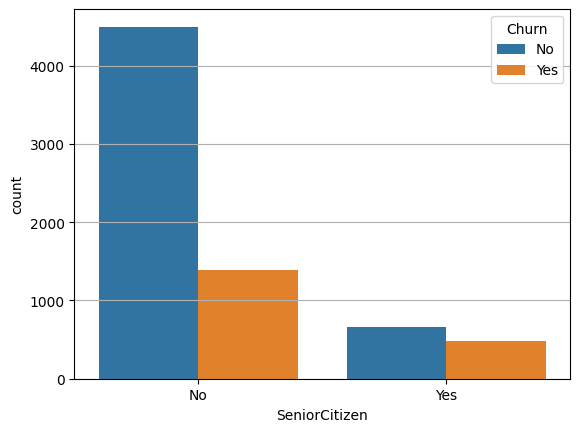

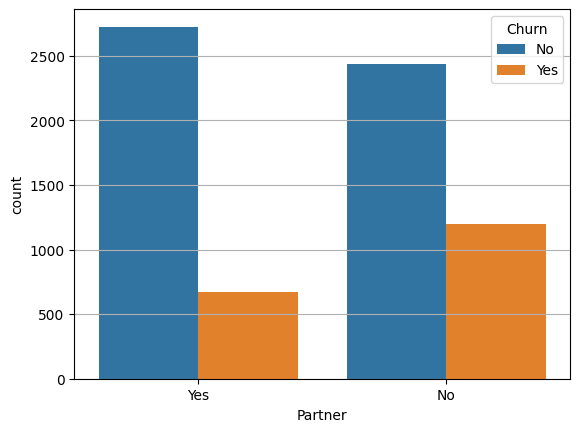

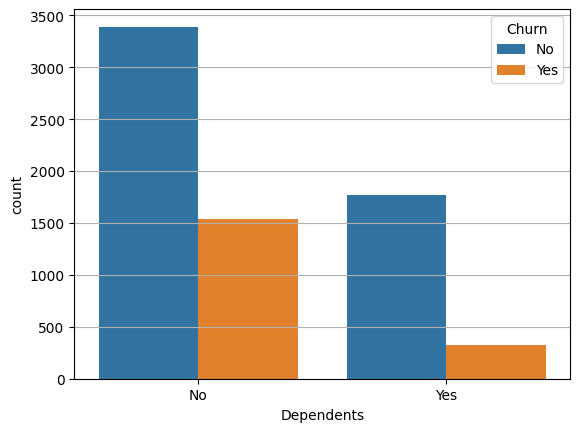

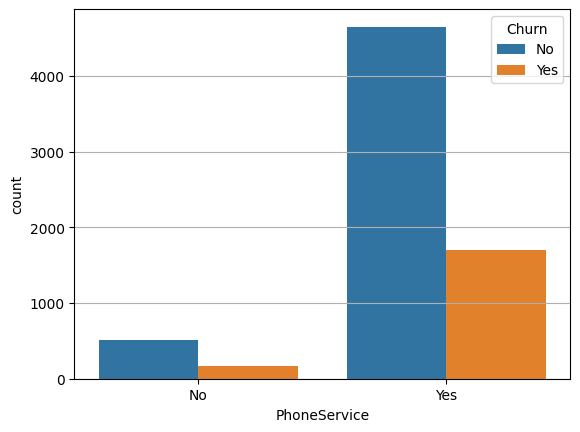

...

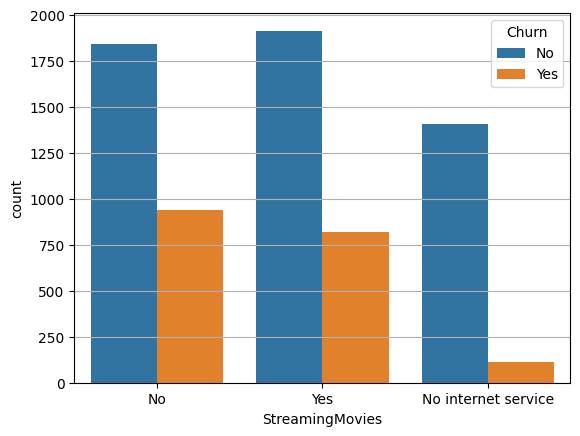

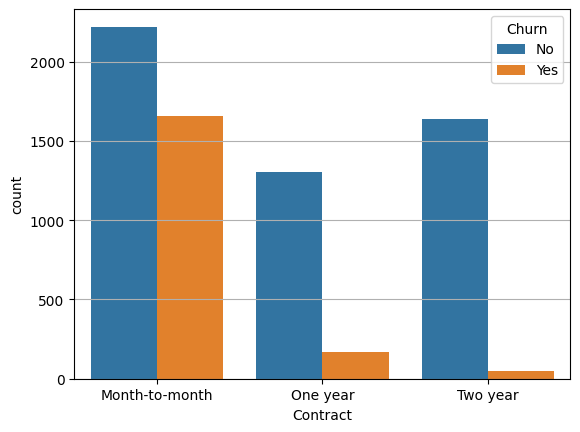

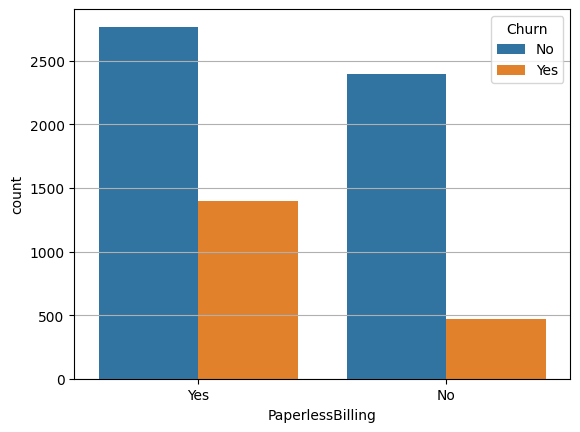

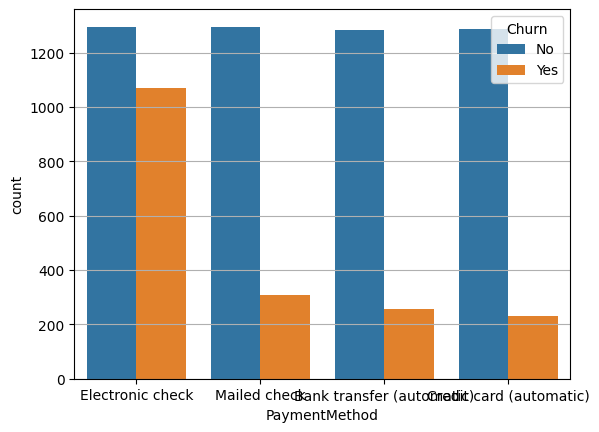

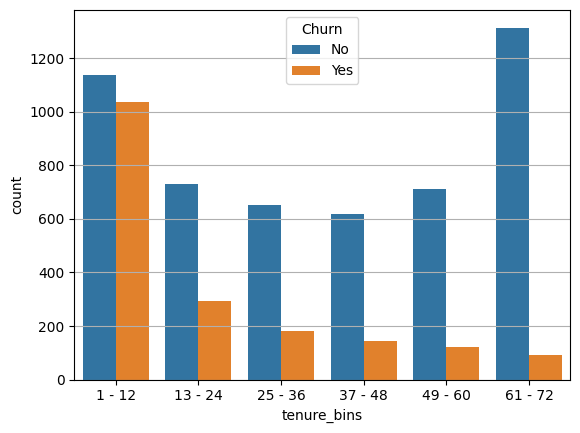

In [191]:
for i, predictor in enumerate(df_missing_removed.drop(columns=['Churn', 'TotalCharges', 'MonthlyCharges'])):
    plt.figure(i)
    sns.countplot(data=df_missing_removed, x=predictor, hue='Churn').grid(visible=True,axis='y')

Insights from the above graphs:
- Gender doesnt show much deviation both genders seem to churn at the same amount
- Almost 23% of non-senior citizens (6000) seem to churn as compared to 45% of senior citizens (1000)
- Almost 18.84% of people with partners churn compared to 34% of people without partners
- Almost 31% with no dependents churn compared to 16% with dependents
- Almost 16.7% with no phone service churn compared to 26% with phone service
- Almost 28% with no phone multiple lines churn compared to 25% with no multiple lines and 28% with multiple lines 
- Almost 18% with DSL churn compared to 42% with Fibre optics and 8% with no internet service
- Almost 41% with no online security churn compared to 16% with online security and 8% with no internet service for online security
- Almost 23% with online backup churn compared to 40% with no online backup and 8% with no internet service
- Almost 39% with no device protection churn compared to 24% with device protection 
- Almost 40% with no tech support churn compared to 15% with tech support
- Almost 33% with no streaming TV churn compared to 31% with streaming TV 
- Almost 33% with no streaming movies churn compared to 31% with streaming movies 
- Almost 38% with month-to-month contract churn compared to 16.7% with 1 year contract and 5% with 2 year contract
- Almost 33% with paperless billing churn compared to 1.6% with paperless billing
- Almost 49% with electronic check churn compared to 20% with mailed check, 16% with auto bank transfer and 14.75% with auto credit card
- Almost 47.7% with 1-12 months tenure churn compared to 29% of 13-24 months, 21.6% of 25-36 months, 20% of 37-48 months, 17.6% of 49-60 months and 6% of 61-72 months 


Here Churn is a categorical variable of yes and no which can be chnaged into binary representation as:
- Yes -> 1
- No -> 0

In [17]:
df_missing_removed['Churn'] = np.where(df_missing_removed.Churn == 'Yes',1,0)

In [195]:
df_missing_removed.sample(5)

,gender,SeniorCitizen,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,tenure_bins
3377,Male,No,Yes,No,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Credit card (automatic),25.05,1629.20,0,61 - 72
136,Female,No,No,No,Yes,No,Fiber optic,Yes,No,No,No,No,No,Month-to-month,Yes,Bank transfer (automatic),75.00,1778.50,0,13 - 24
4905,Female,No,Yes,Yes,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,Yes,Mailed check,19.85,1158.85,0,49 - 60
284,Male,No,Yes,Yes,Yes,No,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,No,Mailed check,95.15,1779.95,1,13 - 24
4604,Male,Yes,No,No,Yes,No,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),99.10,6496.15,0,61 - 72


To use the categorical colns for graphical analysis we will change the categorical colns by encoding them using dummy encoding 

In [18]:
df_missing_removed_dummies = pd.get_dummies(df_missing_removed)

In [197]:
df_missing_removed_dummies.head()

,MonthlyCharges,TotalCharges,Churn,gender_Female,gender_Male,SeniorCitizen_No,SeniorCitizen_Yes,Partner_No,Partner_Yes,Dependents_No,...,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,tenure_bins_1 - 12,tenure_bins_13 - 24,tenure_bins_25 - 36,tenure_bins_37 - 48,tenure_bins_49 - 60,tenure_bins_61 - 72
0,29.85,29.85,0,True,False,True,False,False,True,True,...,False,False,True,False,True,False,False,False,False,False
1,56.95,1889.50,0,False,True,True,False,True,False,True,...,False,False,False,True,False,False,True,False,False,False
2,53.85,108.15,1,False,True,True,False,True,False,True,...,False,False,False,True,True,False,False,False,False,False
3,42.30,1840.75,0,False,True,True,False,True,False,True,...,True,False,False,False,False,False,False,True,False,False
4,70.70,151.65,1,True,False,True,False,True,False,True,...,False,False,True,False,True,False,False,False,False,False


Now lets get the correlation between the colns

In [200]:
df_missing_removed_dummies.corr()

,MonthlyCharges,TotalCharges,Churn,gender_Female,gender_Male,SeniorCitizen_No,SeniorCitizen_Yes,Partner_No,Partner_Yes,Dependents_No,...,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,tenure_bins_1 - 12,tenure_bins_13 - 24,tenure_bins_25 - 36,tenure_bins_37 - 48,tenure_bins_49 - 60,tenure_bins_61 - 72
MonthlyCharges,1.000000,0.651065,0.192858,0.013779,-0.013779,-0.219874,0.219874,-0.097825,0.097825,0.112343,...,0.042410,0.030055,0.271117,-0.376568,-0.191881,-0.047220,0.009465,0.017614,0.070048,0.185440
TotalCharges,0.651065,1.000000,-0.199484,-0.000048,0.000048,-0.102411,0.102411,-0.319072,0.319072,-0.064653,...,0.186119,0.182663,-0.060436,-0.294708,-0.592443,-0.210745,-0.047370,0.083696,0.252905,0.639312
Churn,0.192858,-0.199484,1.000000,0.008545,-0.008545,-0.150541,0.150541,0.149982,-0.149982,0.163128,...,-0.118136,-0.134687,0.301455,-0.090773,0.319628,0.019929,-0.040997,-0.059579,-0.100800,-0.226078
gender_Female,0.013779,-0.000048,0.008545,1.000000,-1.000000,-0.001819,0.001819,-0.001379,0.001379,0.010349,...,0.015973,-0.001632,-0.000844,-0.013199,0.001050,0.000649,-0.006249,0.020658,0.004319,-0.016279
gender_Male,-0.013779,0.000048,-0.008545,-1.000000,1.000000,0.001819,-0.001819,0.001379,-0.001379,-0.010349,...,-0.015973,0.001632,0.000844,0.013199,-0.001050,-0.000649,0.006249,-0.020658,-0.004319,0.016279
SeniorCitizen_No,-0.219874,-0.102411,-0.150541,-0.001819,0.001819,1.000000,-1.000000,0.016957,-0.016957,-0.210550,...,0.016235,0.024359,-0.171322,0.152987,0.027713,-0.001860,-0.027317,0.000929,-0.014186,0.002407
SeniorCitizen_Yes,0.219874,0.102411,0.150541,0.001819,-0.001819,-1.000000,1.000000,-0.016957,0.016957,0.210550,...,-0.016235,-0.024359,0.171322,-0.152987,-0.027713,0.001860,0.027317,-0.000929,0.014186,-0.002407
Partner_No,-0.097825,-0.319072,0.149982,-0.001379,0.001379,0.016957,-0.016957,1.000000,-1.000000,0.452269,...,-0.111406,-0.082327,0.083207,0.096948,0.305061,0.048481,-0.003131,-0.035092,-0.105341,-0.280353
Partner_Yes,0.097825,0.319072,-0.149982,0.001379,-0.001379,-0.016957,0.016957,-1.000000,1.000000,-0.452269,...,0.111406,0.082327,-0.083207,-0.096948,-0.305061,-0.048481,0.003131,0.035092,0.105341,0.280353
Dependents_No,0.112343,-0.064653,0.163128,0.010349,-0.010349,-0.210550,0.210550,0.452269,-0.452269,1.000000,...,-0.052369,-0.061134,0.149274,-0.056448,0.145379,0.001459,-0.009289,-0.023544,-0.031419,-0.118090


Here monthly charges has corr = 0.651065 with total charges meaning they are positively correlated 

Lets see how monthly charges affect total charges as a graph now

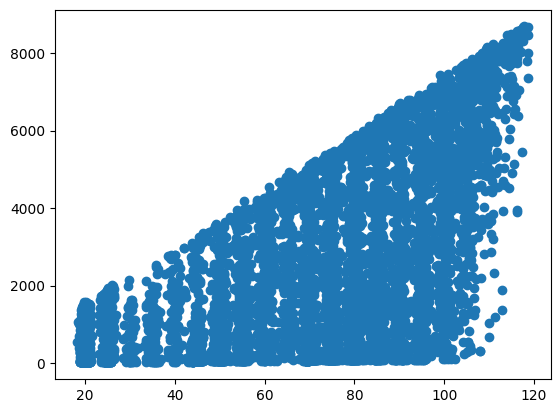

In [201]:
plt.scatter(df_missing_removed_dummies.MonthlyCharges,df_missing_removed_dummies.TotalCharges)

As expected with positive correlation the TotalCharges increase with increase in monthly charges

Let us now see how exactly is churn correlated with all the values in the dataframe as a quick summary

<Axes: >

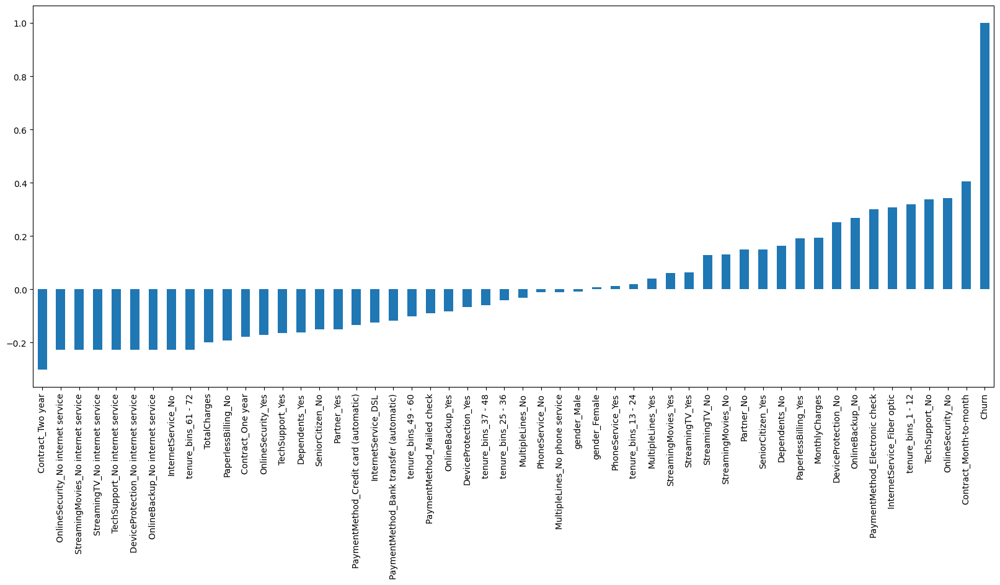

In [207]:
plt.figure(figsize=(20,8))
df_missing_removed_dummies.corr().loc['Churn'].sort_values().plot(kind='bar')

An interesting insight here is that Monthly charges has quite a positive relation with Churn but on the other hand Total charges has an interesting amount of negative correlation with Churn

It would also seem that with increasing tenure the Churn is getting affected in a negative way 

Let us demonstrate that using a kdeplot for better visualization

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'Monthly Charges')

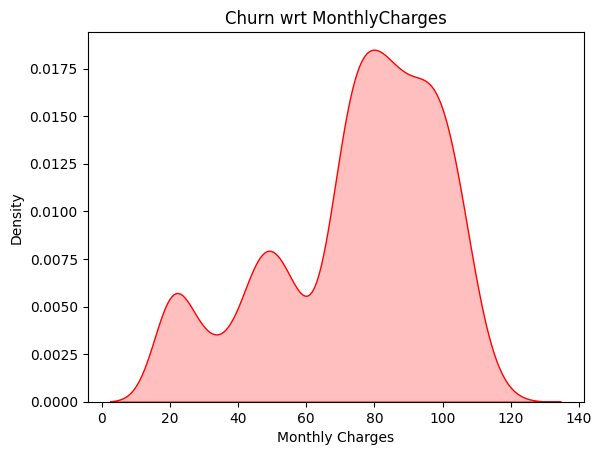

In [217]:
kde = sns.kdeplot(df_missing_removed_dummies.MonthlyCharges[(df_missing_removed_dummies['Churn']==1)],color='red',fill=True)
kde.set_title('Churn wrt MonthlyCharges')
kde.set_xlabel('Monthly Charges')

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'Total Charges')

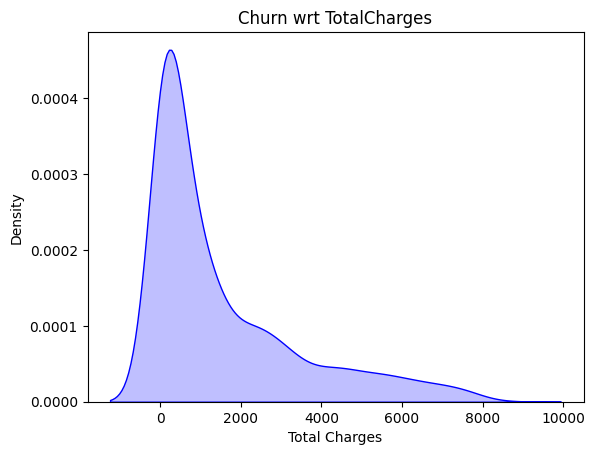

In [218]:
kde = sns.kdeplot(df_missing_removed_dummies.TotalCharges[(df_missing_removed_dummies['Churn']==1)],color='blue',fill=True)
kde.set_title('Churn wrt TotalCharges')
kde.set_xlabel('Total Charges')

The above two graphs show that indeed there is a opposite relation between churn and total charges 

Lets represent the correlation visually

<Axes: >

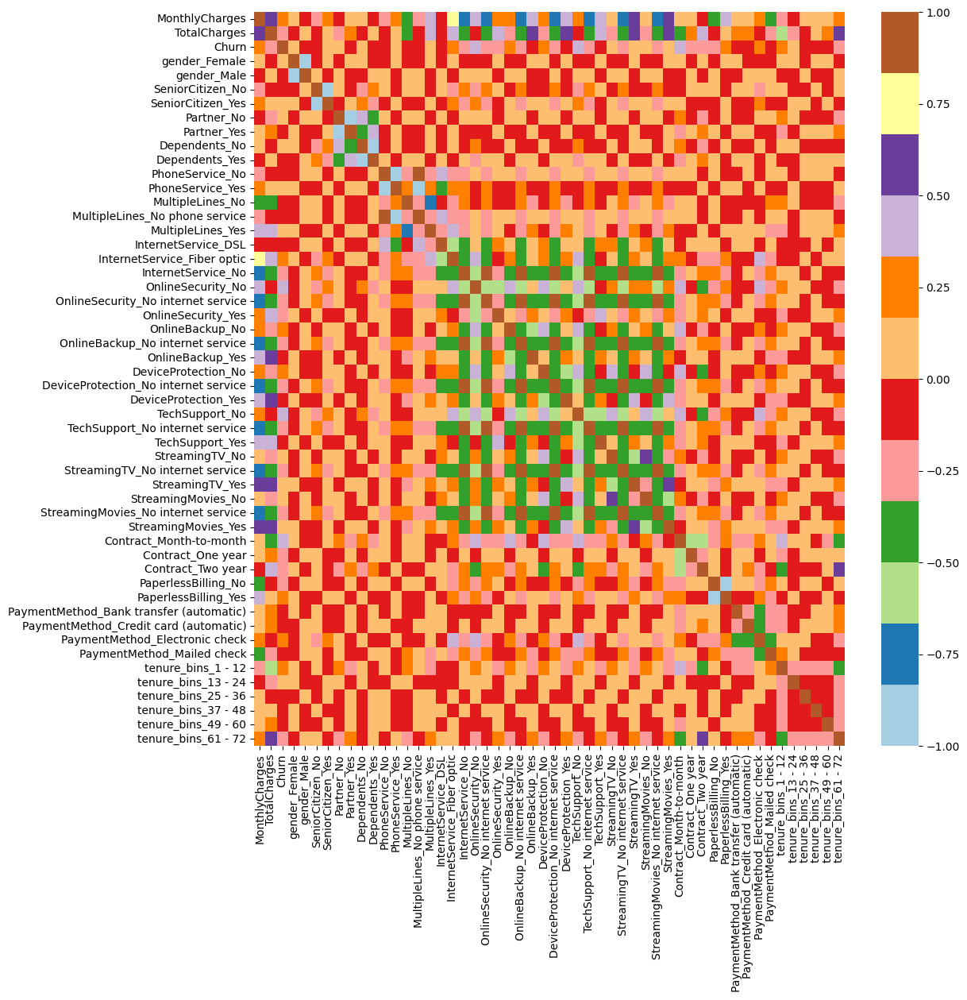

In [246]:
plt.figure(figsize=(12,12))
sns.heatmap(df_missing_removed_dummies.corr(), cmap="Paired")

Lets divide the dataframe into two parts:
1. target_0 : with all Churn values as 0
2. target_1 : with all Churn values as 1 

In [19]:
target_0 = df_missing_removed.loc[df_missing_removed['Churn']==0]
target_1 = df_missing_removed.loc[df_missing_removed['Churn']==1]

A function to plot two variables with relation to if they are churned or not

In [42]:
def uniplot(df,col,title,hue=None):
    
    sns.set_style('whitegrid')
    sns.set_context('talk')
    plt.rcParams["axes.labelsize"] = 20
    plt.rcParams['axes.titlesize'] = 22
    plt.rcParams['axes.titlepad'] = 30
    
    
    temp = pd.Series(data = hue)
    fig, ax = plt.subplots()
    width = len(df[col].unique()) + 7 + 4*len(temp.unique())
    fig.set_size_inches(width , 8)
    plt.xticks(rotation=45)
    plt.yscale('log')
    plt.title(title)
    ax = sns.countplot(data = df, x= col, order=df[col].value_counts().index,hue = hue,palette='bright') 
        
    plt.show()

In [257]:
df_missing_removed.columns

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService',
       'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup',
       'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies',
       'Contract', 'PaperlessBilling', 'PaymentMethod', 'MonthlyCharges',
       'TotalCharges', 'Churn', 'tenure_bins'],
      dtype='object')

Let us now perform focused analysis on which segment of the customers are churning

In [264]:
colns = ['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService',
       'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup',
       'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies',
       'Contract', 'PaperlessBilling', 'PaymentMethod','tenure_bins']

Gender

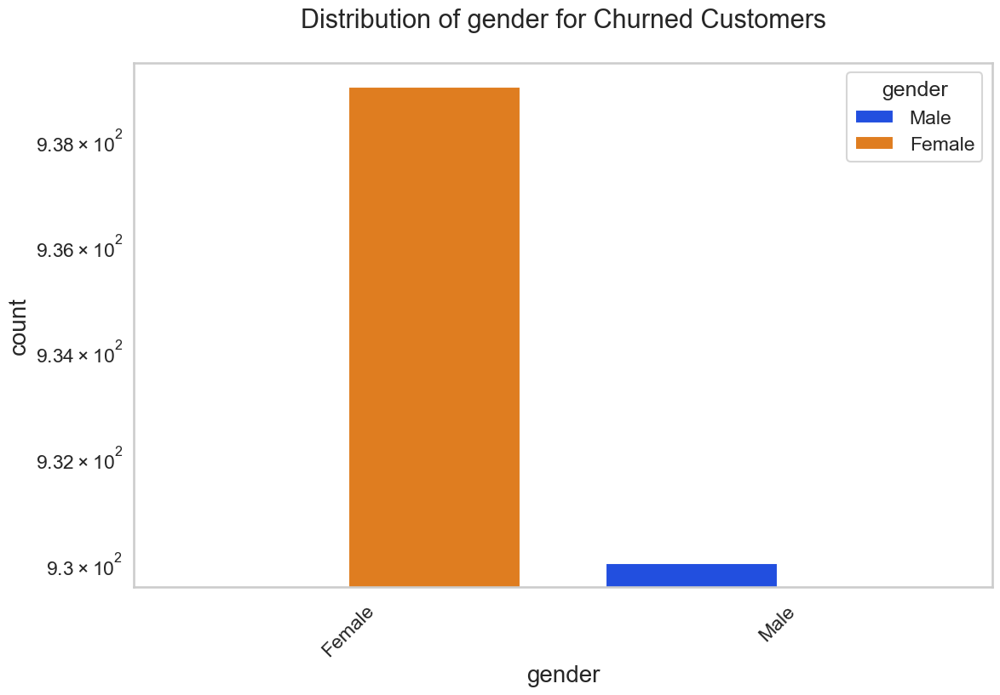

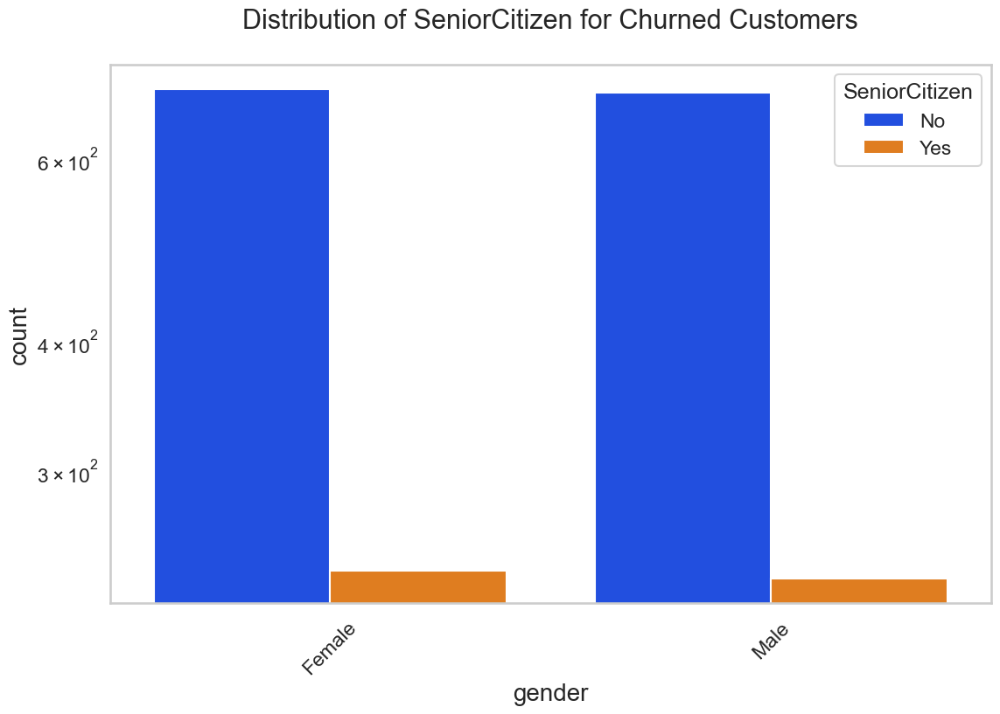

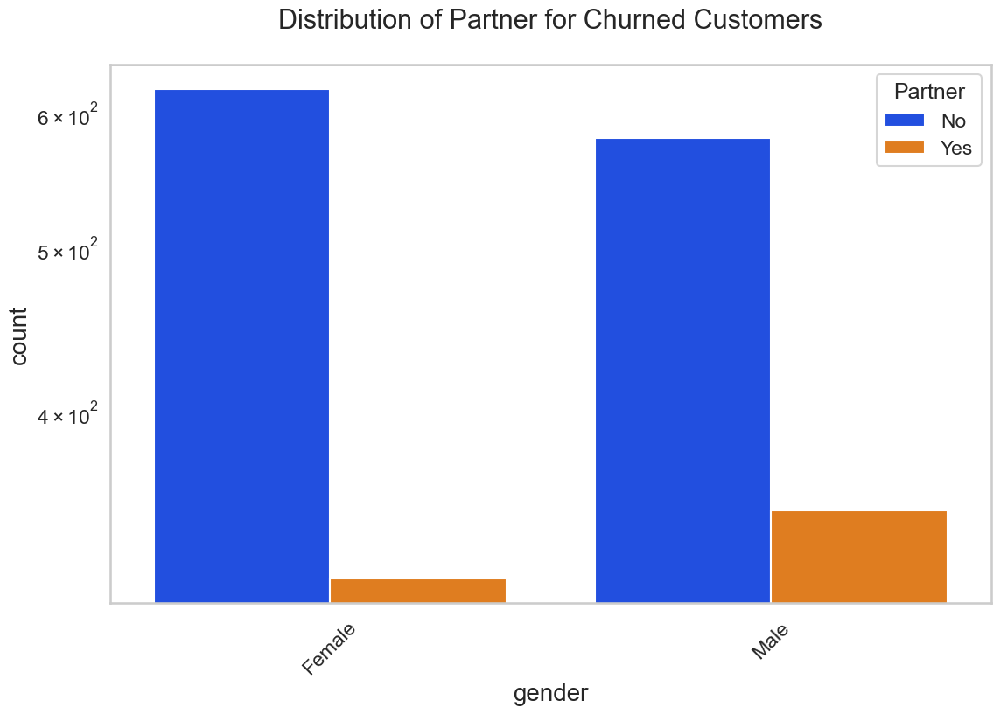

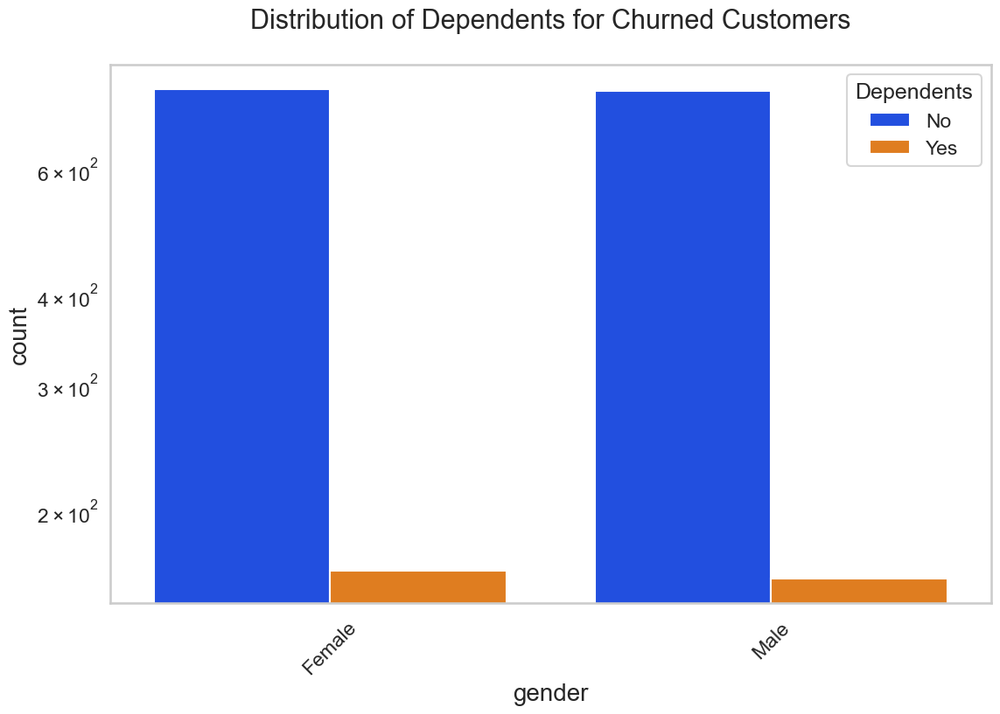

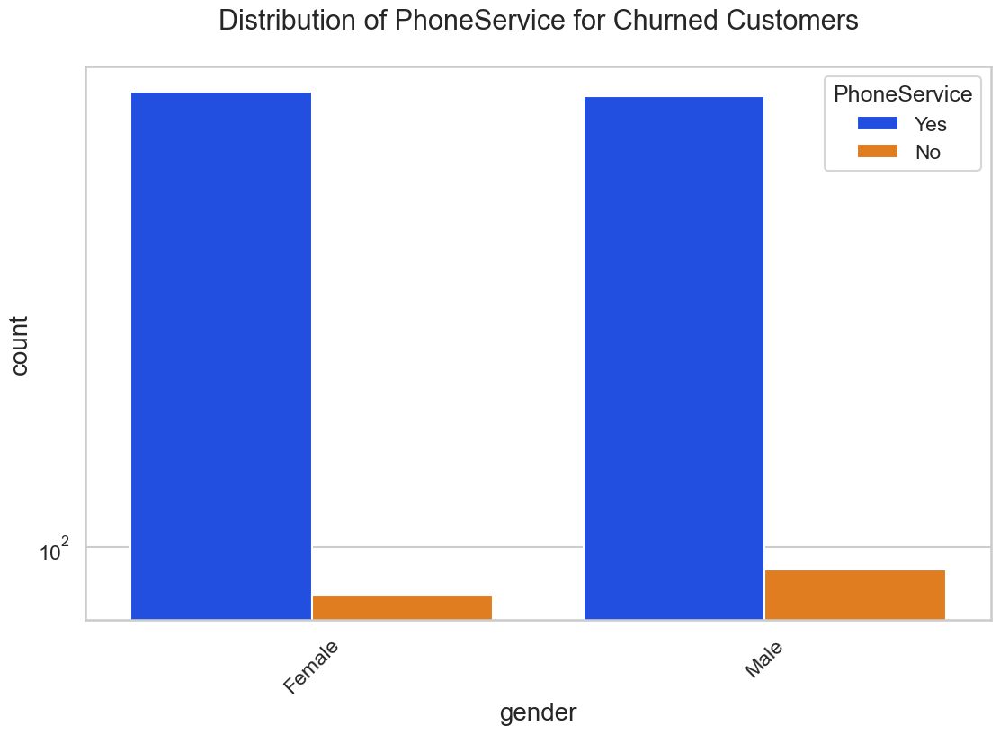

...

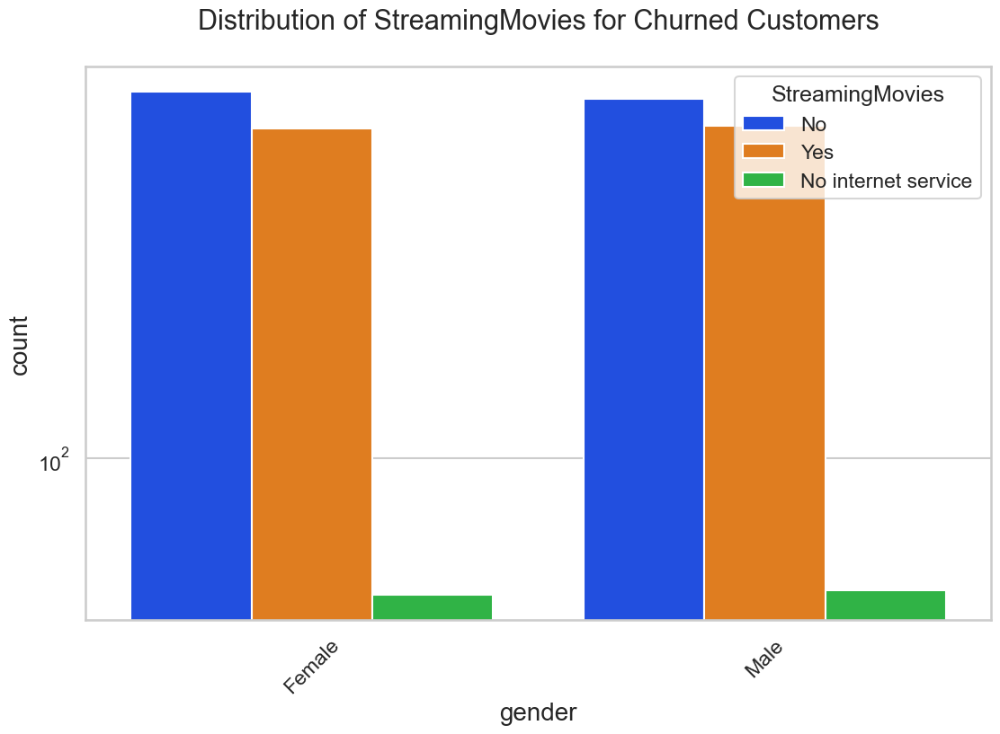

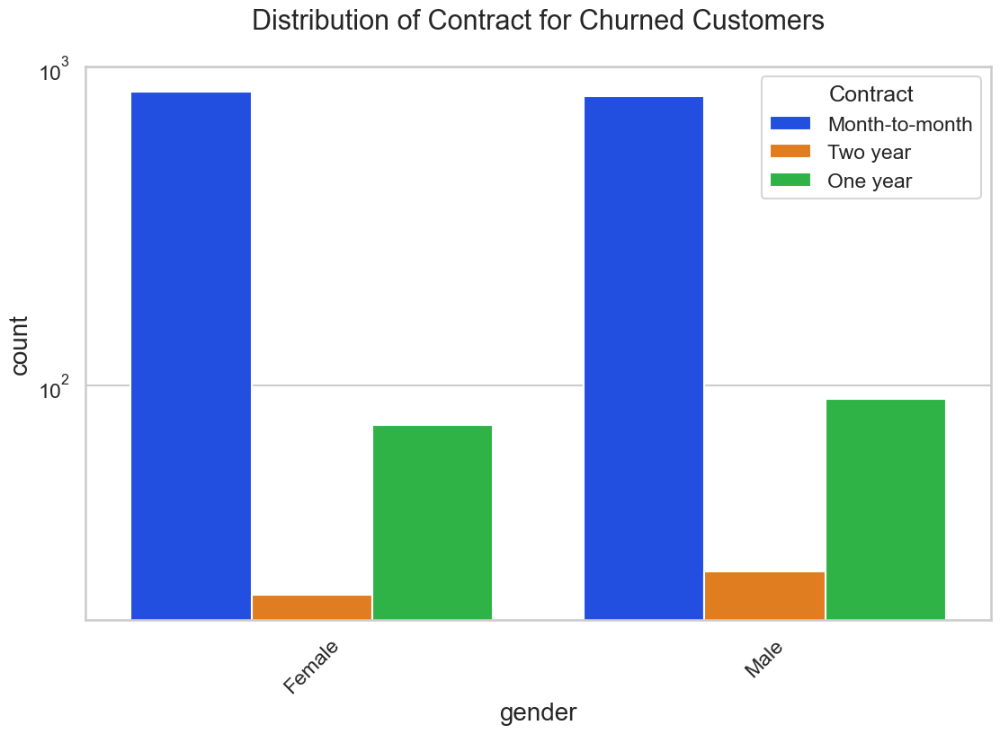

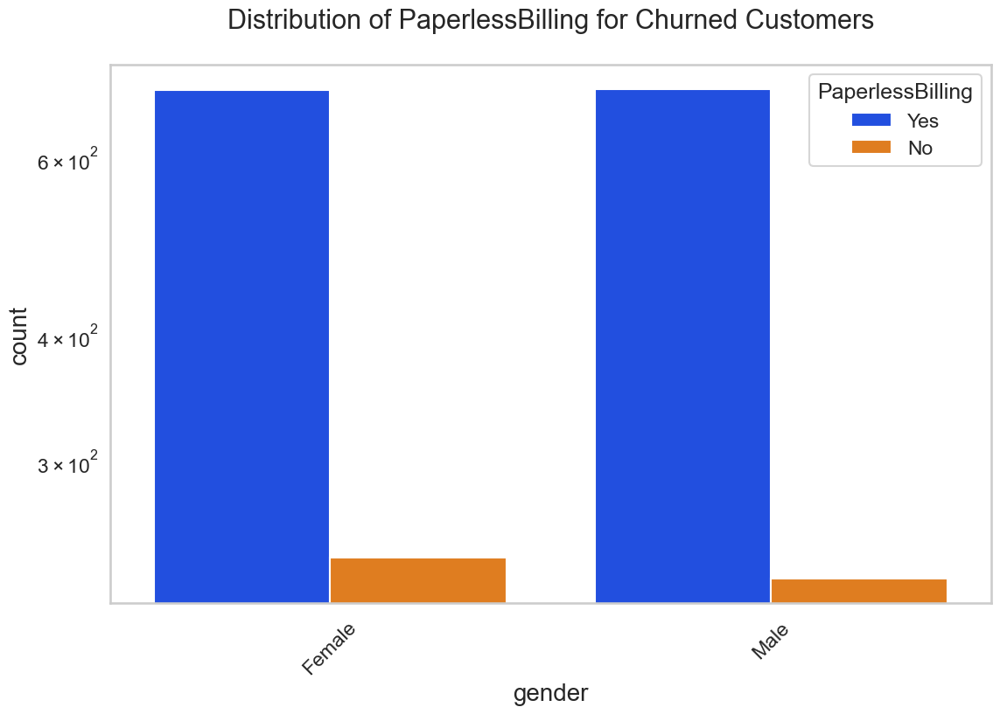

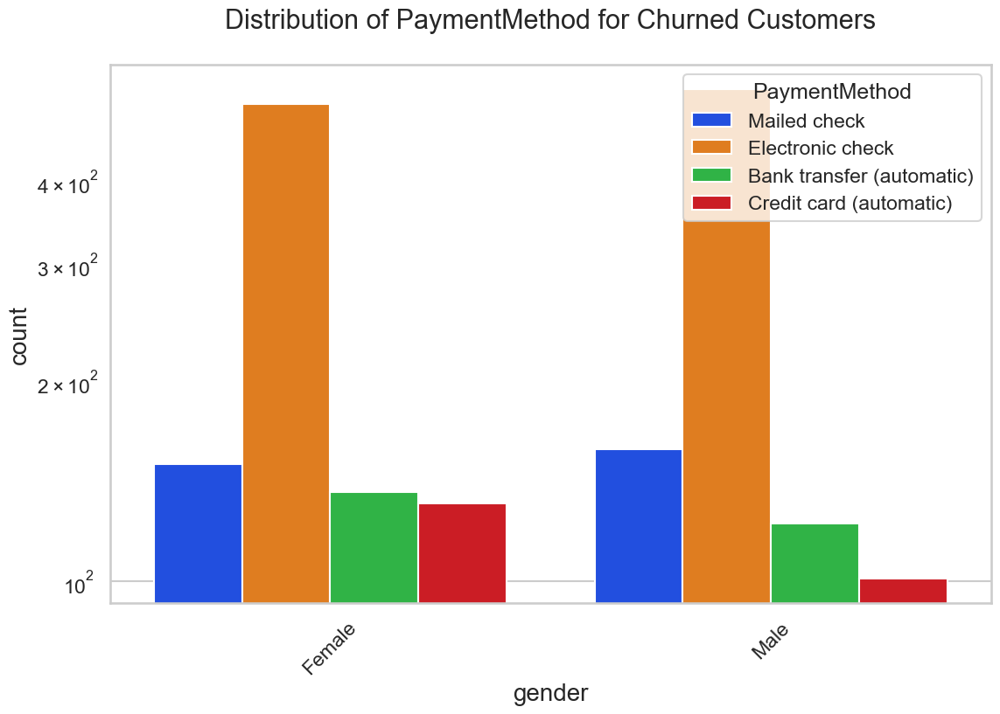

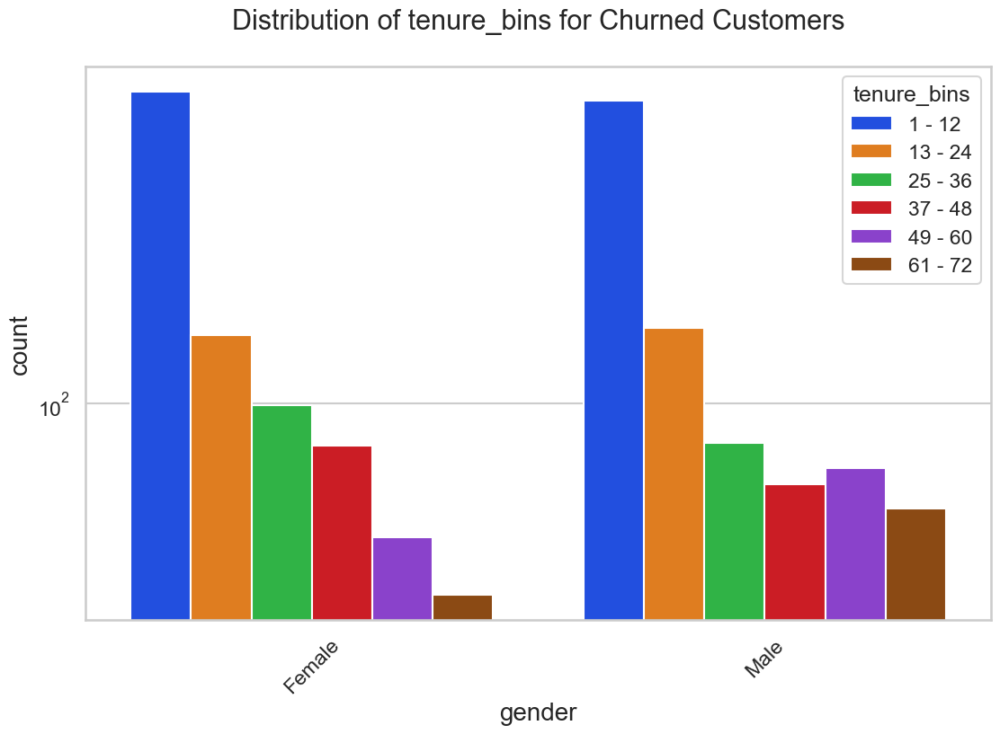

In [266]:
for col in colns:    
    uniplot(target_1,col='gender',title=f'Distribution of {col} for Churned Customers',hue=col)

Insights from comparing with Gender:
- Both Female senior and non senior citizens are more likely to churn
- Female and male with no dependents are equally likely to churn
- Female and male with phone service are equally likely to churn
- Females without multiple lines and males with multiple lines more likely to churn
- regardless of gender ppl with fibre optics more likely to churn
- regardless of gender ppl without online security more likely to churn
- regardless of gender ppl without online backup more likely to churn
- regardless of gender ppl without device protection more likely to churn
- regardless of gender ppl without tech support more likely to churn
- regardless of gender ppl without streaming tv more likely to churn
- Females without streaming tv slightly more likely to churn
- Females without streaming movies slightly more likely to churn
- regardless of gender ppl with month to month contract more likely to churn
- regardless of gender ppl with paperless billing more likely to churn
- regardless of gender ppl with electronic check more likely to churn
- regardless of gender ppl in 1-12 month tenure more likely to churn

***In general Females slightly more likely to churn***

Senior Citizen

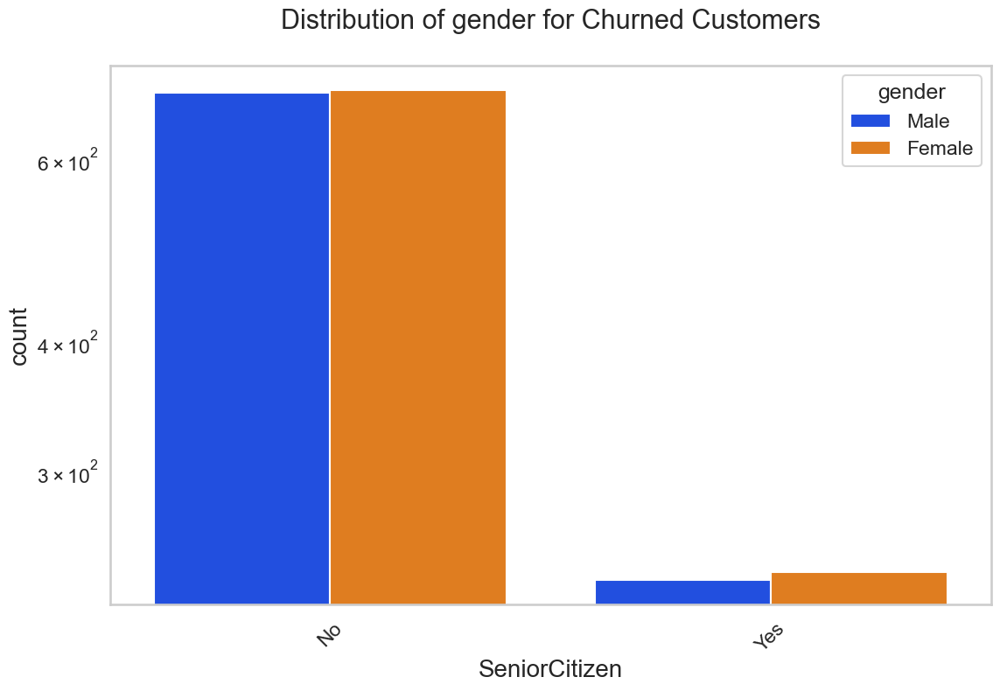

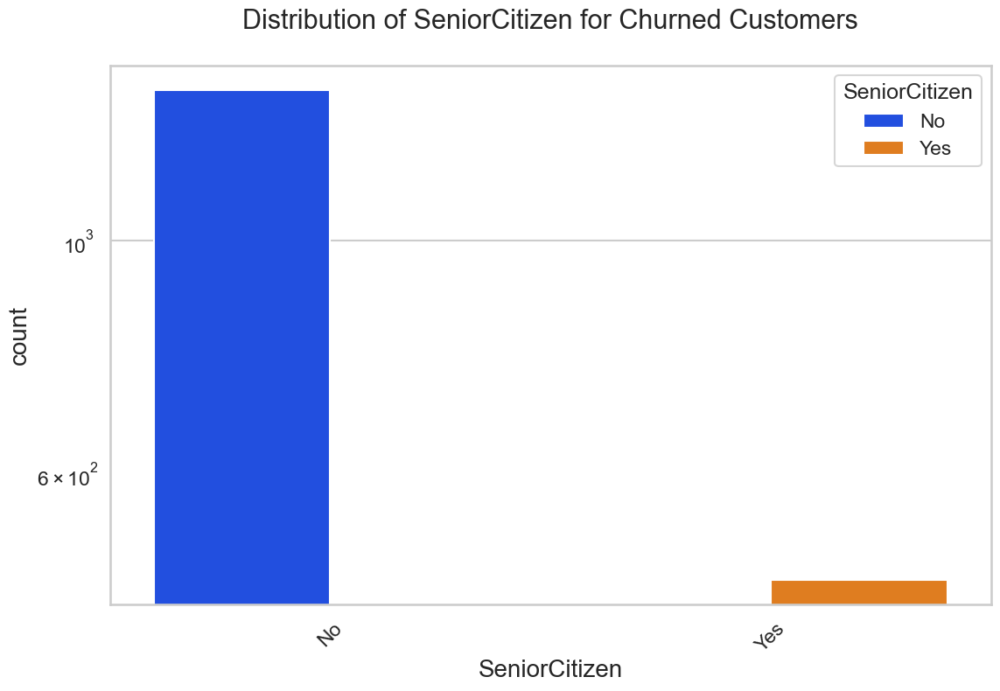

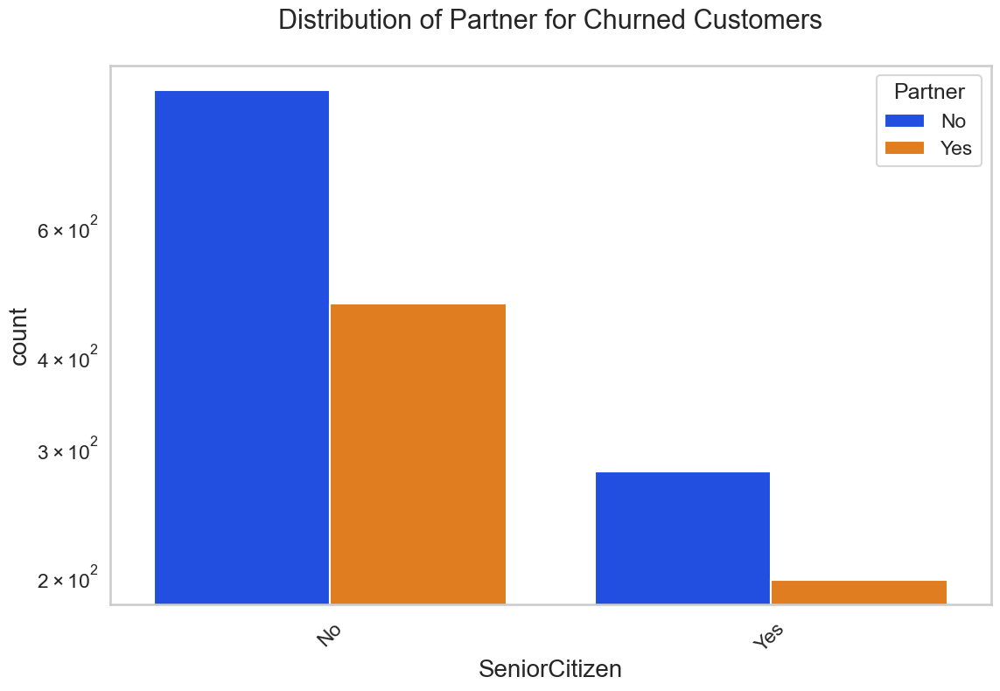

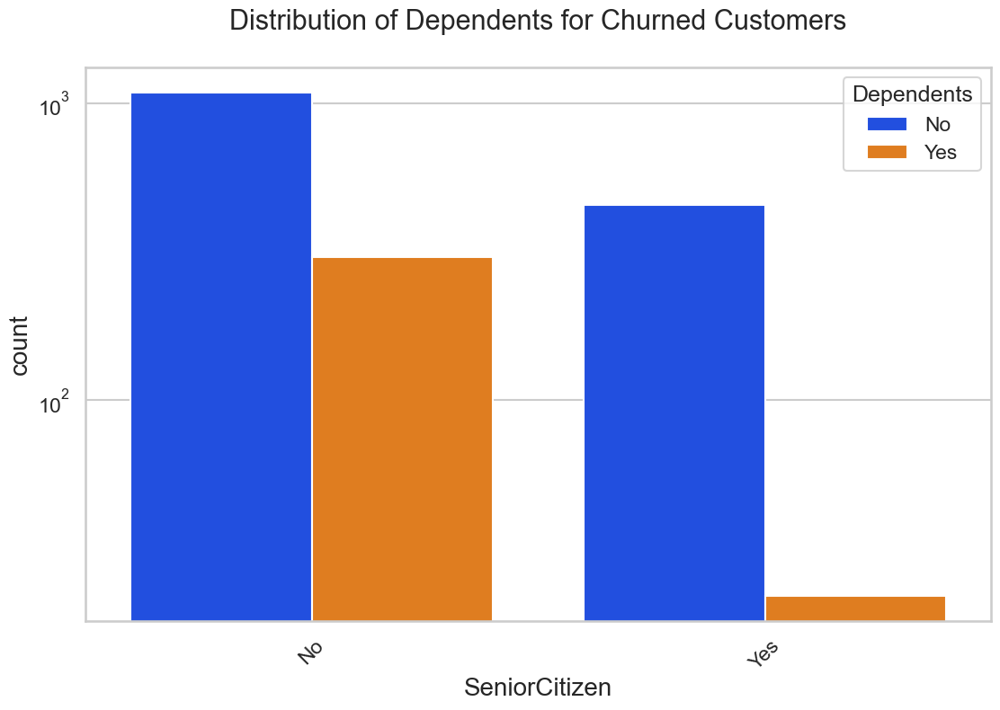

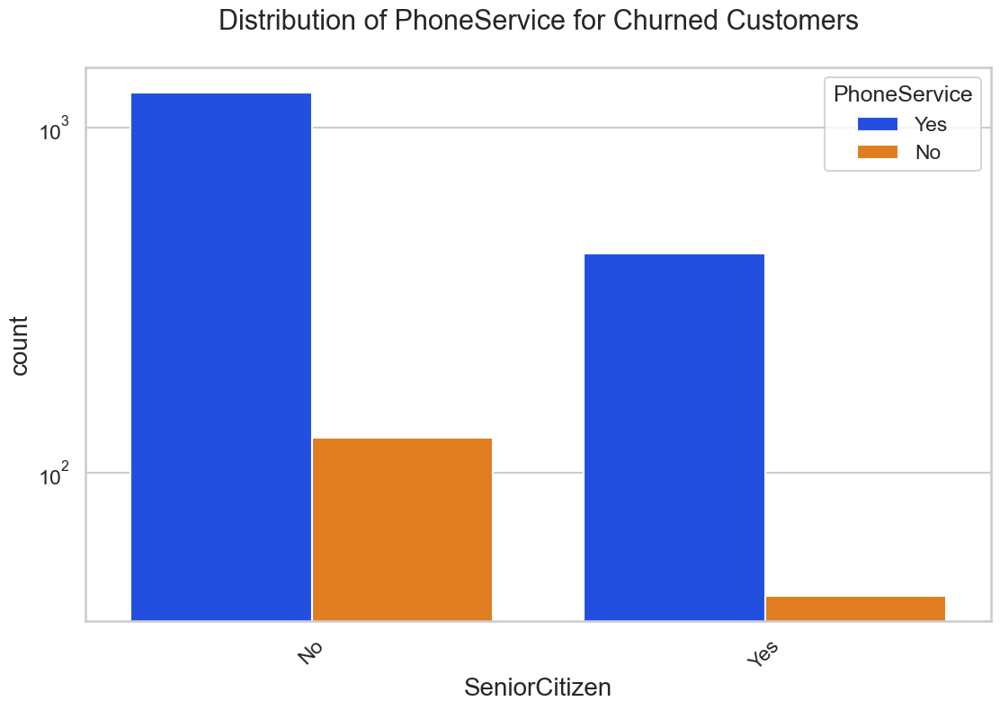

...

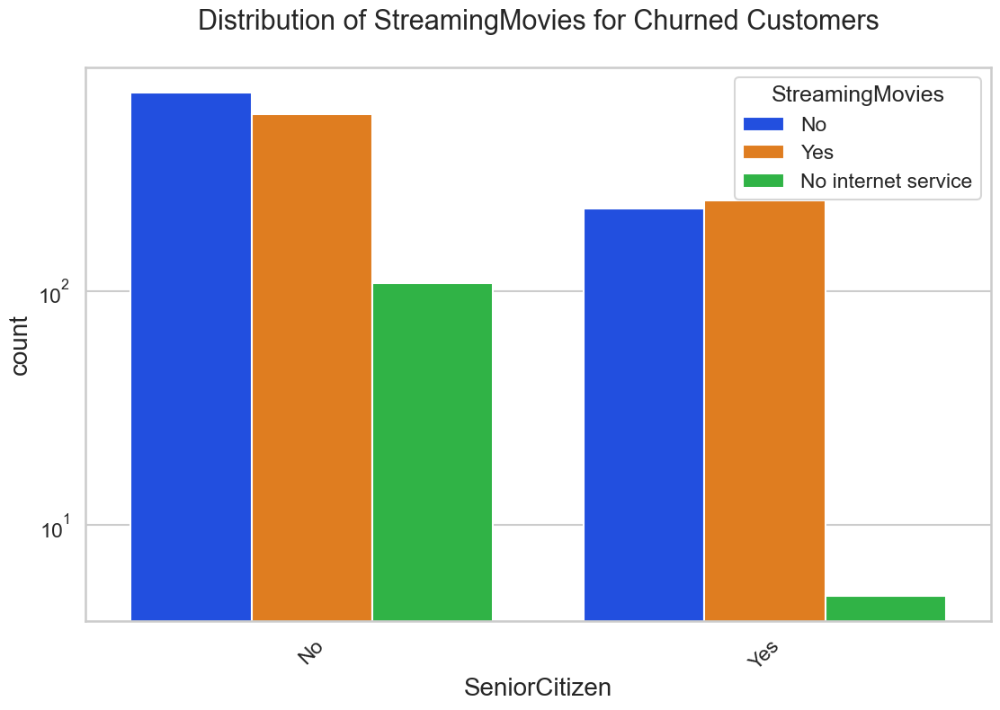

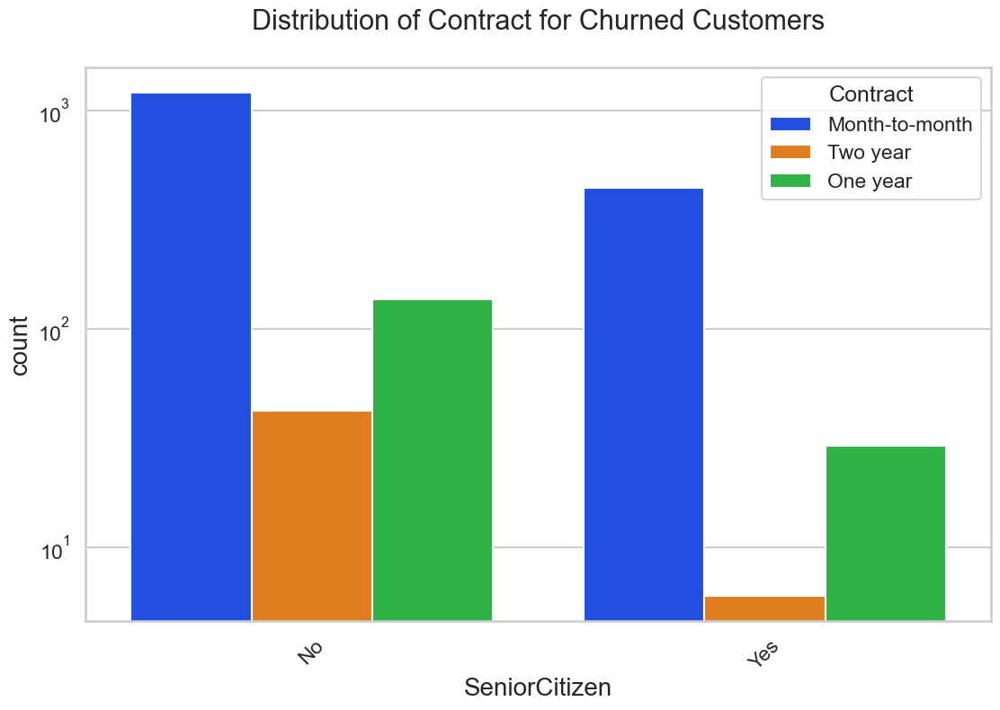

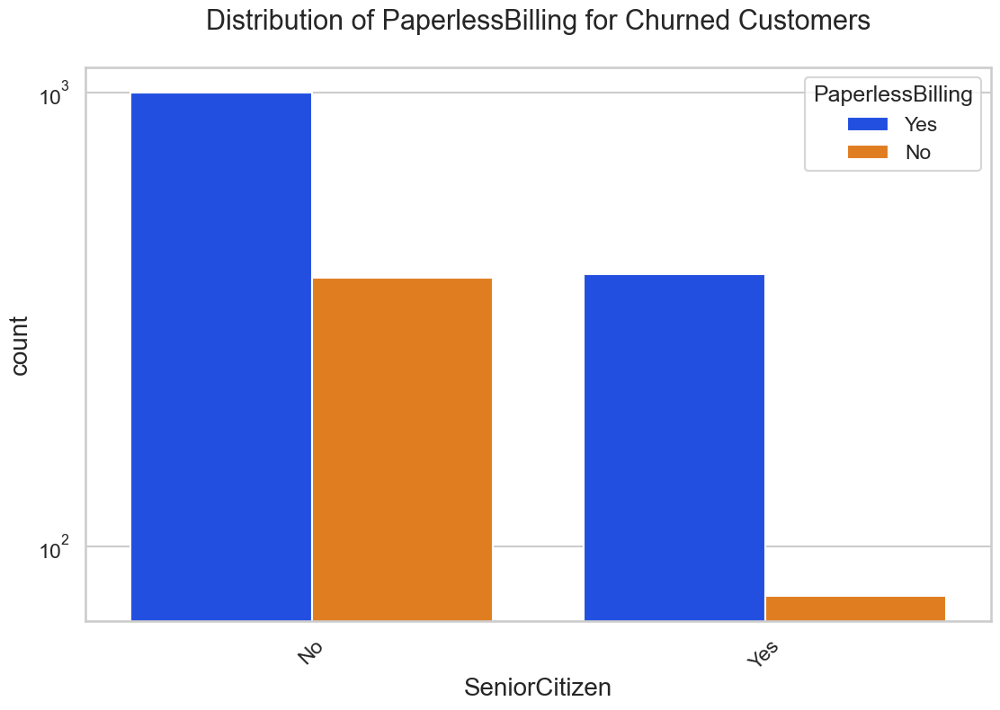

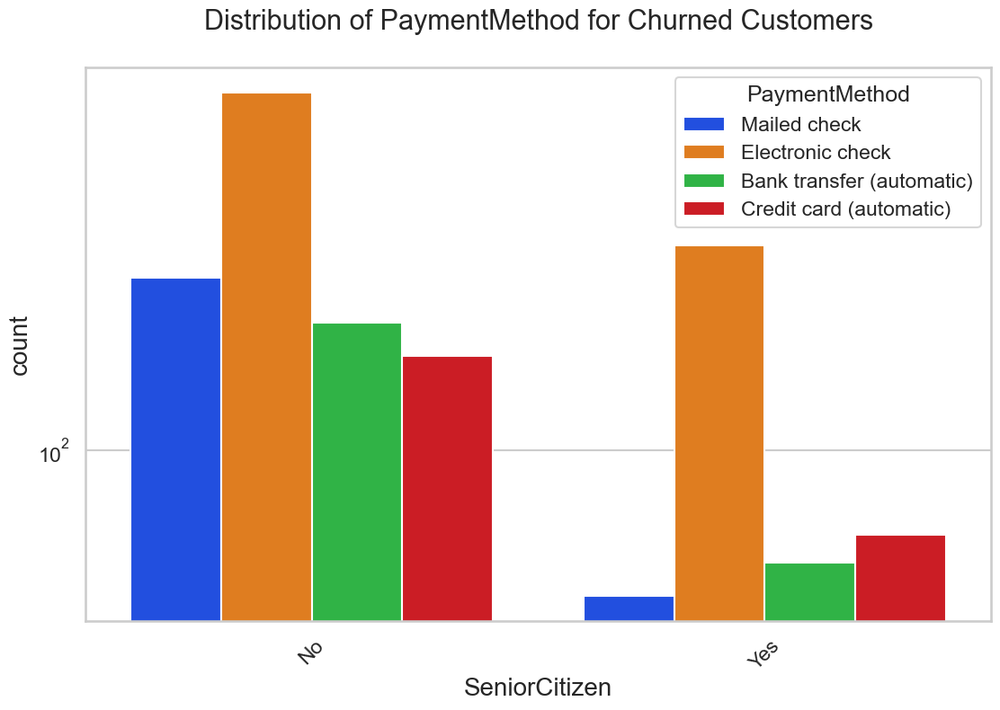

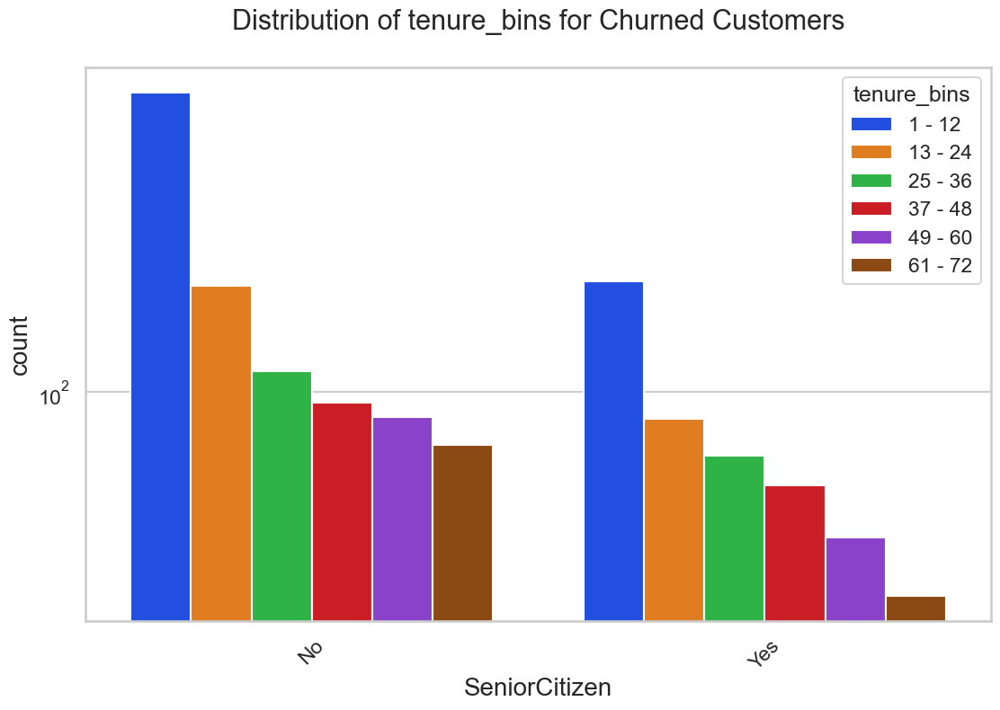

In [267]:
for col in colns:    
    uniplot(target_1,col='SeniorCitizen',title=f'Distribution of {col} for Churned Customers',hue=col)

Insights for Senior Citizens:
- no senior and senior females more likely to churn
- no senior and senior with no partner more likely to churn
- no senior and senior with no dependent more likely to churn
- no senior and senior with phone service more likely to churn
- no senior with no multiple lines and senior with multiple lines more likely to churn
- ppl with fibre optic more likely to churn regardless of age
- ppl with no online security more likely to churn regardless of age
- ppl with no online backup more likely to churn regardless of age
- ppl with no device protection more likely to churn regardless of age
- ppl with no tech support more likely to churn regardless of age
- non senior with no streaming tv more likely but senior with no streaming tv slightly likely to churn
- non senior with no streaming movies more likely but senior with streaming movies more likely to churn
- ppl with month to month contract more likely to churn regardless of age
- ppl with paperless billing reagrdless of age more likely to churn
- ppl with e-check more likely to churn regardless of age
- ppl in tenure 1-12 months regardless of age more likely to churn

***non senior and senior are almost equally likely to churn***

Partner

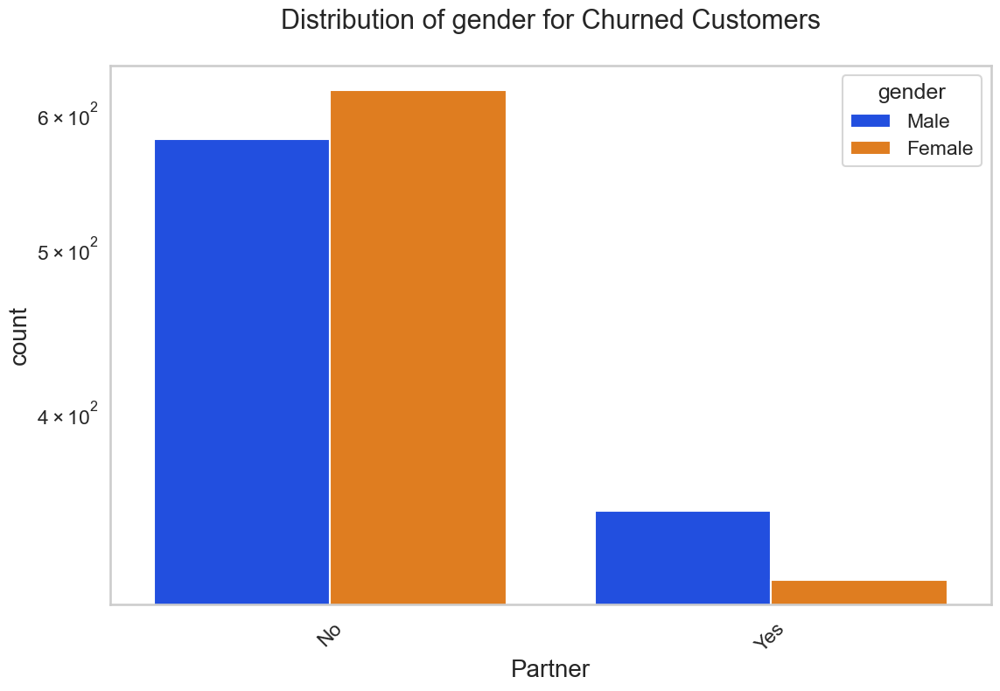

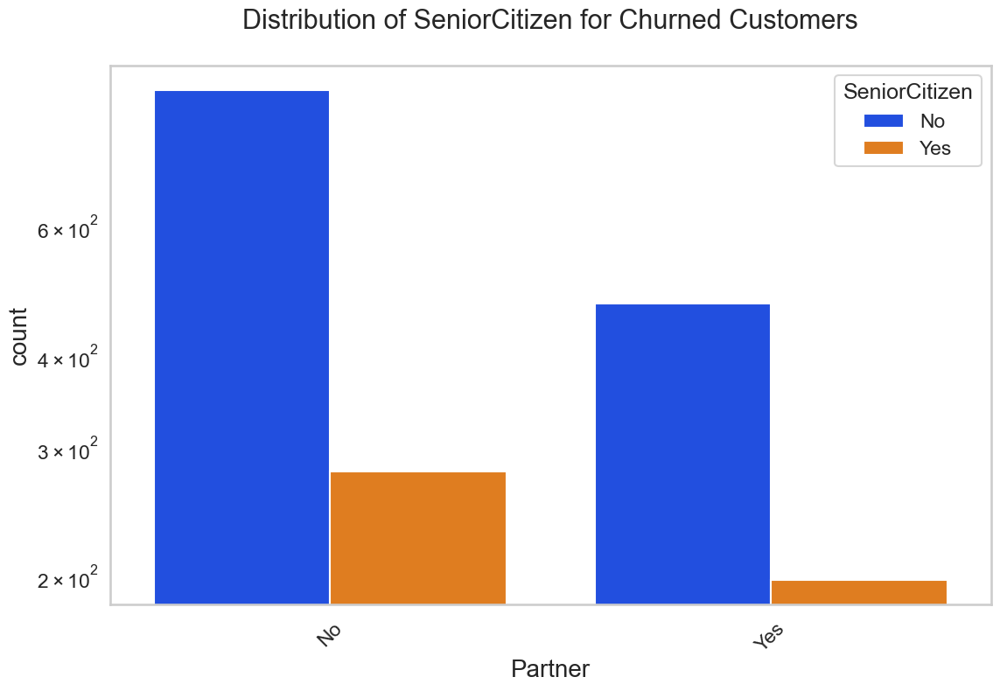

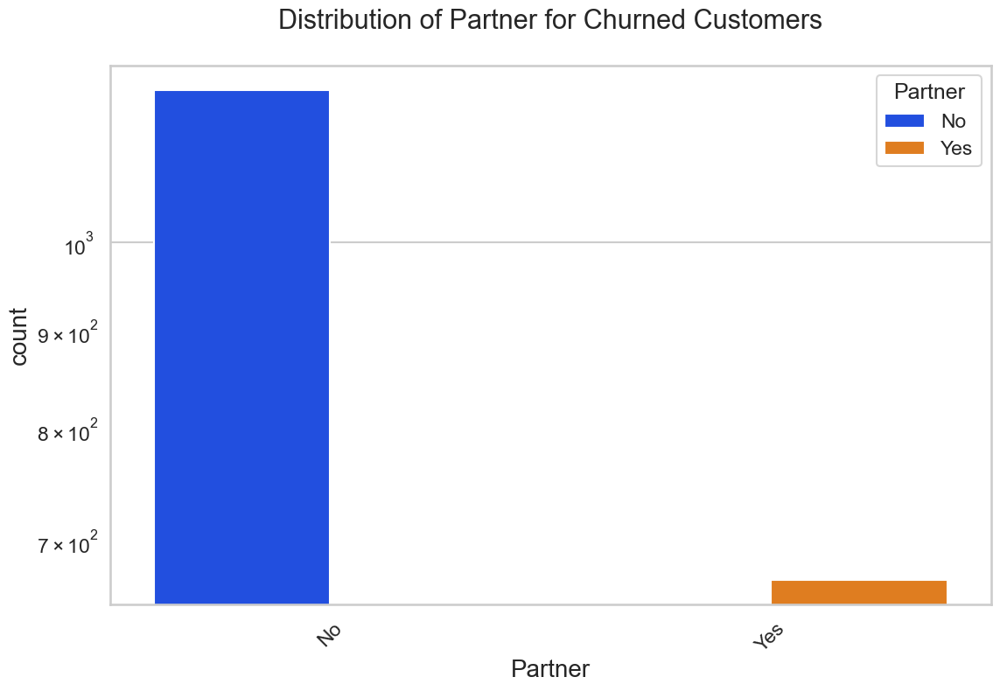

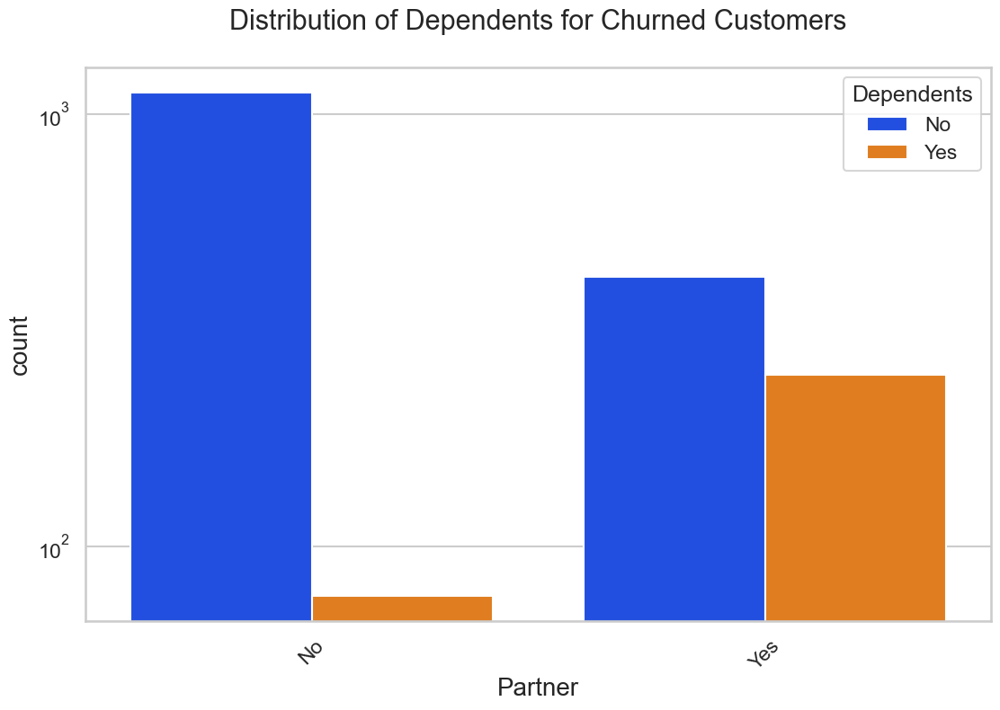

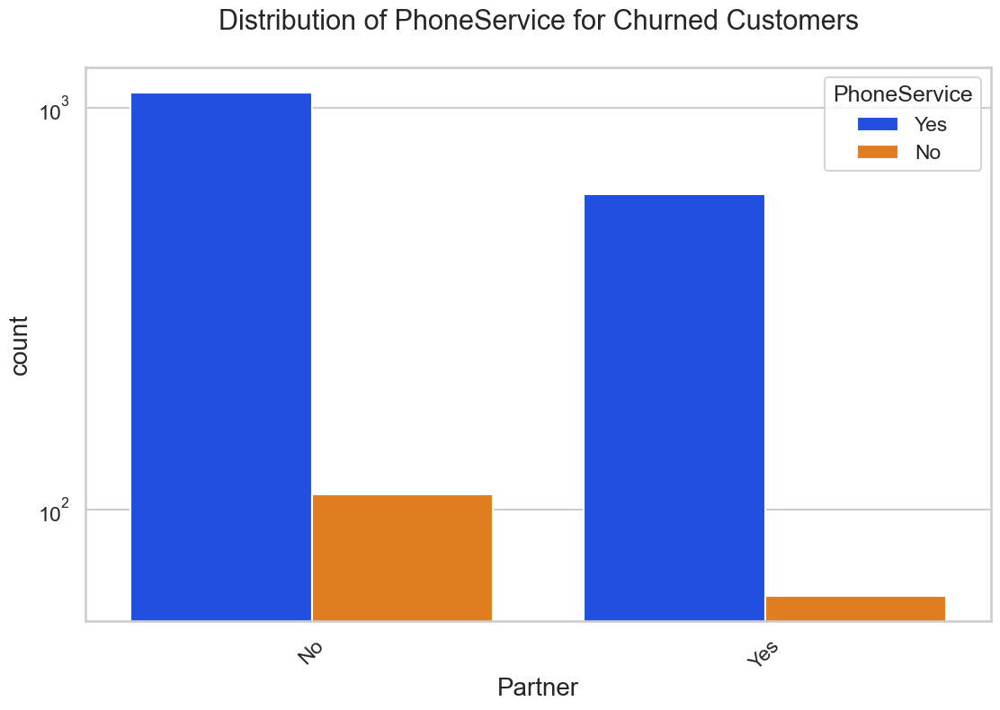

...

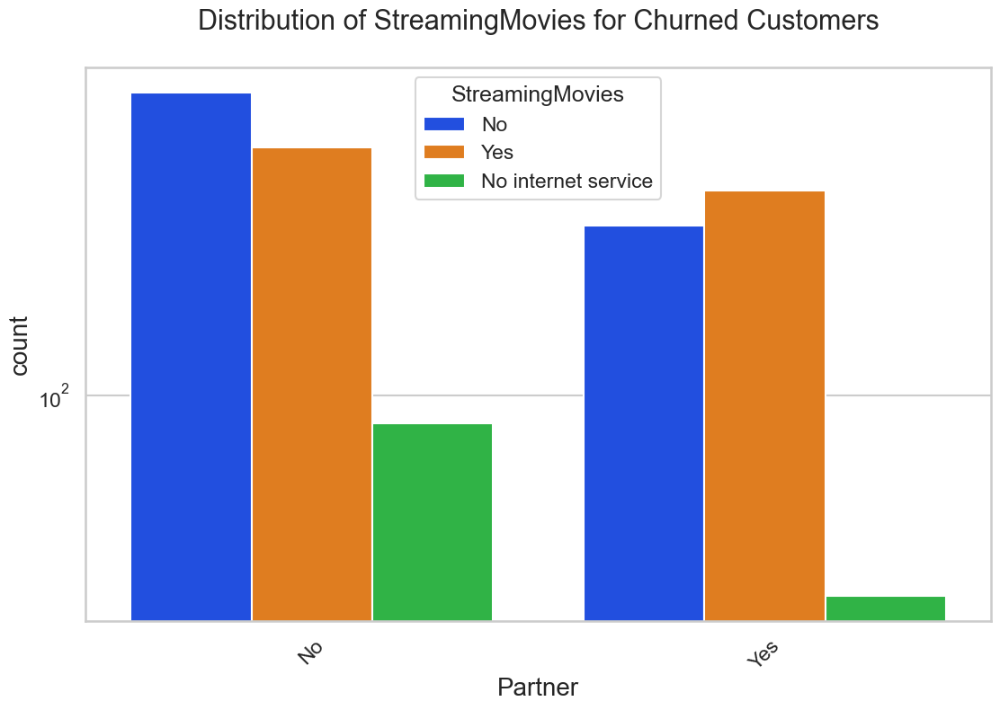

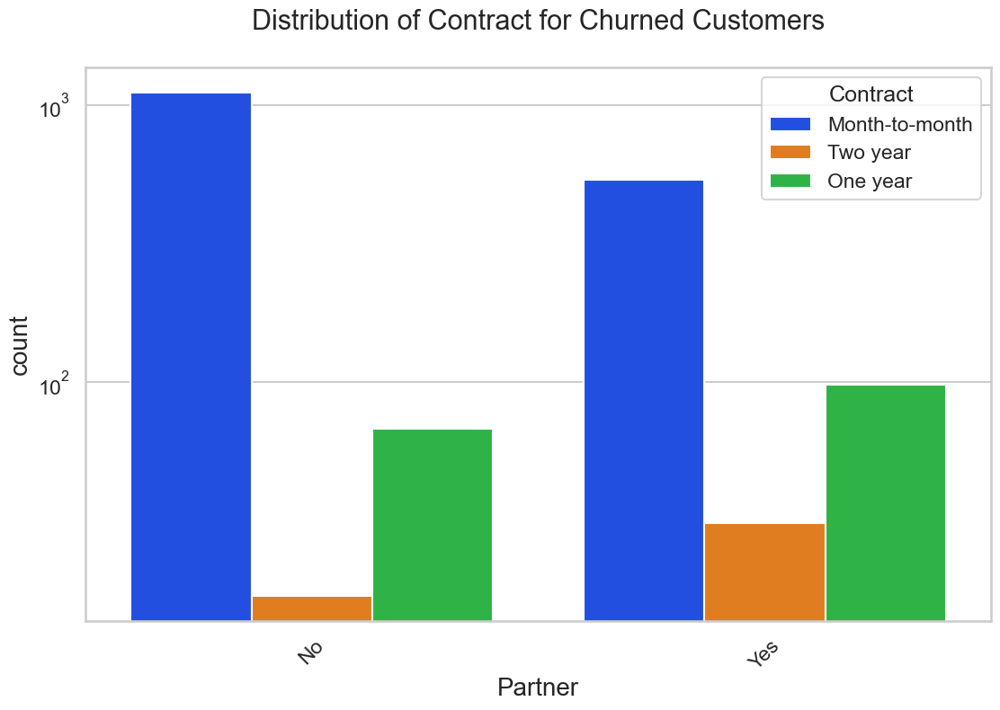

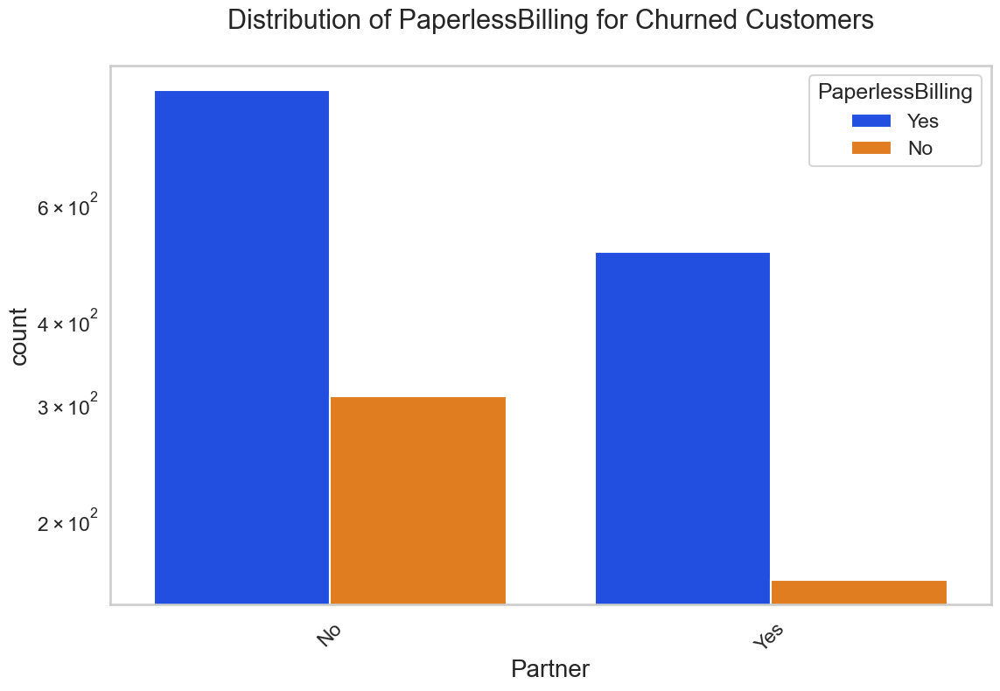

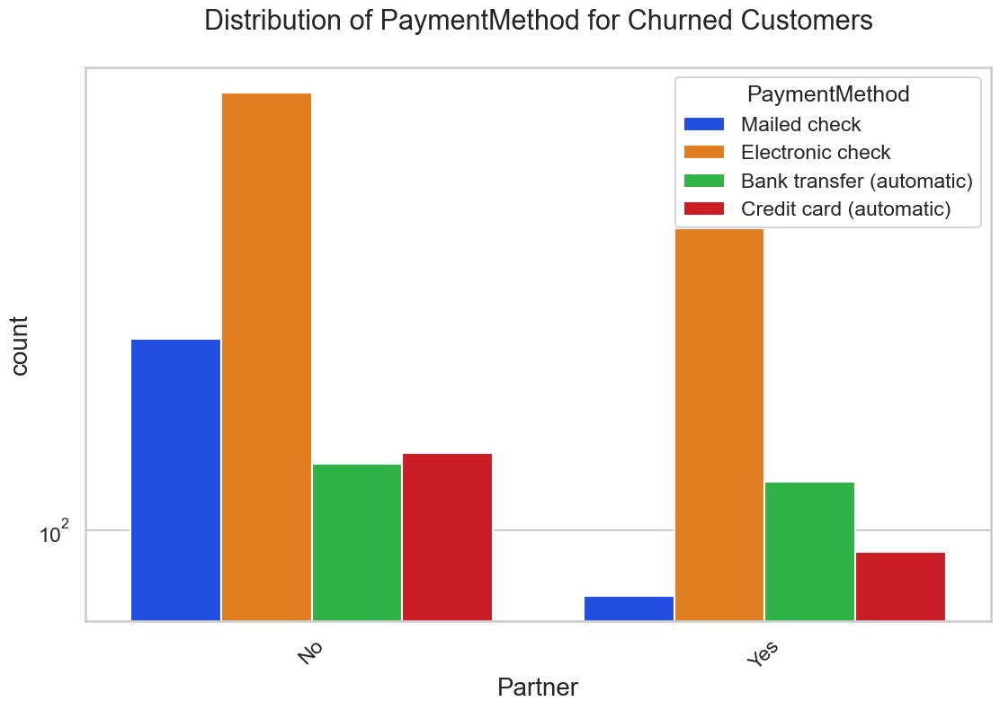

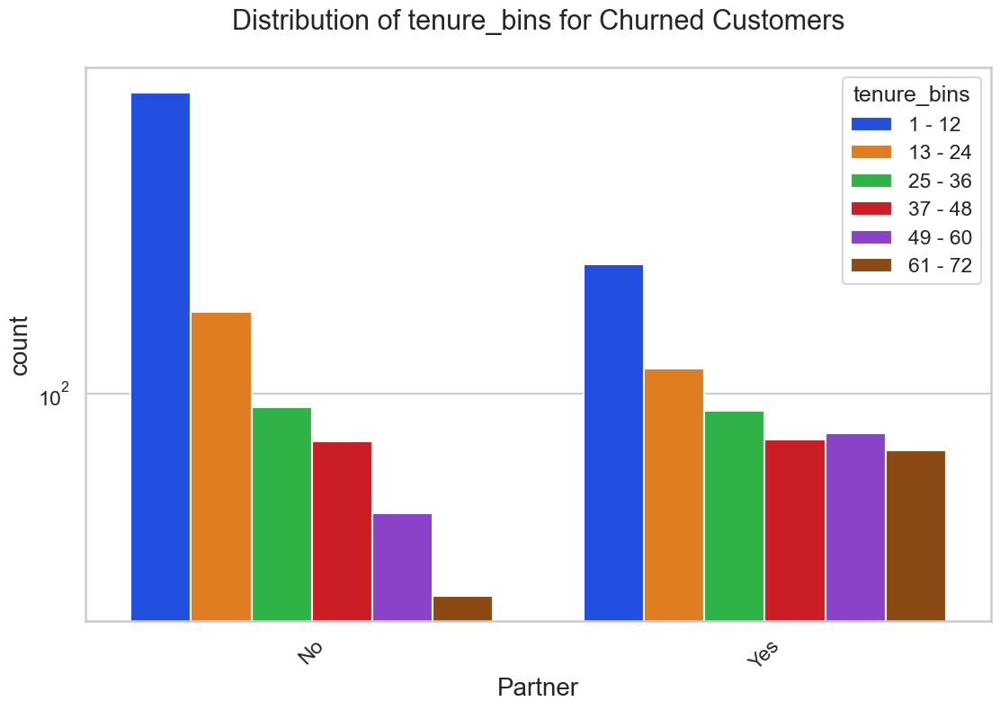

In [265]:
for col in colns:    
    uniplot(target_1,col='Partner',title=f'Distribution of {col} for Churned Customers',hue=col)

Insights when compared with Partner as X-axis:
- Female with no partner more likely to churn
- non senior citizen with no partner more likely to churn
- ppl with no partner and no dependent more likely to churn
- ppl regardless of partner and no phone service more likely to churn
- ppl with no partners and no multiple lines more likely to churn
- ppl regardless of partner and fibre optics more likely to churn
- ppl regardless of partner and no online security more likely to churn
- ppl regardless of partner and no online backup more likely to churn
- ppl regardless of partner and no device protection more likely to churn
- ppl regardless of partner and no tech support more likely to churn
- ppl with no partner and no streaming tv more likely to churn
- ppl with no partner and no streaming movies more likely to churn
- ppl regardless of partner and month to month contract more likely to churn
- ppl regardless of partner and paperless billing more likely to churn
- ppl regardless of partner and electronic check more likely to churn
- ppl regardless of partner in 1-12 months tenure more likely to churn

***In general people without partners are more likely to churn***

Dependents

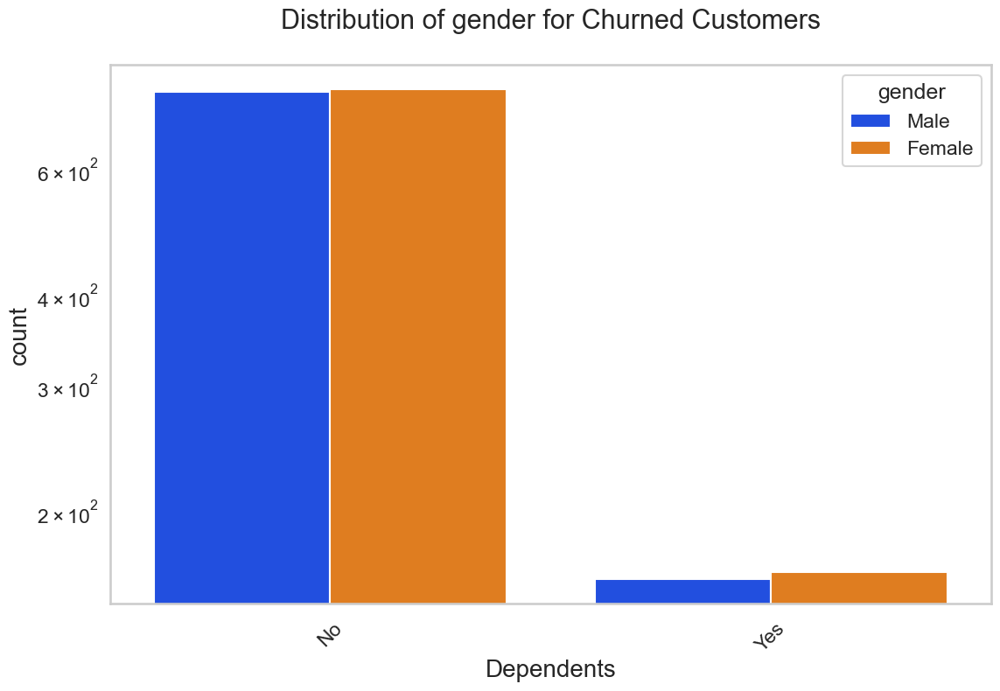

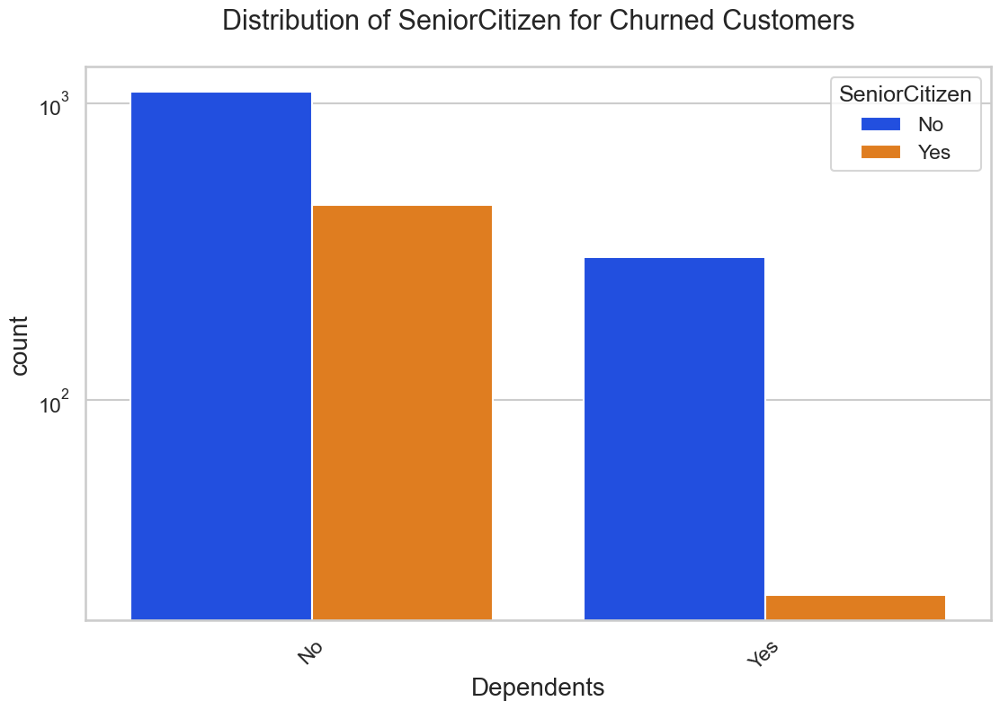

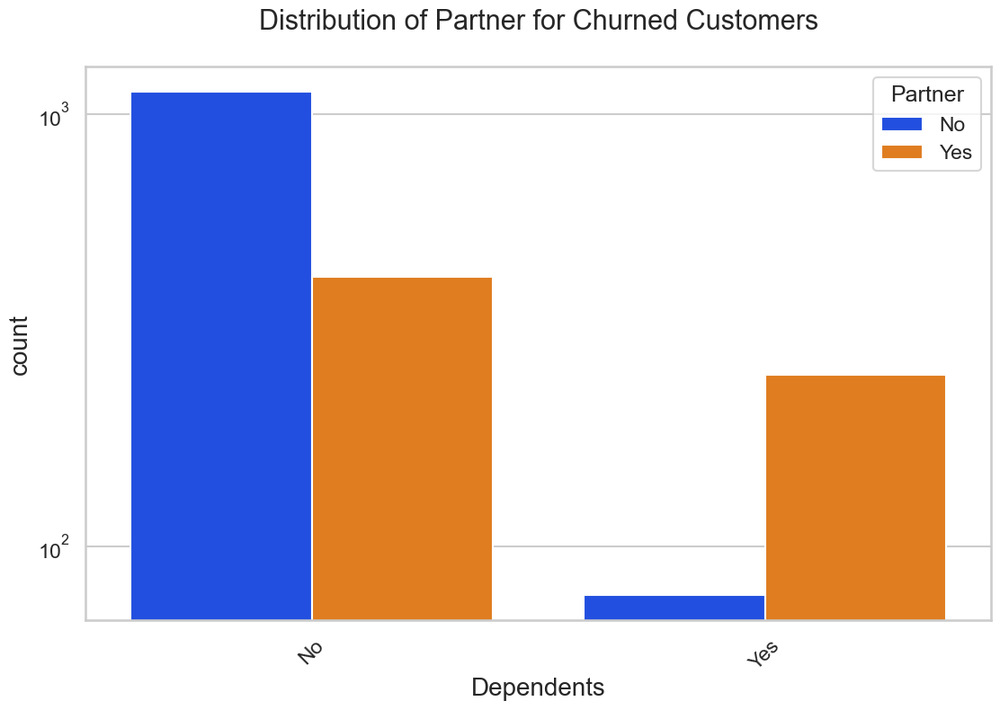

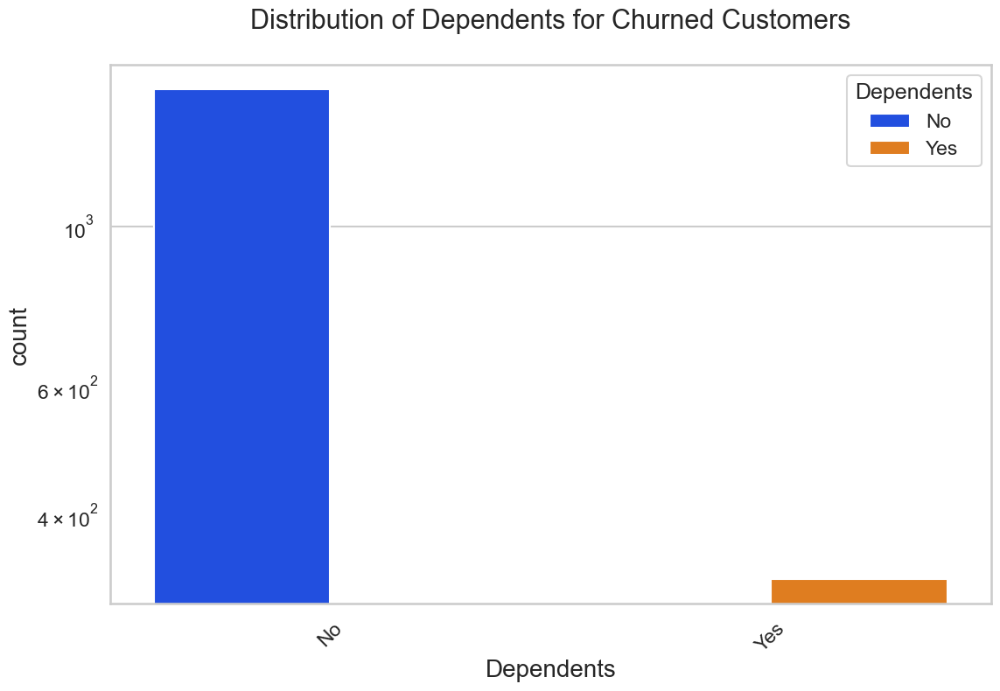

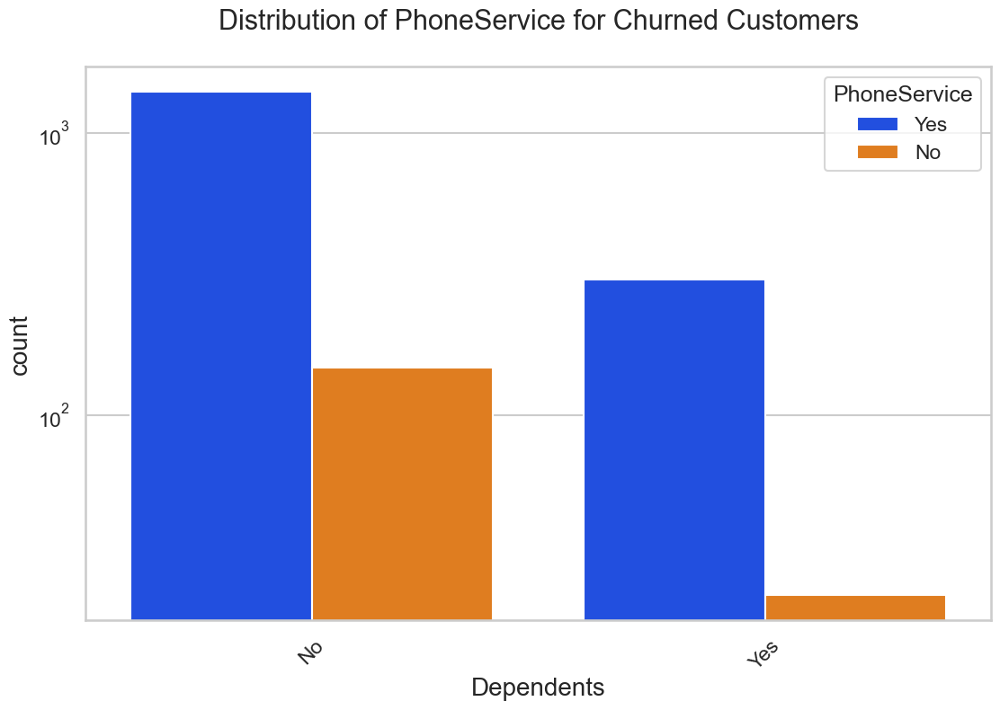

...

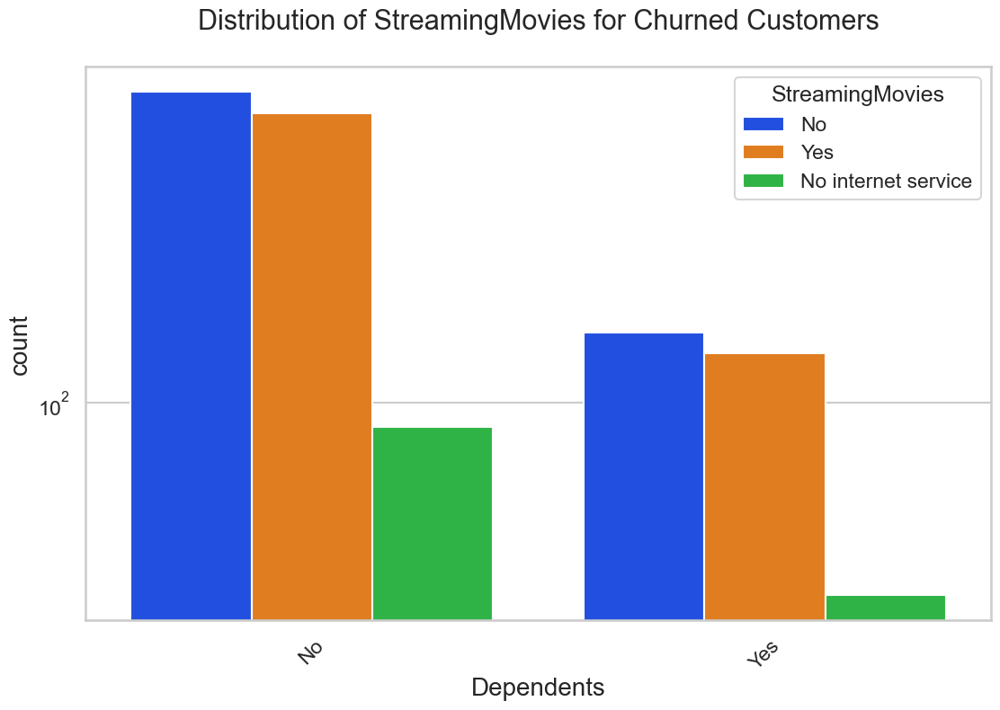

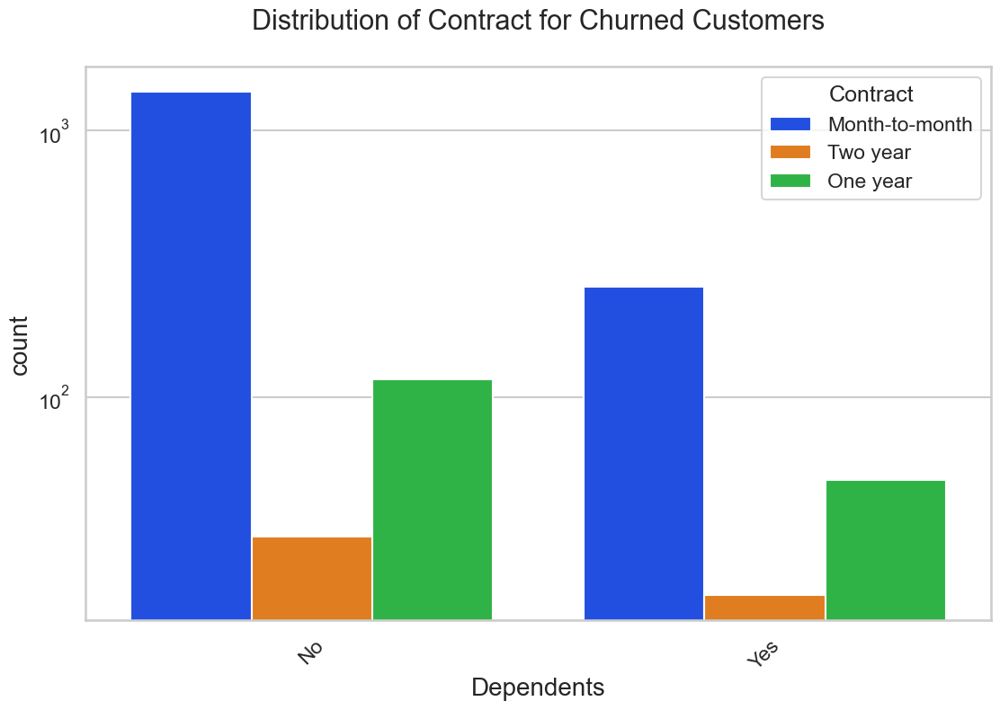

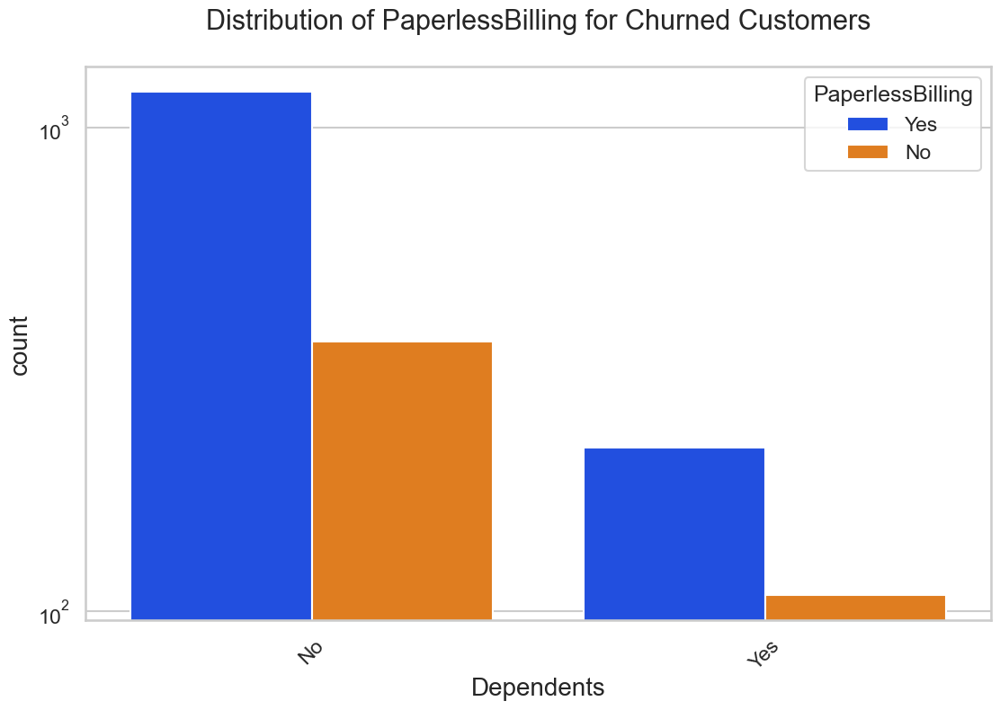

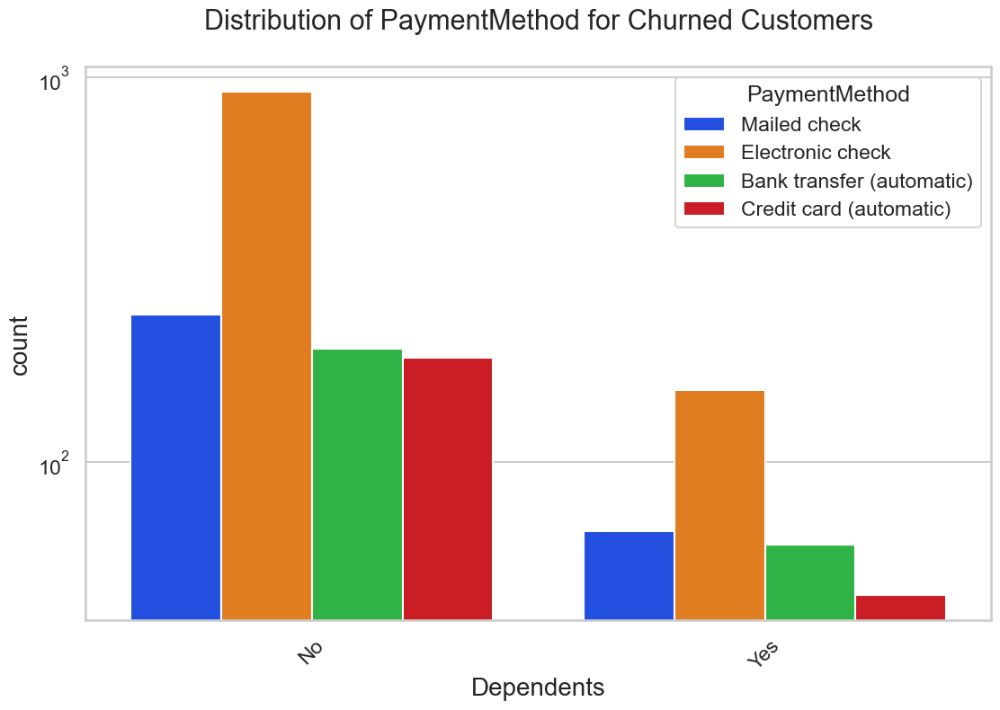

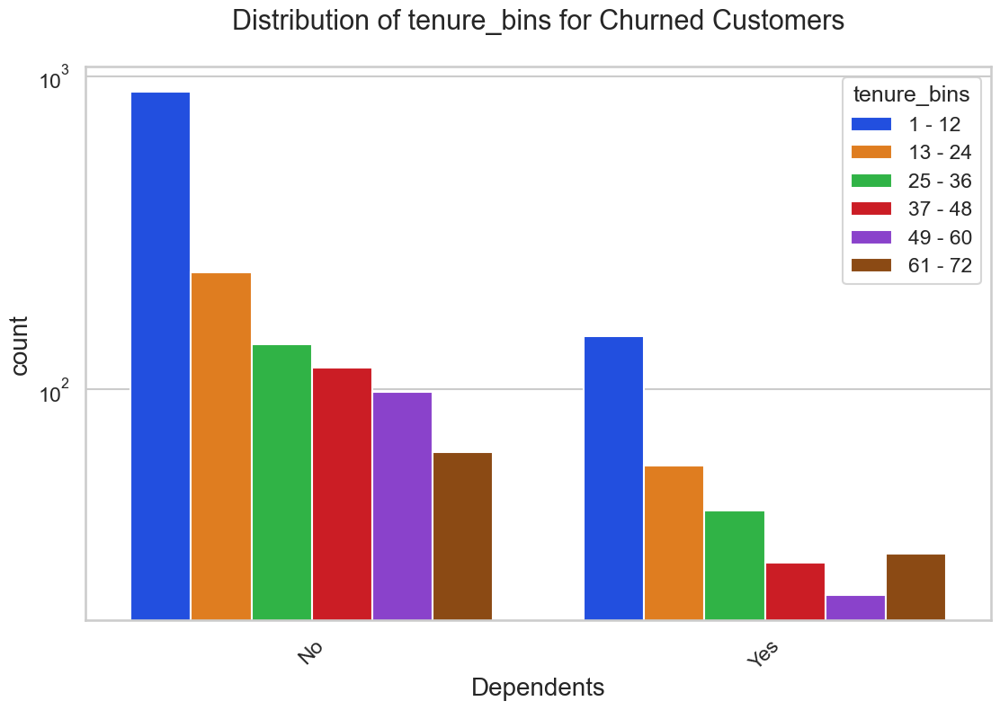

In [268]:
for col in colns:    
    uniplot(target_1,col='Dependents',title=f'Distribution of {col} for Churned Customers',hue=col)

Insights from Dependents:
- ppl with no dependents and no partners more likely to churn but there is also a large section of ppl with dependents and partners that are likely to churn (search deeper with gender)
- ppl with no dependents and multiple lines and ppl with dependents and no multiple lines are more likely to churn
- ppl regardless of dependents but without streaming movies and tv are slightly more likely to churn than those with streaming services

Phone Service

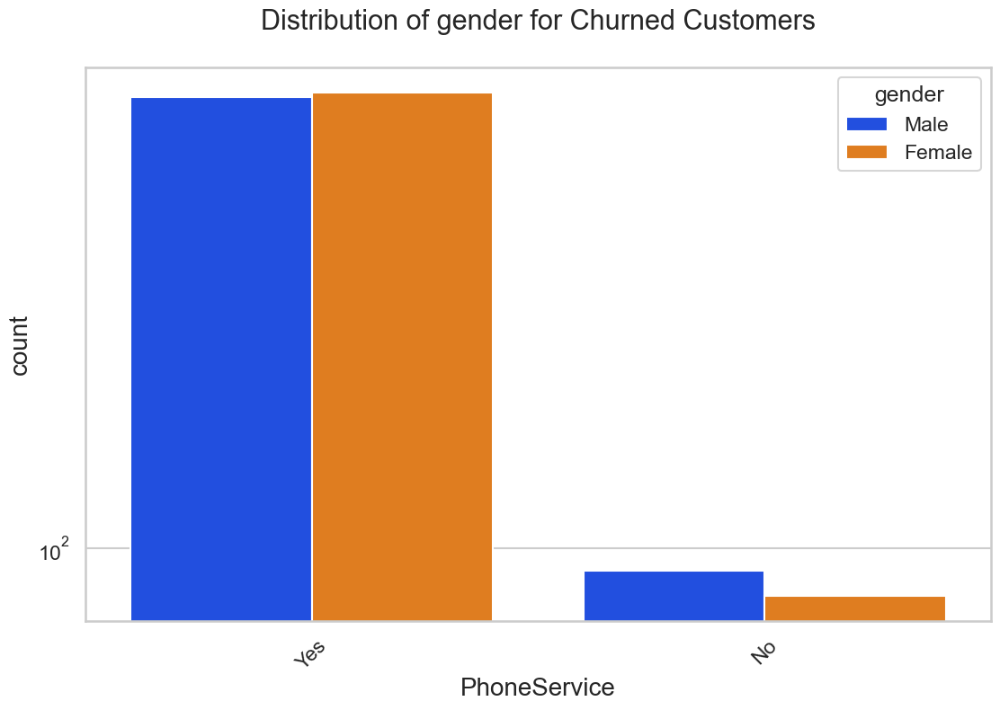

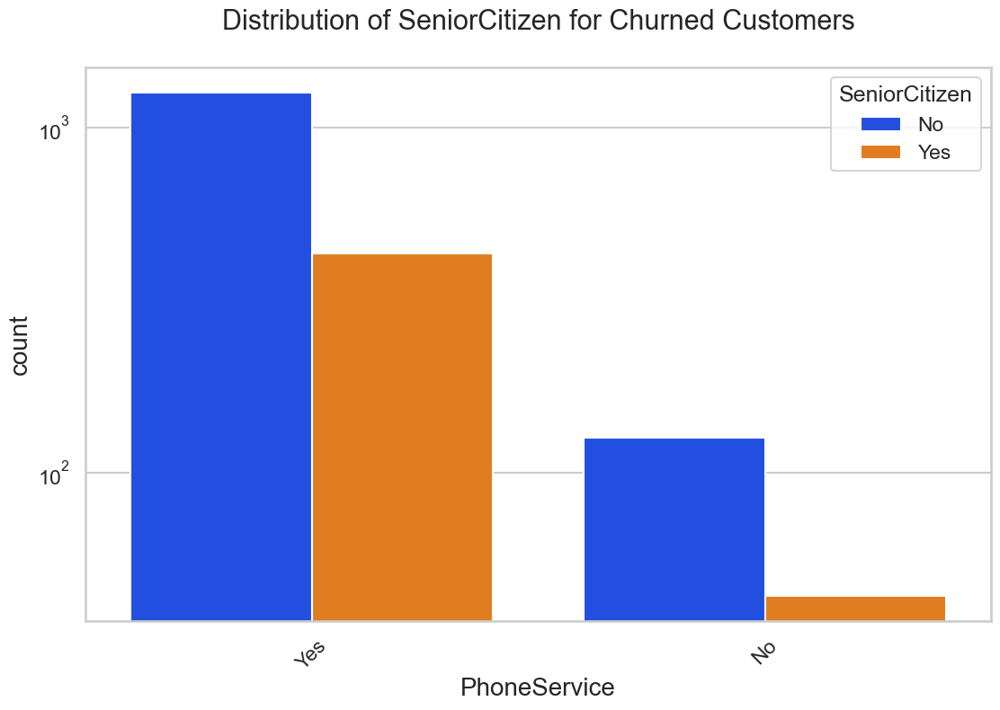

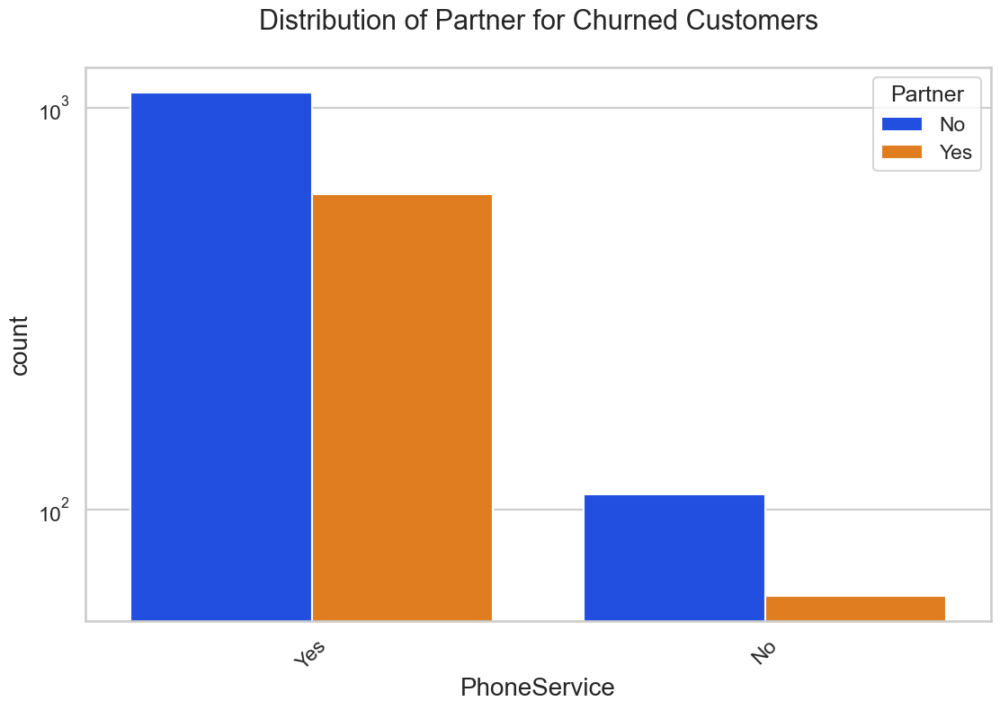

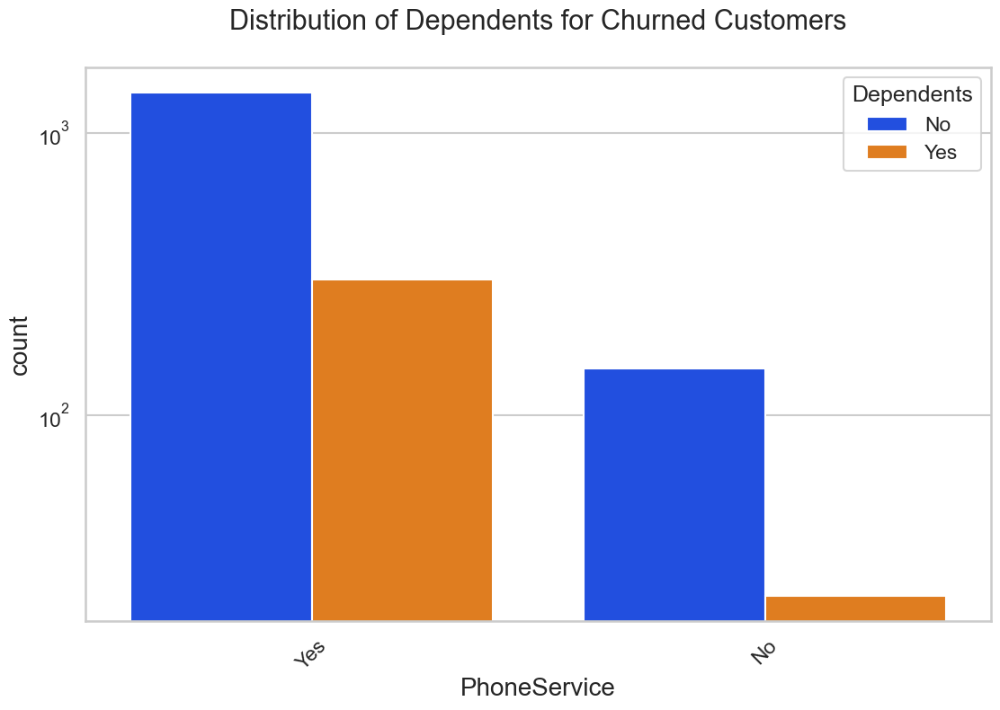

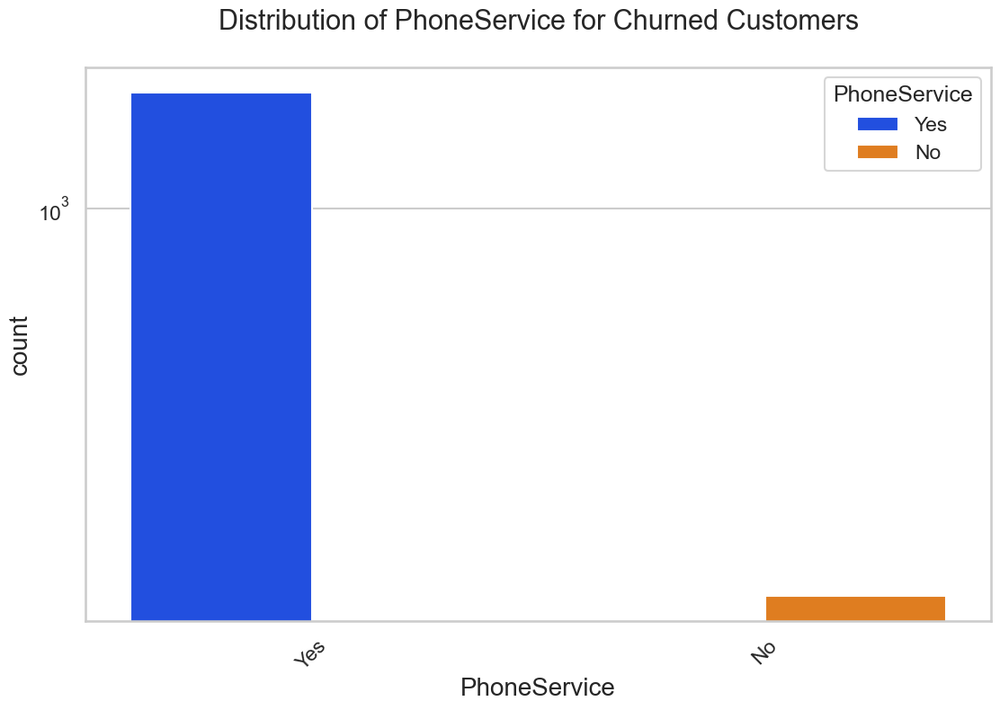

...

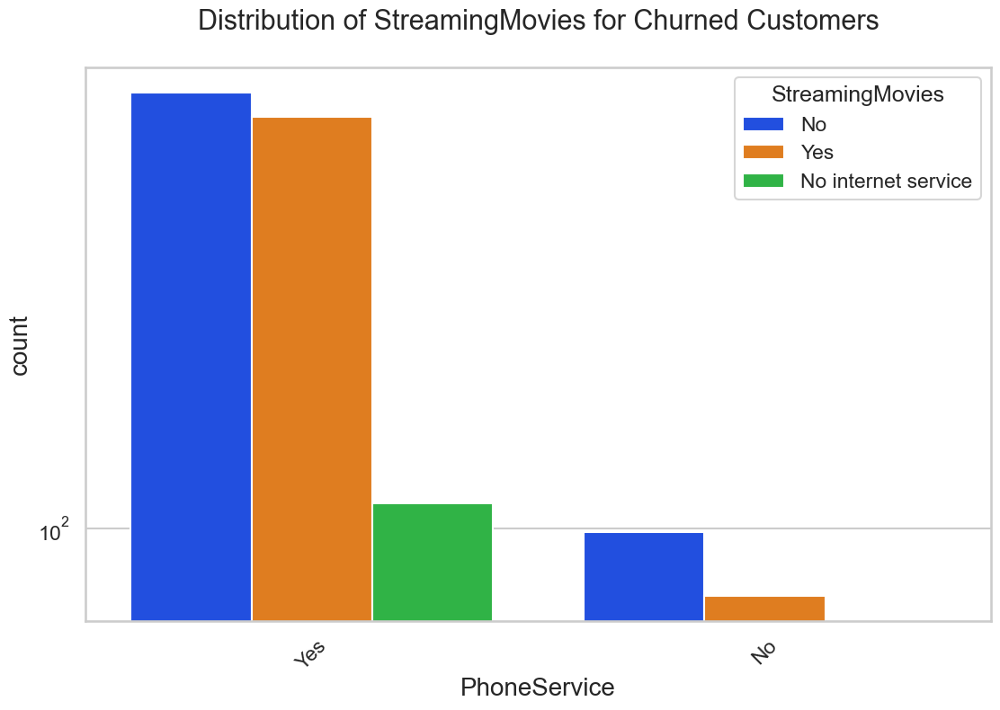

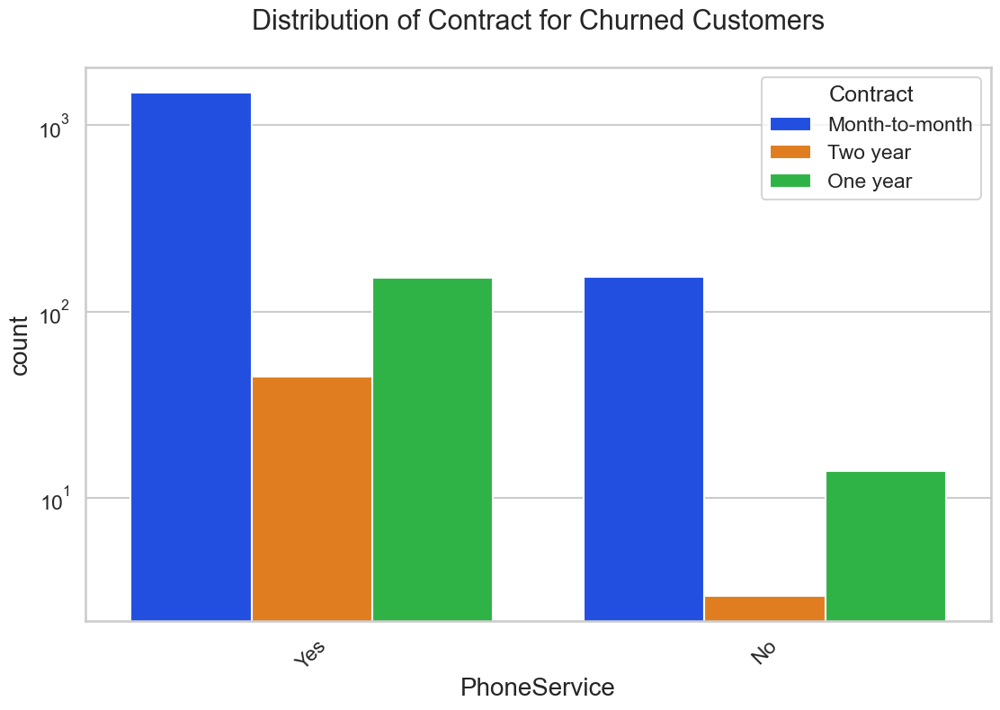

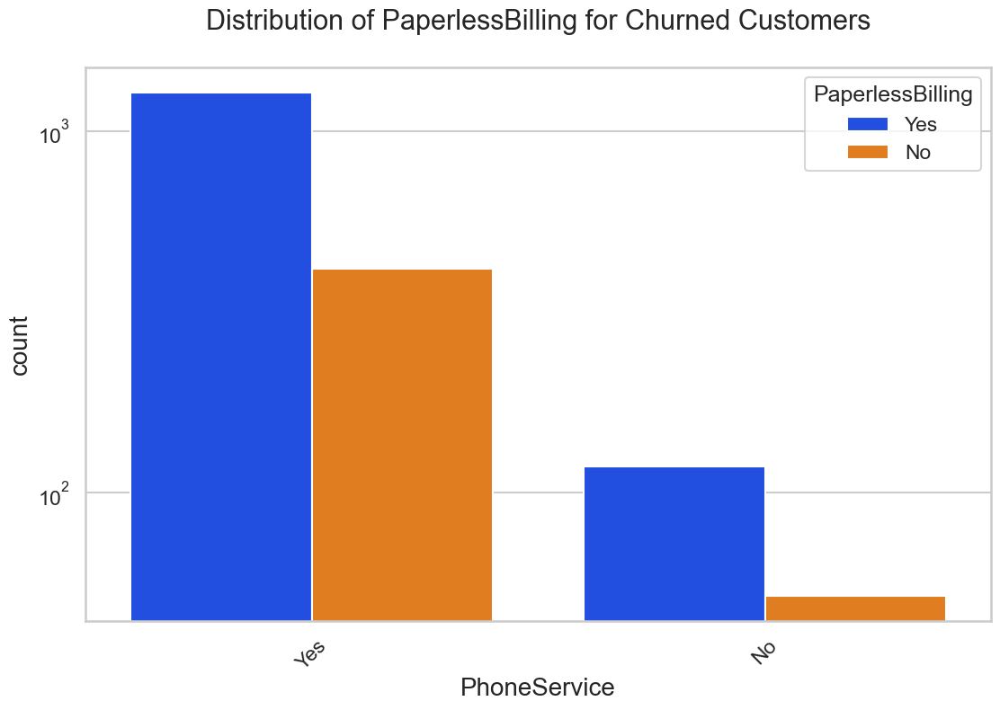

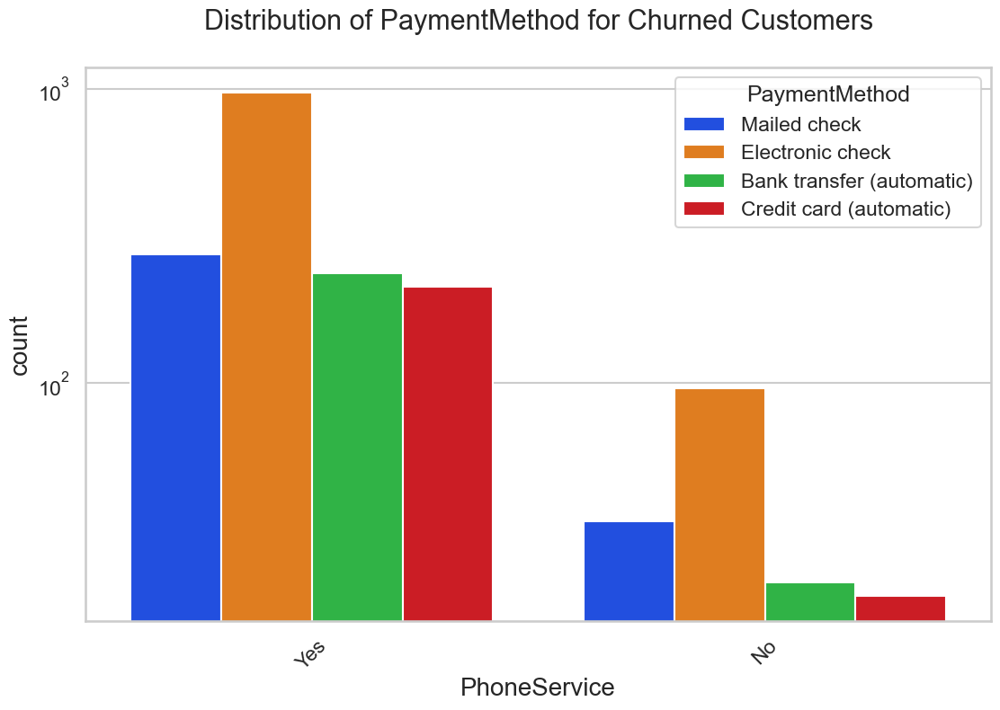

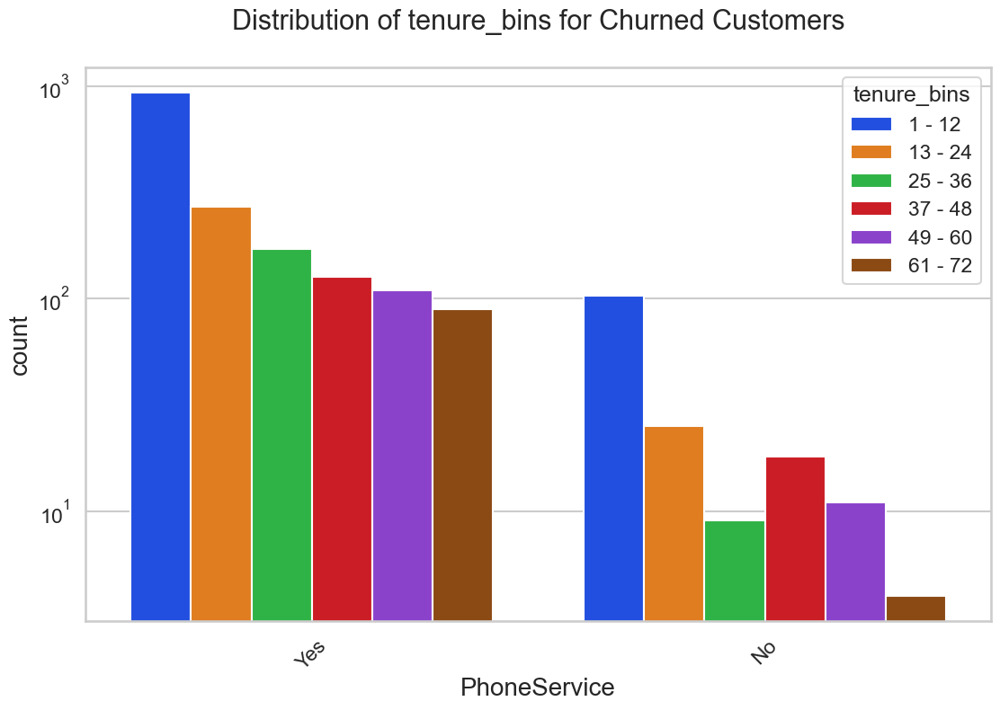

In [269]:
for col in colns:    
    uniplot(target_1,col='PhoneService',title=f'Distribution of {col} for Churned Customers',hue=col)

Insights for Phone Service:
- Females with phone service and males without phone service are more likely to churn
- ppl with phone service and with or without multiple lines are equally likely to churn
- ppl with a monthly contract without phone service are slightly more likely to leave when comapred to ppl with phone service and 1 yr contract 

Multiple Lines

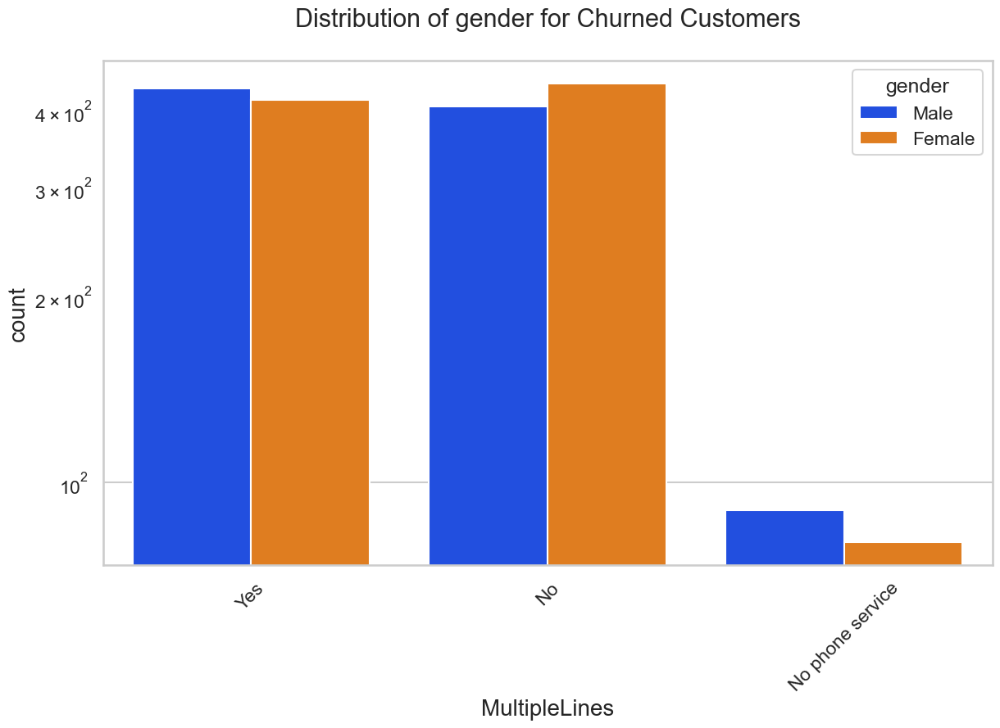

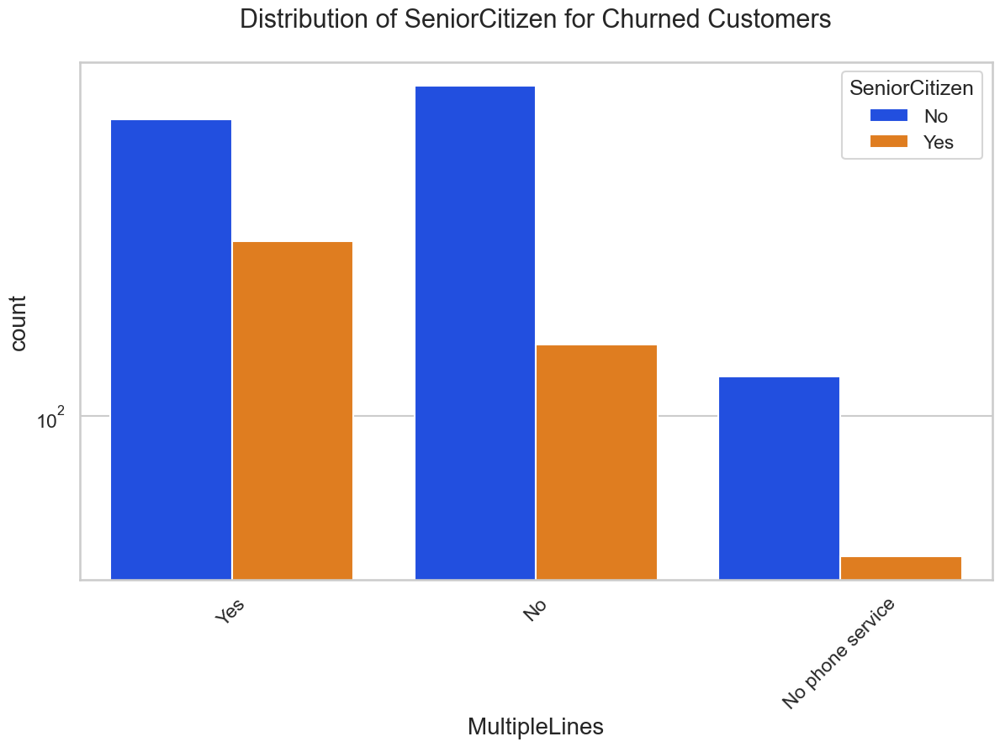

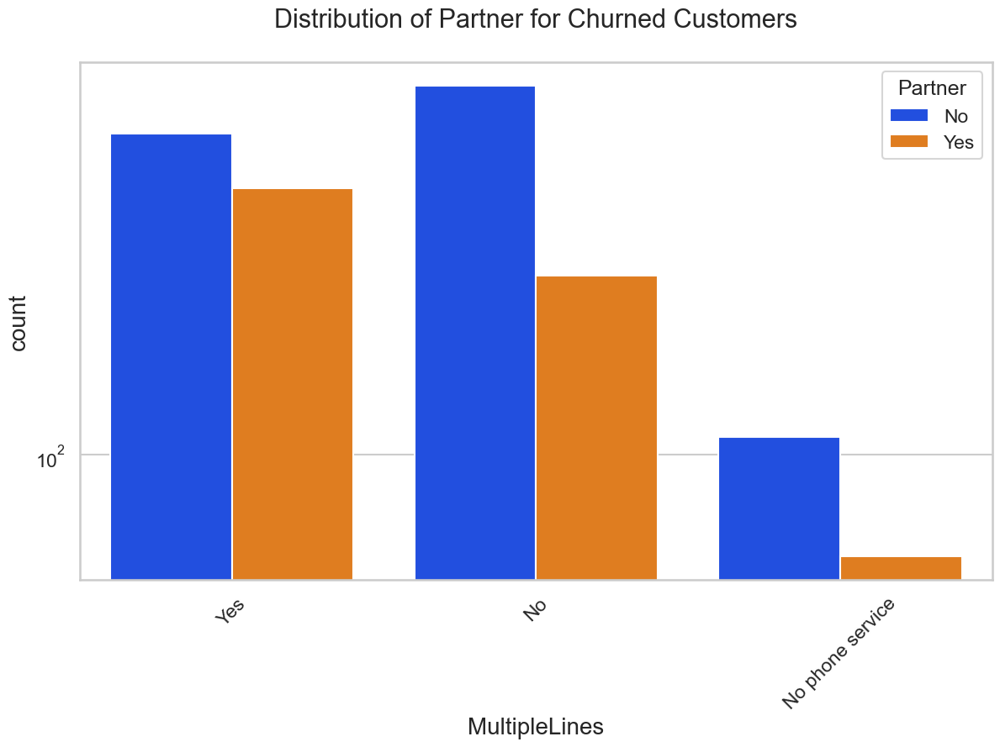

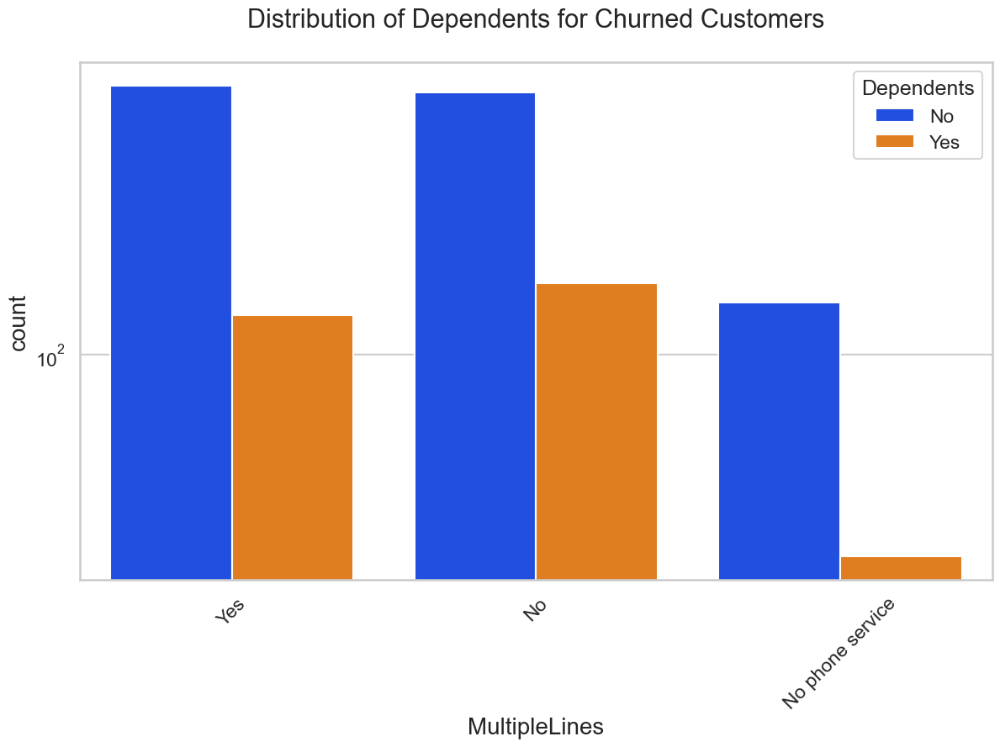

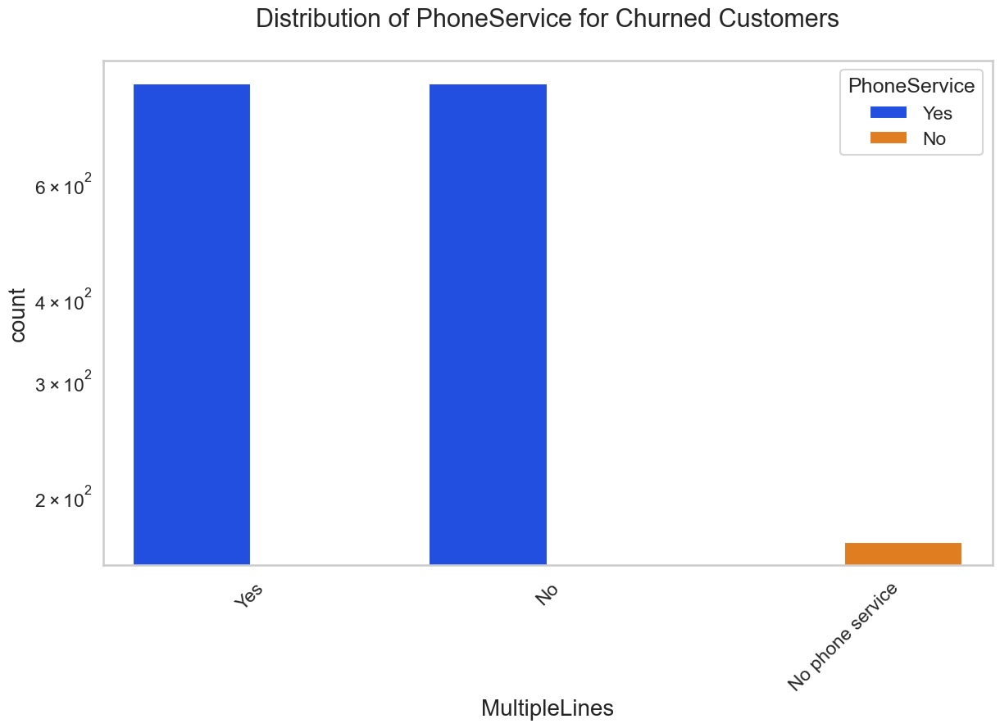

...

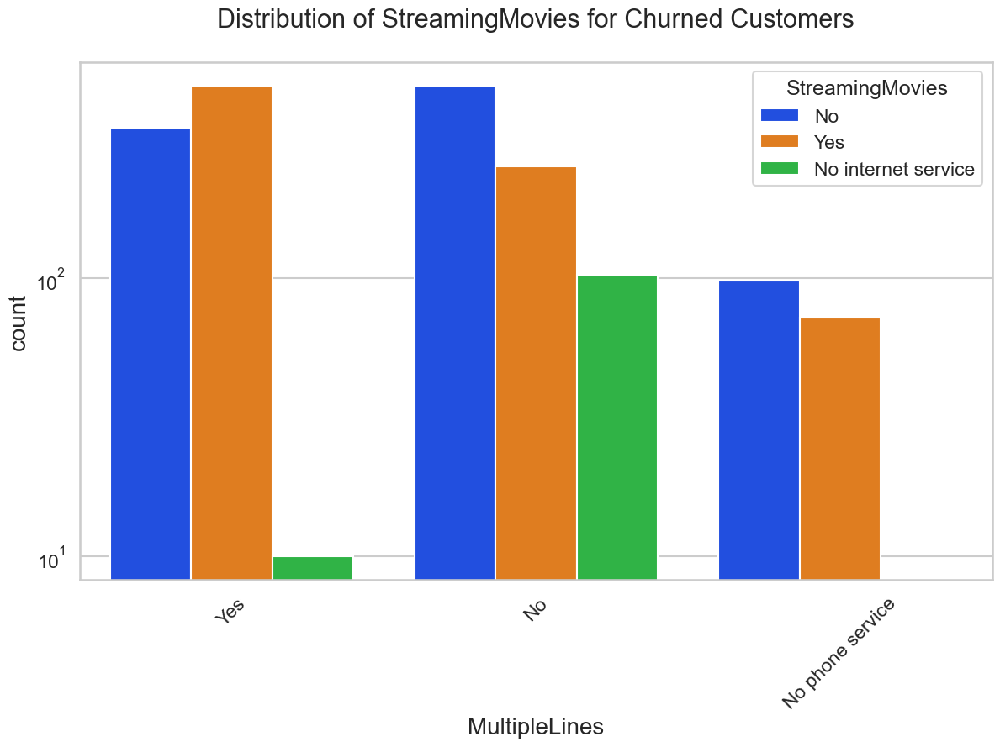

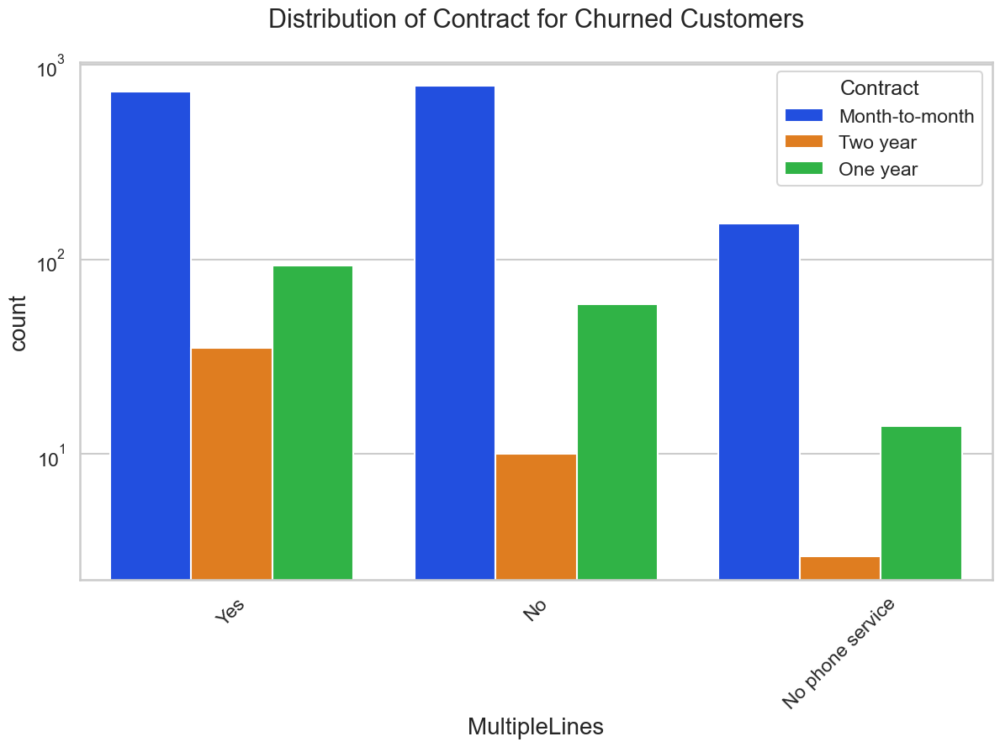

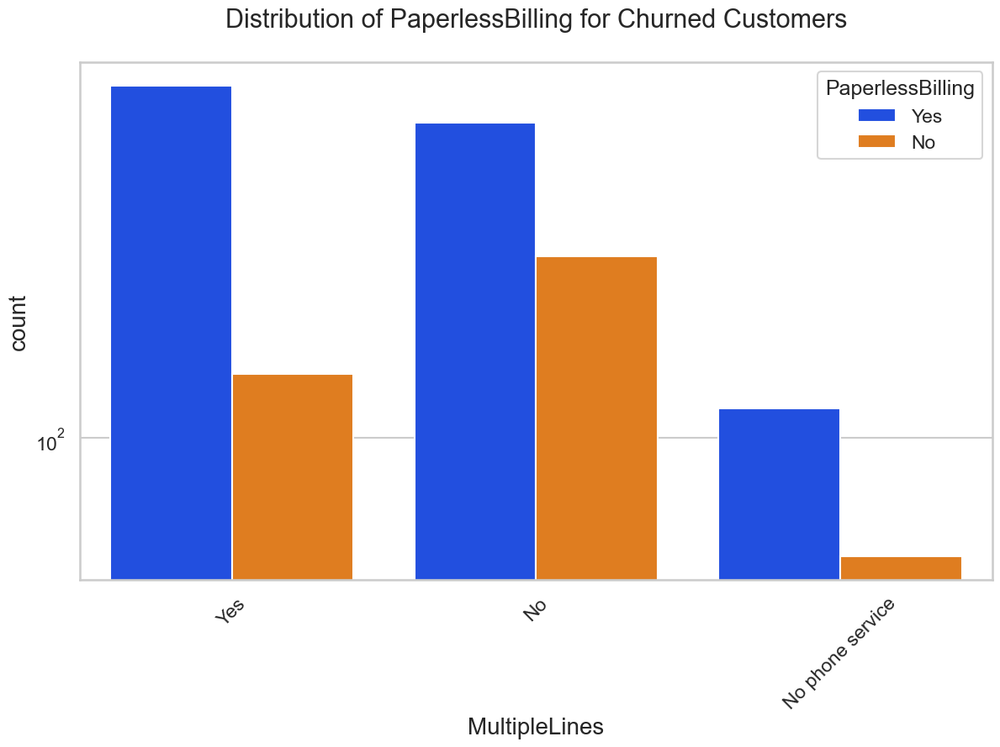

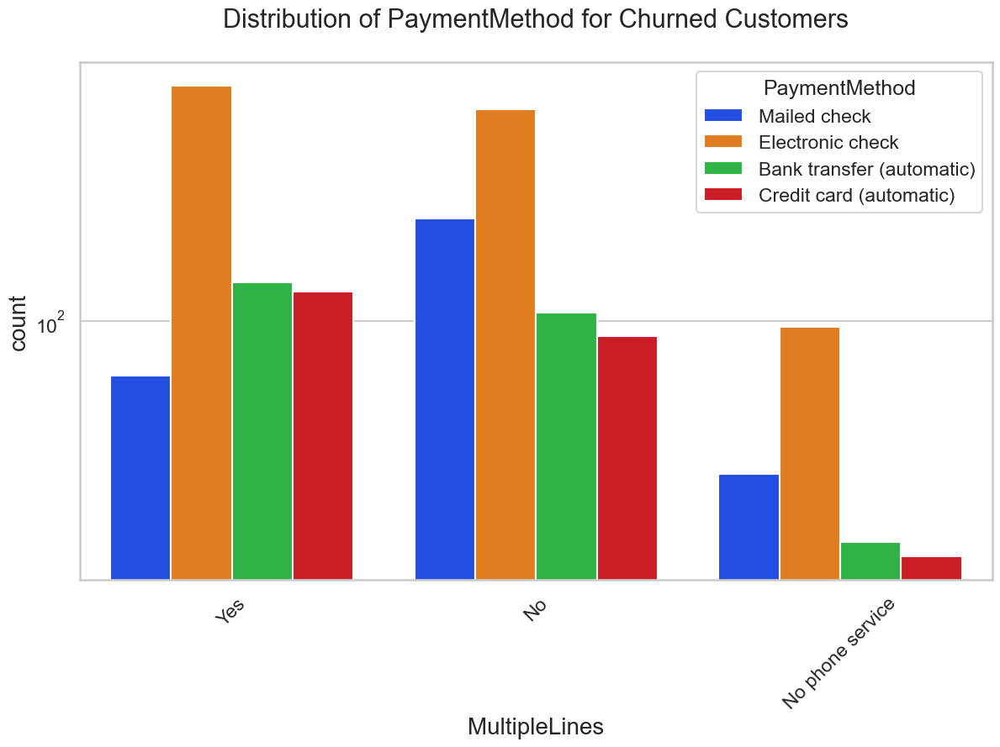

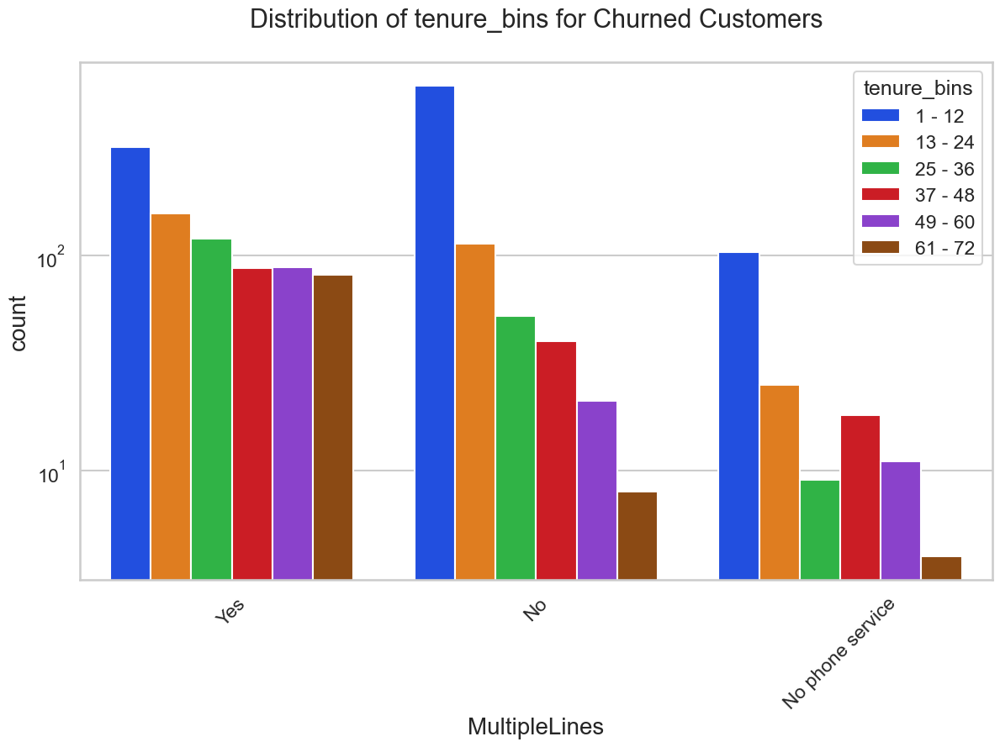

In [270]:
for col in colns:    
    uniplot(target_1,col='MultipleLines',title=f'Distribution of {col} for Churned Customers',hue=col)

Insights from Multiple Lines:
- males with multiple lines and females without multiple lines are more likely to churn while males without phone service are more likely to churn
- ppl without partners and no multiple lines more likely to churn
- ppl with multiple lines and with streaming tv or movies equally likely to churn as ppl without multiple lines and without streaming tv or movies
- ppl without multiple lines are highly likely to churn in 1-12 months tenure
-ppl with fibre optics and multiple lines more likely to churn

Internet Service

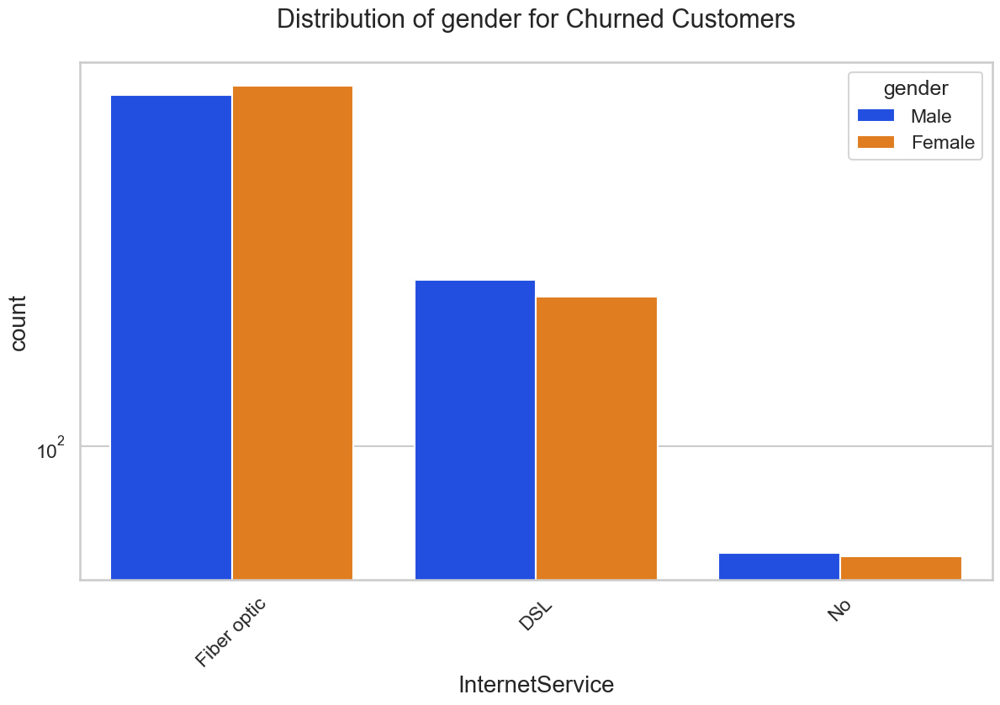

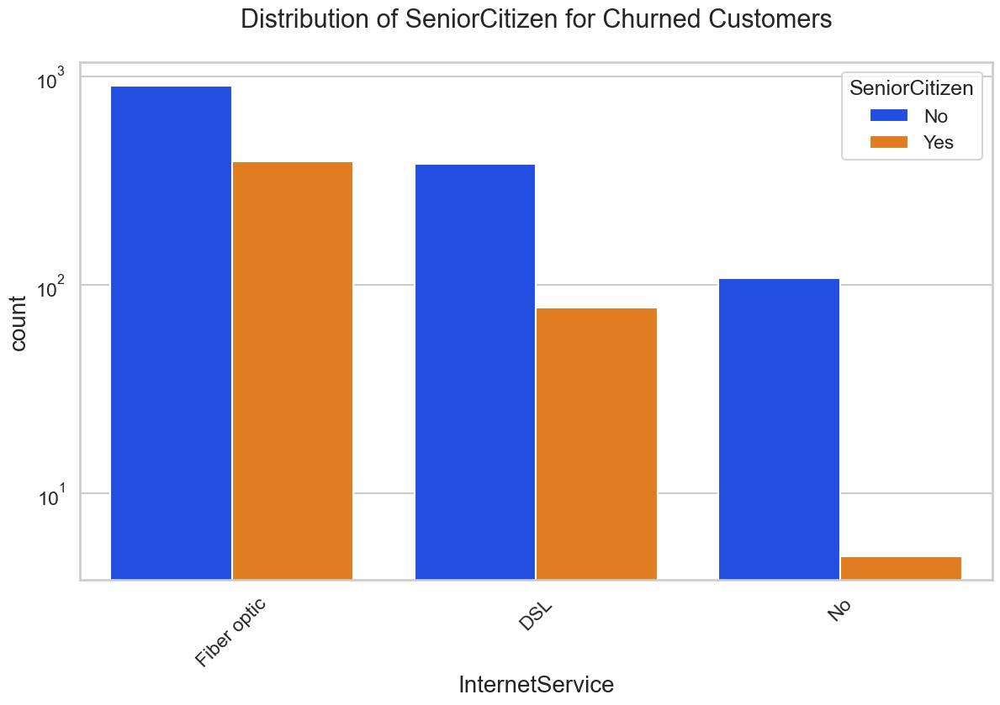

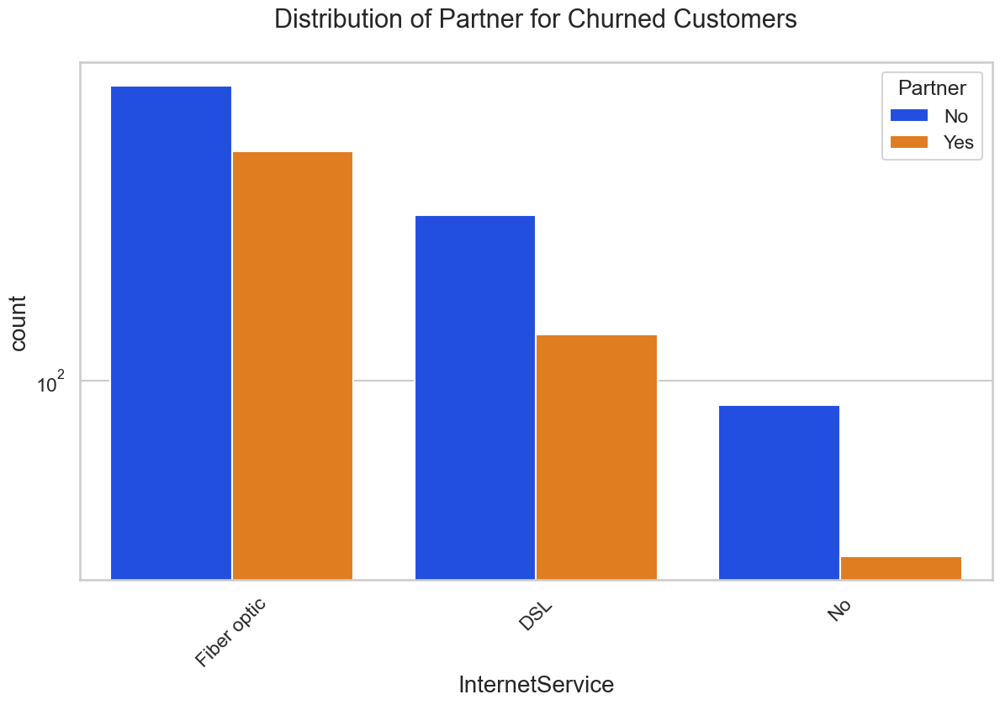

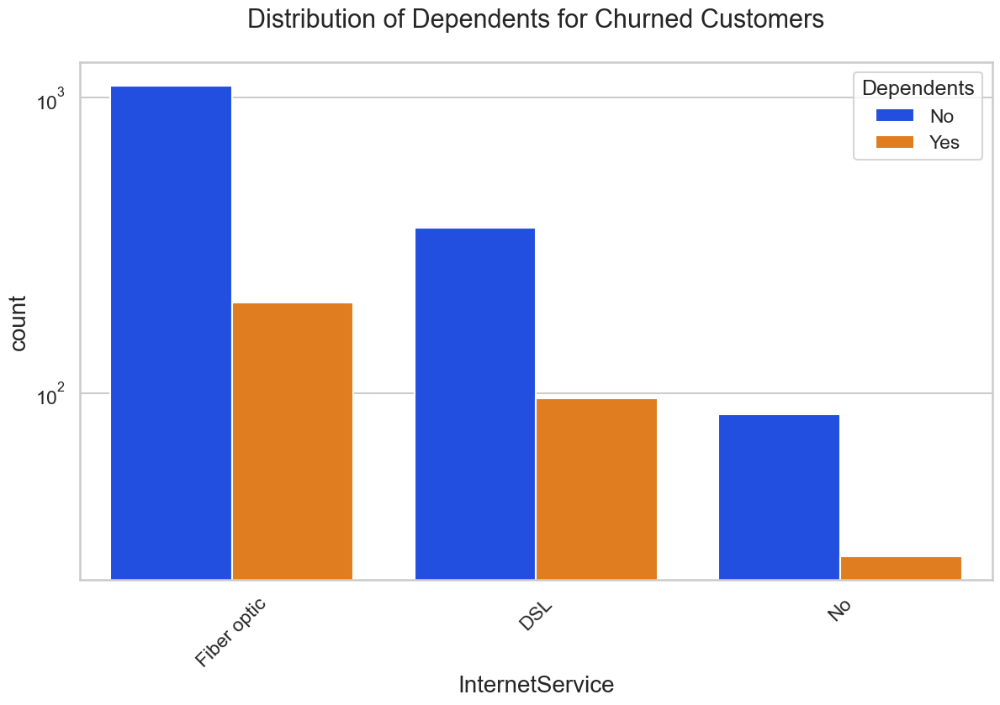

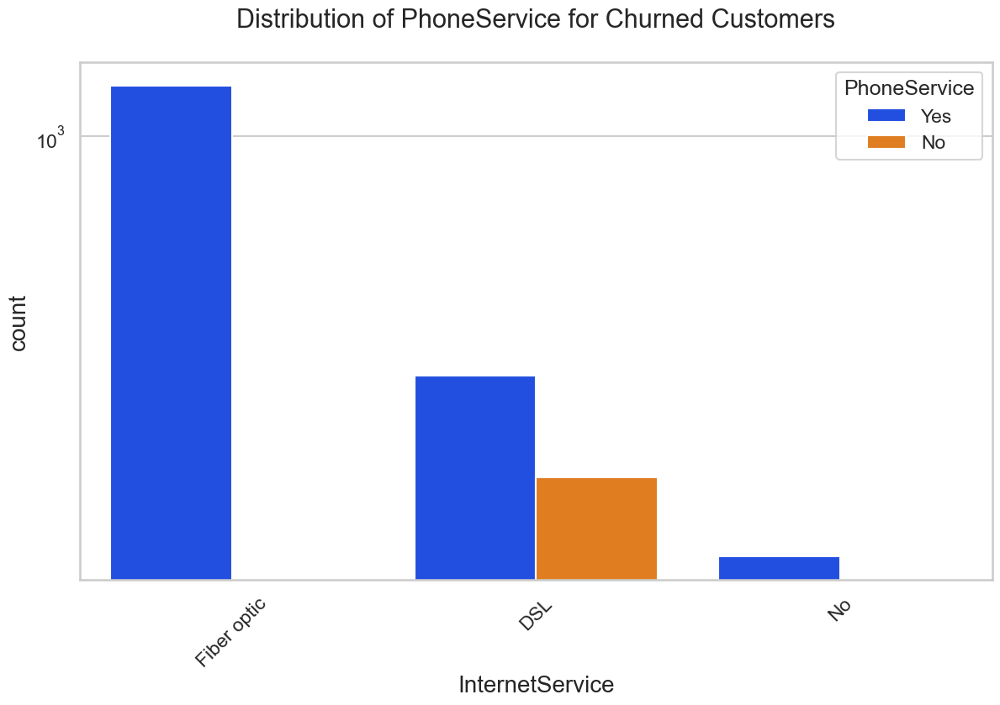

...

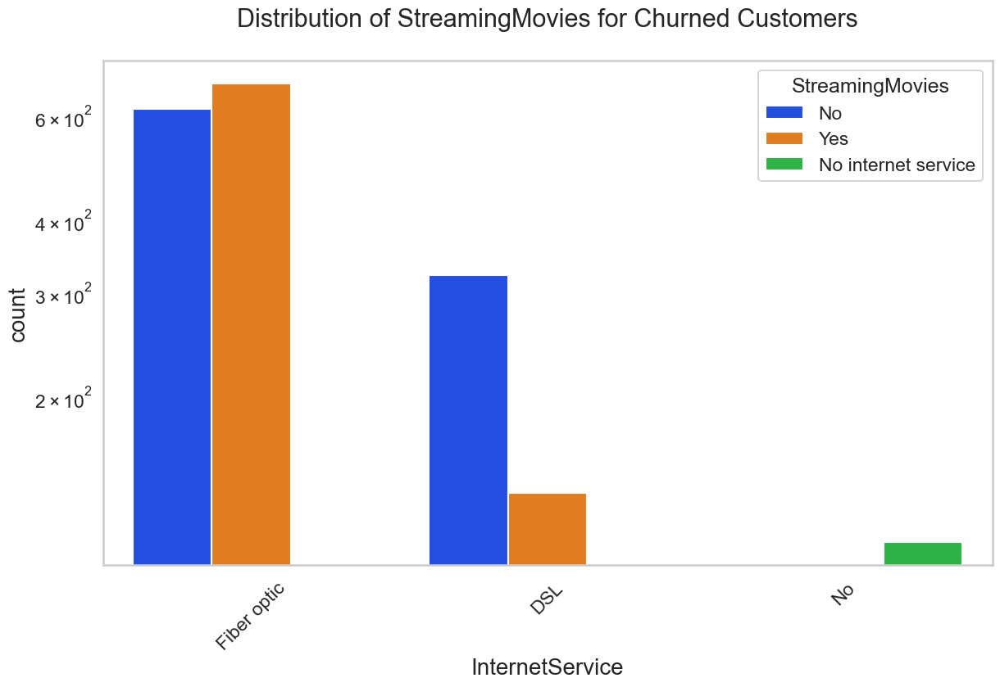

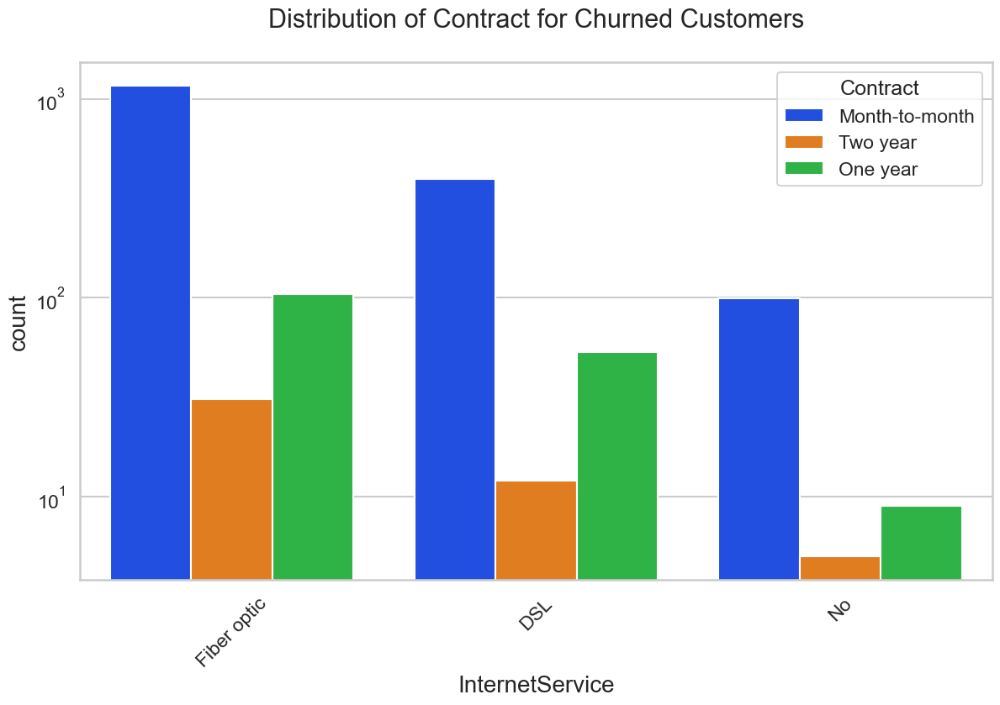

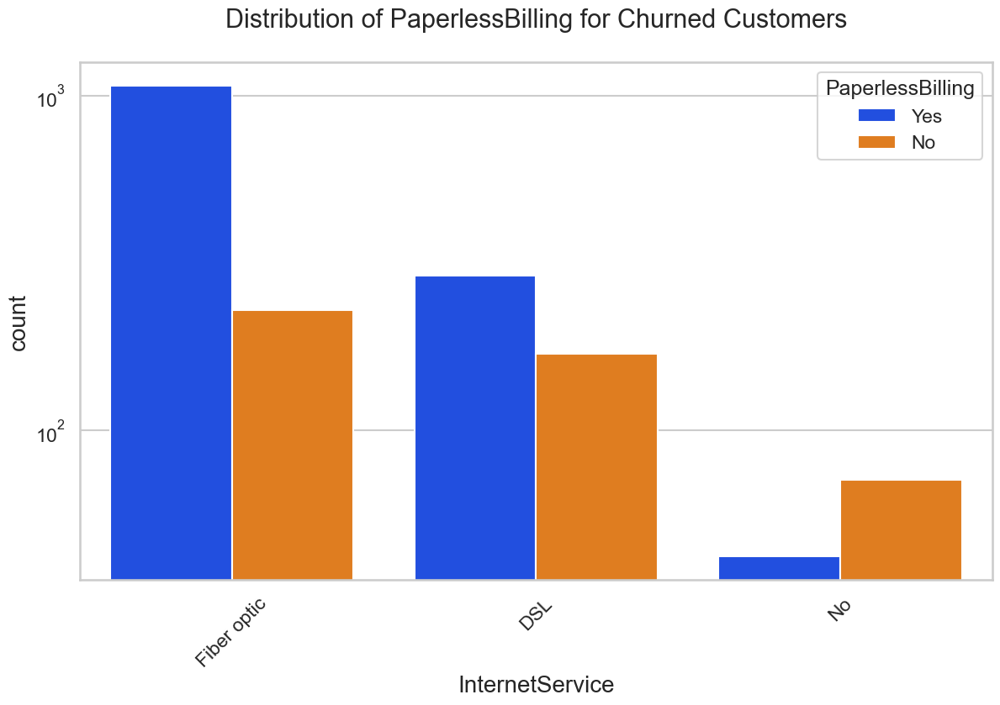

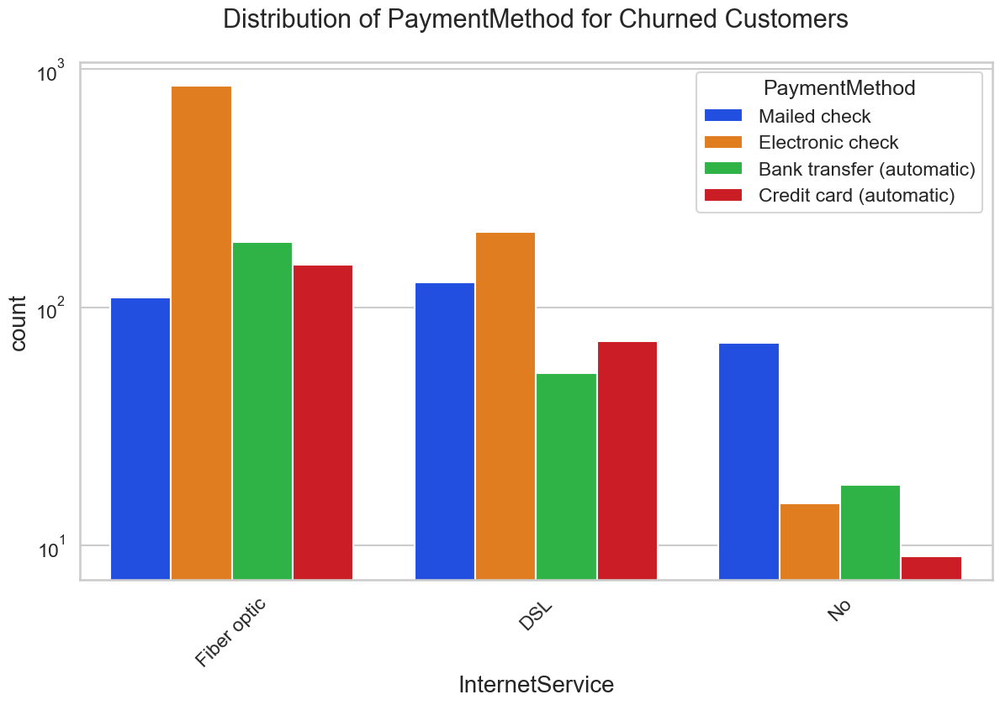

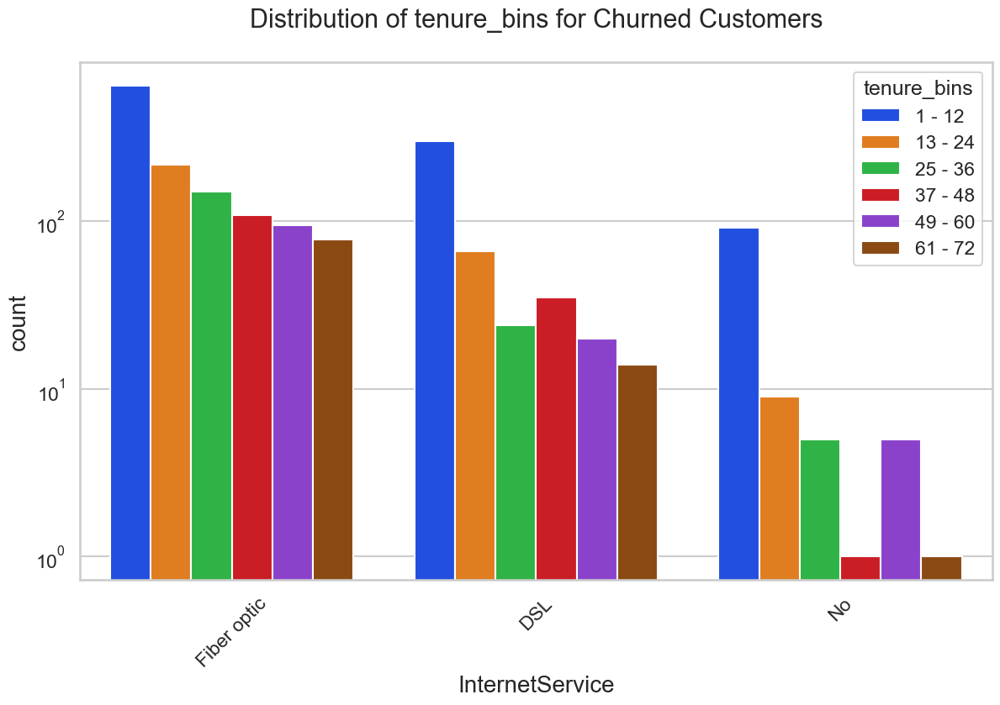

In [271]:
for col in colns:    
    uniplot(target_1,col='InternetService',title=f'Distribution of {col} for Churned Customers',hue=col)

Intuition from Internet Service: 
- females with fibre optics are slightly more likely and males with DSL are more likely to churn
- ppl with fibreoptic and streaming tv and movies more likely to churn
- ppl with no internet service and no paperless billing are more likely to churn
- ppl with mailed check and no internet service more likely to churn 

Online Security

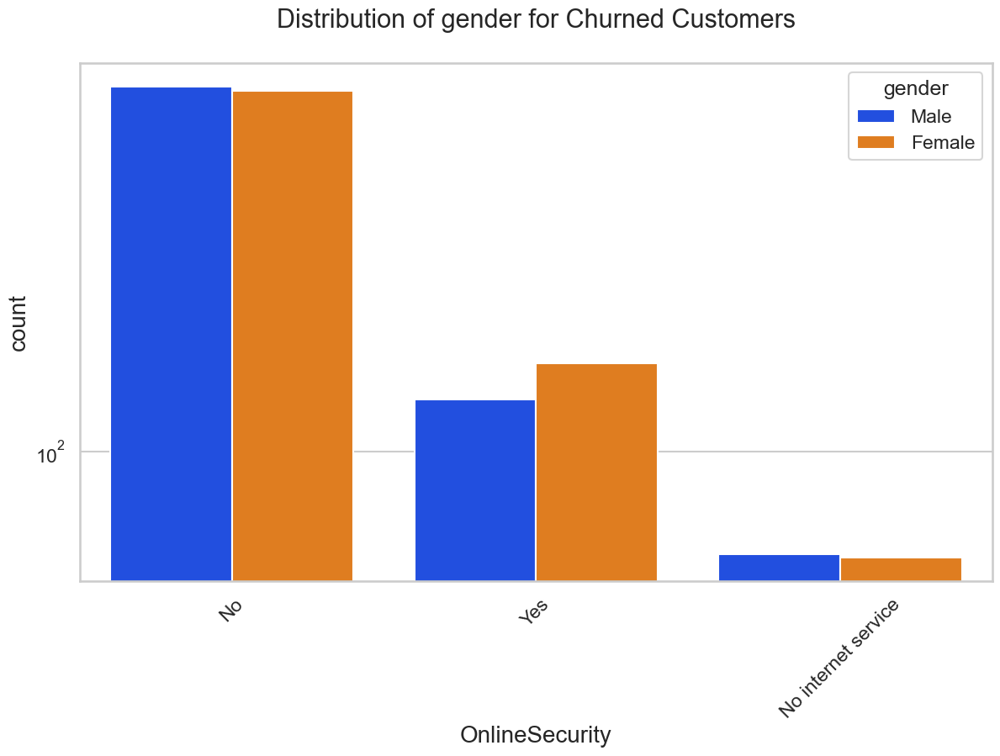

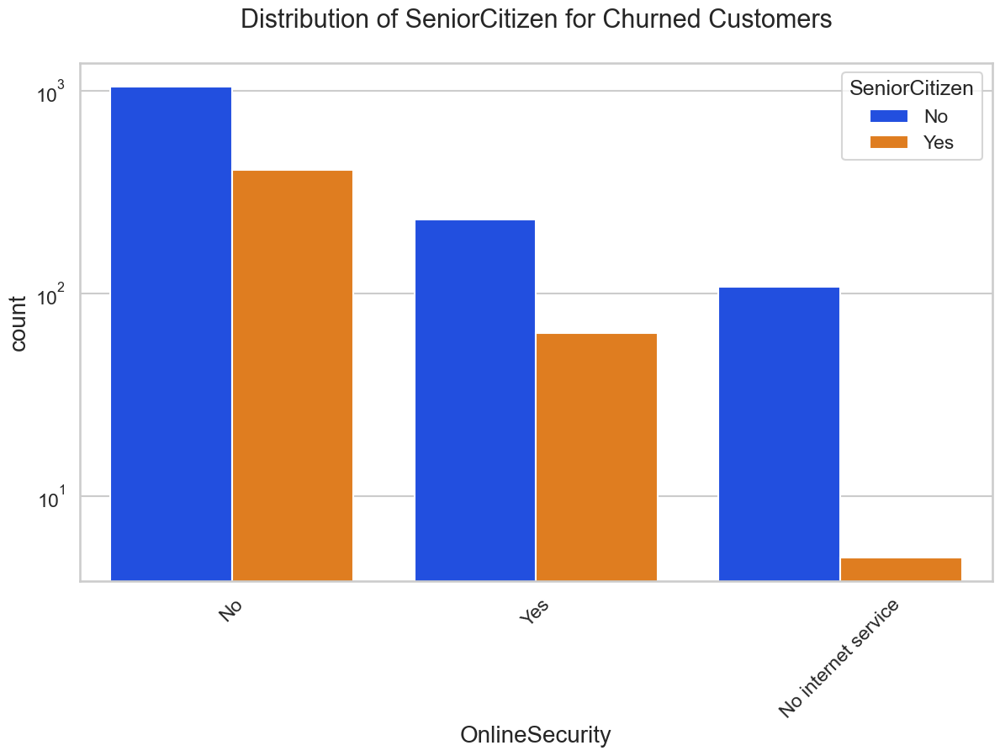

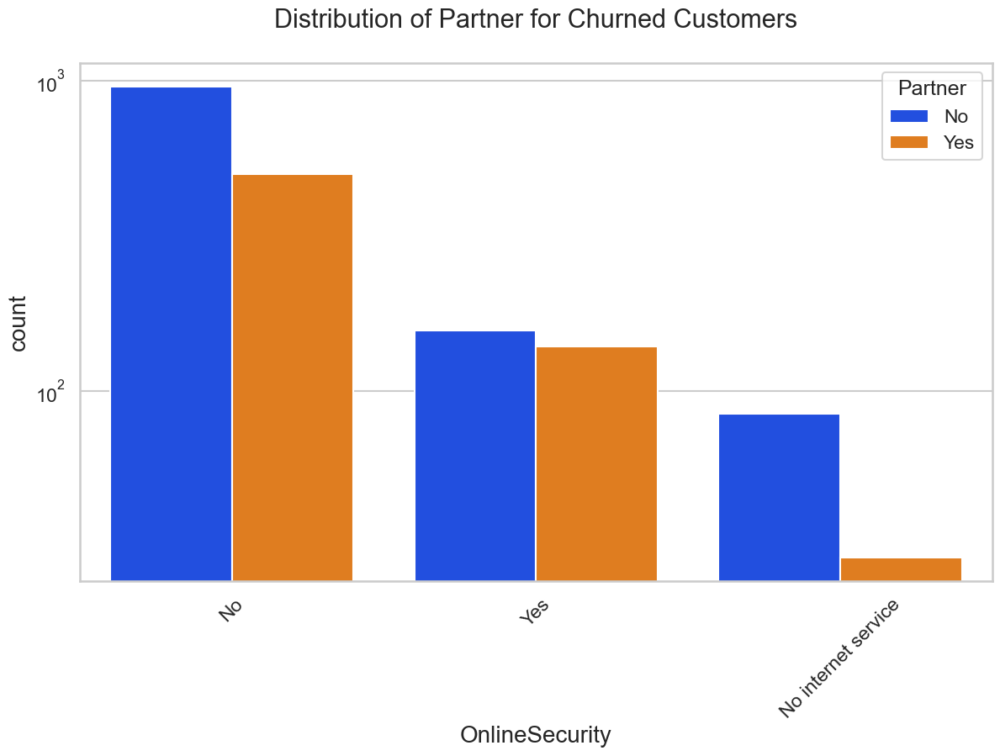

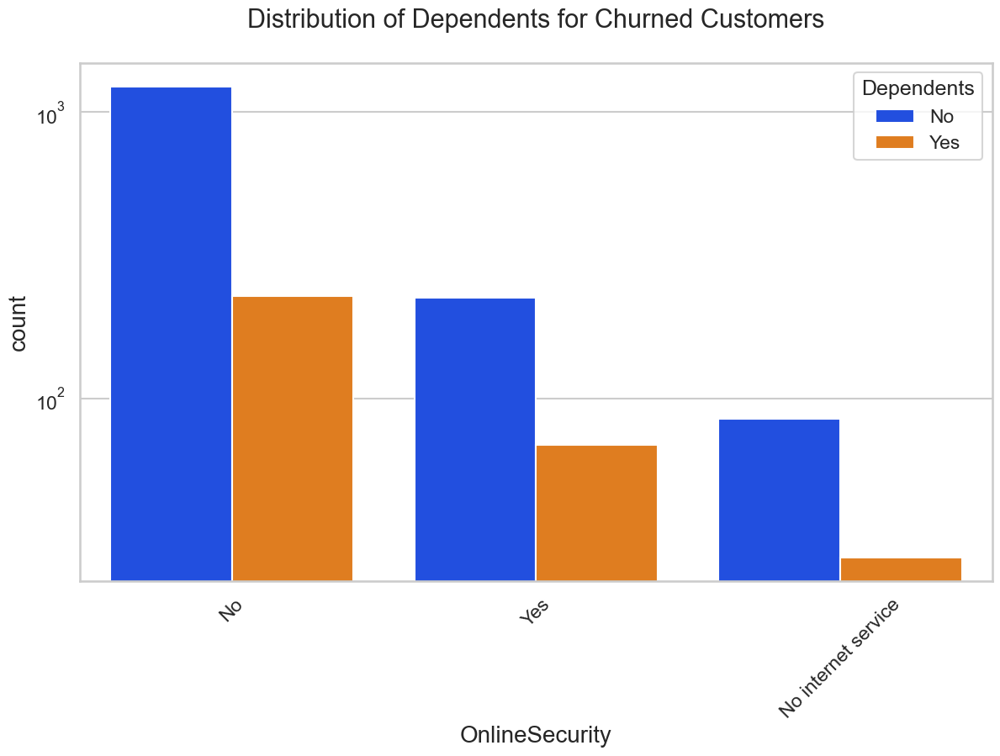

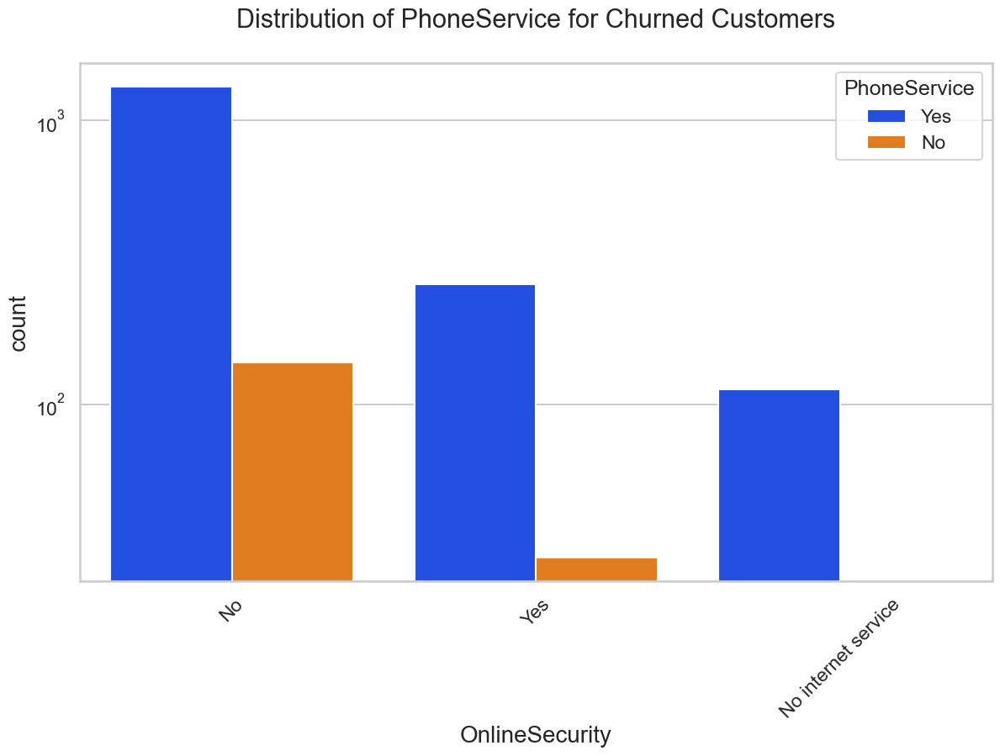

...

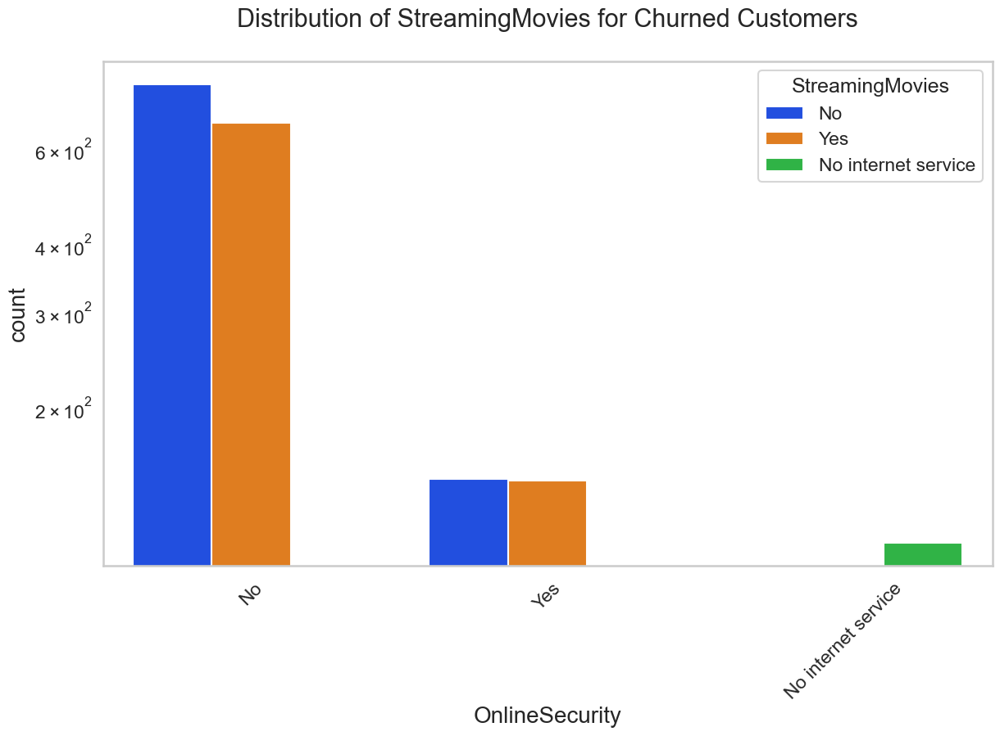

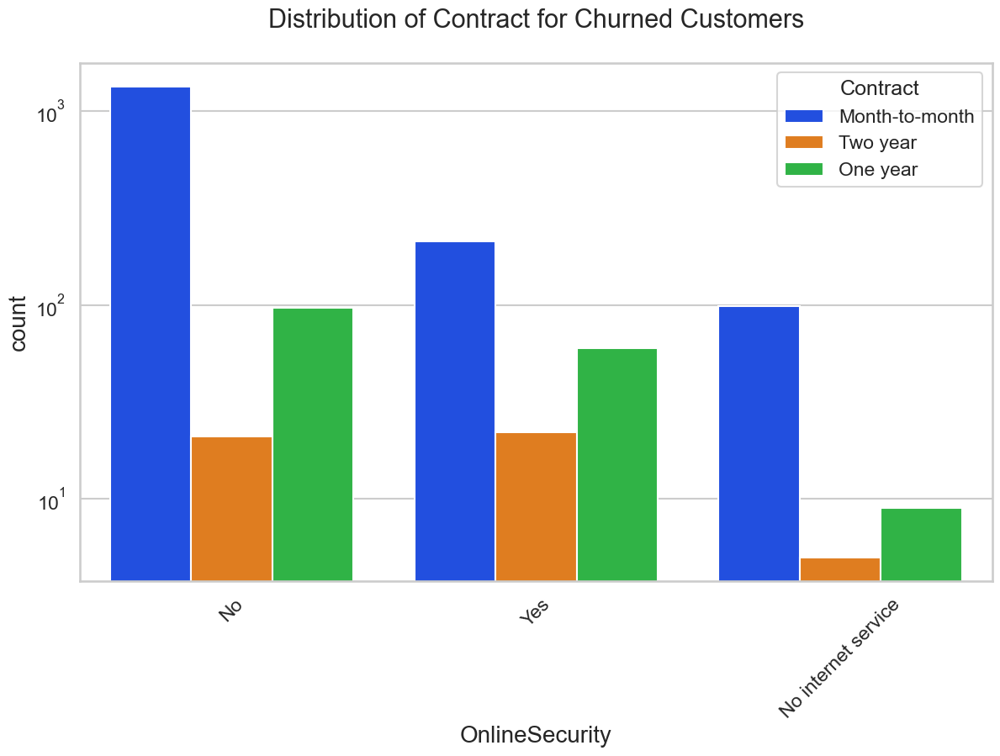

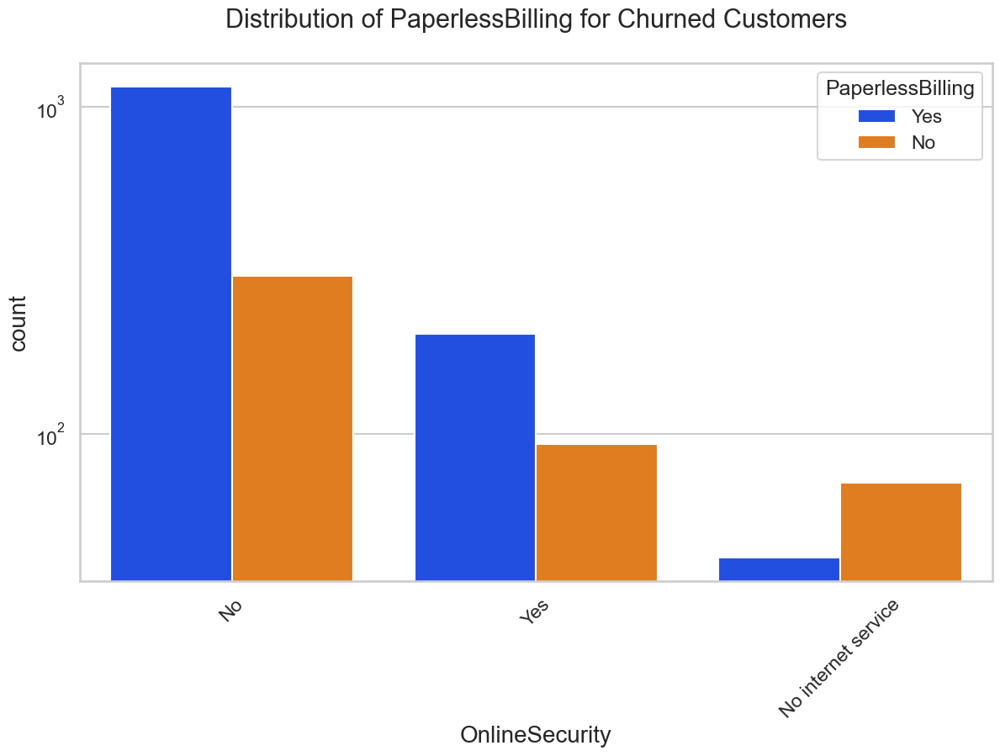

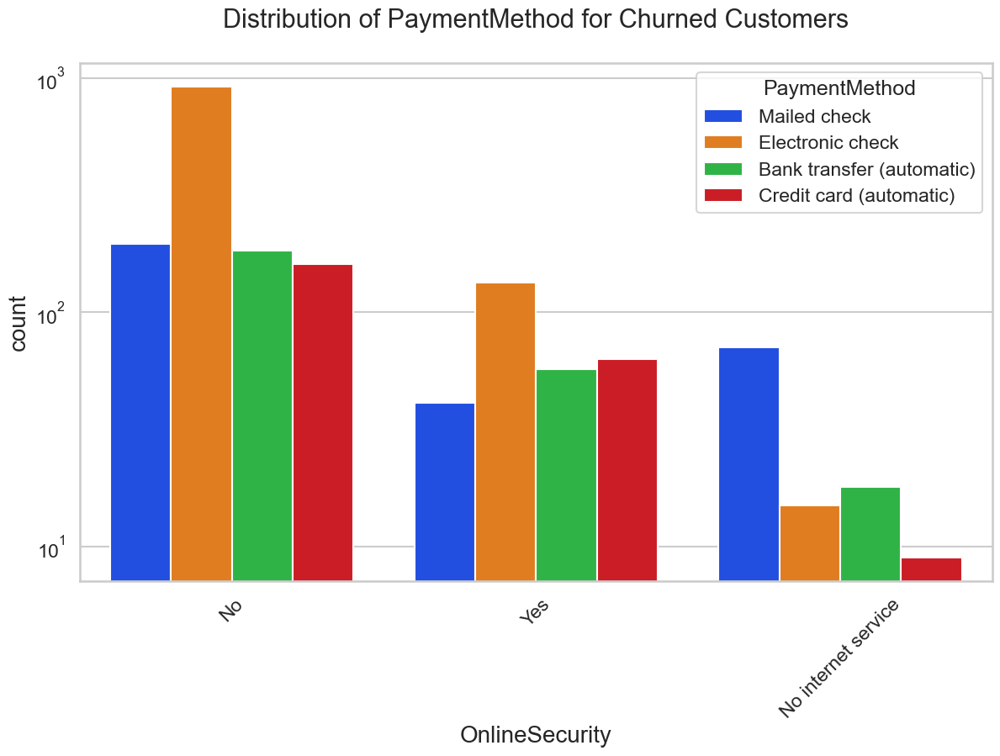

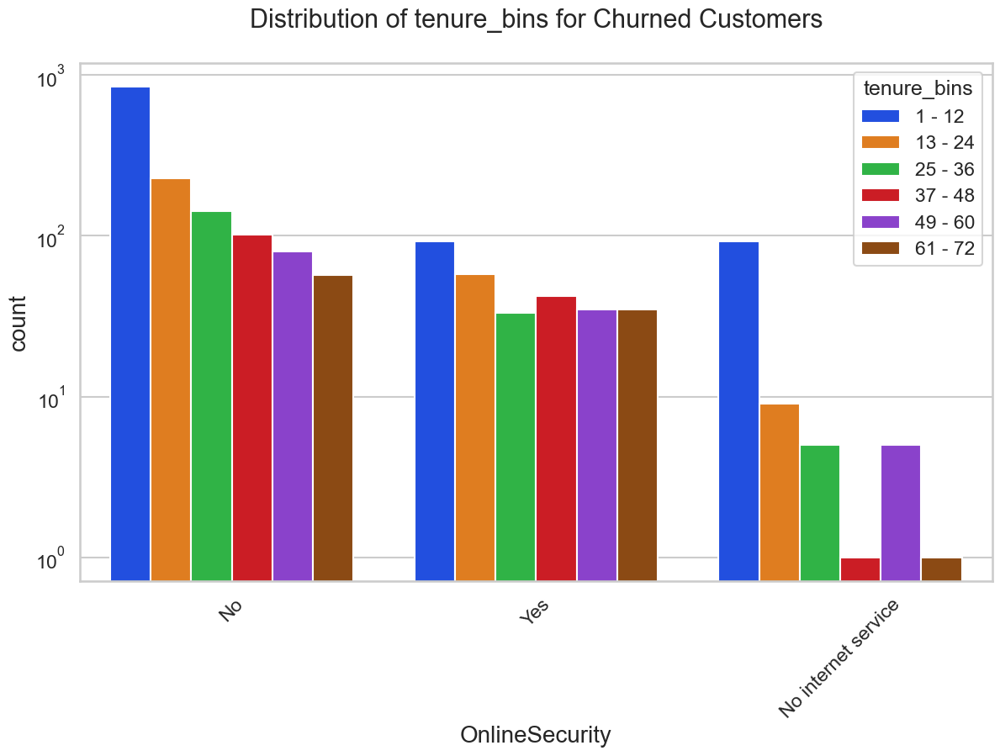

In [272]:
for col in colns:    
    uniplot(target_1,col='OnlineSecurity',title=f'Distribution of {col} for Churned Customers',hue=col)

Insights from Online Security:
- males with no online security and females with online security are more likely to churn
- no partner and online security yes then slightly likely to churn
- ppl with no online security but with dependents are equally likely to churn as ppl with online security and no dependents
- ppl with phone service and no online security more likely to churn
- ppl with multiple lines regardless of online security likely to churn
- ppl with tech support and no online security with same likeliness as ppl without tech support and online security to churn
- ppl with online security and streaming services less likely to churn

Online Backup

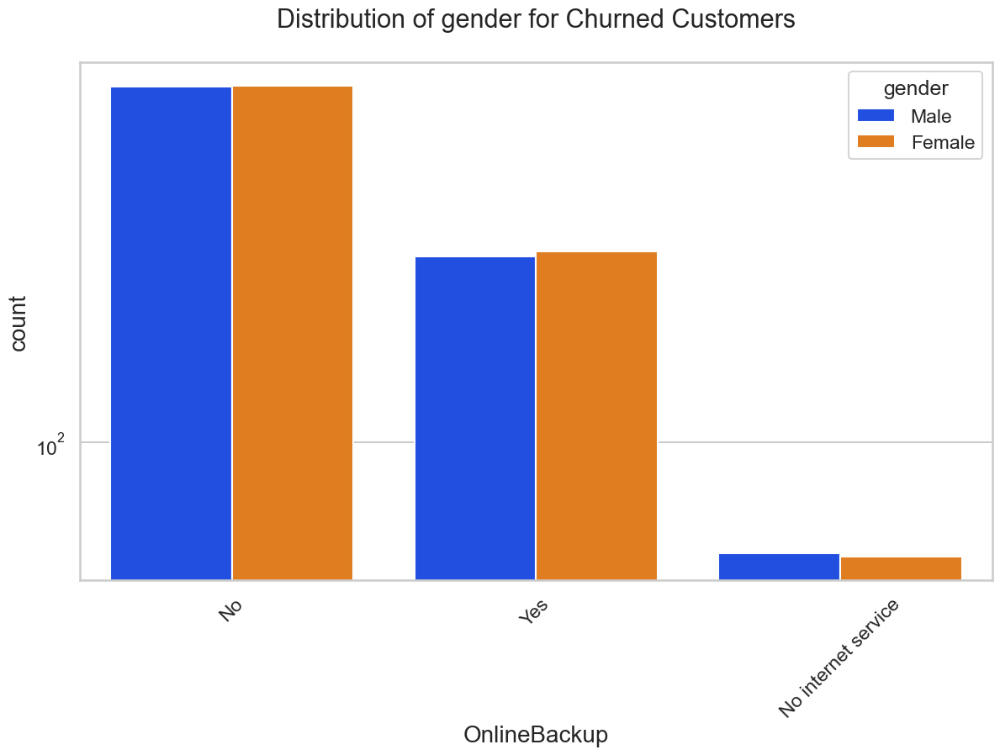

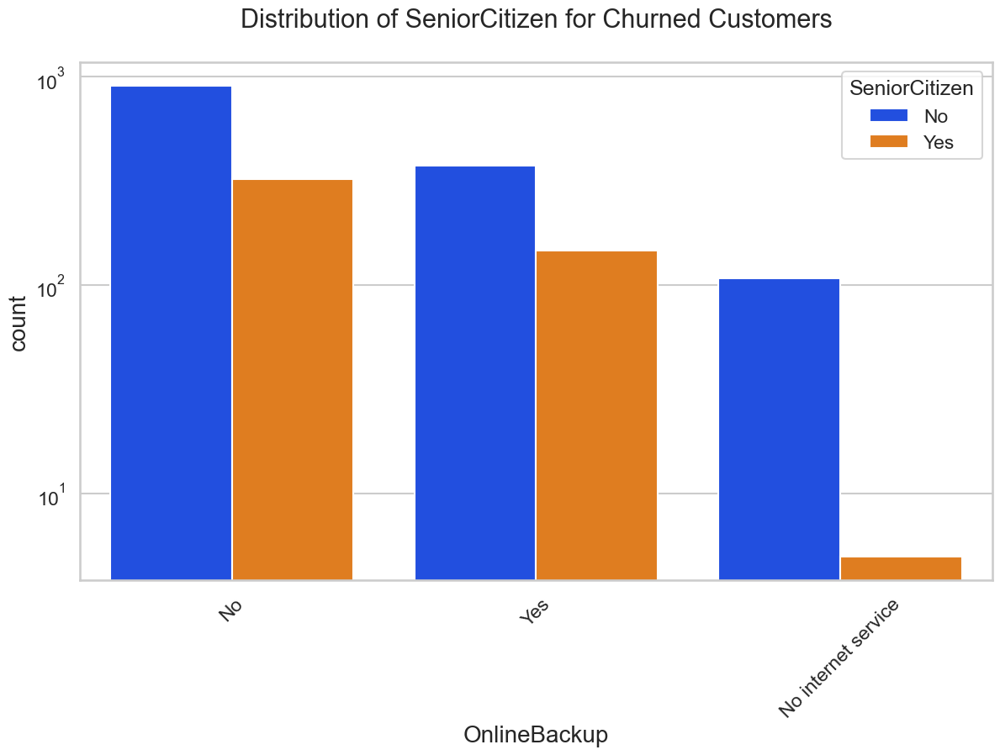

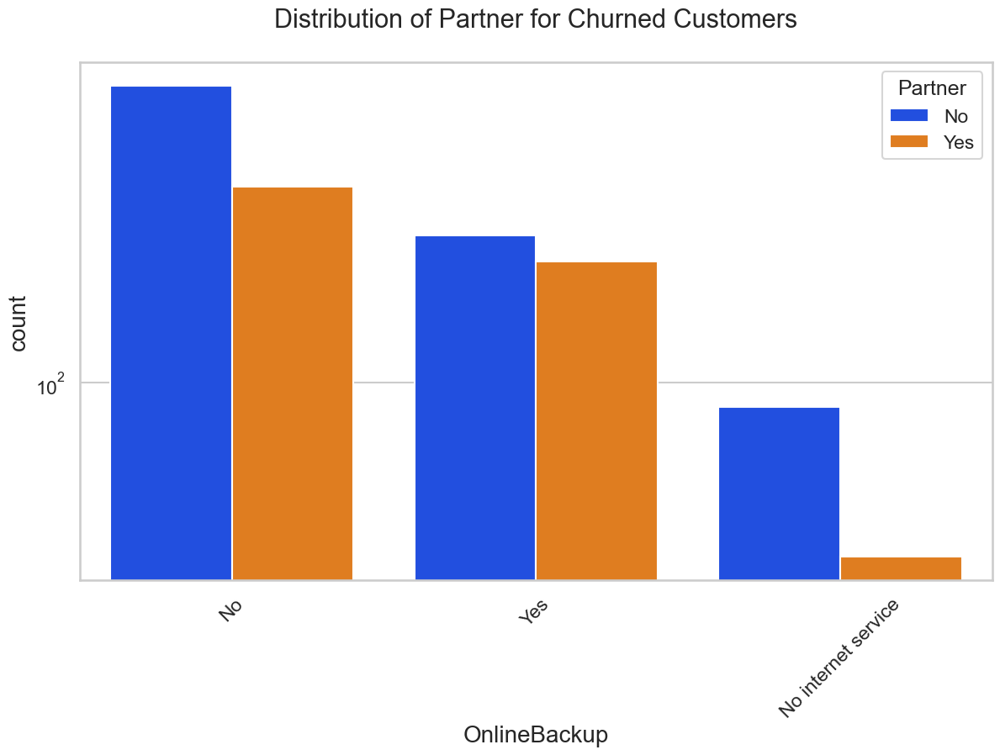

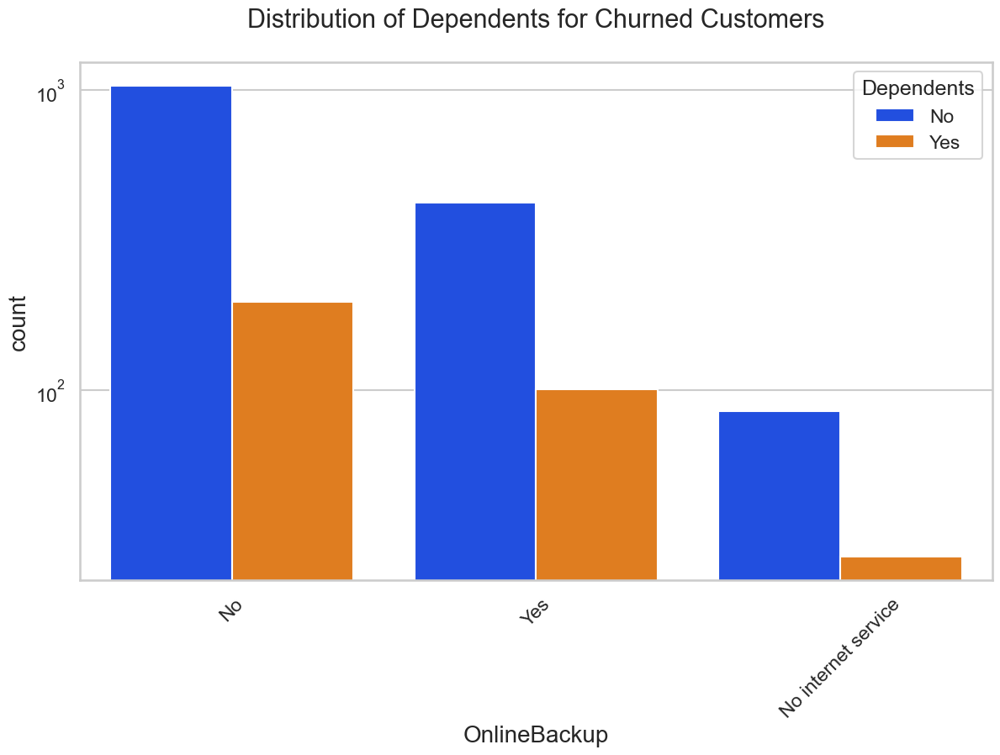

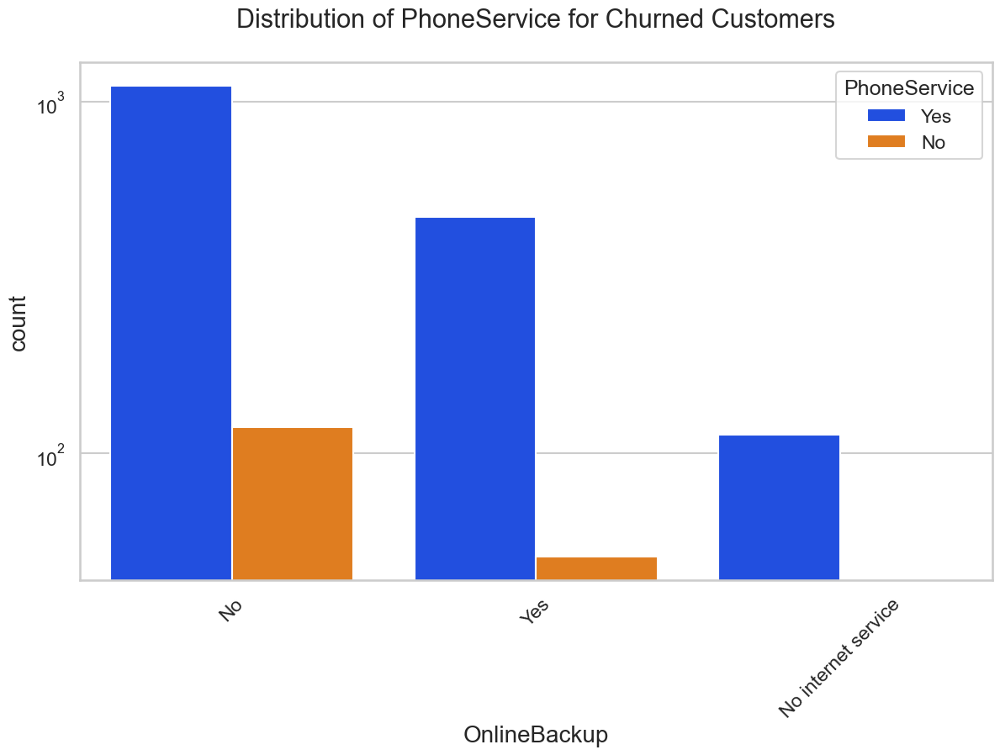

...

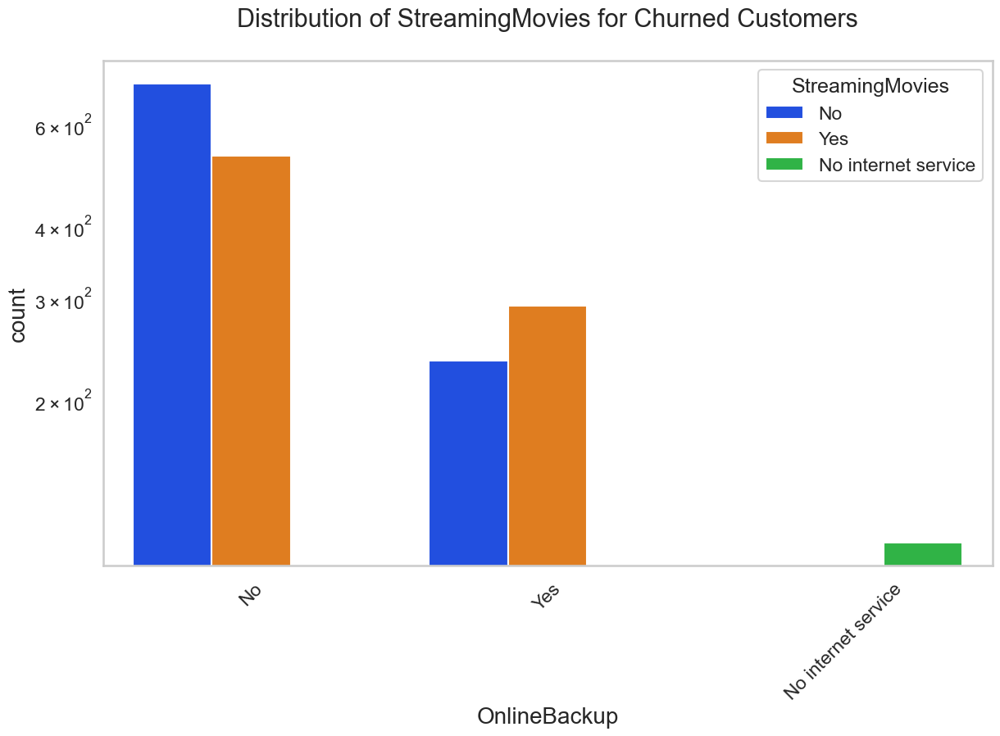

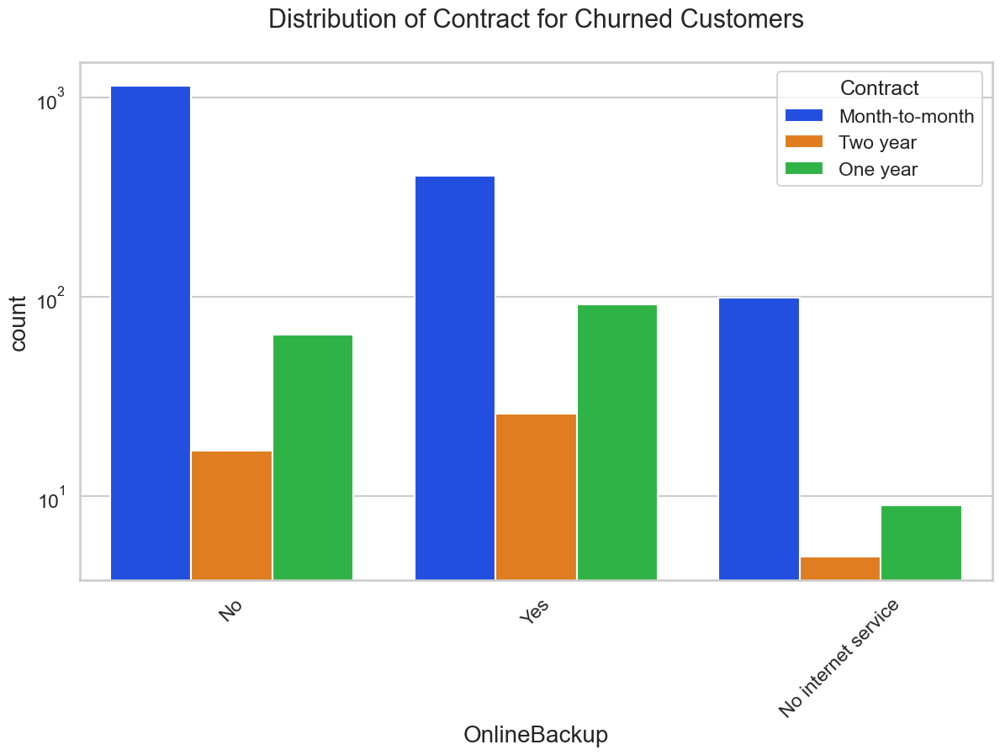

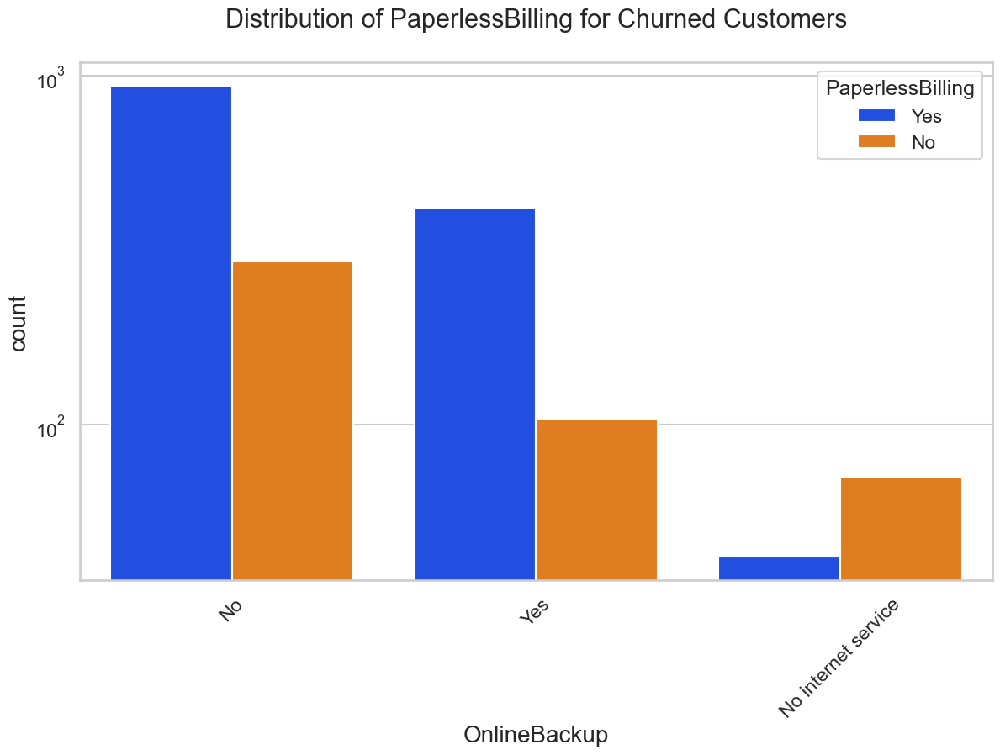

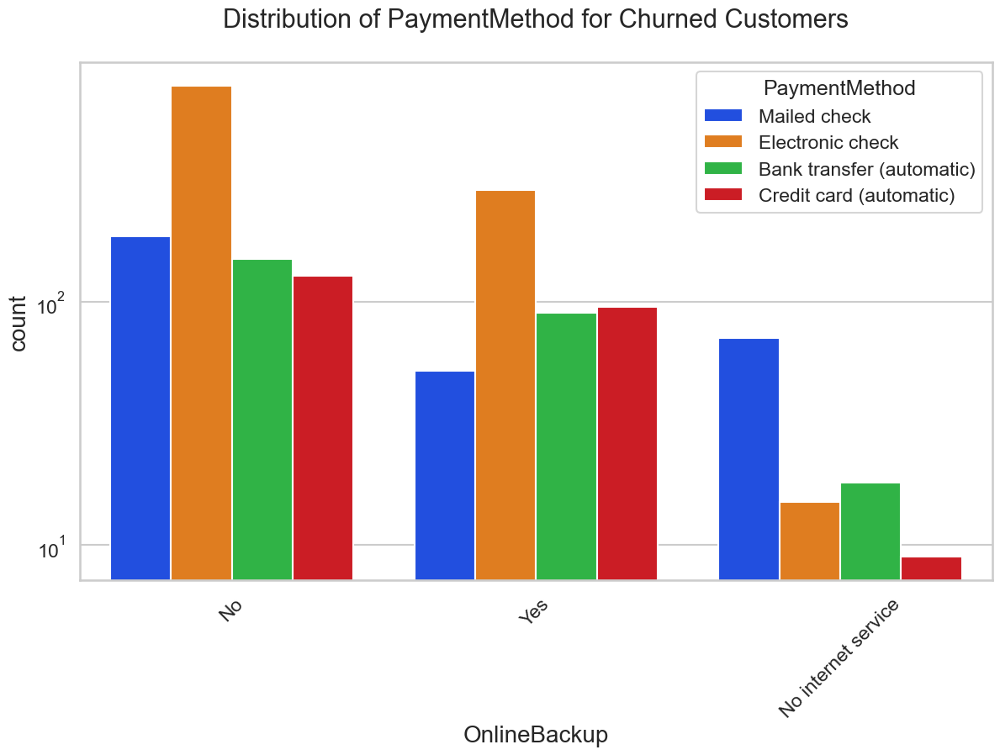

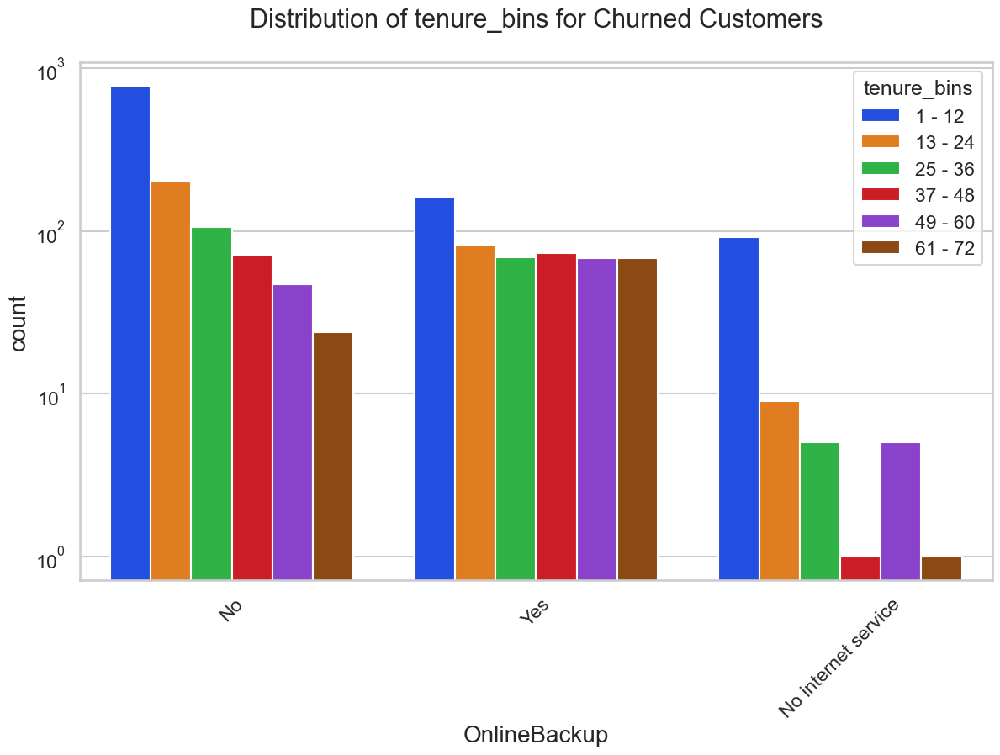

In [273]:
for col in colns:    
    uniplot(target_1,col='OnlineBackup',title=f'Distribution of {col} for Churned Customers',hue=col)

Insights from Online Backup:
- both genders regardless of online backup have almost same churn
- ppl with multiple lines with or without online backup have high churn
- ppl with streaming services with online backup also have higher churn
- ppl with one yr contract and online backup have high churn rates

Device Protection

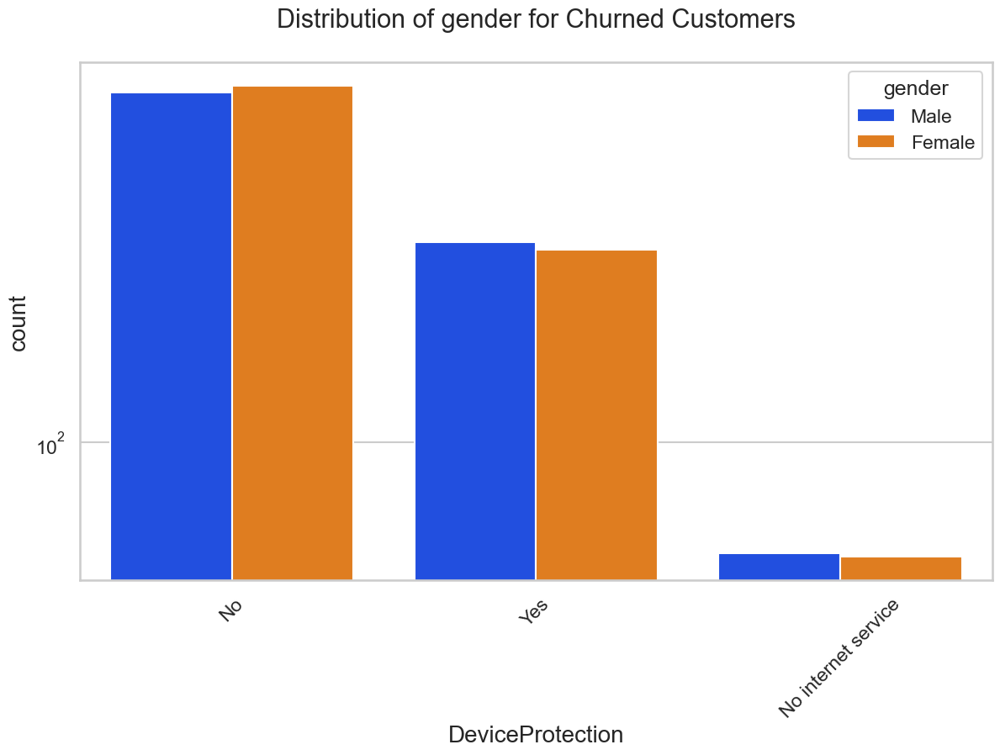

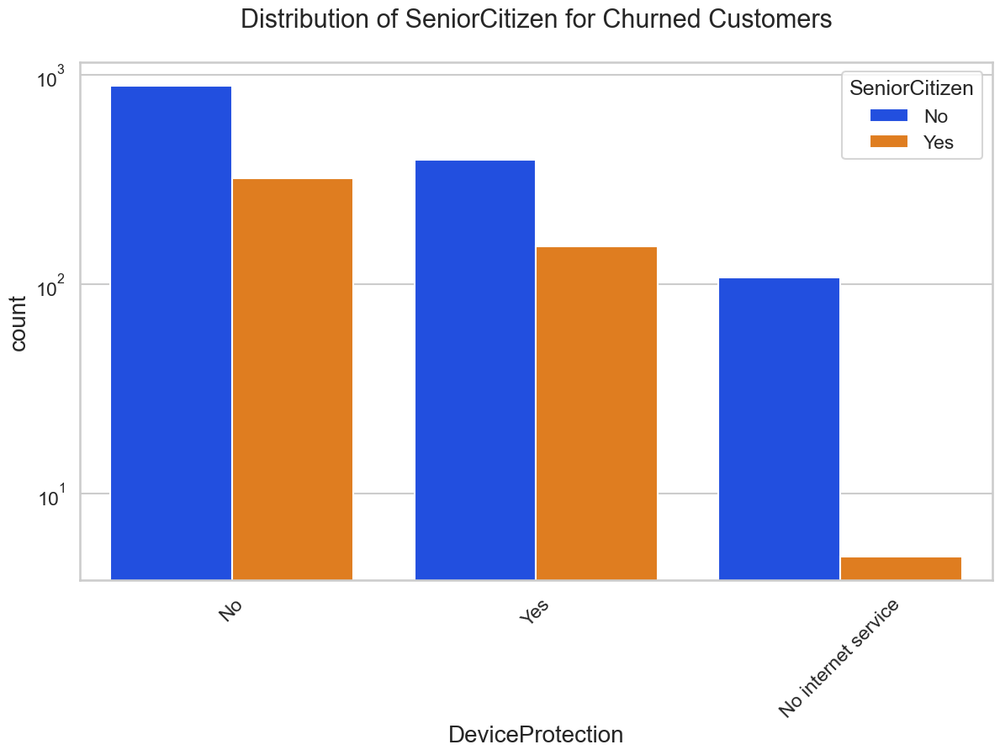

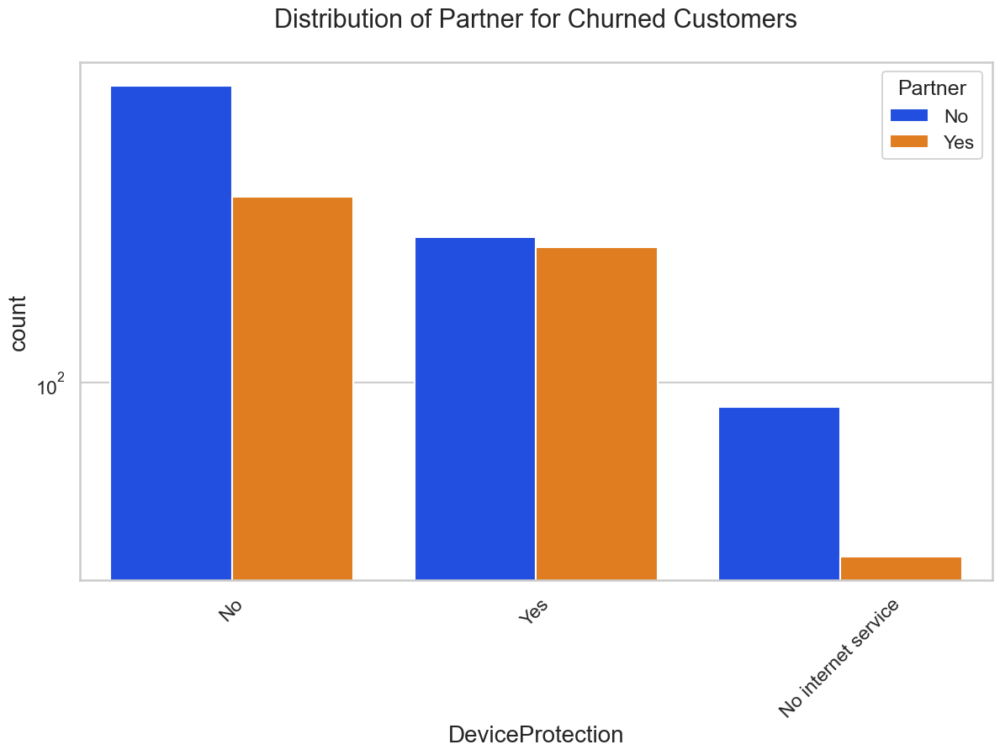

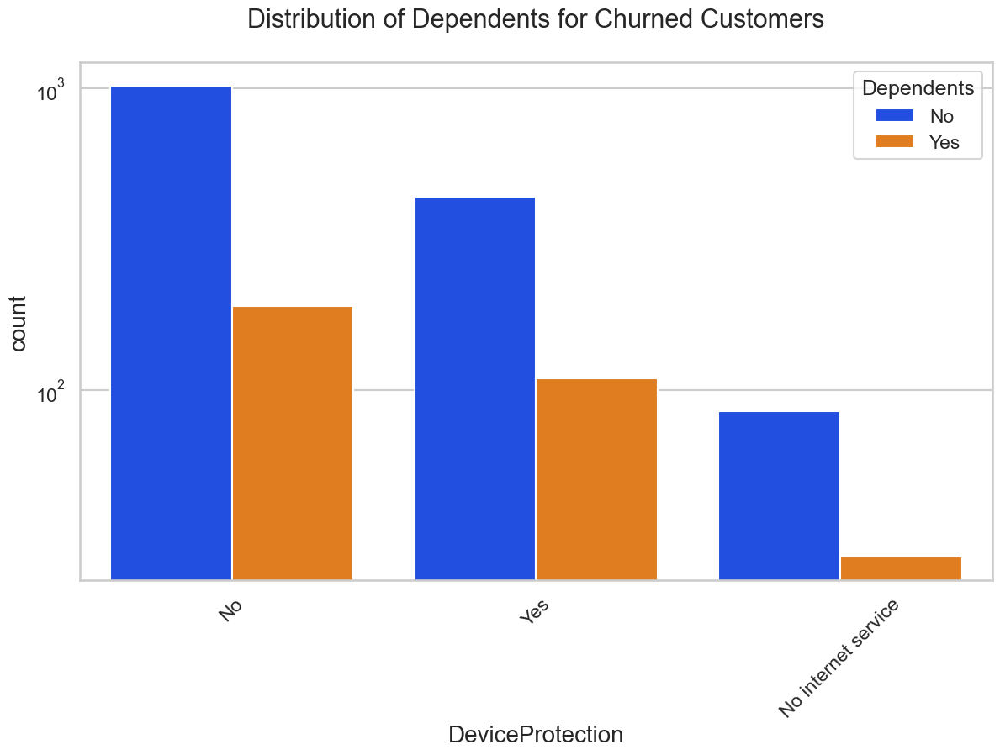

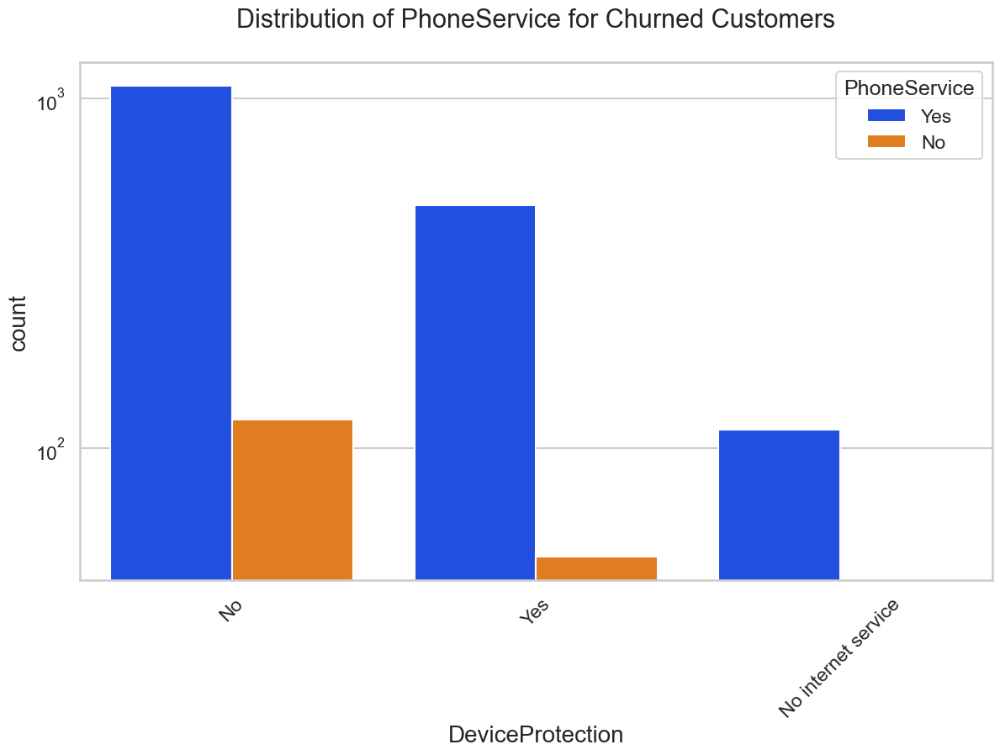

...

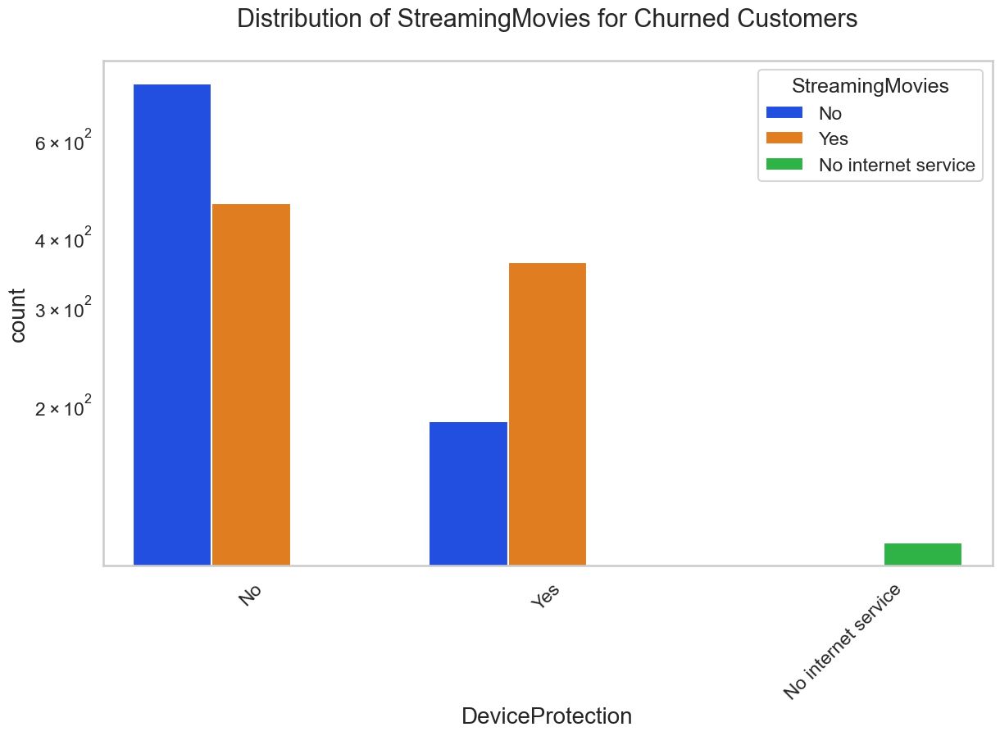

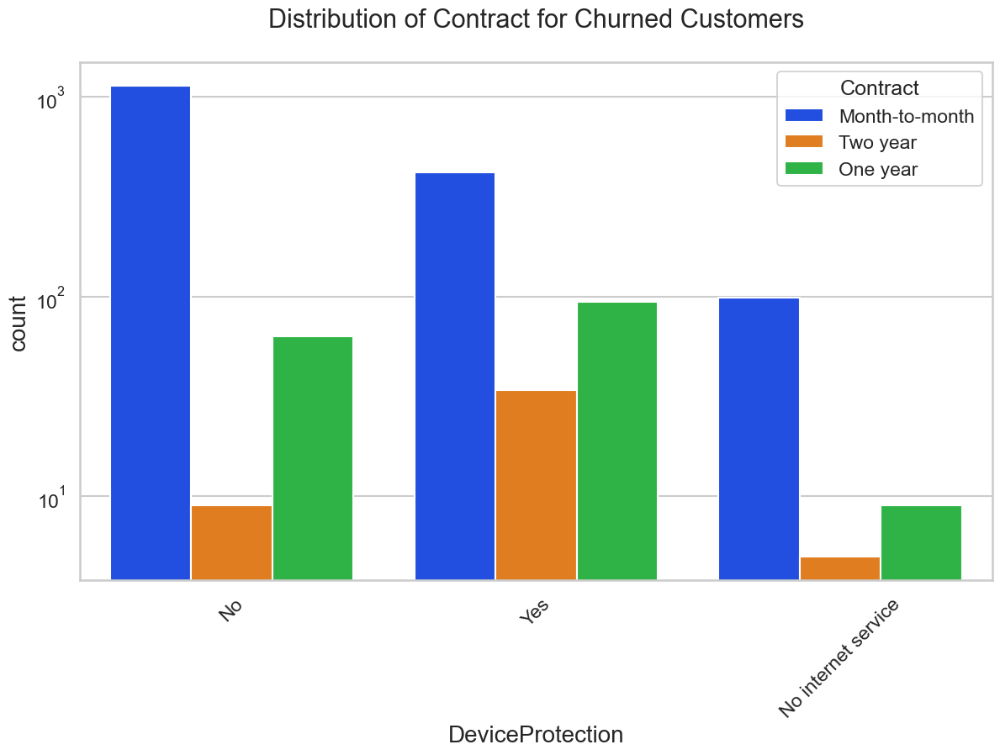

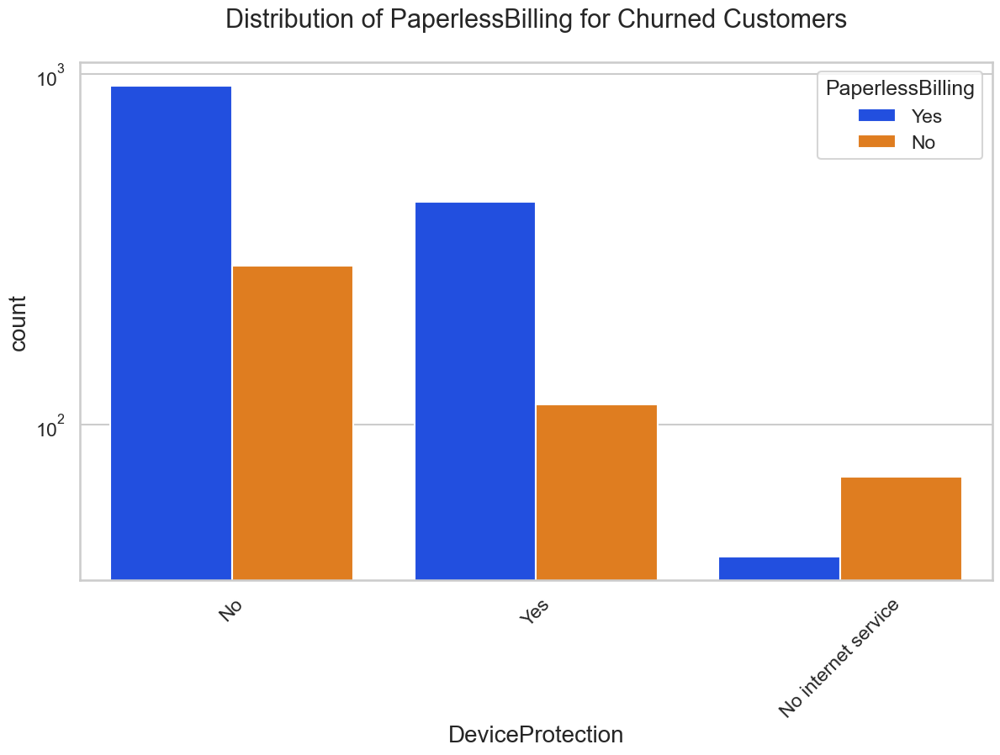

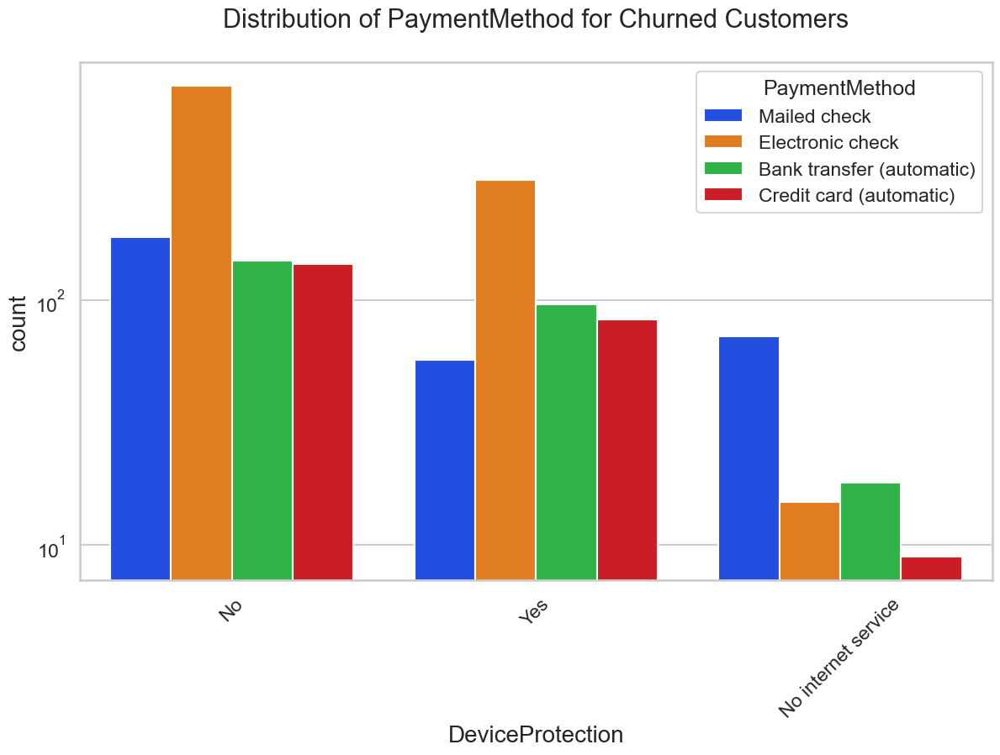

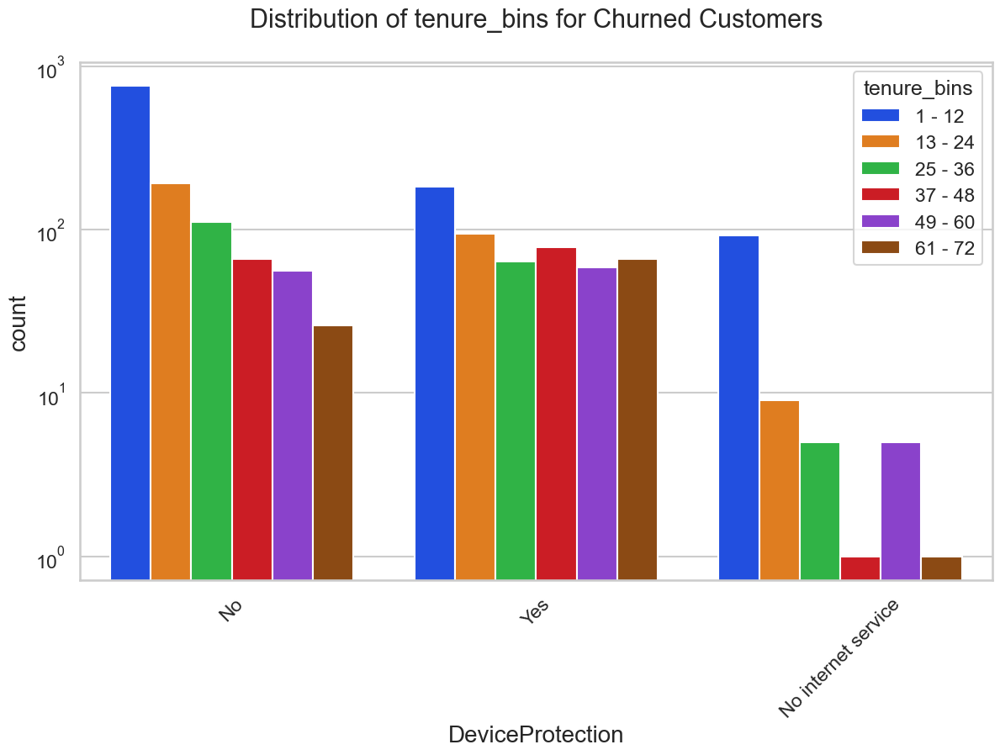

In [274]:
for col in colns:    
    uniplot(target_1,col='DeviceProtection',title=f'Distribution of {col} for Churned Customers',hue=col)

Intuition from device protection:
- females with no device protection and males with device protection slightly higher to churn
- ppl with multiple lines and device protection have high churn
- ppl with streaming service and device protection have very high rate of churn

Tech Support

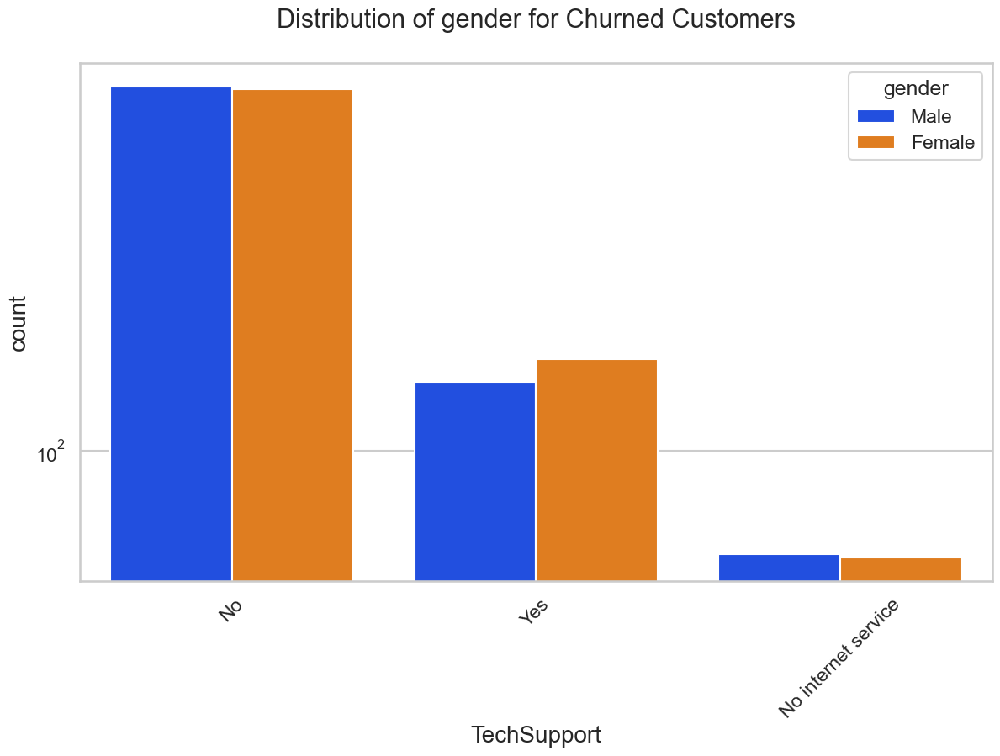

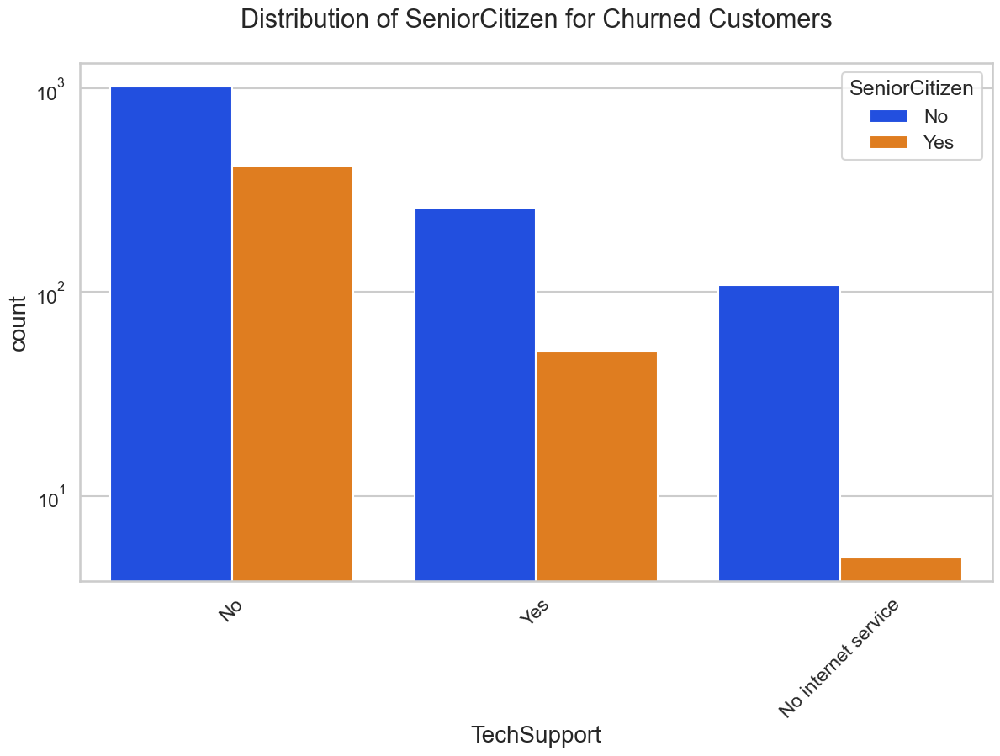

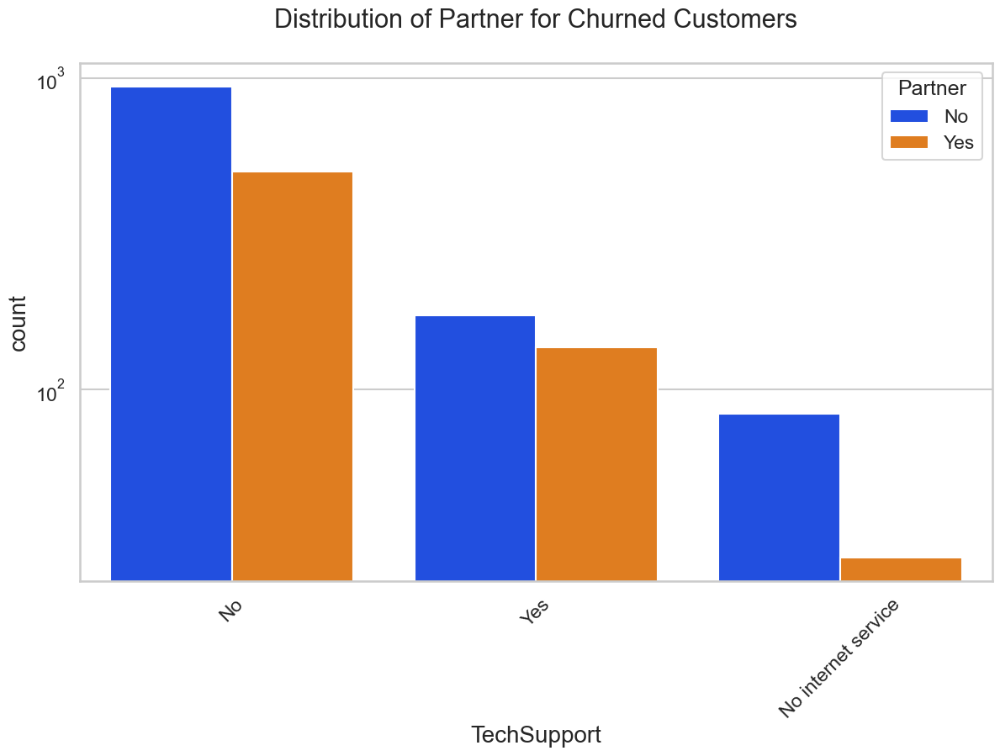

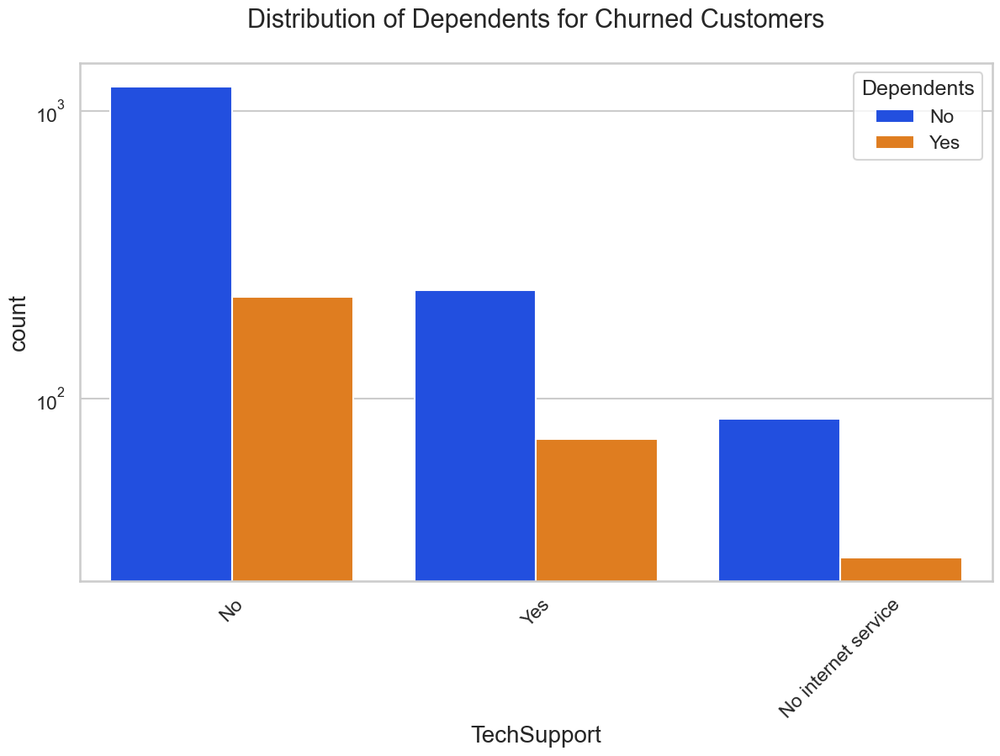

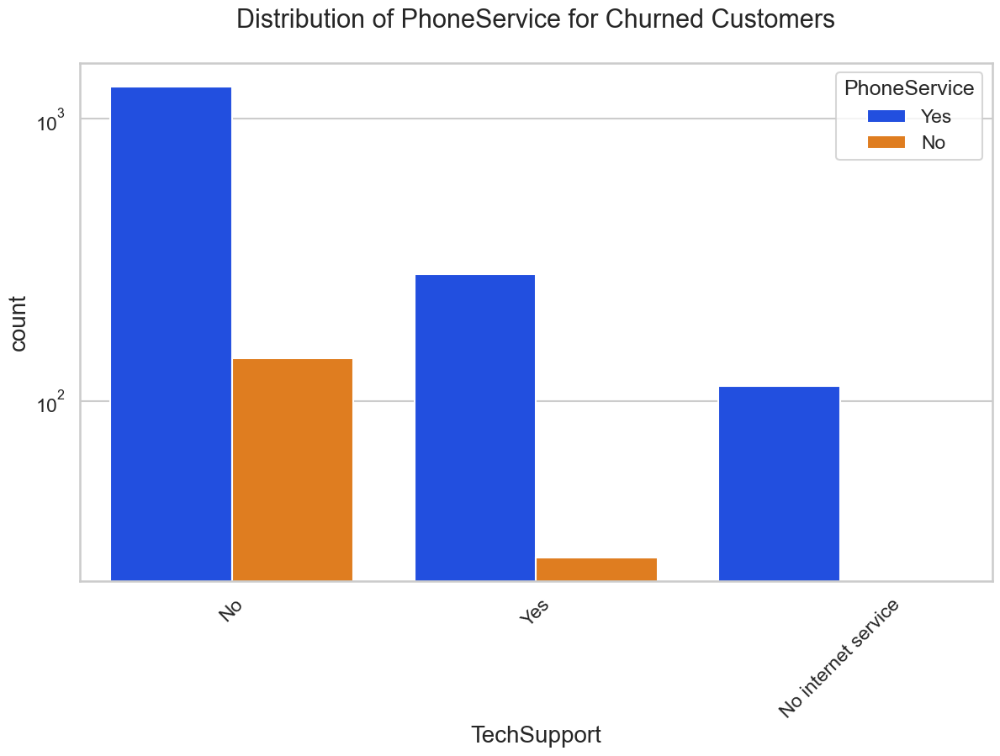

...

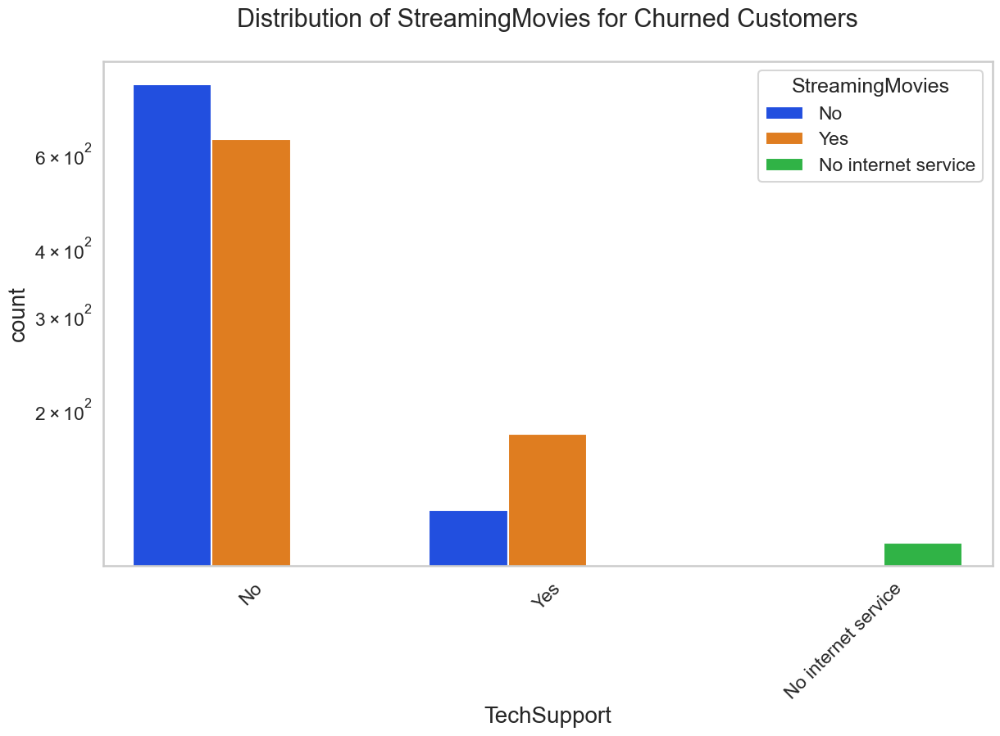

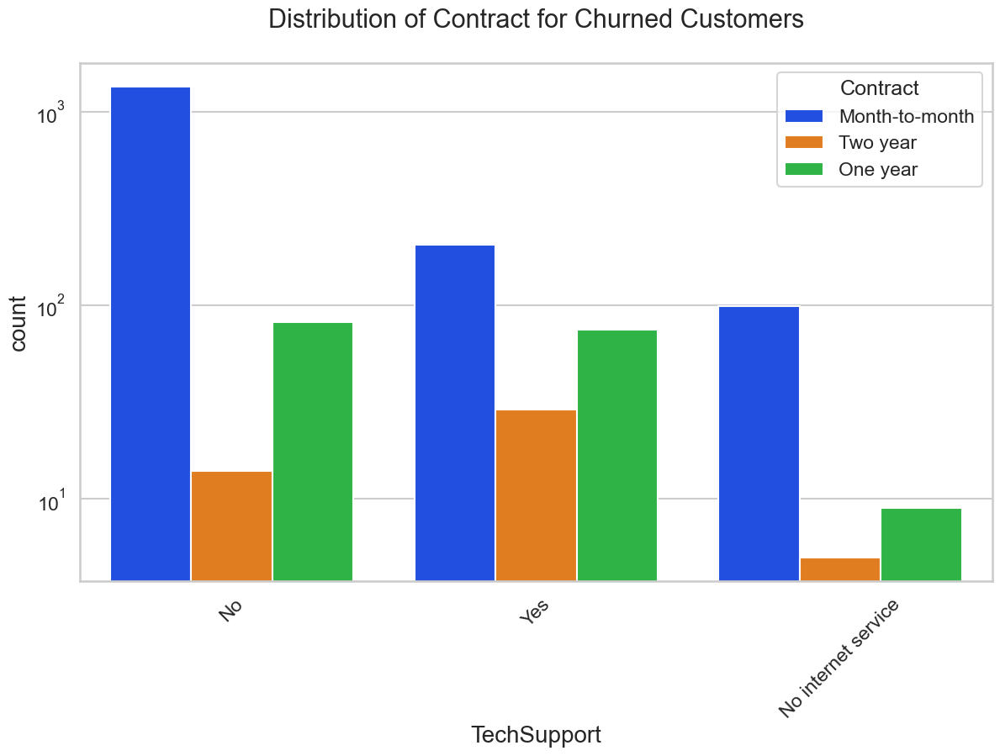

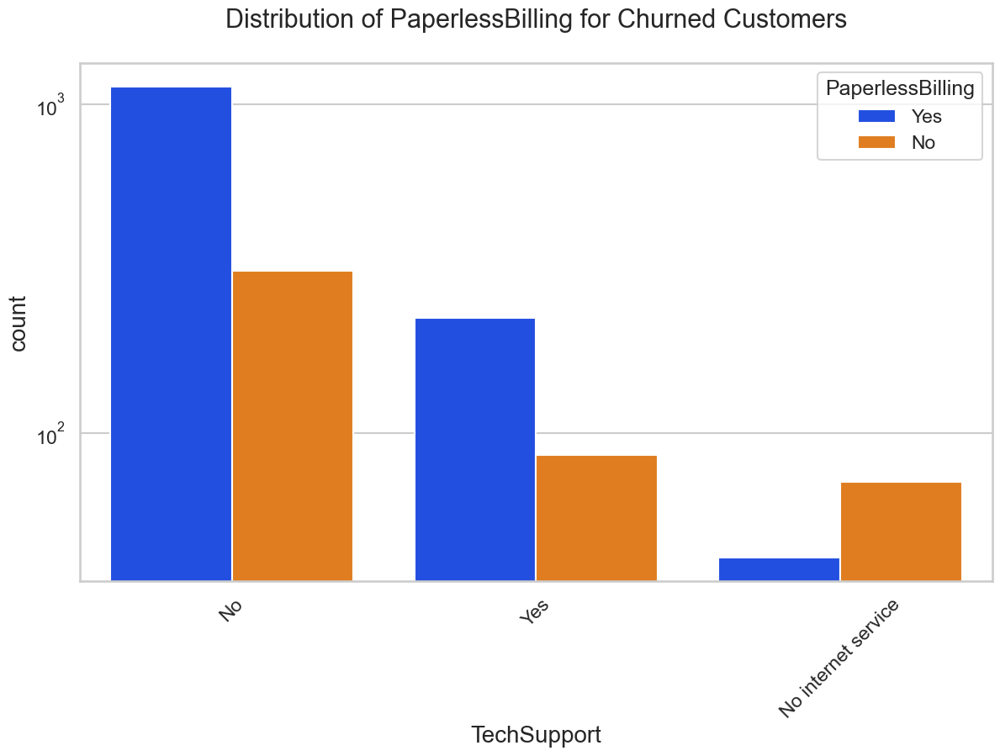

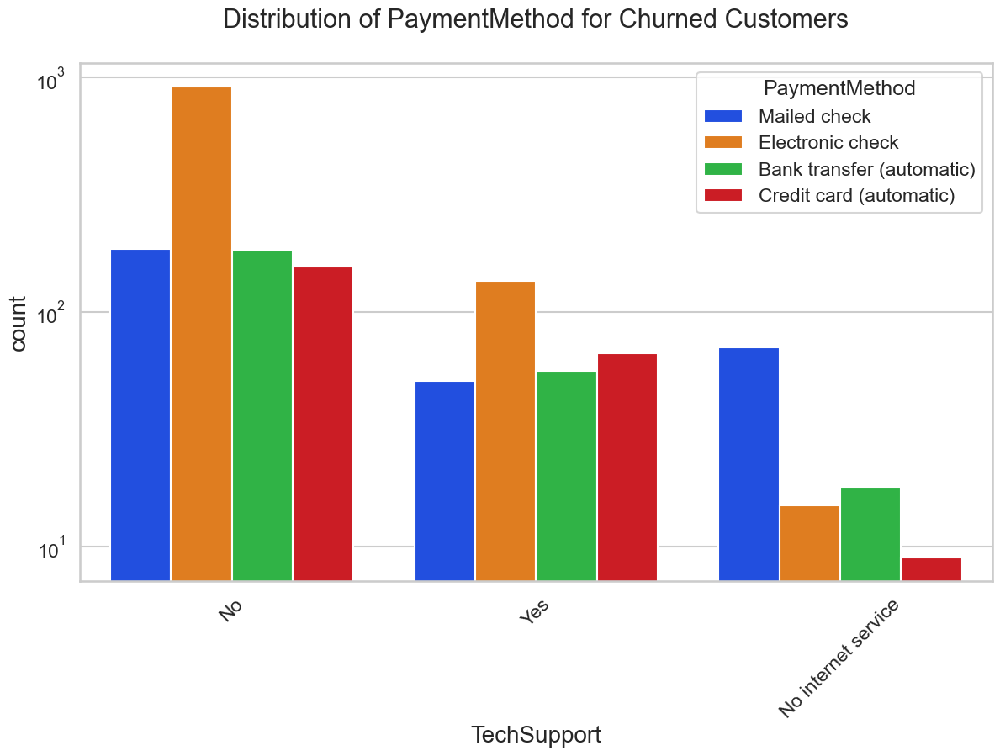

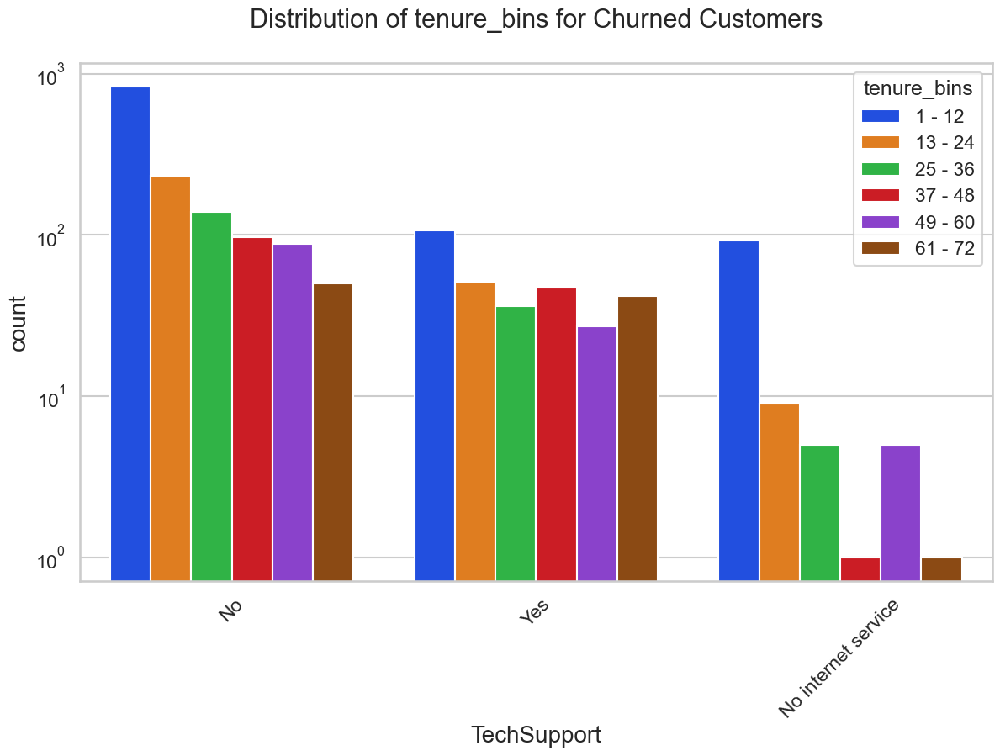

In [275]:
for col in colns:    
    uniplot(target_1,col='TechSupport',title=f'Distribution of {col} for Churned Customers',hue=col)

Intuition with Tech Support:
- Females with tech support more likely to churn compared to males with tech support
- regardless of tech support if multiple lines being yes then churn high
- ppl with tech support and streaming services have high churn

Streaming TV

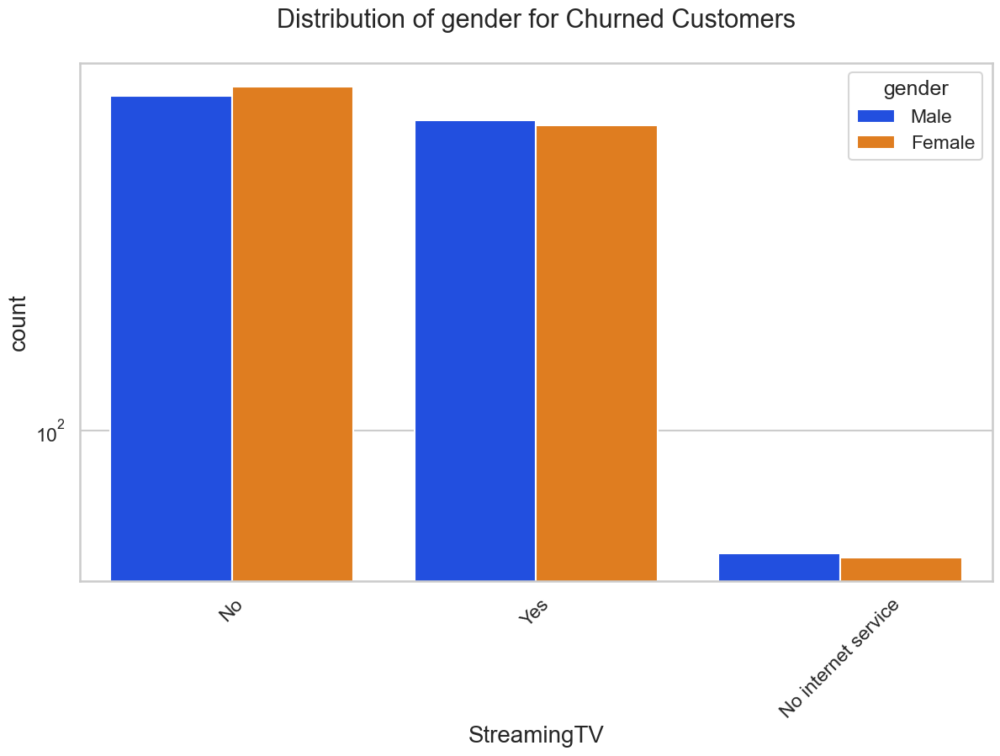

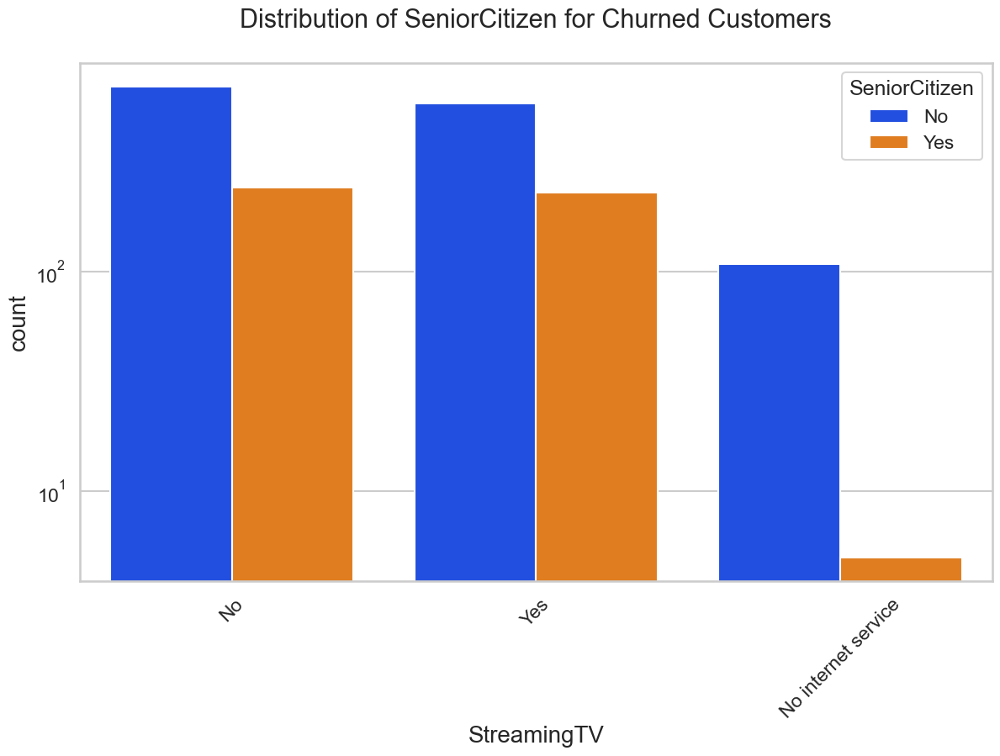

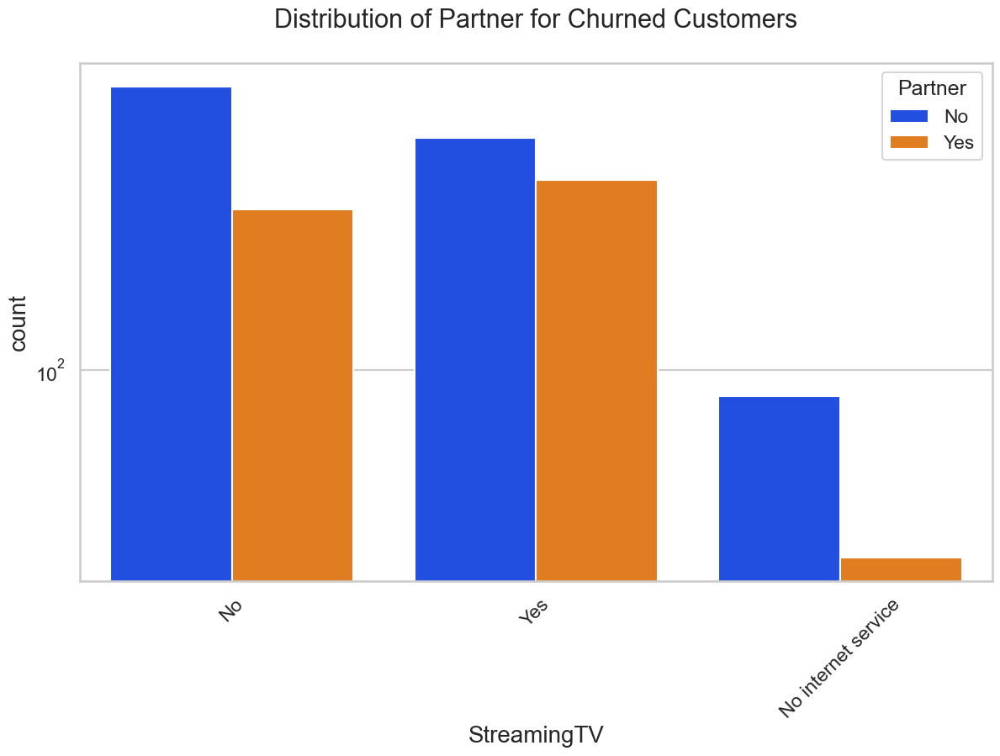

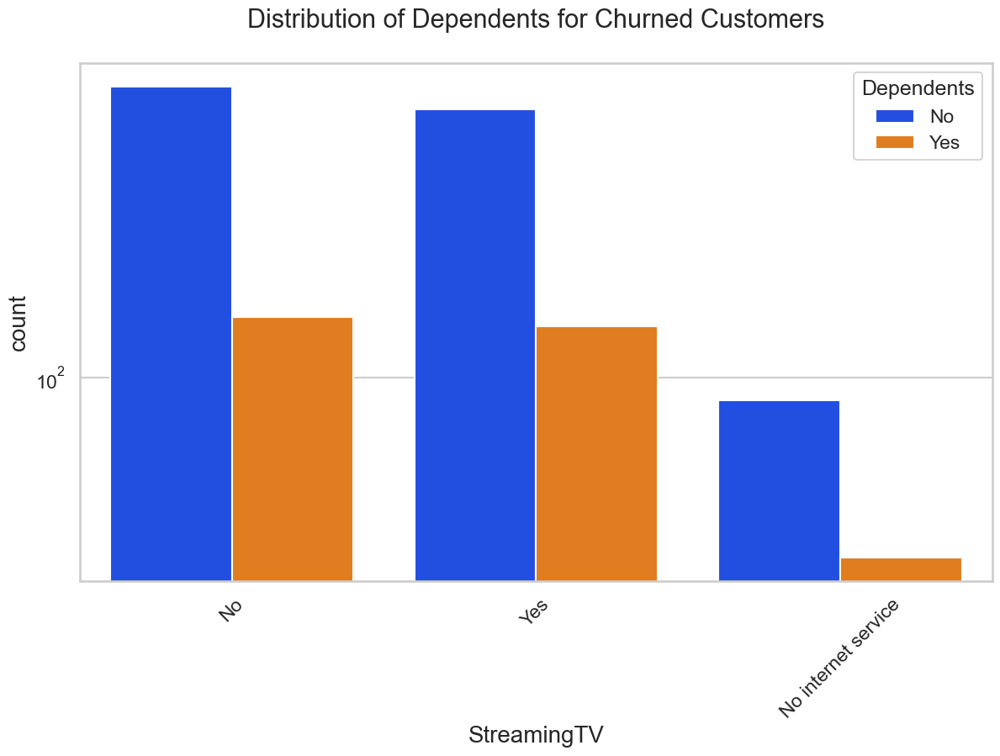

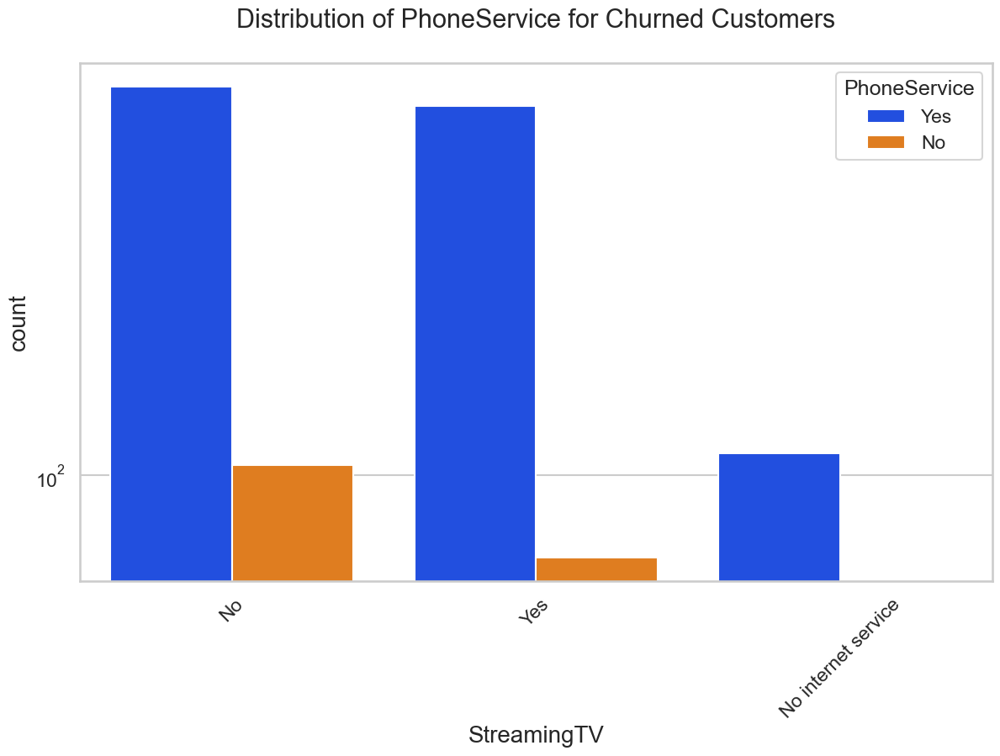

...

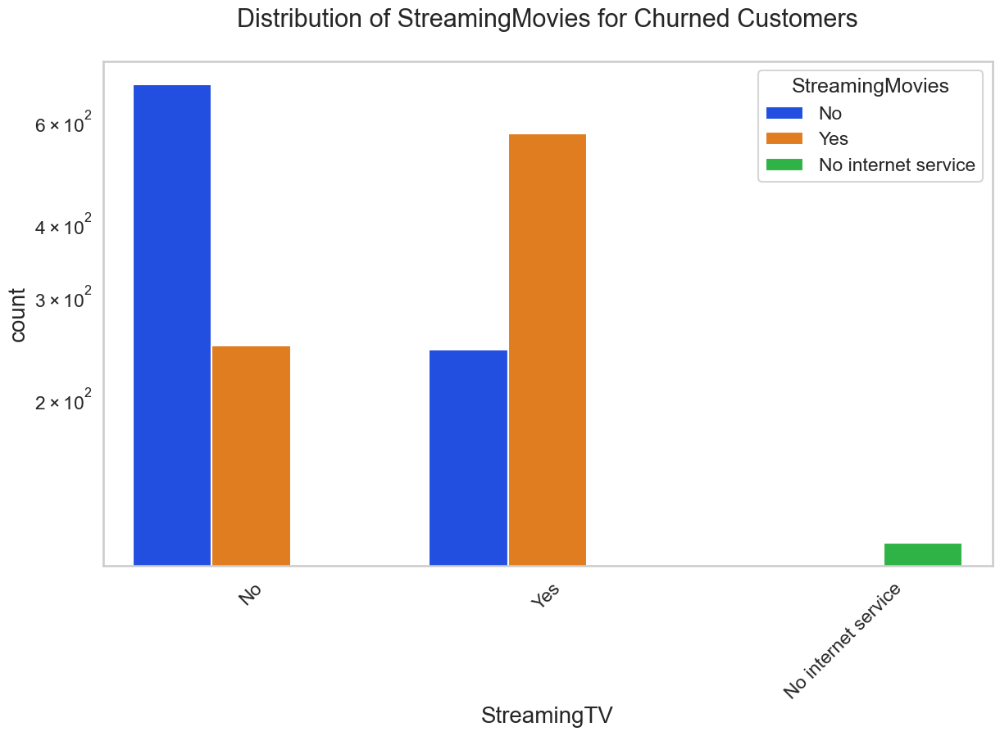

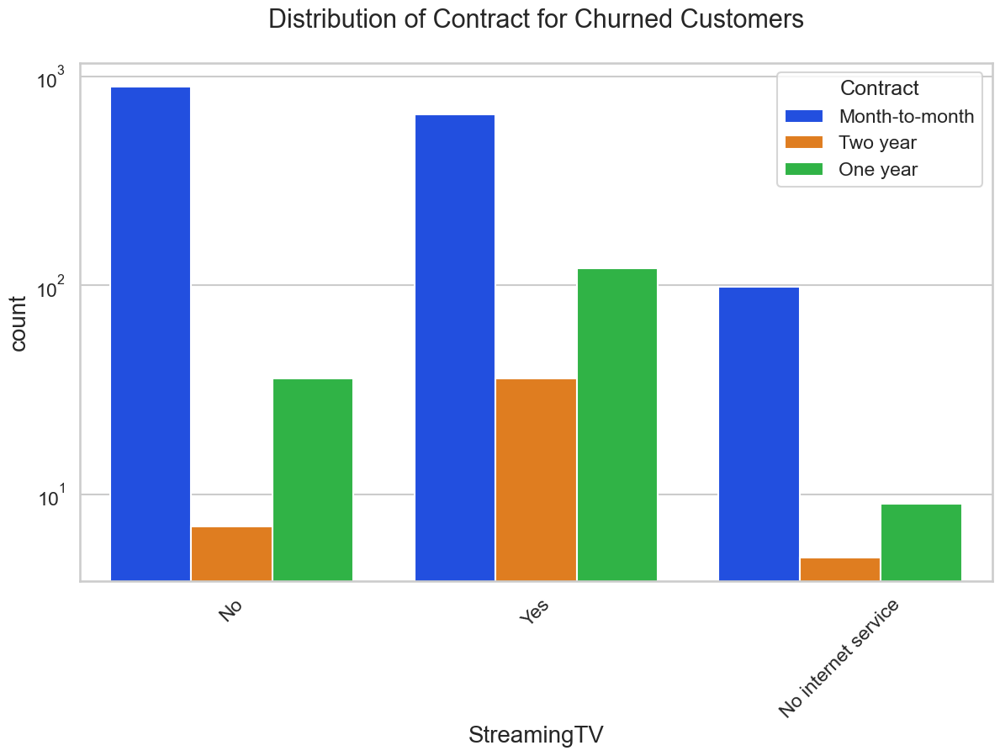

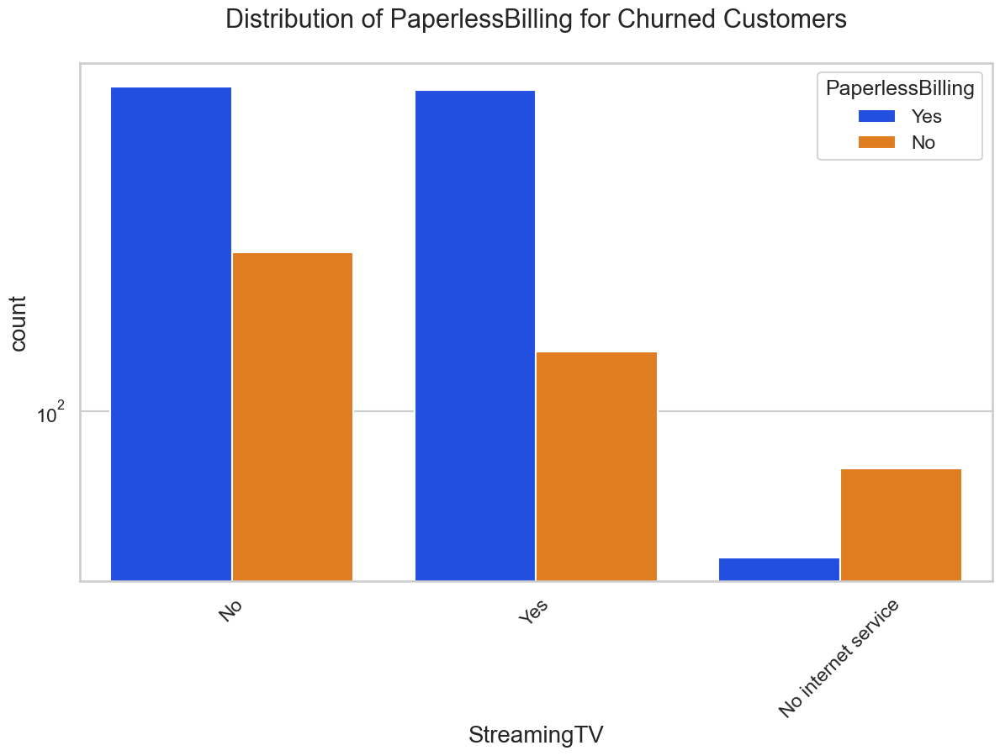

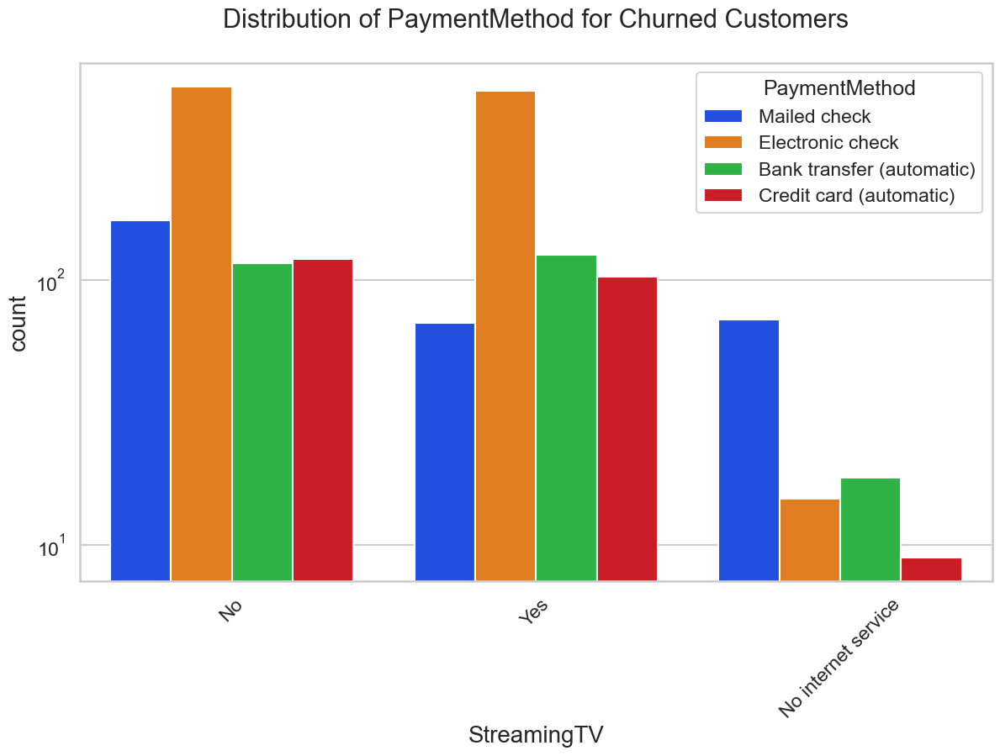

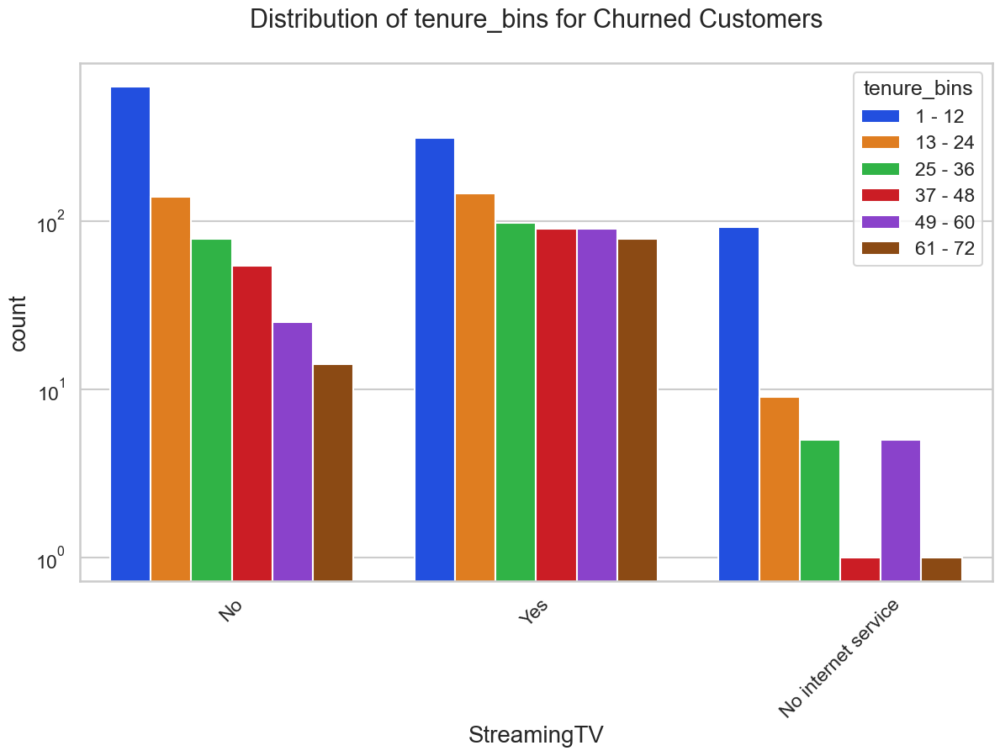

In [276]:
for col in colns:    
    uniplot(target_1,col='StreamingTV',title=f'Distribution of {col} for Churned Customers',hue=col)

Insights from Streaming TV:
- females with streaming tv and males without streaming tv more likely to churn
- ppl with multiple lines and streaming tv more likely to churn
- ppl with streaming tv and movies highly likely to churn

Streaming Movies

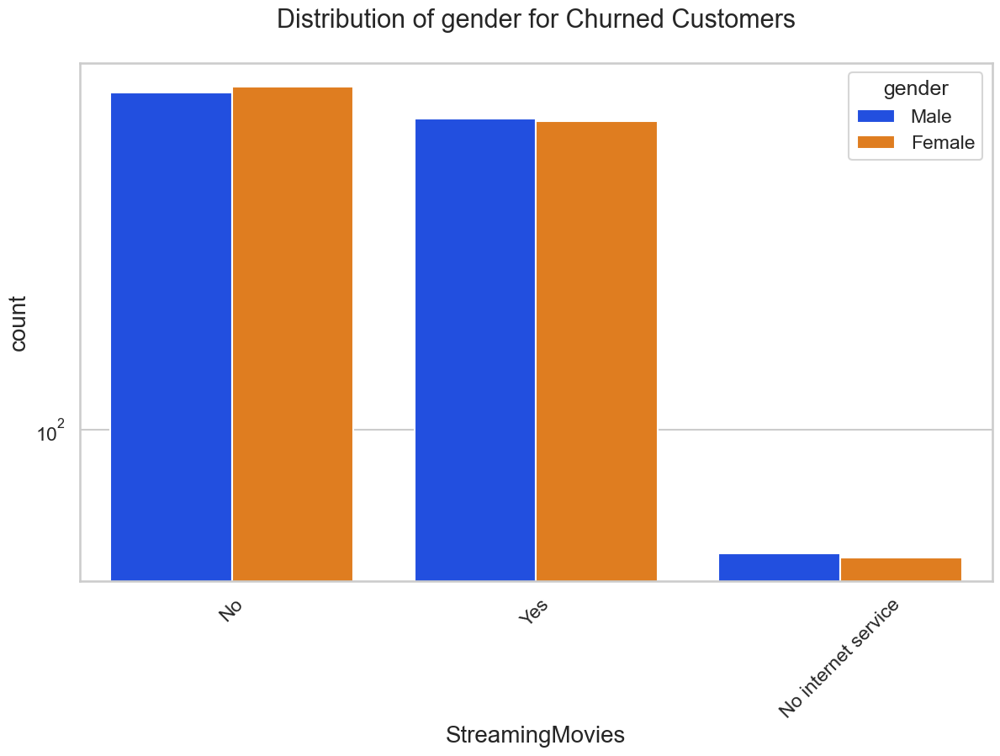

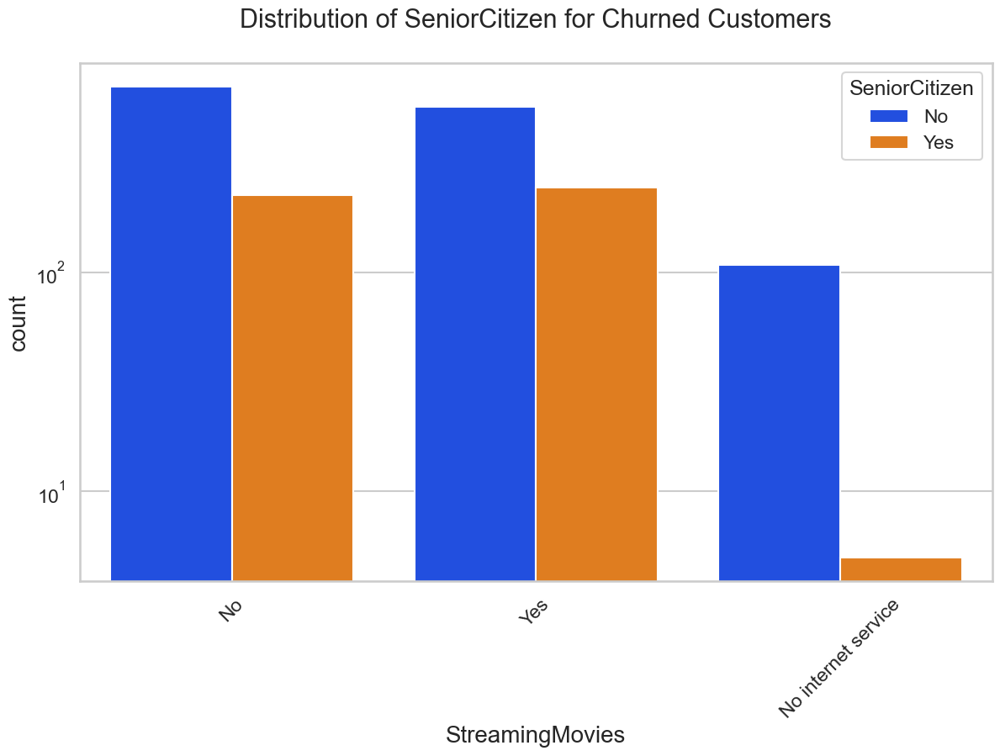

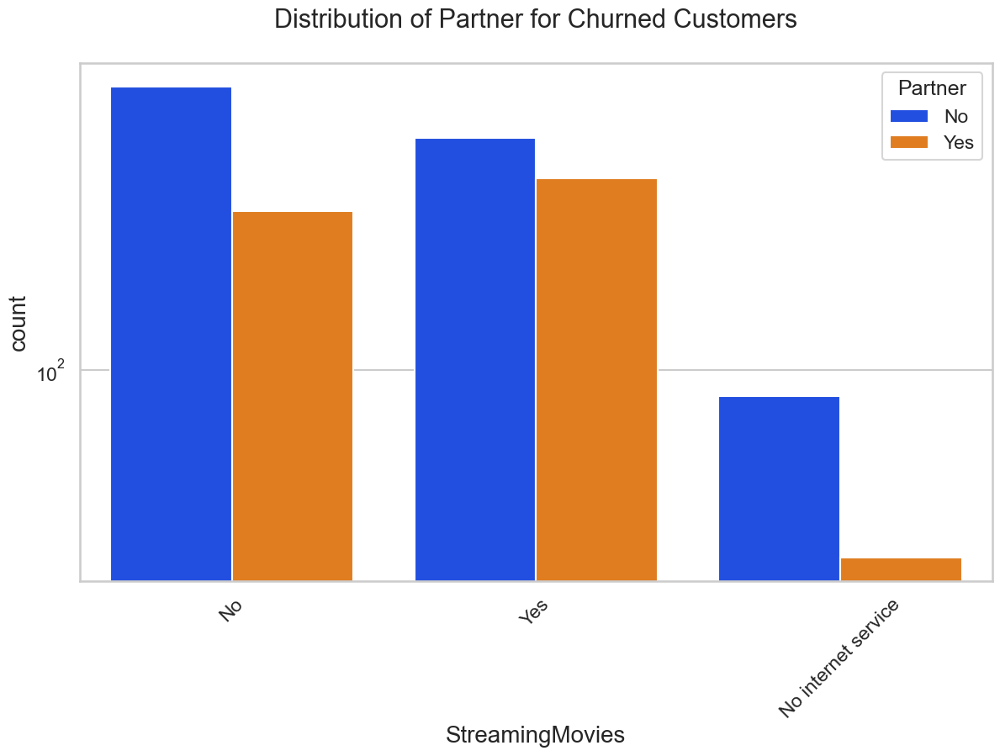

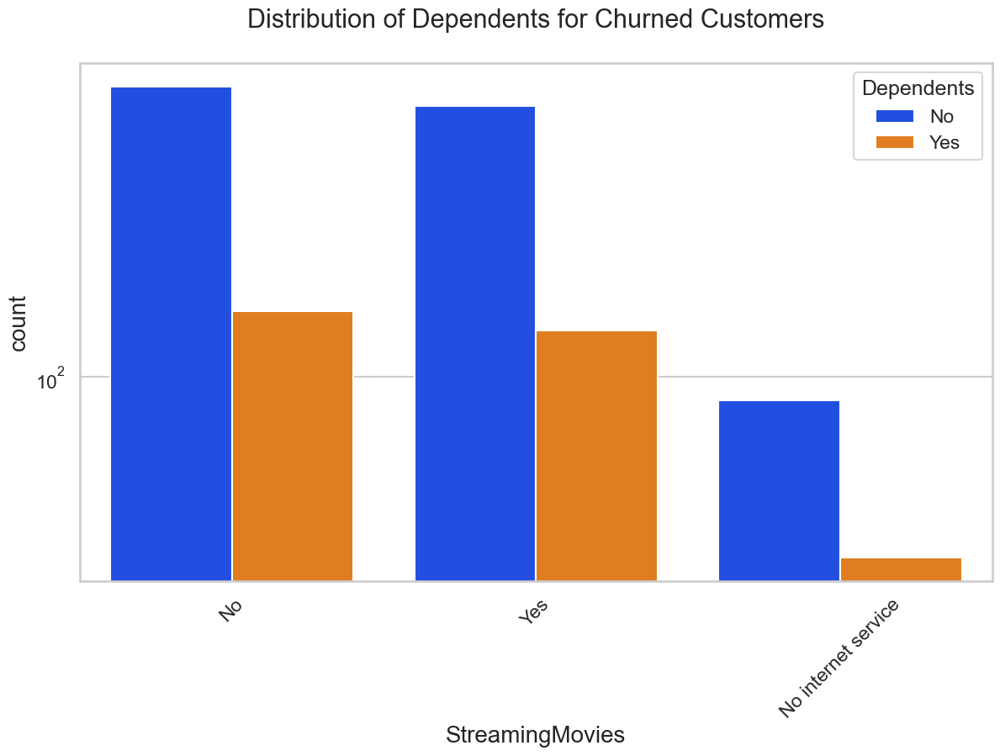

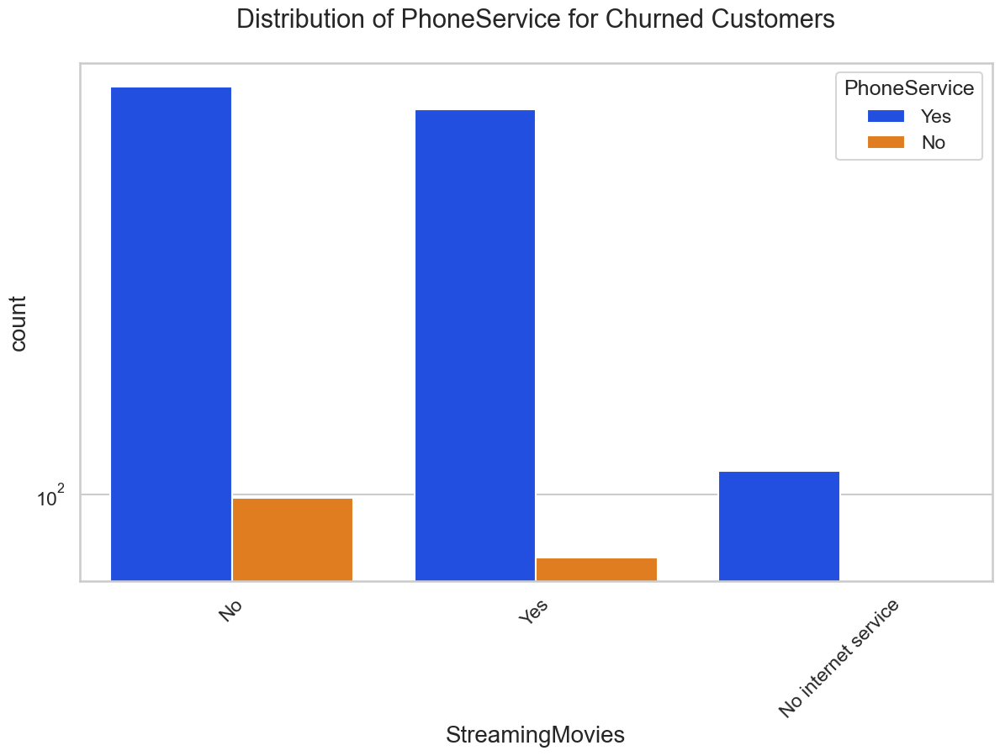

...

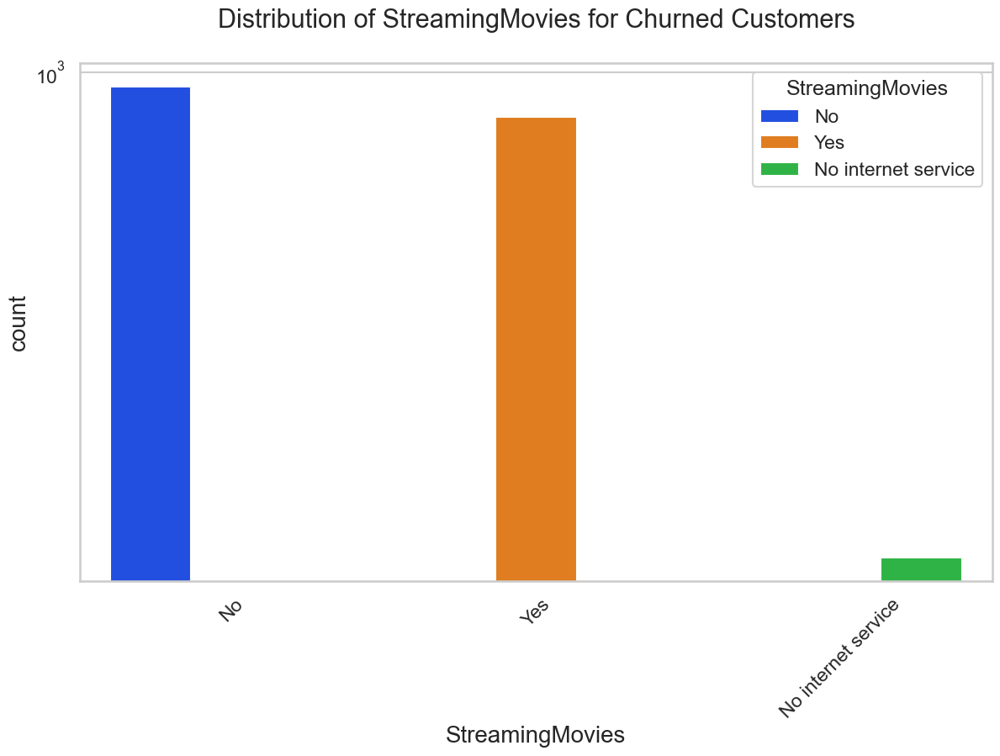

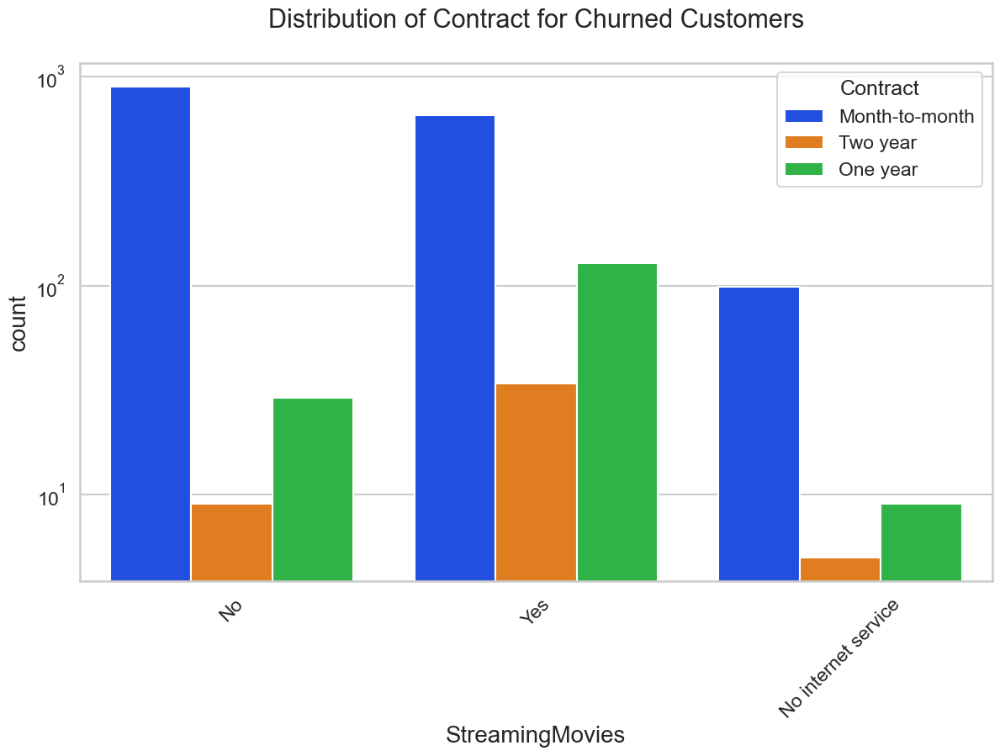

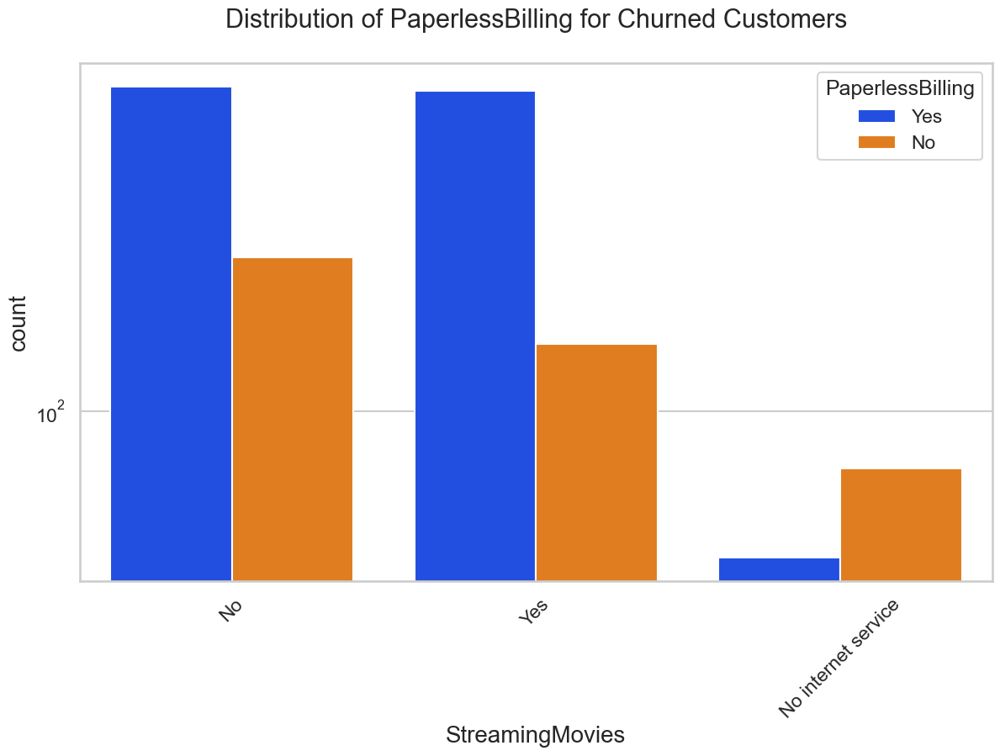

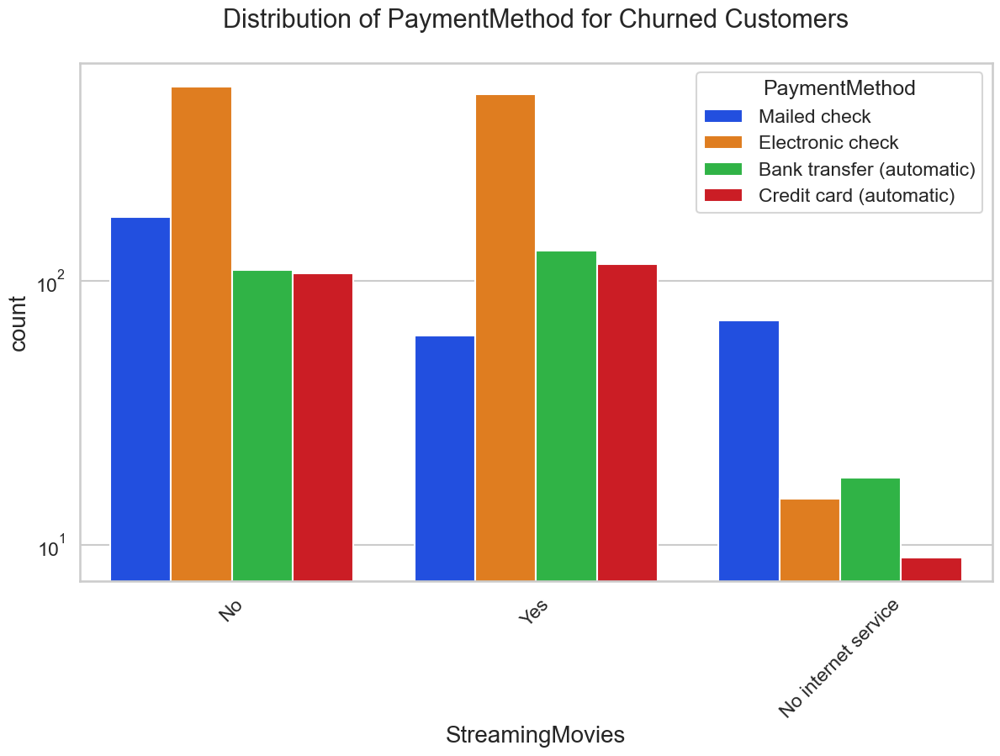

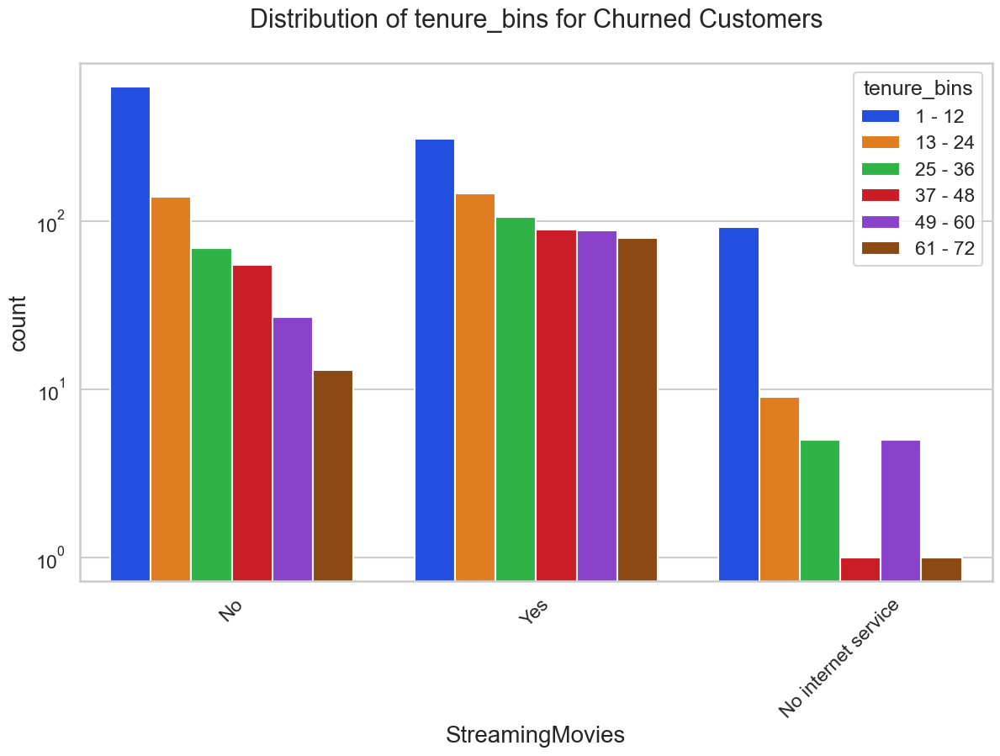

In [277]:
for col in colns:    
    uniplot(target_1,col='StreamingMovies',title=f'Distribution of {col} for Churned Customers',hue=col)

Insights from streaming movies:
- females without streaming movies and males with streaming movies more likely to churn
- ppl with multiple lines and streaming movies more likely to churn

Contract

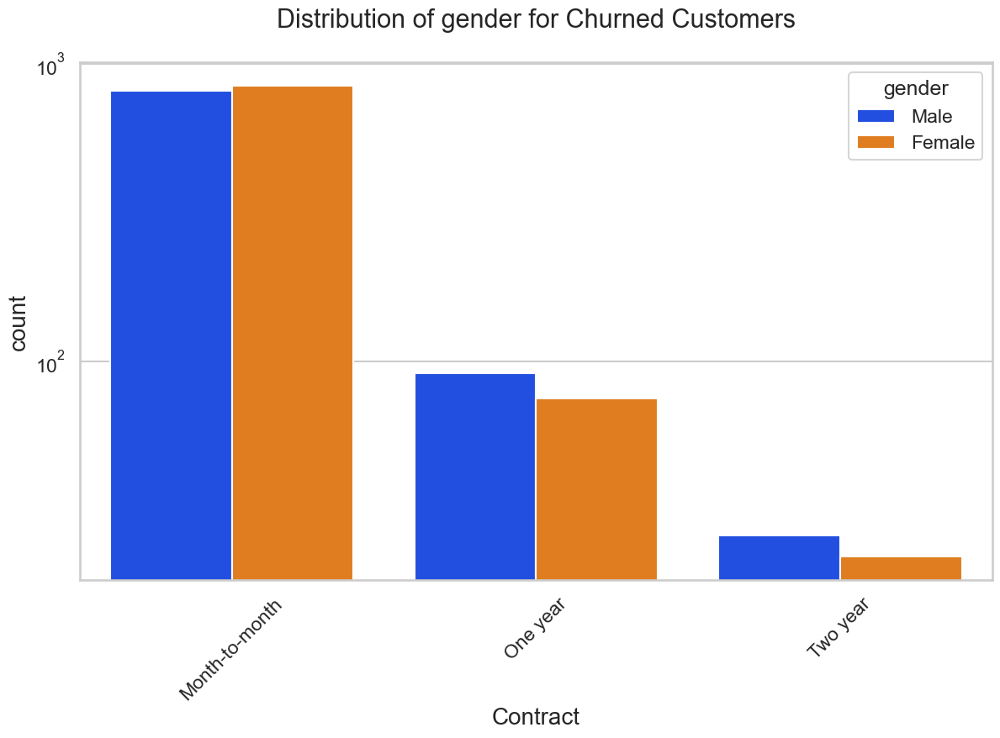

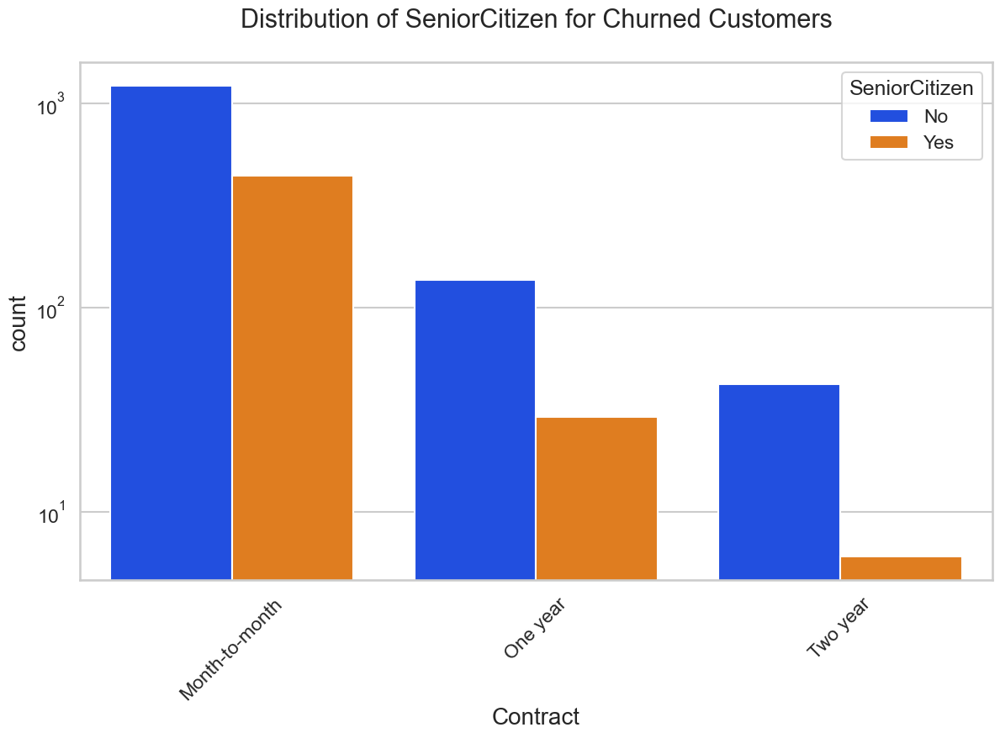

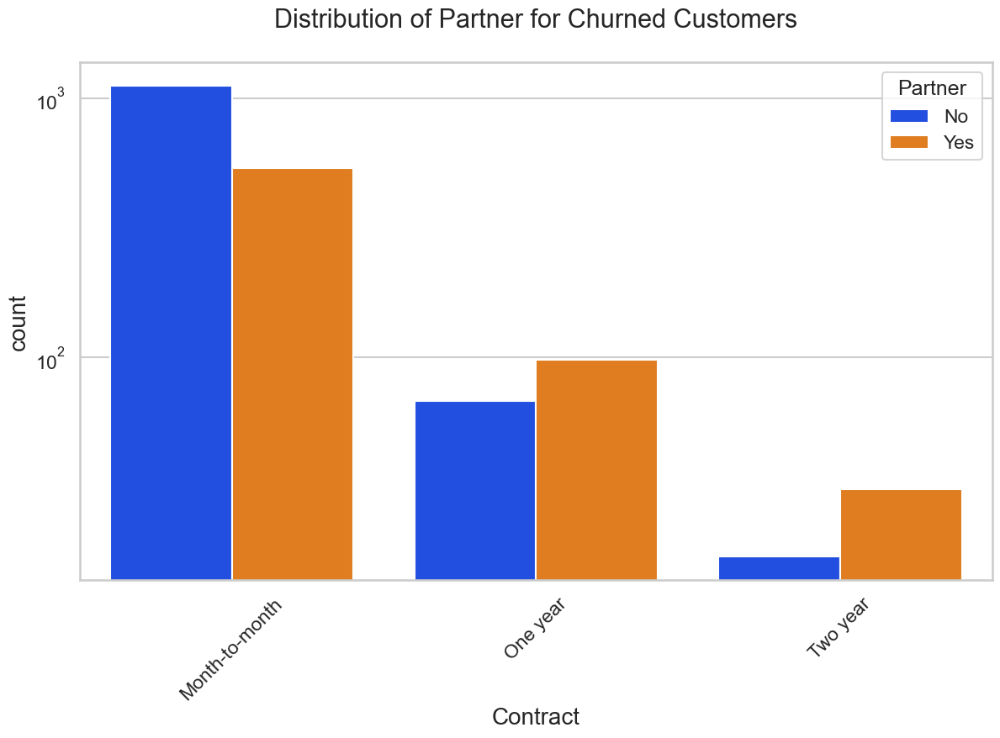

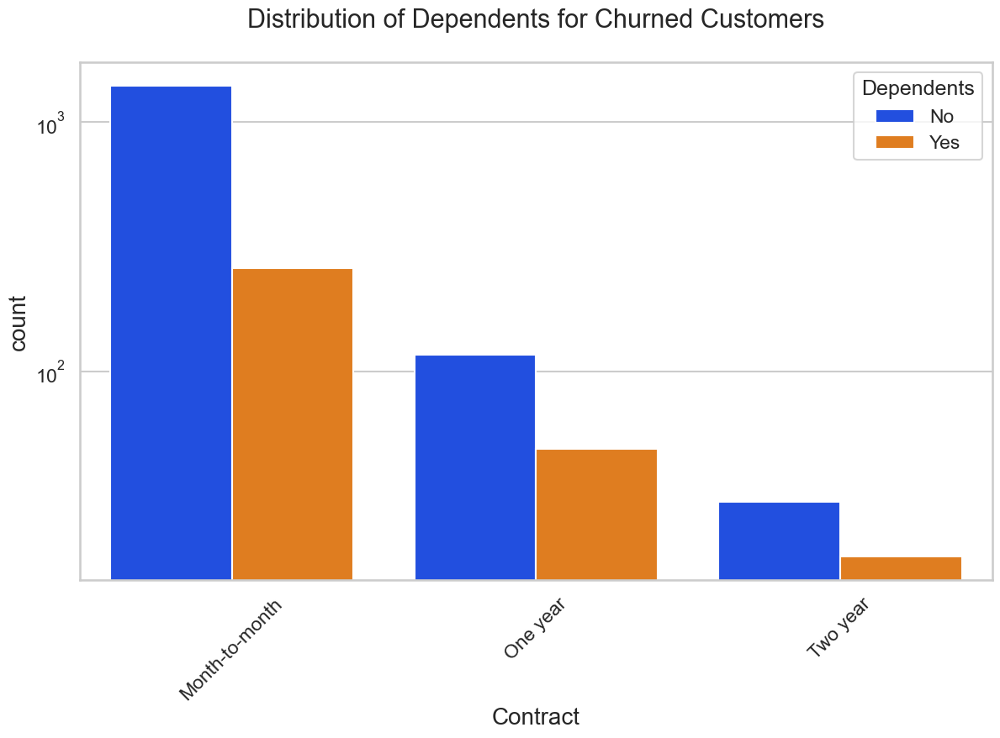

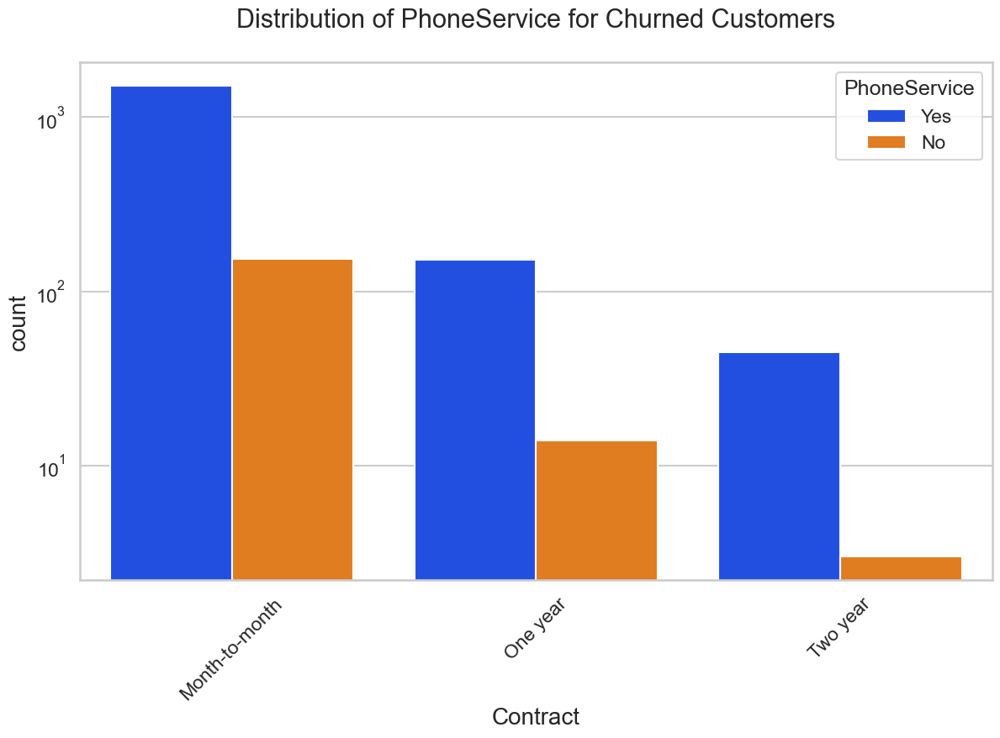

...

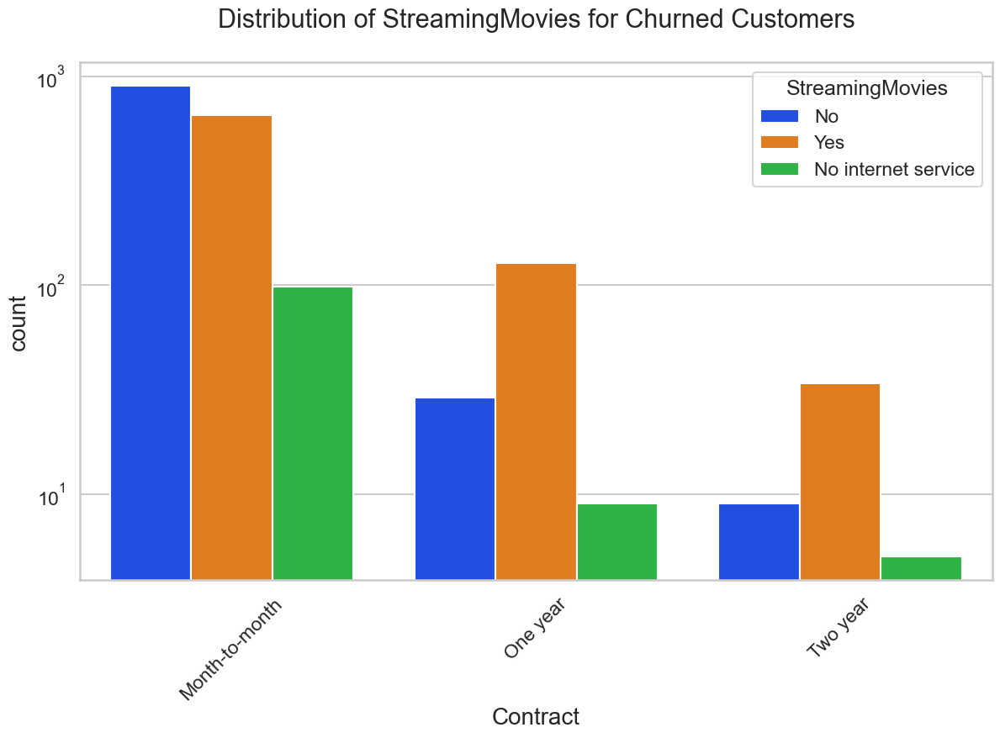

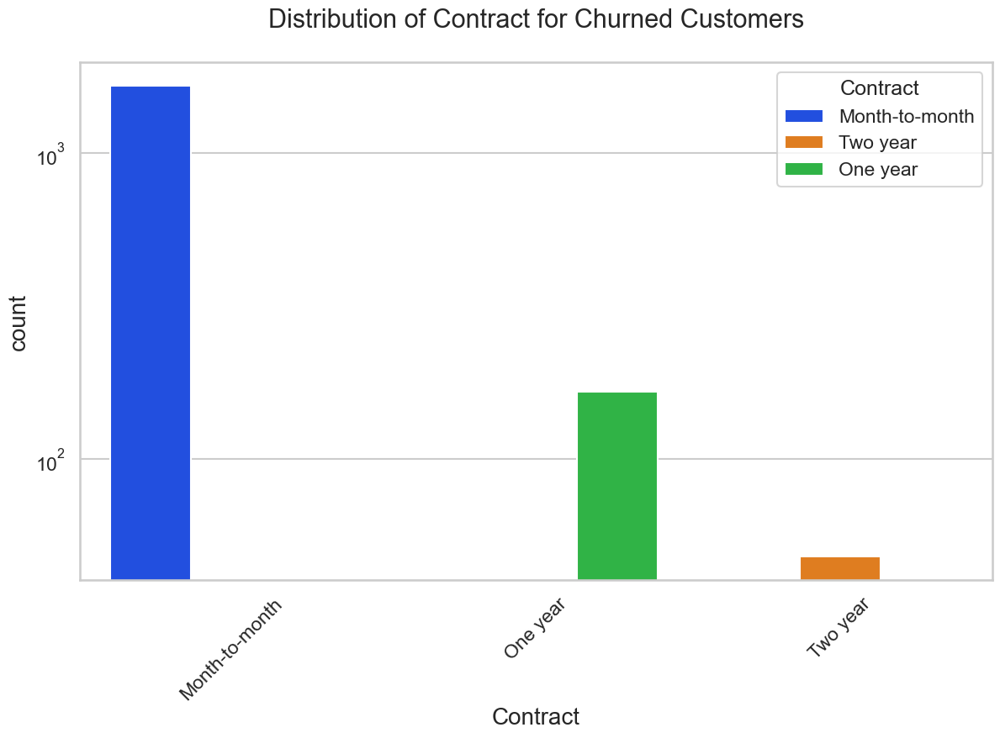

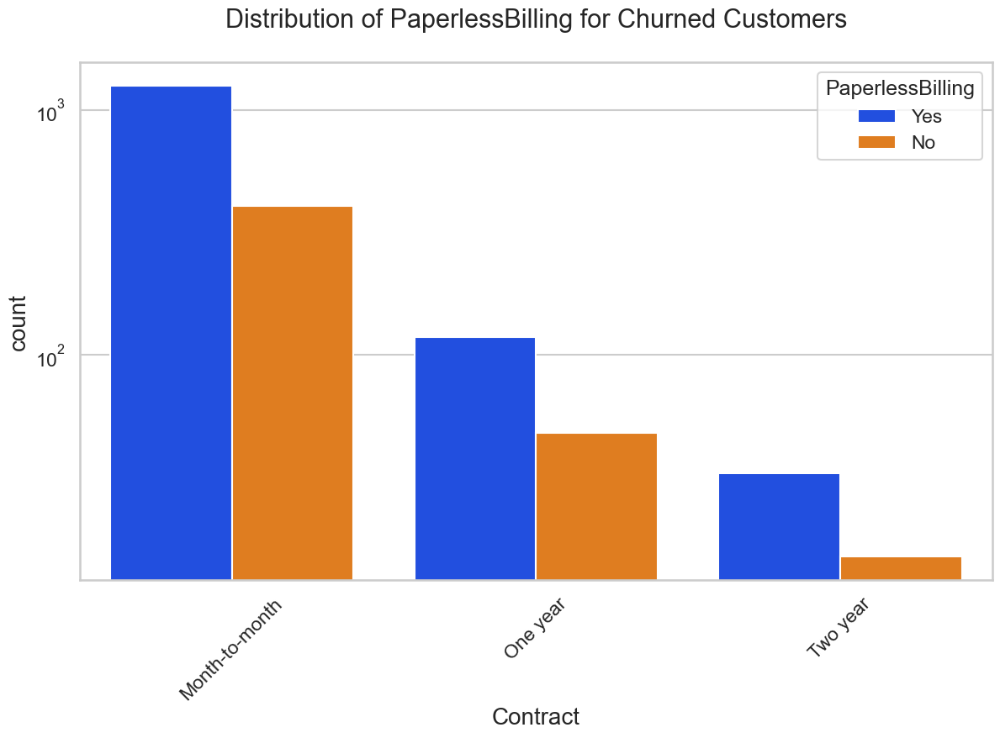

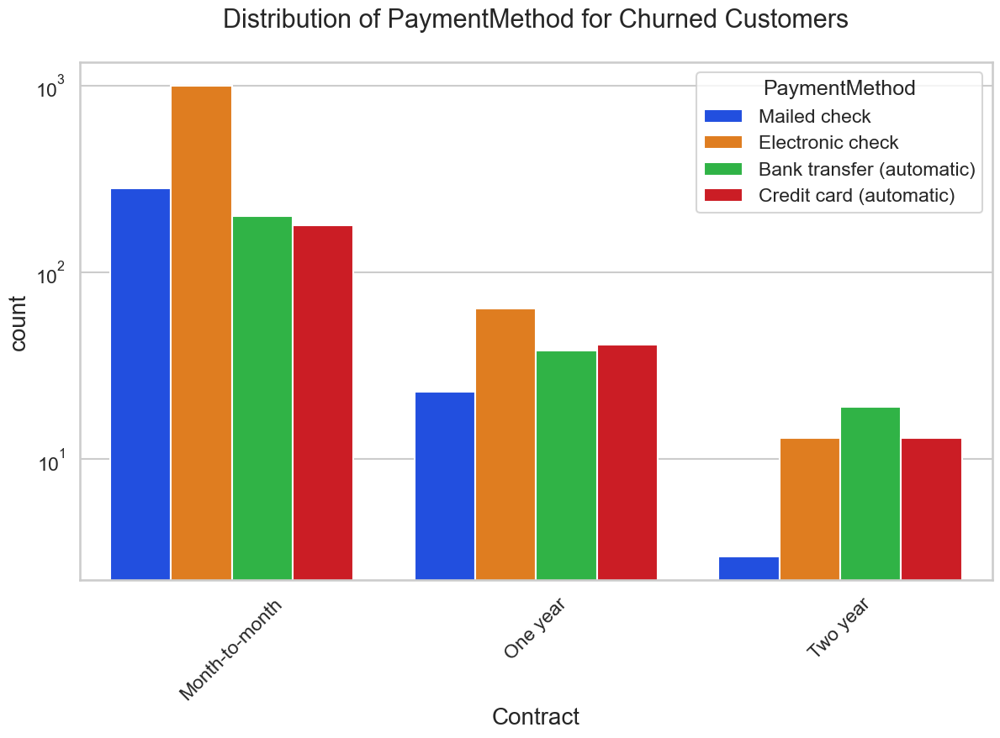

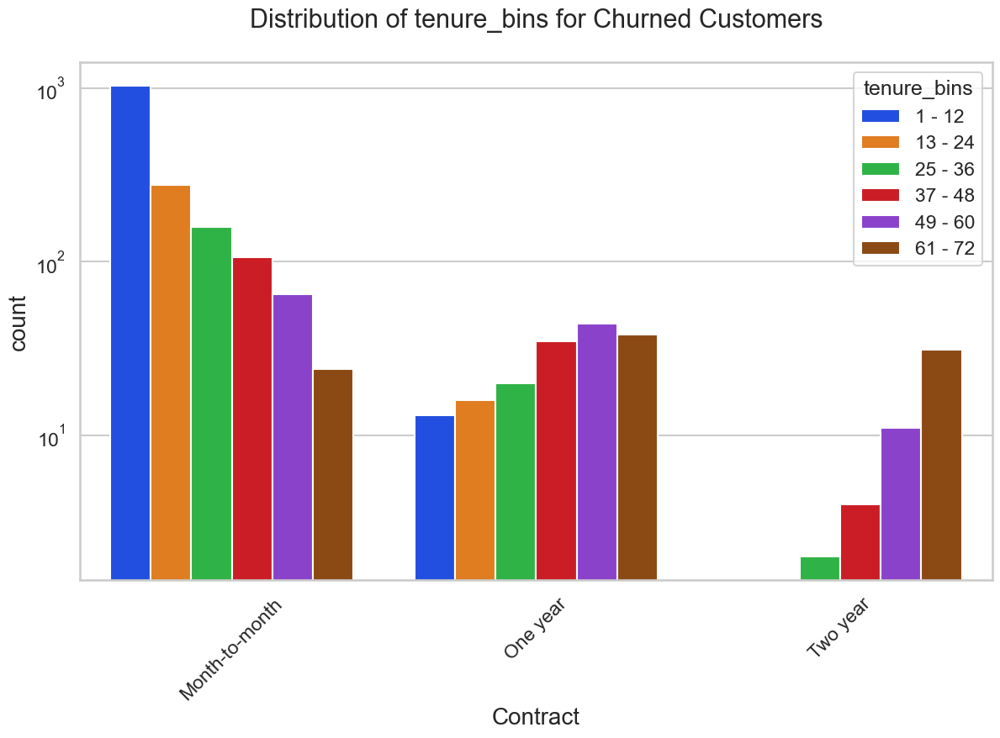

In [278]:
for col in colns:    
    uniplot(target_1,col='Contract',title=f'Distribution of {col} for Churned Customers',hue=col)

Insights from Contract:
- females with month-to-month and males with one-yr contract likely to churn
- ppl with partners and one yr contract likely to churn
- ppl with multiple lines and one yr contract likely to churn
- ppl with month-to-month contract and no online backup more likely to churn
- ppl with device protection and one yr of contract more likely to churn
- ppl with 1yr contract and streaming services more likely to churn
- ppl with 2yr contract and bank transfer more likely to churn
- ppl with 1yr contract more likely to churn on 49-60 months tenure and ppl with 2yr contract more likely to churn on 61-72 months tenure

Paperless Billing

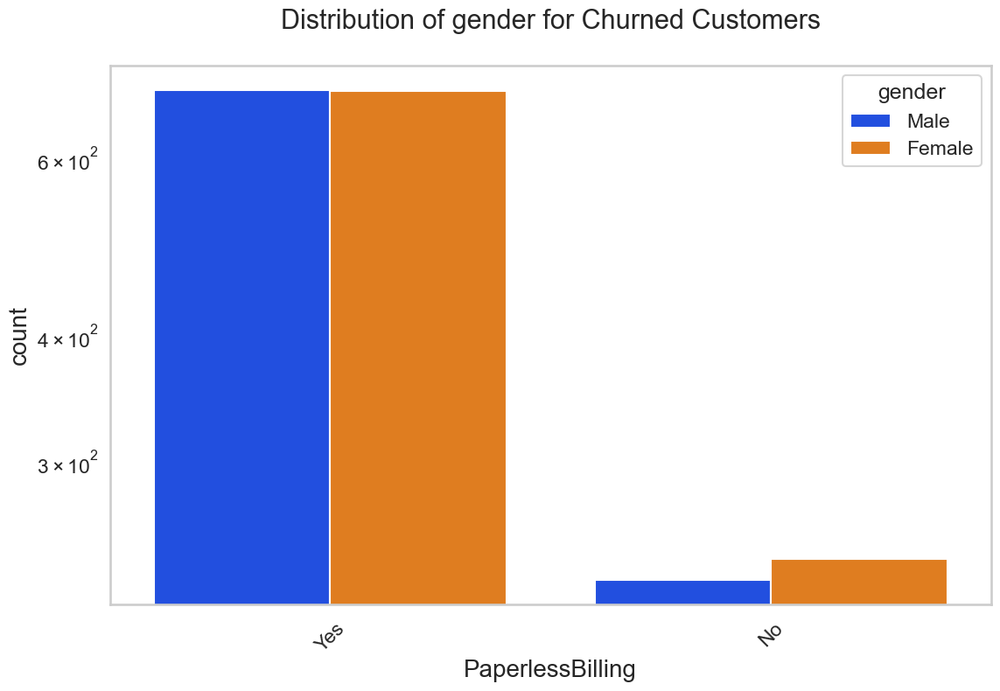

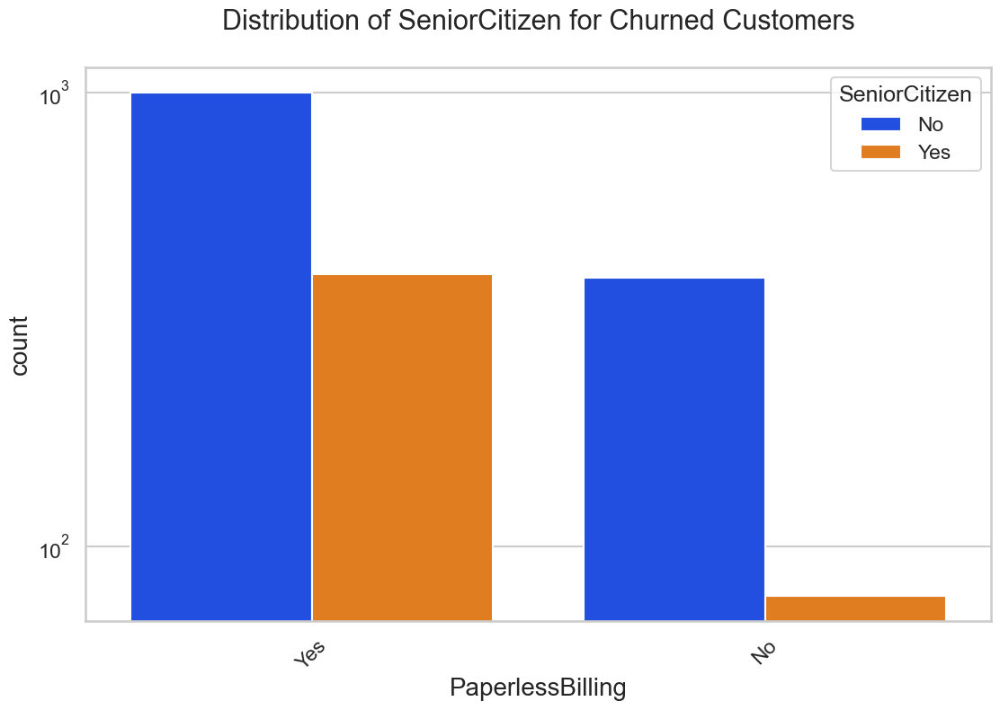

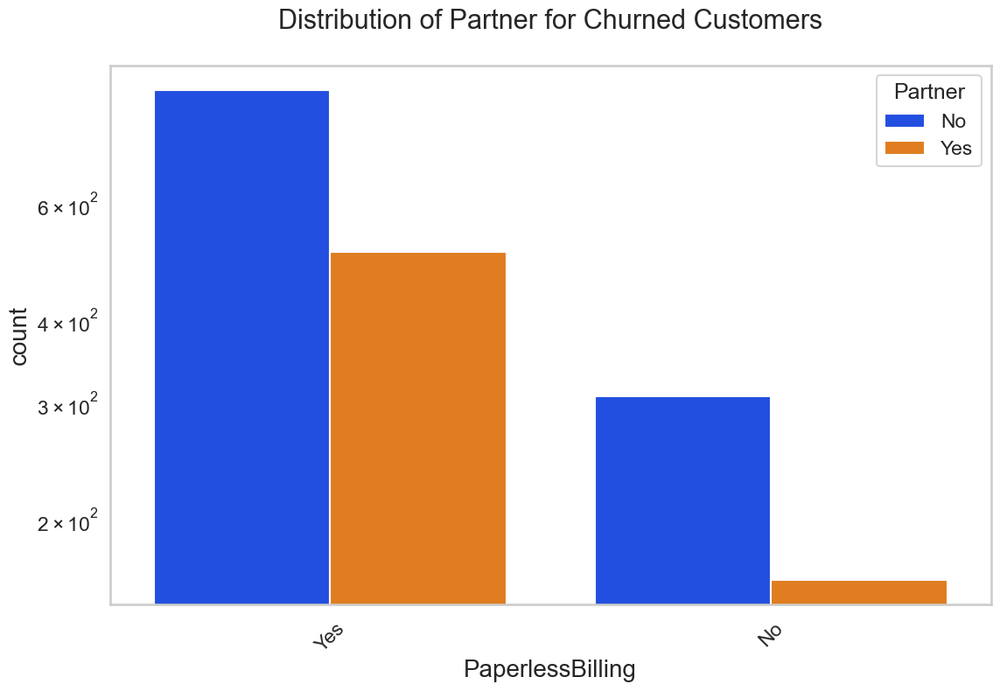

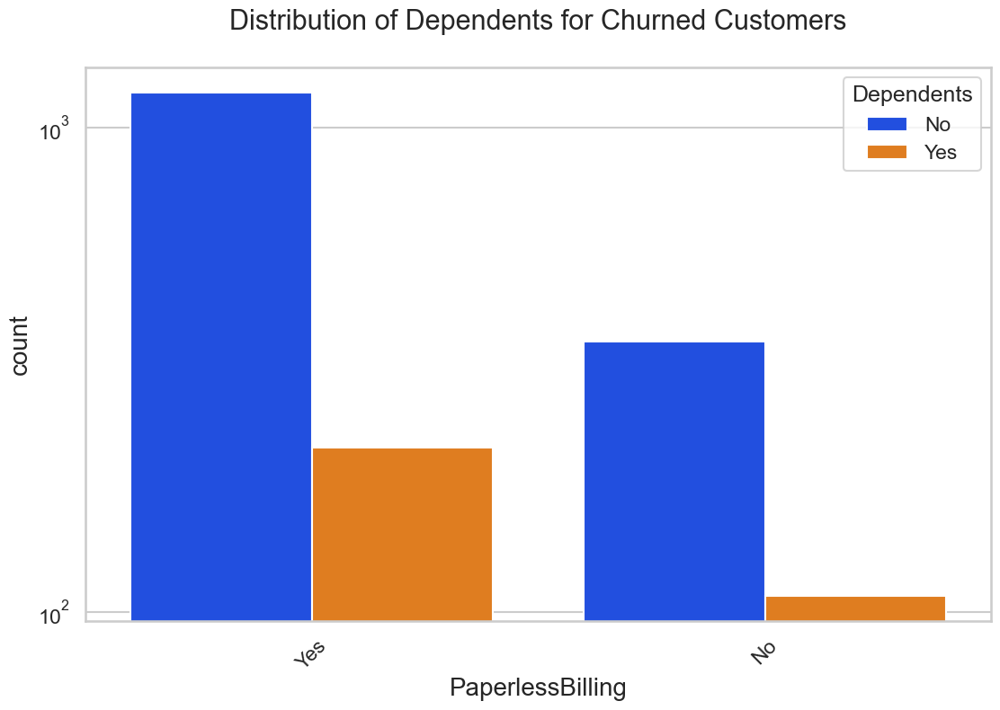

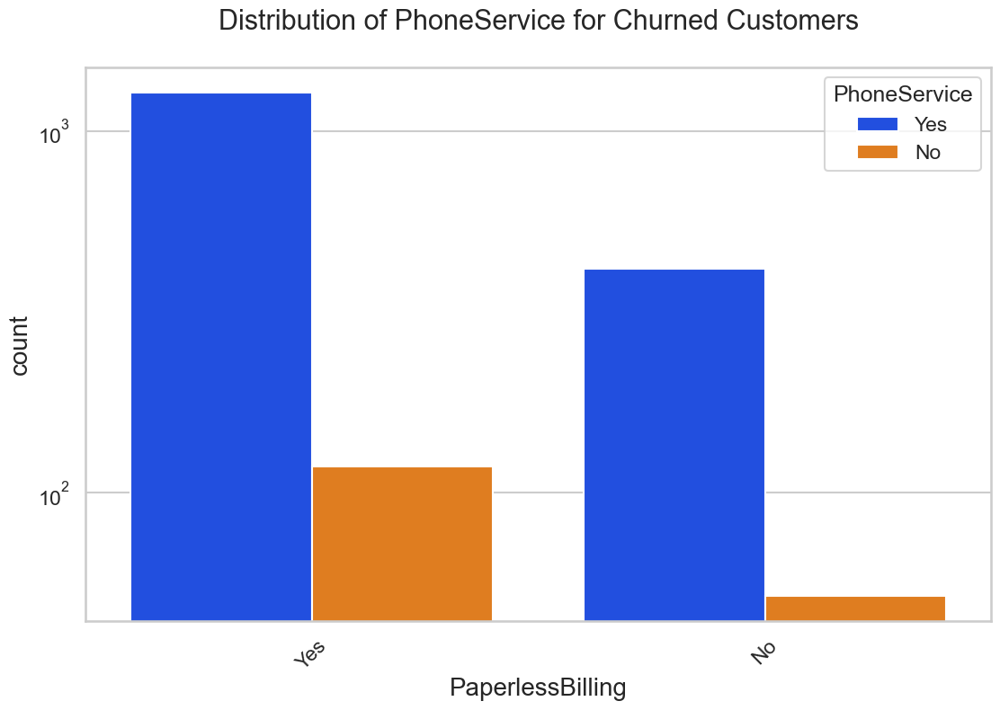

...

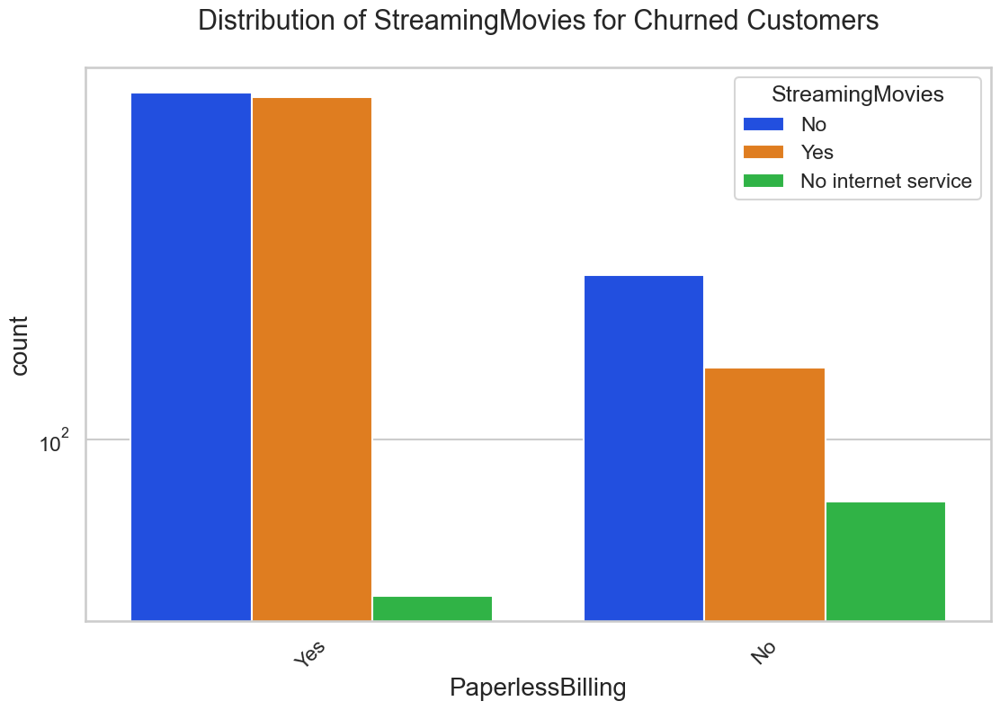

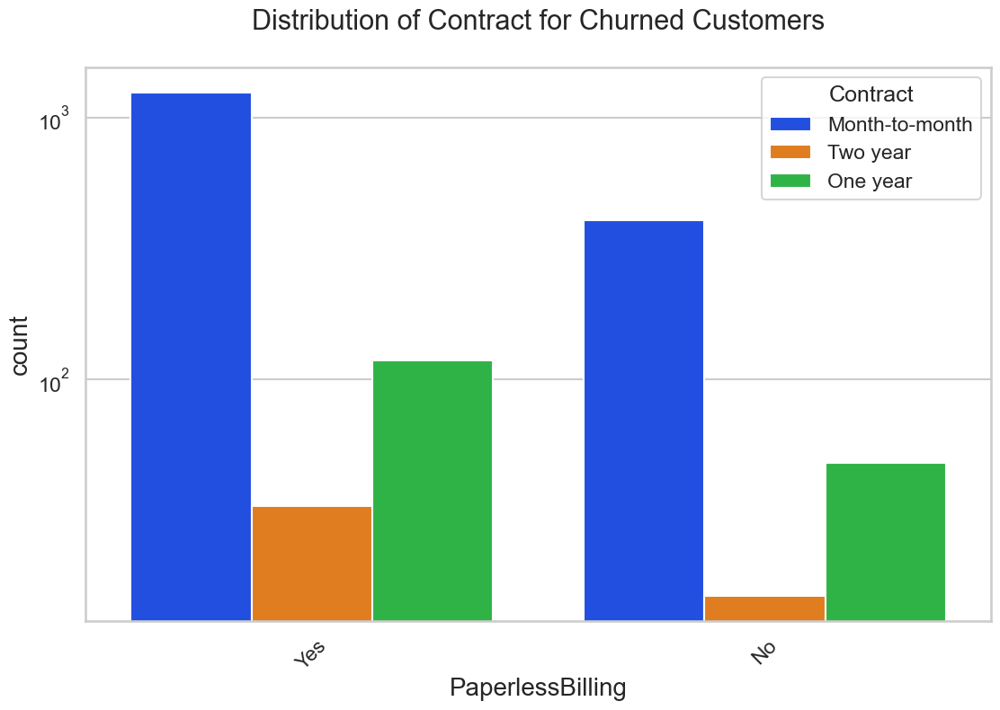

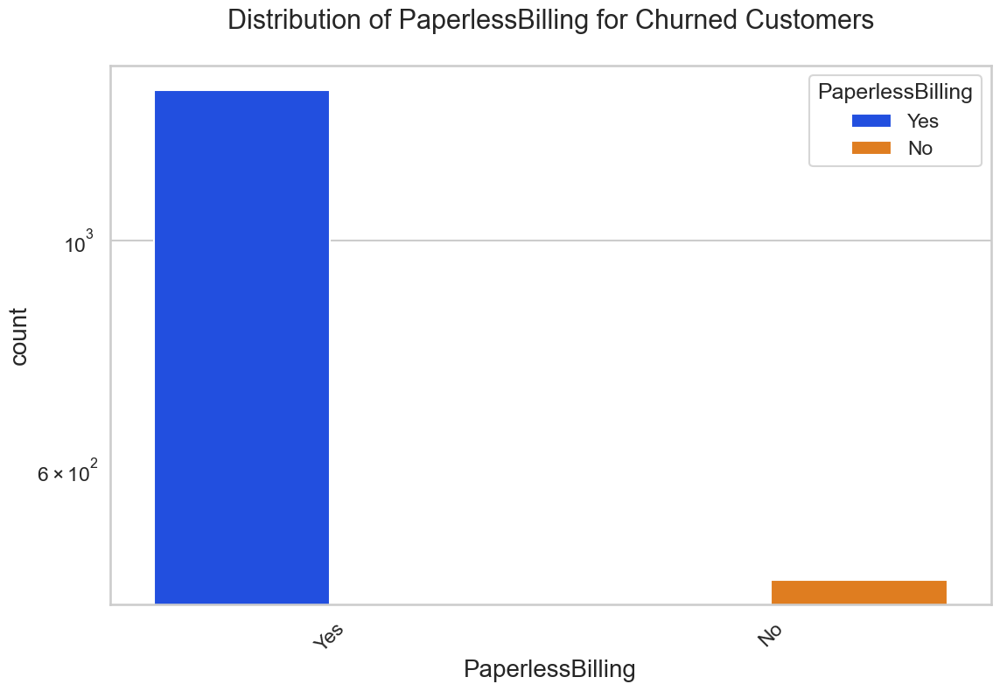

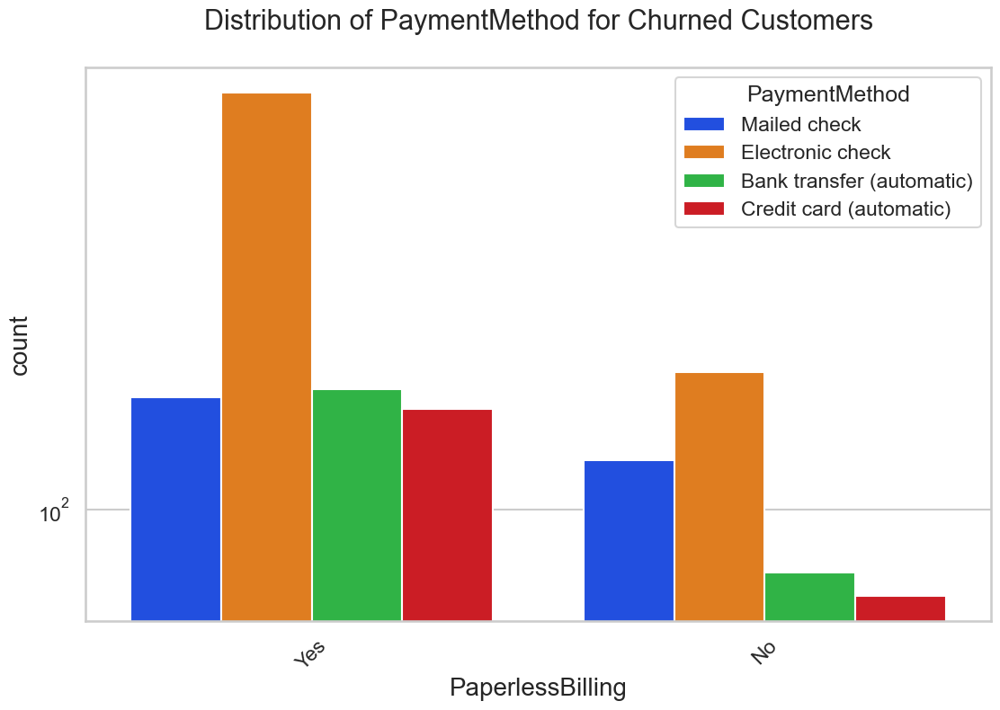

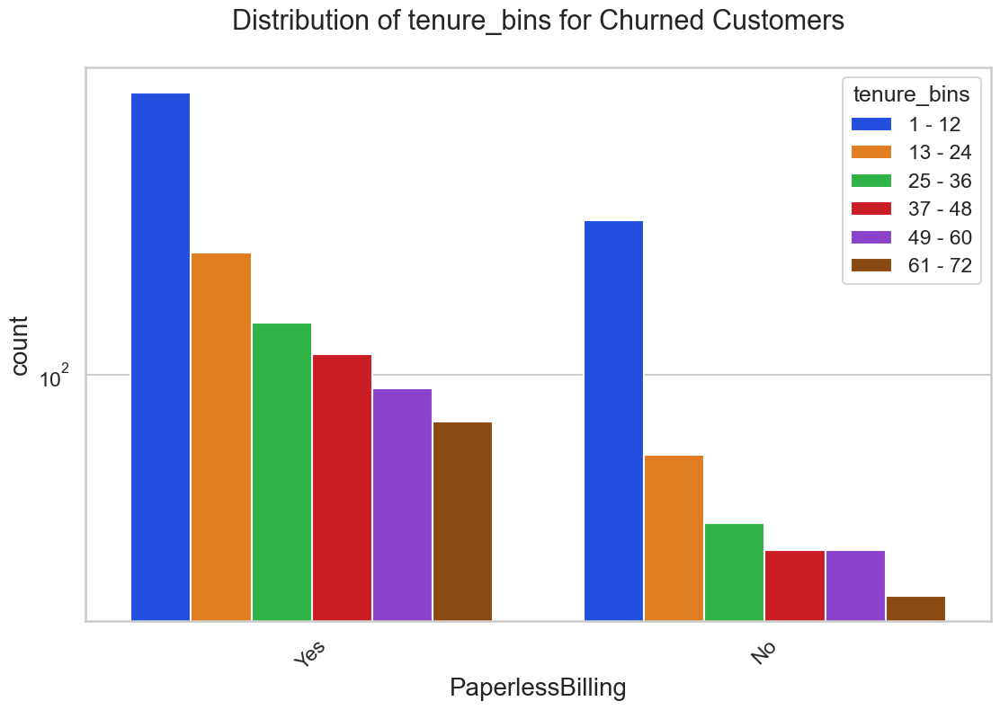

In [279]:
for col in colns:    
    uniplot(target_1,col='PaperlessBilling',title=f'Distribution of {col} for Churned Customers',hue=col)

Insights from Paperless billing:
- females with no paperless billing more likely to churn
- ppl with multiple lines and paperless billing are likely to churn
- ppl with streaming services and paperless billing more likely to  churn

Payment Method

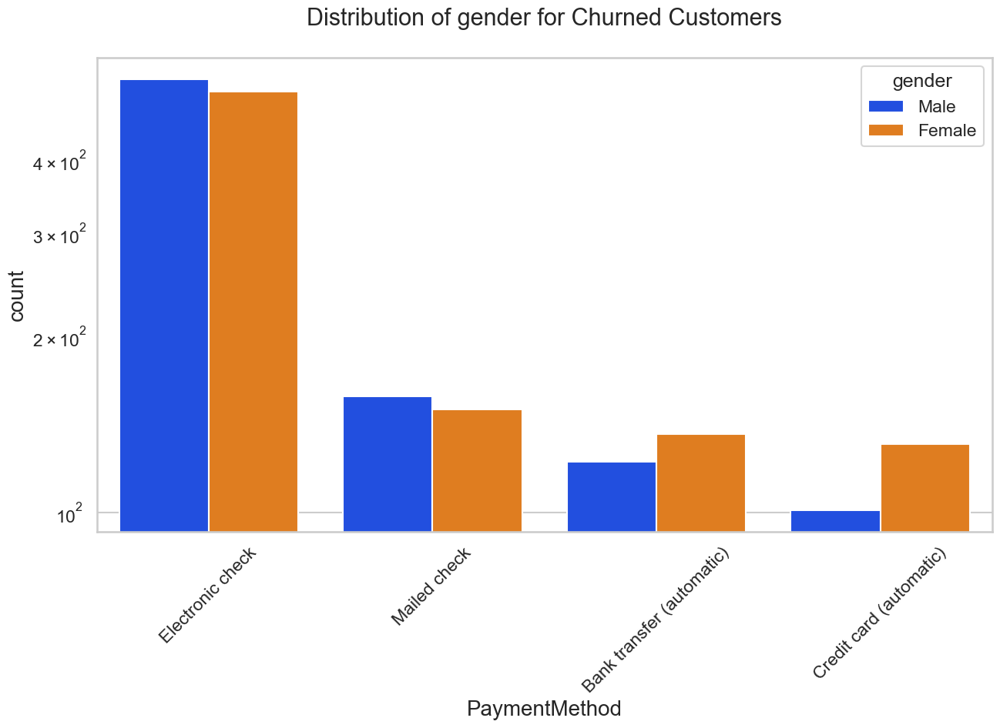

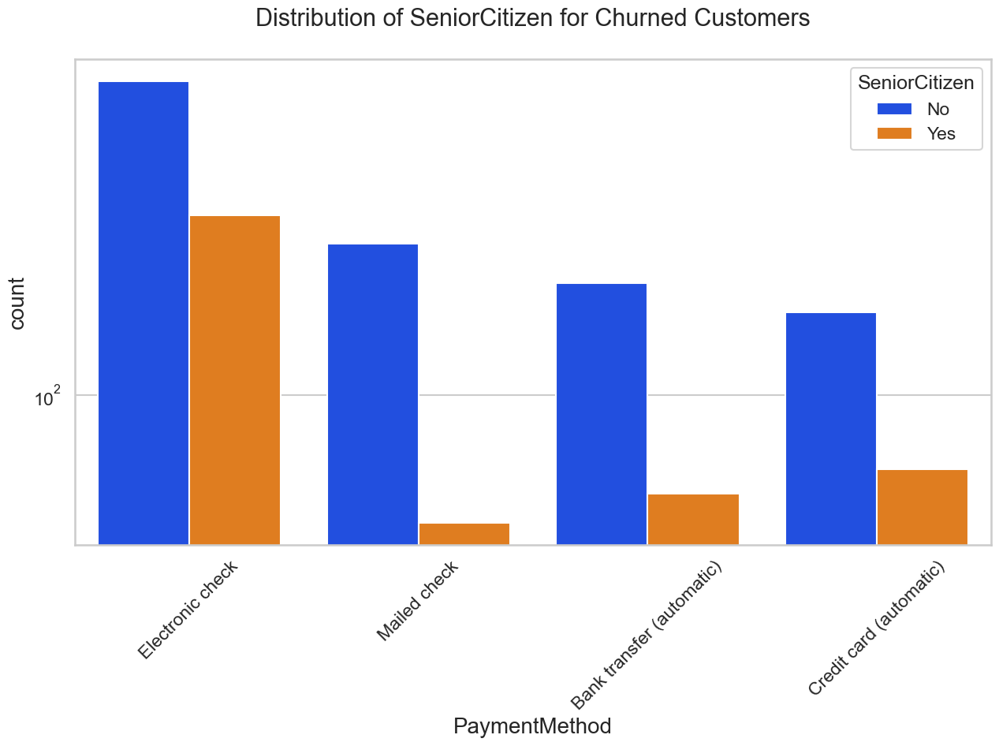

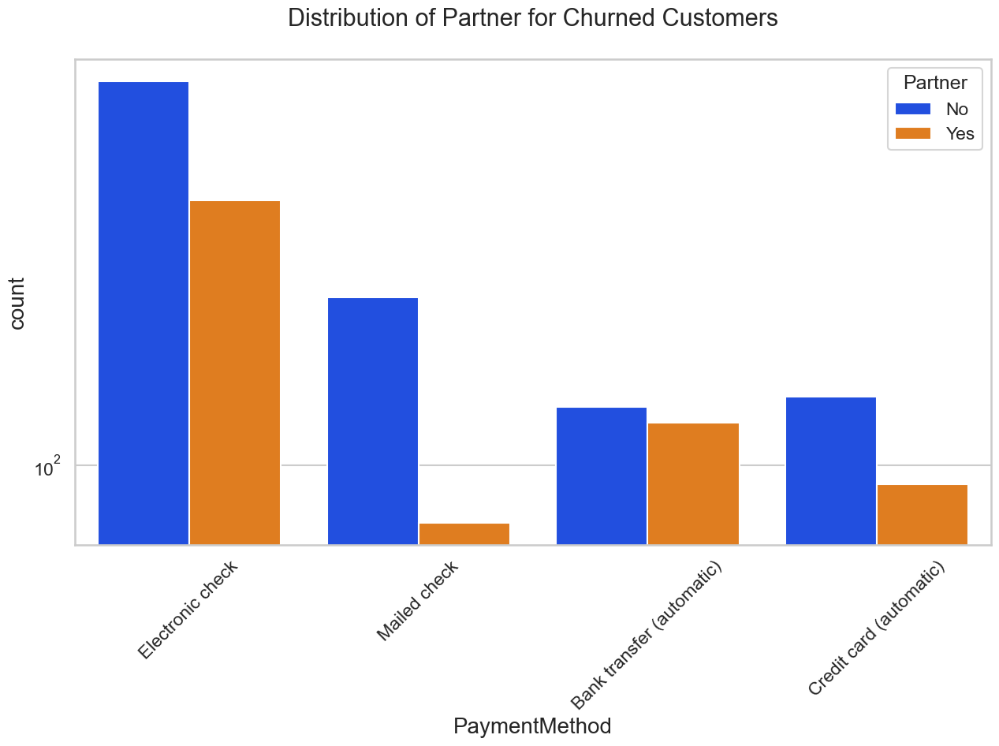

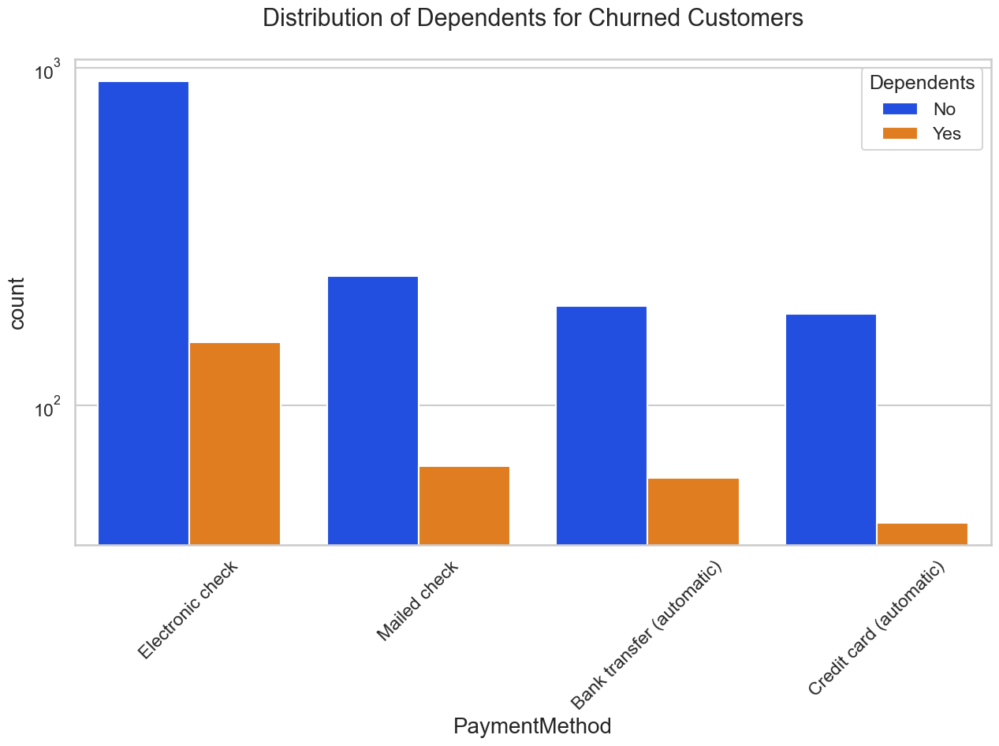

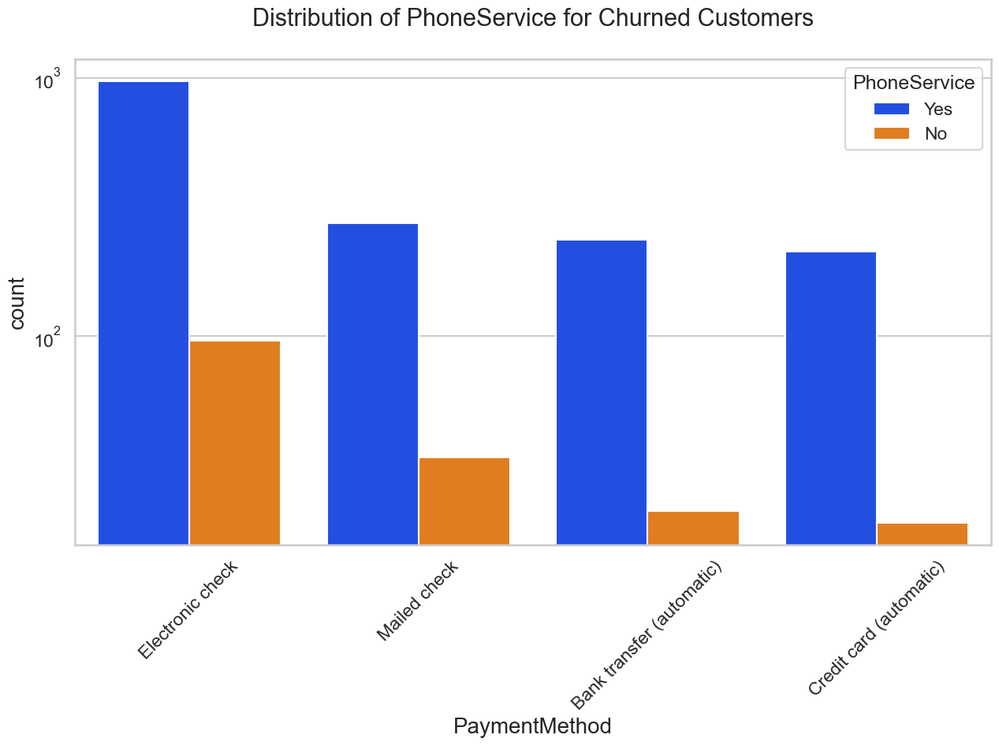

...

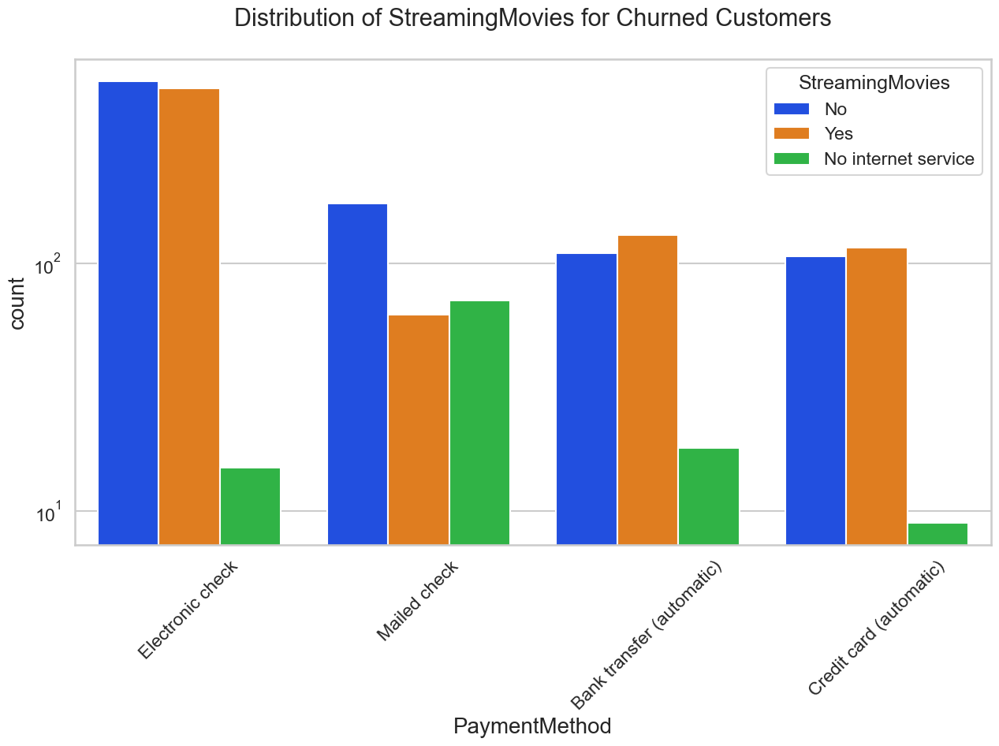

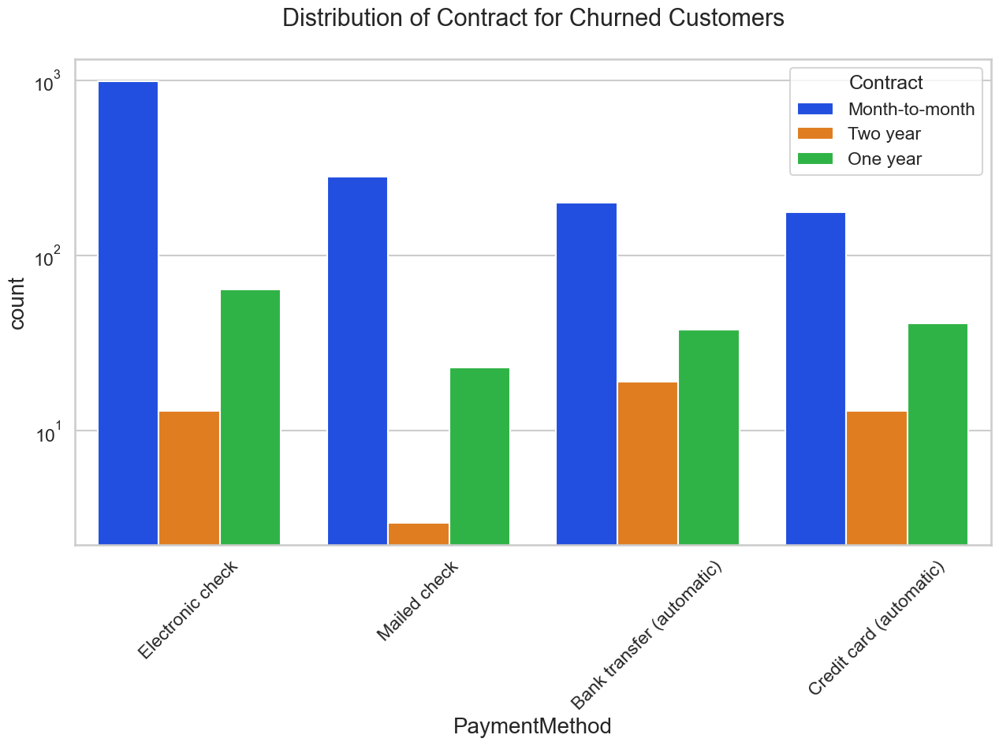

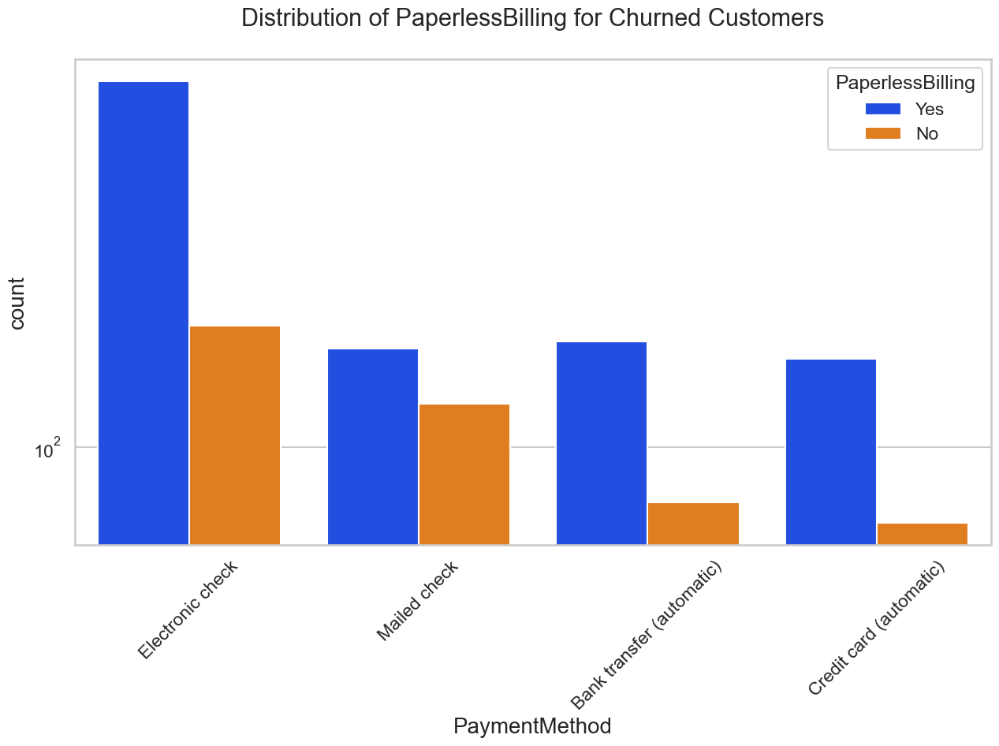

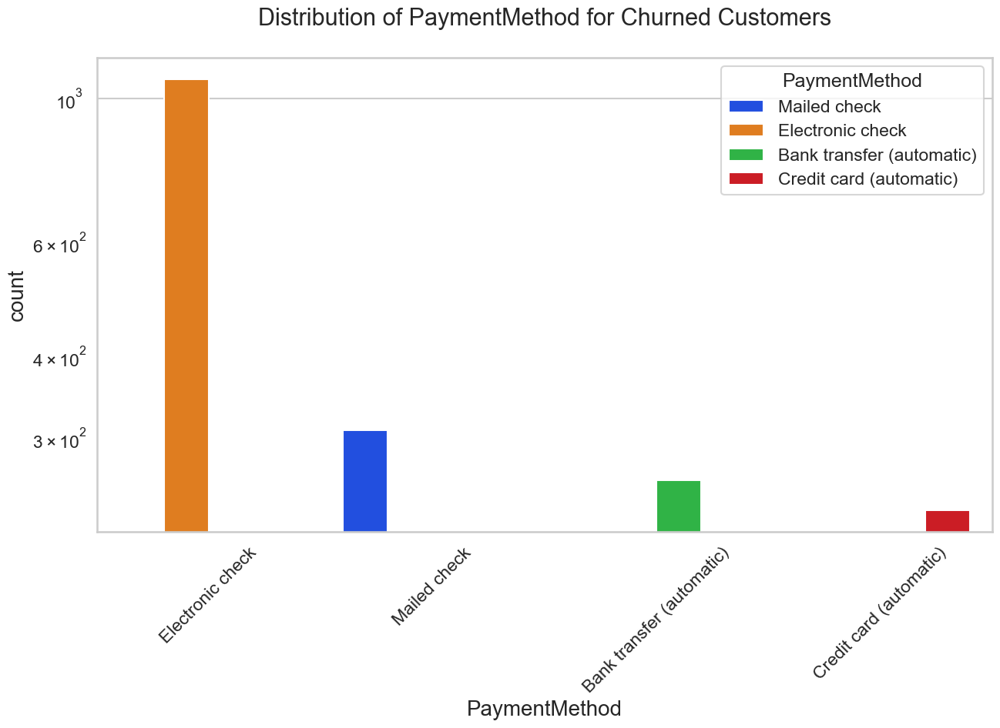

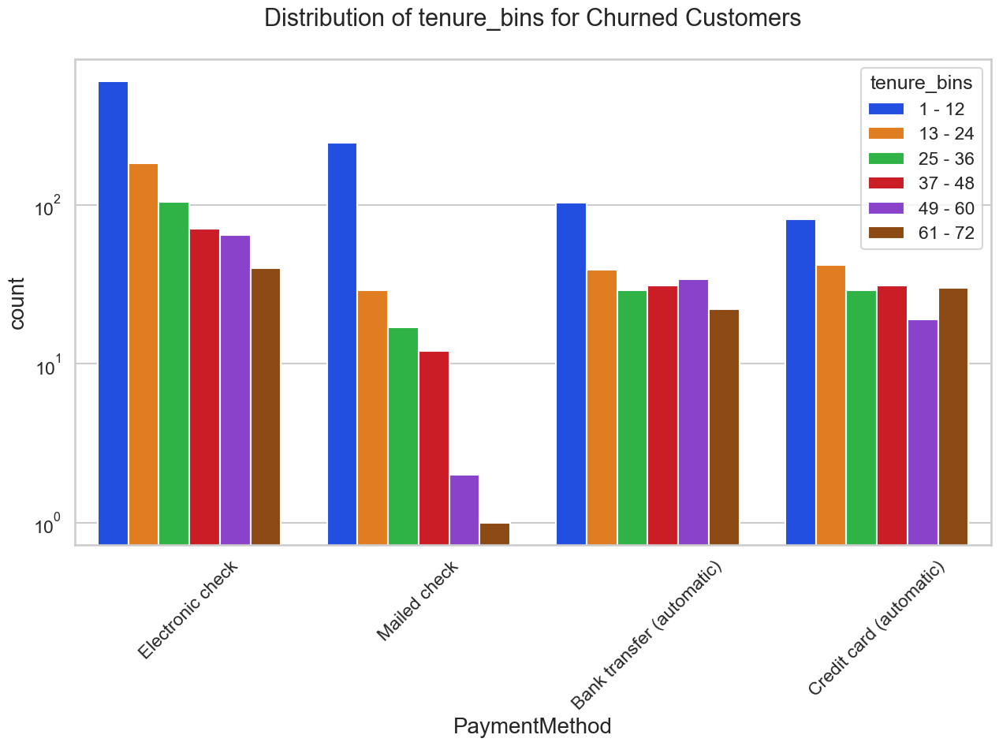

In [280]:
for col in colns:    
    uniplot(target_1,col='PaymentMethod',title=f'Distribution of {col} for Churned Customers',hue=col)

Intuition from Payment method:
- males with e-check and females with bank transfer more likely to churn
- ppl with multiple lines and e-check likely to churn
- ppl with DSL and mailed check more likely to churn
- ppl with streaming services and bank tranfer more likely to churn
- ppl with 2yr contract and mailed check have very low churn rate

Tenure Bins

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


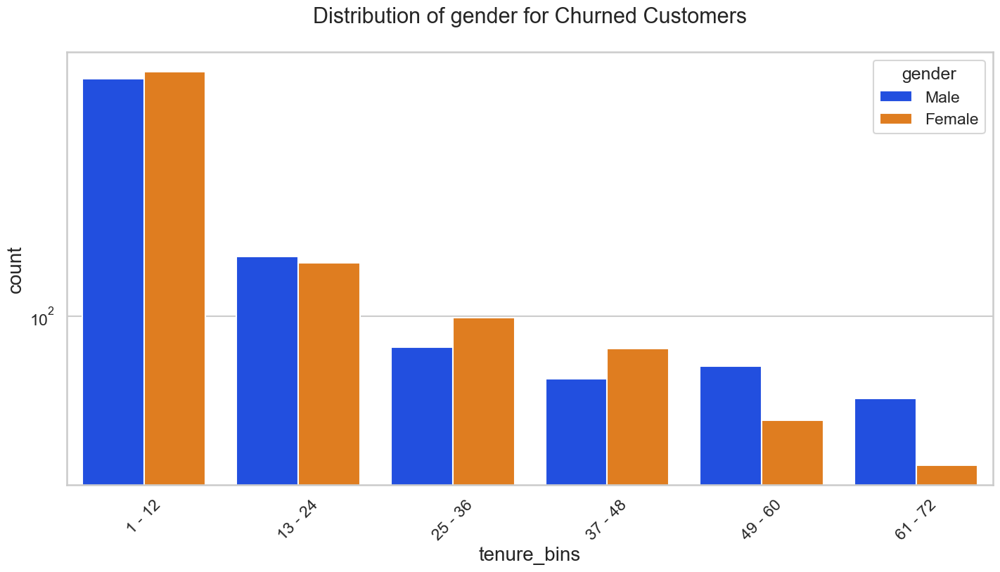

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


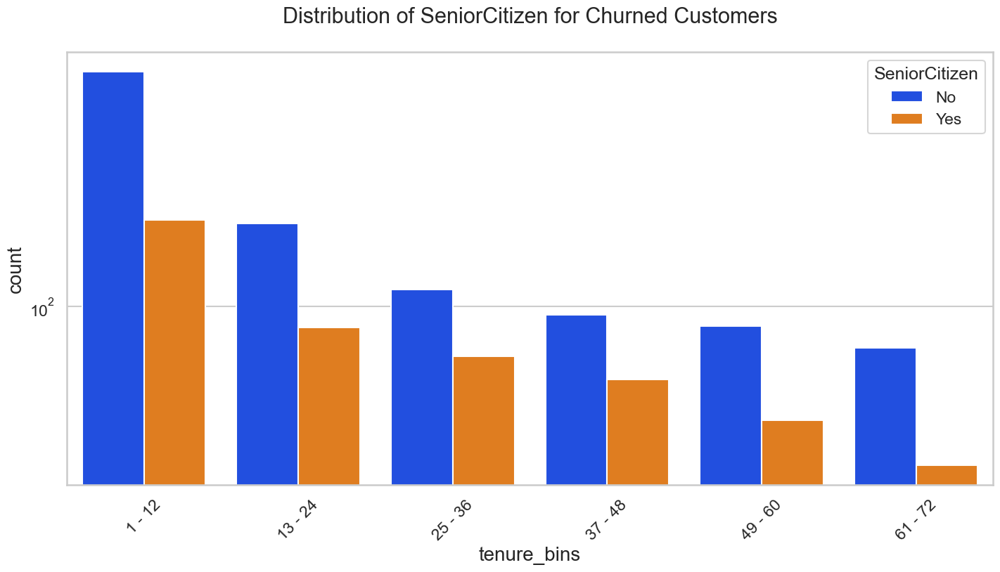

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


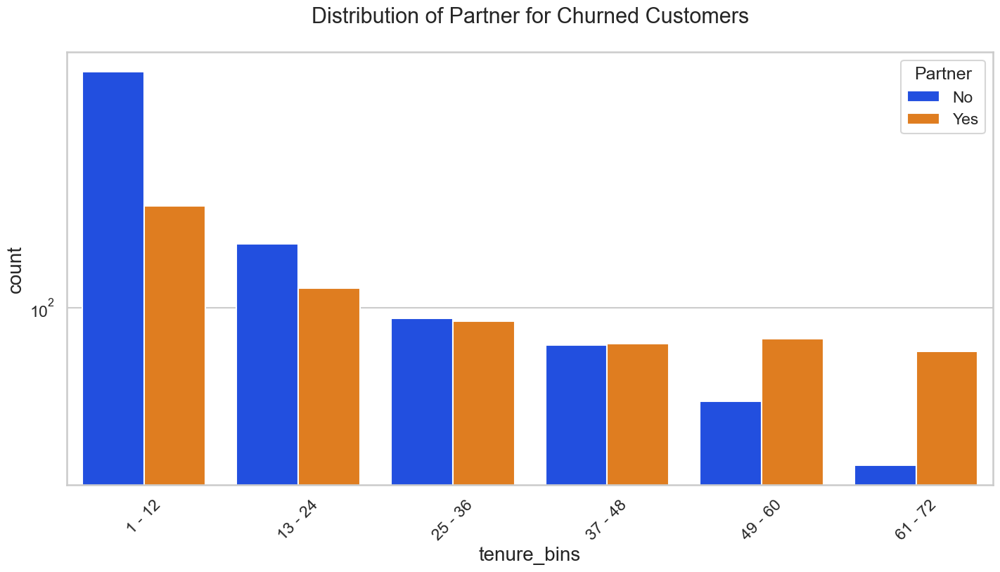

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


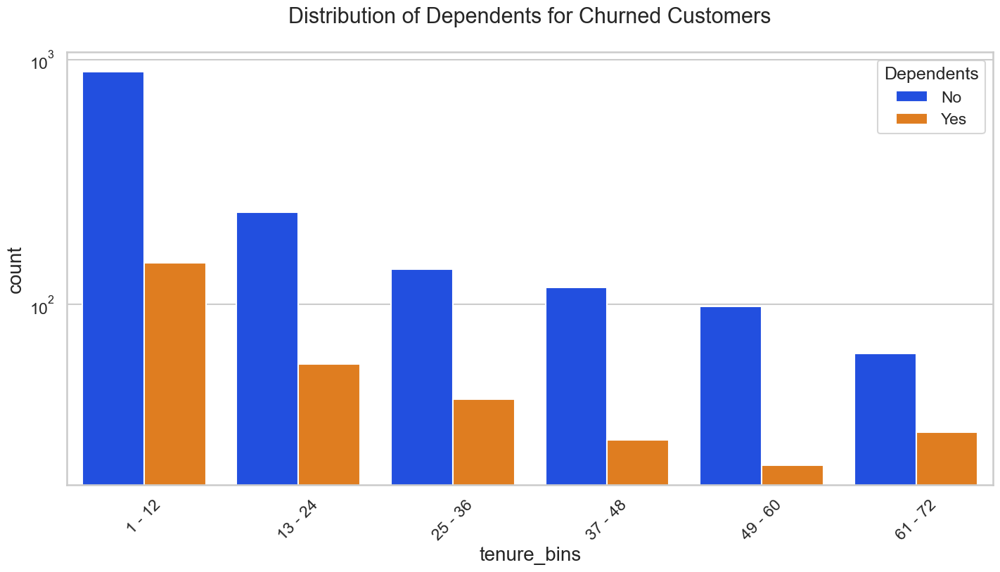

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


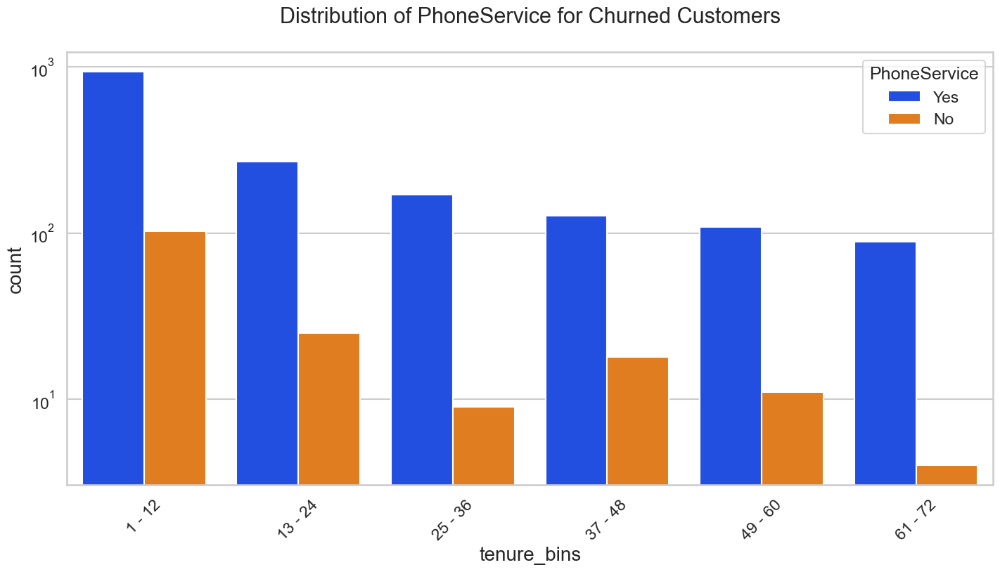

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


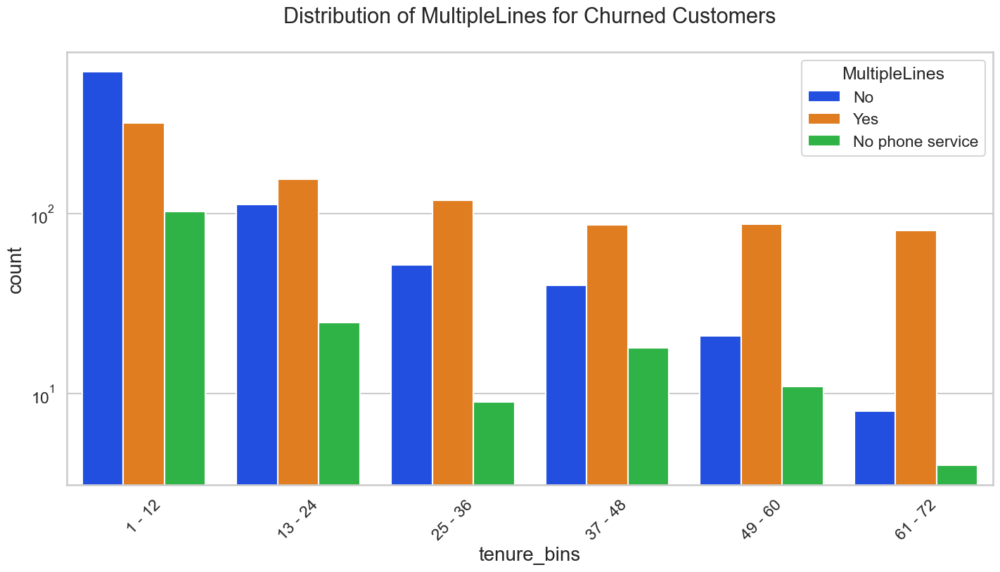

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


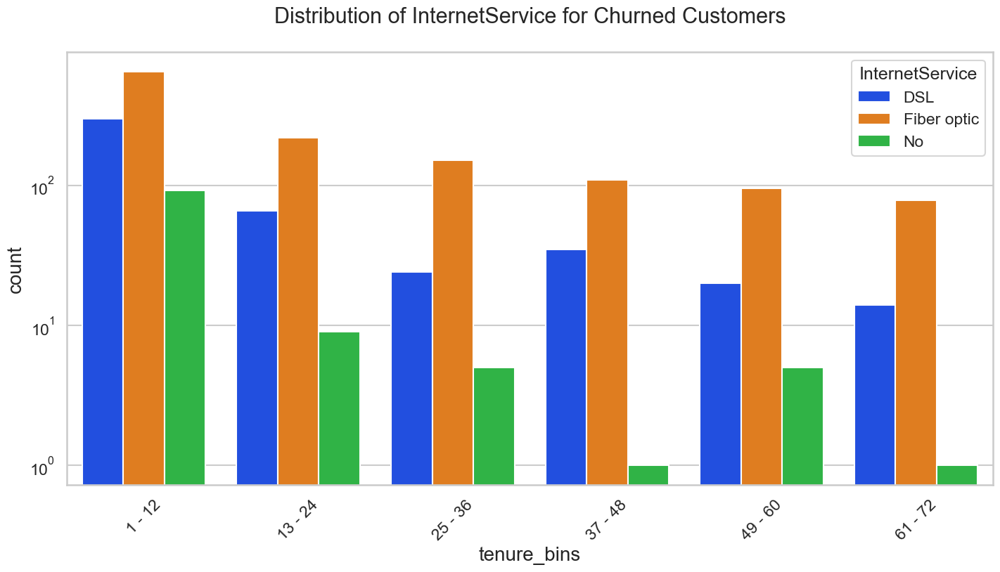

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


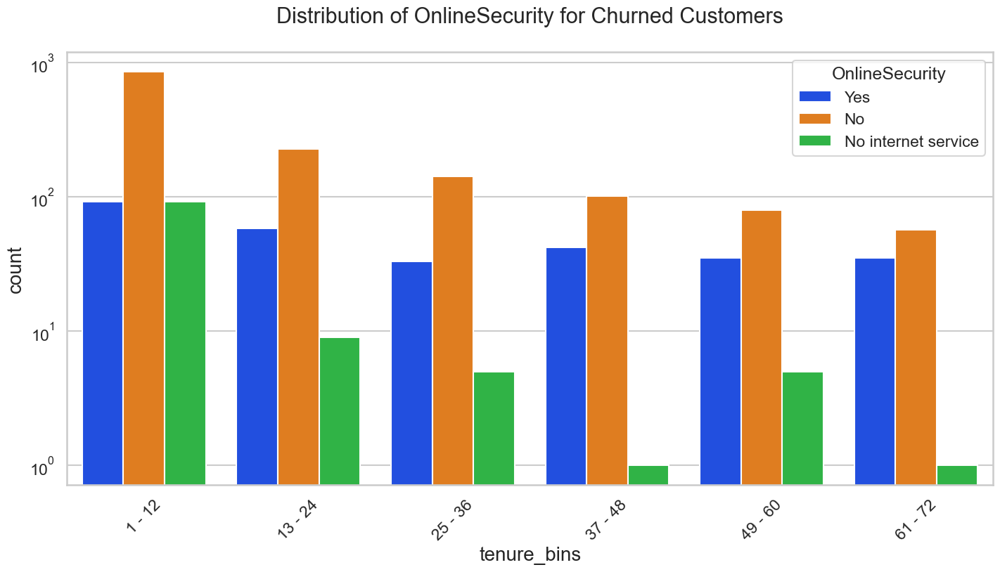

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


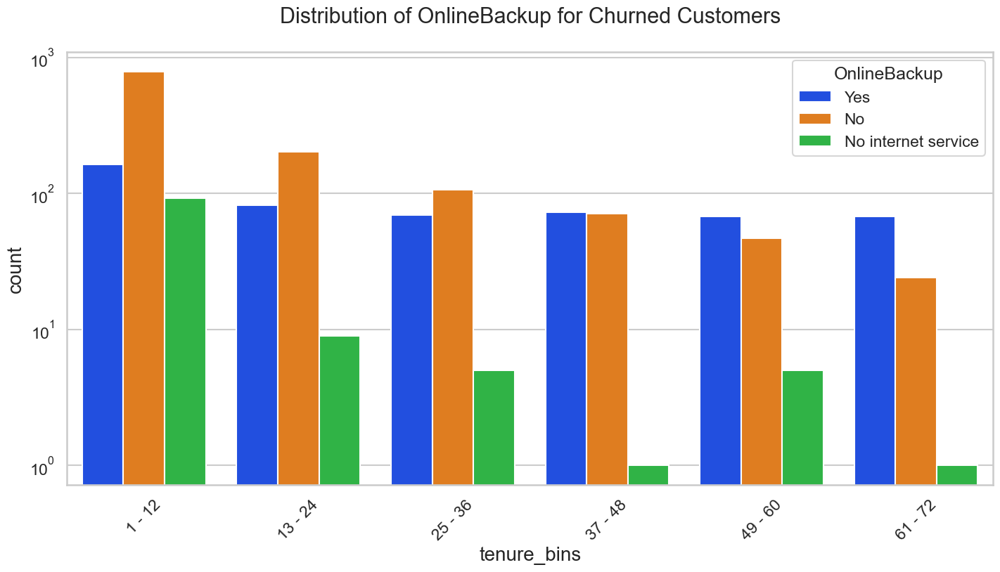

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


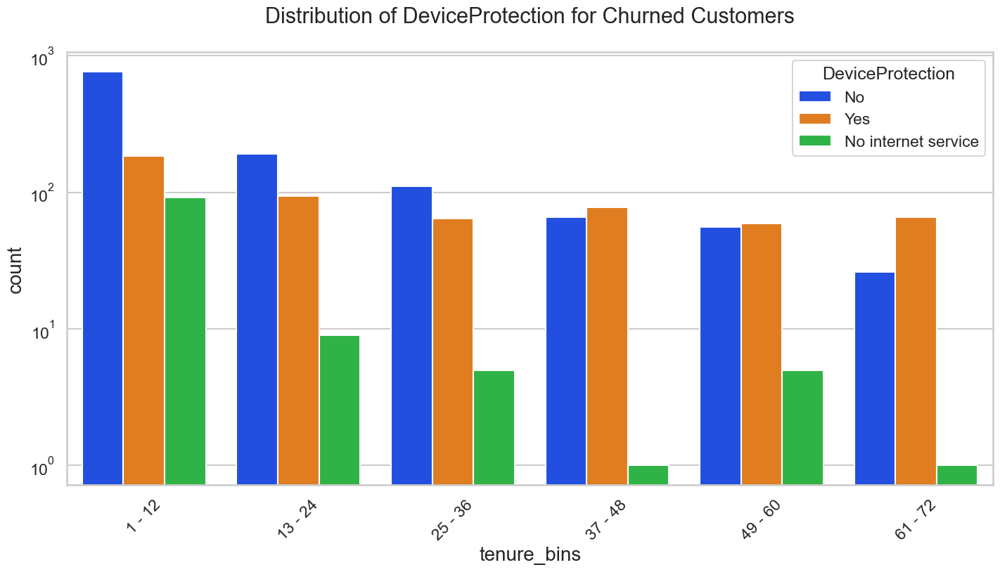

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


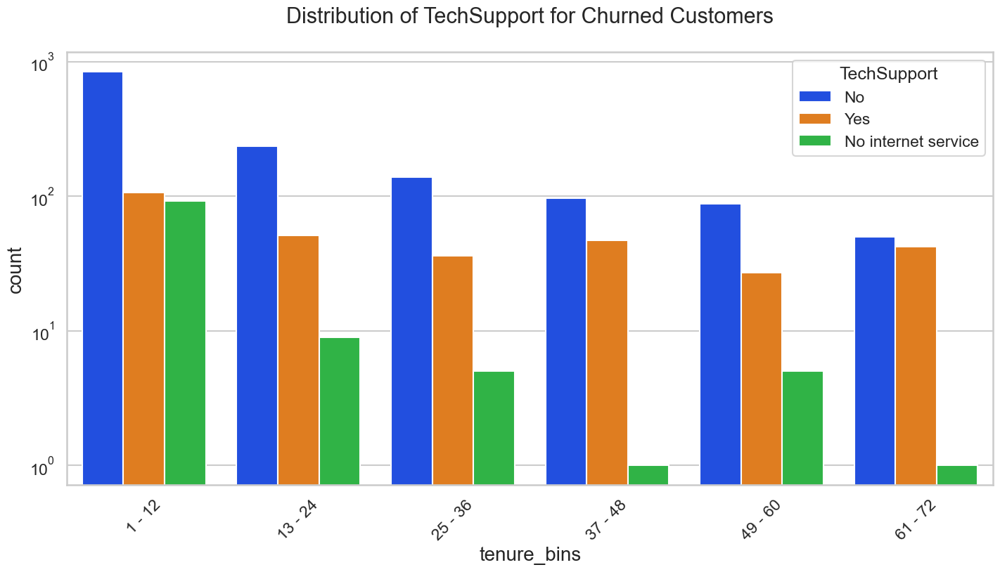

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


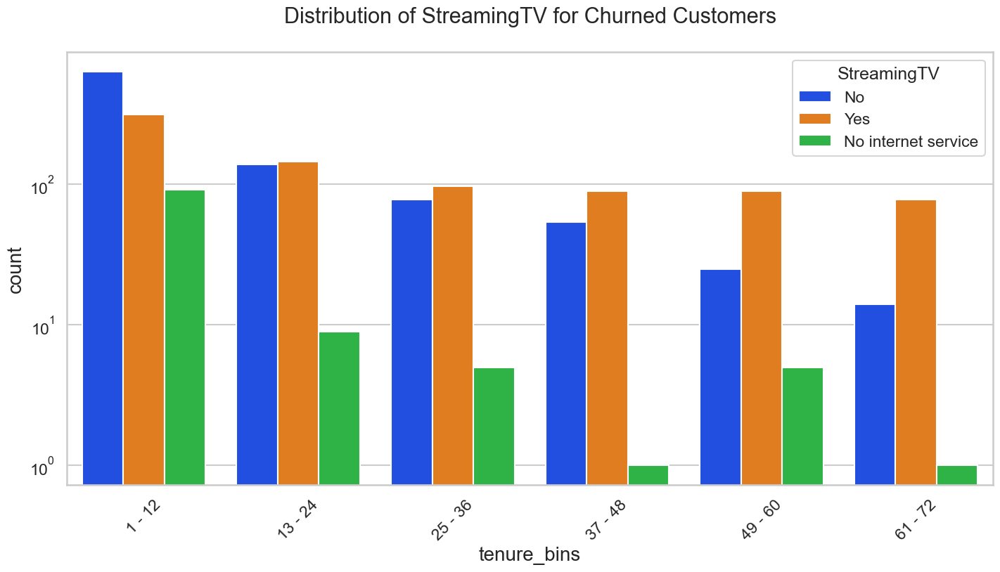

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


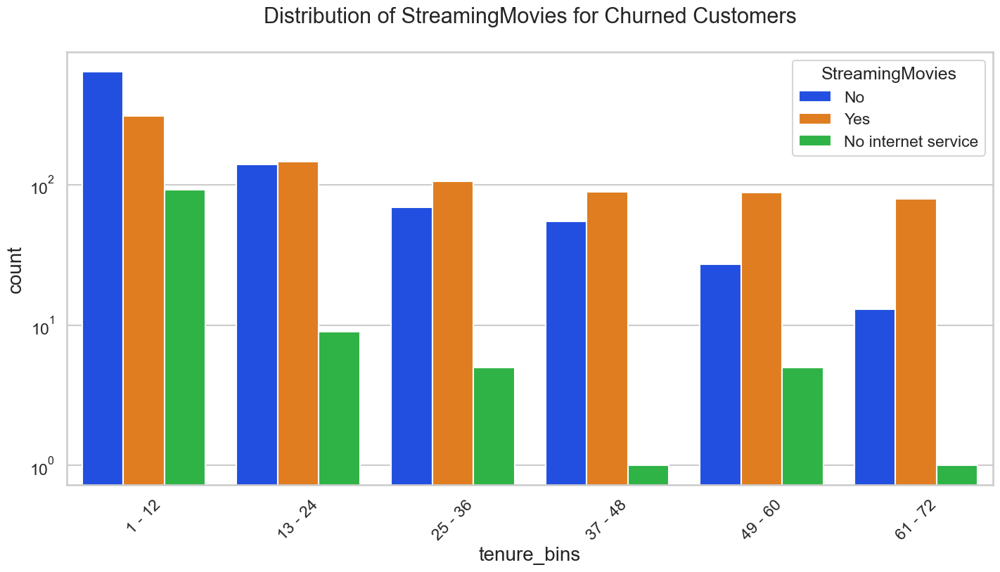

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


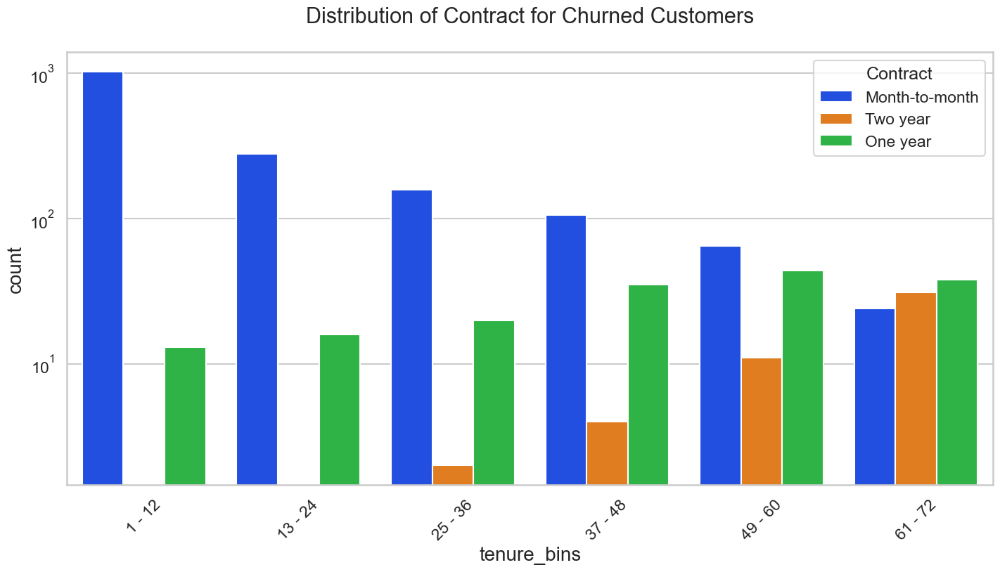

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


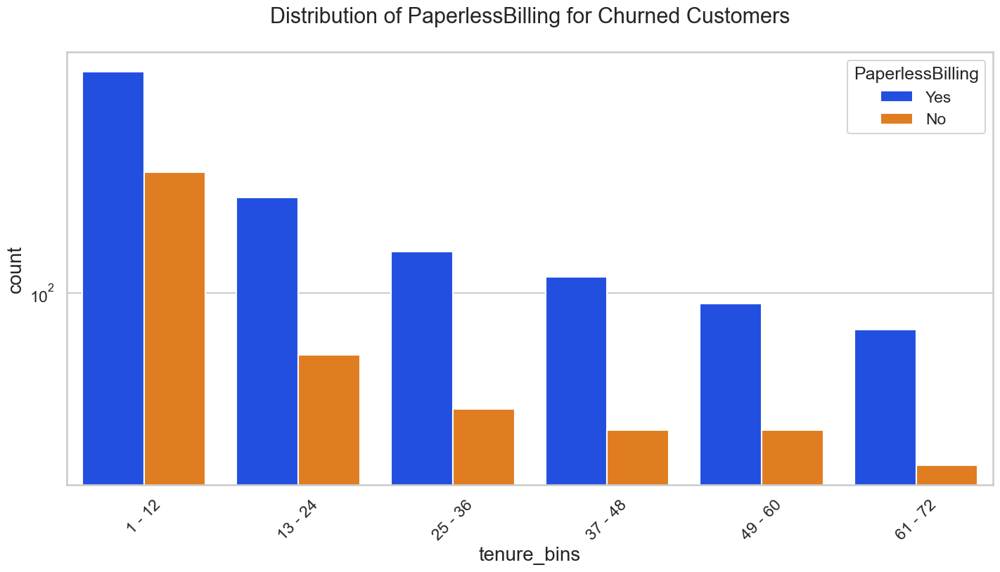

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


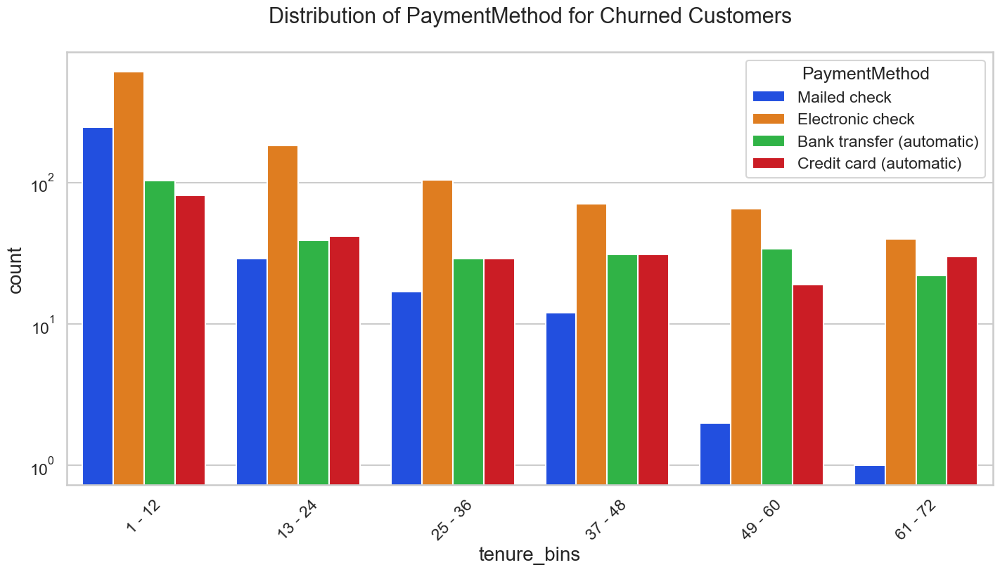

C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


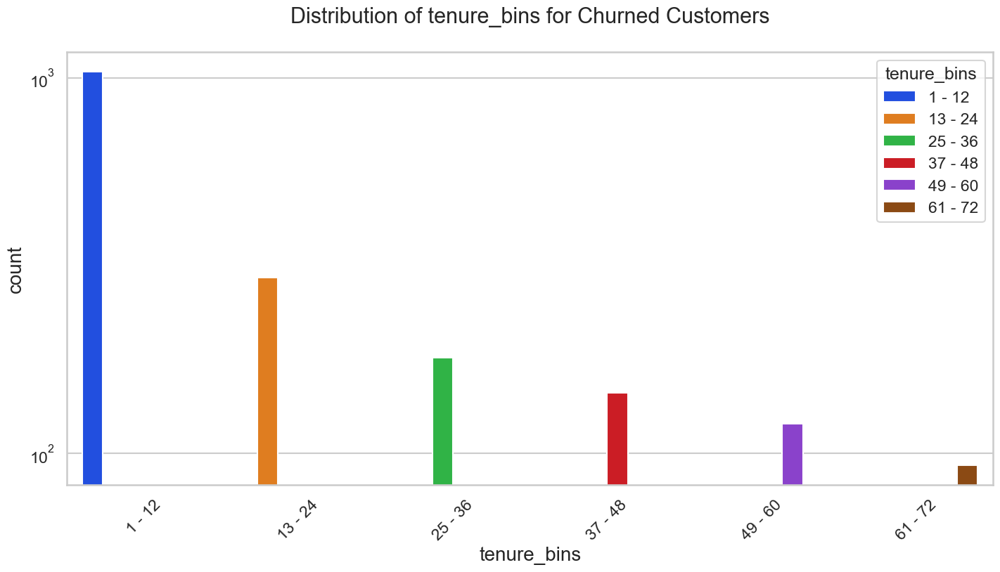

In [281]:
for col in colns:    
    uniplot(target_1,col='tenure_bins',title=f'Distribution of {col} for Churned Customers',hue=col)

Intuition from Tenure bins:
- males in tenure 13-24,49-60,61-72 and females in tenure 1-12,25-36,37-48 more likely to churn
- ppl with partner less likely to churn from tenure 37-48
- ppl with multiple lines likely to churn from after tenure 13-24
- ppl with no online backup likely to churn in tenure 1-12, 13-24, 25-36 but ppl with online backup more likely to churn in tenure 37-48, 49-60, 61-72
- ppl with device protection likely to churn from after tenure 37-48
- ppl with streaming services likely to churn from after tenure 13-24
- ppl with 1yr contract more likely to churn in tenure 61-72

In [48]:
target_1.sample(5)

,gender,SeniorCitizen,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,tenure_bins
3042,Male,No,No,No,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,No,Bank transfer (automatic),30.30,1380.10,1,37 - 48
4535,Female,No,Yes,Yes,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,100.05,3046.15,1,25 - 36
3004,Male,No,Yes,Yes,Yes,No,Fiber optic,No,No,No,No,Yes,Yes,Month-to-month,No,Mailed check,89.15,89.15,1,1 - 12
3516,Male,No,No,No,Yes,No,DSL,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,43.30,123.65,1,1 - 12
5815,Male,Yes,No,No,Yes,Yes,Fiber optic,No,No,No,No,No,Yes,Month-to-month,Yes,Electronic check,85.05,746.50,1,1 - 12


Seperating gender, partner and dependents to find which gender more likely to churn given it has no family and has a family where family will be calculated by taking OR operation between partners and dependents 

In [44]:
df_partners_dependents_gender_who_churn = target_1[['gender','Partner','Dependents']]
df_partners_dependents_gender_who_churn['Partner'].replace(['Yes','No'],[1,0],inplace=True)
df_partners_dependents_gender_who_churn['Dependents'].replace(['Yes','No'],[1,0],inplace=True)

df_partners_dependents_gender_who_churn['Family'] = df_partners_dependents_gender_who_churn['Partner'] | df_partners_dependents_gender_who_churn['Dependents']
df_partners_dependents_gender_who_churn['Family'].replace([1,0],['Yes','No'],inplace=True)
df_partners_dependents_gender_who_churn.head()

C:\Users\rohit\AppData\Local\Temp\ipykernel_1788\2821088078.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_partners_dependents_gender_who_churn['Partner'].replace(['Yes','No'],[1,0],inplace=True)
C:\Users\rohit\AppData\Local\Temp\ipykernel_1788\2821088078.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcas

,gender,Partner,Dependents,Family
2,Male,0,0,No
4,Female,0,0,No
5,Female,0,0,No
8,Female,1,0,Yes
13,Male,0,0,No


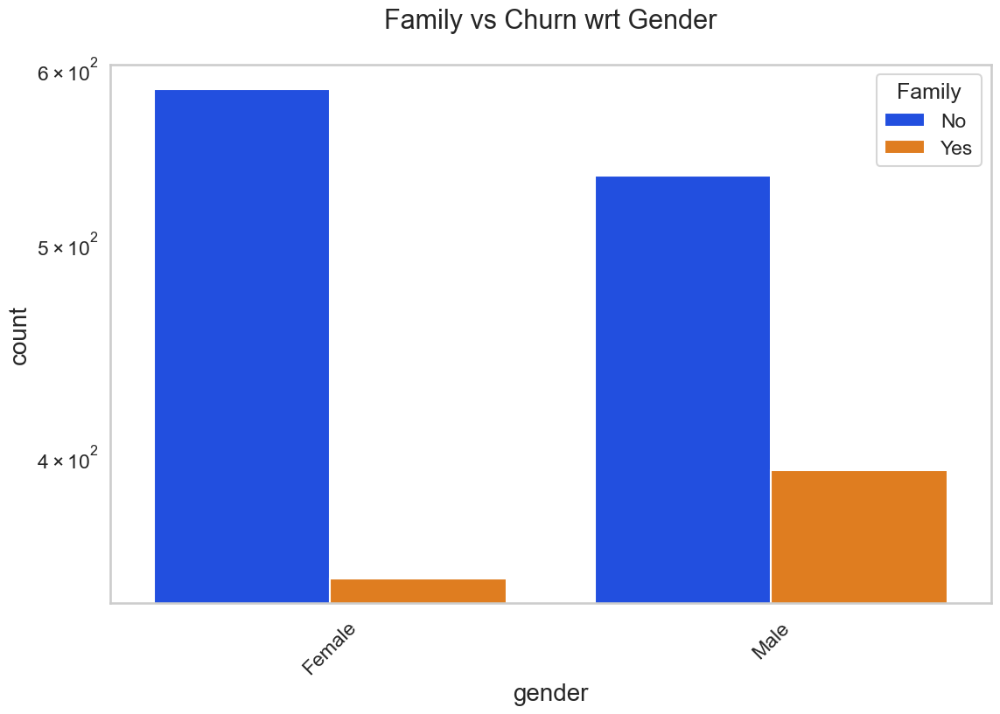

In [47]:
uniplot(df_partners_dependents_gender_who_churn,'gender',"Family vs Churn wrt Gender","Family")

Insights :
- females and males with no family most likely to churn

Trying to find which gender senior citizen more likely to churn given they have and dont have family 

In [76]:
new_target_1 = target_1[target_1['SeniorCitizen']=='Yes']
df_seniors_family = new_target_1[['gender','SeniorCitizen','Partner','Dependents']]
df_seniors_family['Partner'].replace(['Yes','No'],[1,0],inplace=True)
df_seniors_family['Dependents'].replace(['Yes','No'],[1,0],inplace=True)

df_seniors_family['Family'] = df_seniors_family['Partner'] | df_seniors_family['Dependents']
df_seniors_family.drop(['Partner','Dependents'],axis=1,inplace=True)
df_seniors_family['SeniorCitizen'].replace('Yes',1,inplace=True)
df_seniors_family['Seniors_with_Family'] = df_seniors_family['SeniorCitizen'] & df_seniors_family['Family']
df_seniors_family['Seniors_with_Family'].replace([1,0],['Yes','No'],inplace=True)

C:\Users\rohit\AppData\Local\Temp\ipykernel_1788\2289279098.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_seniors_family['Partner'].replace(['Yes','No'],[1,0],inplace=True)
C:\Users\rohit\AppData\Local\Temp\ipykernel_1788\2289279098.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_sen

In [78]:
df_seniors_family.head()

,gender,SeniorCitizen,Family,Seniors_with_Family
20,Male,1,0,No
53,Female,1,1,Yes
55,Male,1,0,No
99,Female,1,1,Yes
113,Female,1,1,Yes


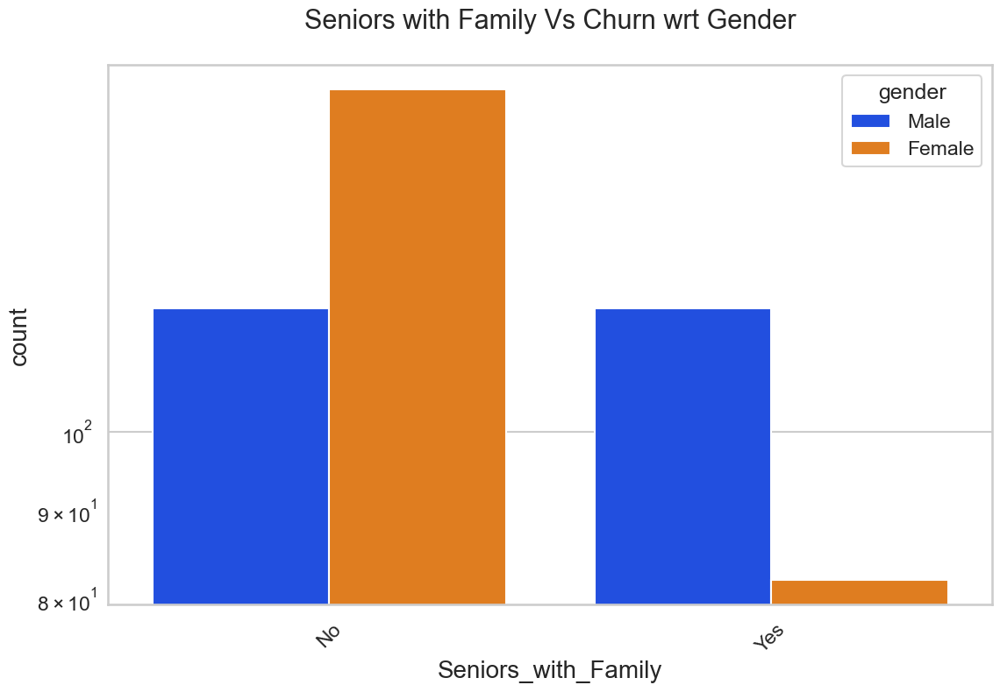

In [80]:
uniplot(df_seniors_family,'Seniors_with_Family','Seniors with Family Vs Churn wrt Gender','gender')

Insights:
- Female seniors with no family more likely to churn
- males seniors with or without family equally likely to churn

We can also analyse the distribution of gender in ppl who are seniors and have streaming services (combining streaming tv and streaming movies with logical OR operation) 

In [107]:
df_seniors_streaming = target_1[['gender','SeniorCitizen','StreamingTV','StreamingMovies']]
df_seniors_streaming = df_seniors_streaming[df_seniors_streaming['SeniorCitizen']=='Yes']
df_seniors_streaming.StreamingTV.replace(['Yes','No','No internet service'],[1,0,-1],inplace=True)
df_seniors_streaming.StreamingMovies.replace(['Yes','No','No internet service'],[1,0,-1],inplace=True)
df_seniors_streaming['Streaming_content'] = df_seniors_streaming['StreamingTV'] | df_seniors_streaming['StreamingMovies']
df_seniors_streaming.drop(['StreamingTV','StreamingMovies'],axis=1,inplace=True)
df_seniors_streaming['Streaming_content'].replace([1,0,-1],['Yes','No','No internet service'],inplace=True)
df_seniors_streaming.head()

C:\Users\rohit\AppData\Local\Temp\ipykernel_1788\3823245308.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_seniors_streaming.StreamingTV.replace(['Yes','No','No internet service'],[1,0,-1],inplace=True)
C:\Users\rohit\AppData\Local\Temp\ipykernel_1788\3823245308.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_

,gender,SeniorCitizen,Streaming_content
20,Male,Yes,Yes
53,Female,Yes,No
55,Male,Yes,Yes
99,Female,Yes,Yes
113,Female,Yes,No


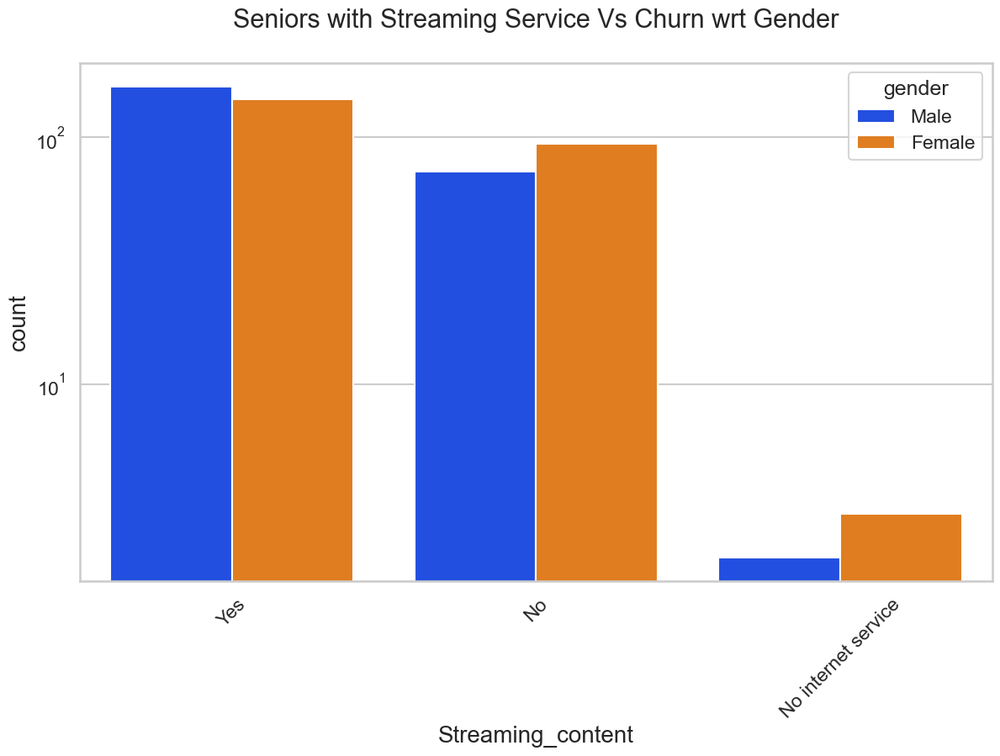

In [109]:
uniplot(df_seniors_streaming,'Streaming_content','Seniors with Streaming Service Vs Churn wrt Gender','gender')

Insights:
- male seniors with streaming and female seniors without streaming more likely to churn

Finding what monthly charge range do ppl churn the most

In [140]:
target_1['MonthlyCharges'].describe()

count    1869.000000
mean       74.441332
std        24.666053
min        18.850000
25%        56.150000
50%        79.650000
75%        94.200000
max       118.350000
Name: MonthlyCharges, dtype: float64

In [137]:
labels = ["{0} - {1}".format(i, i + 9) for i in range(10, 130, 10)]
df_ppl_churning = pd.cut(target_1['MonthlyCharges'],np.arange(10,140,10),labels=labels)
df_ppl_churning.tail()

7021      50 - 59
7026      40 - 49
7032      70 - 79
7034    100 - 109
7041      70 - 79
Name: MonthlyCharges, dtype: category
Categories (12, object): ['10 - 19' < '20 - 29' < '30 - 39' < '40 - 49' ... '90 - 99' < '100 - 109' < '110 - 119' < '120 - 129']

In [150]:
df_ppl_churning.value_counts()

MonthlyCharges
70 - 79      361
80 - 89      336
90 - 99      317
100 - 109    225
40 - 49      147
50 - 59      129
60 - 69      112
20 - 29      104
10 - 19       58
30 - 39       52
110 - 119     28
120 - 129      0
Name: count, dtype: int64

(array([129., 361., 317., 225.,  52., 104., 112., 336., 147.,  86.]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.]),
 <BarContainer object of 10 artists>)

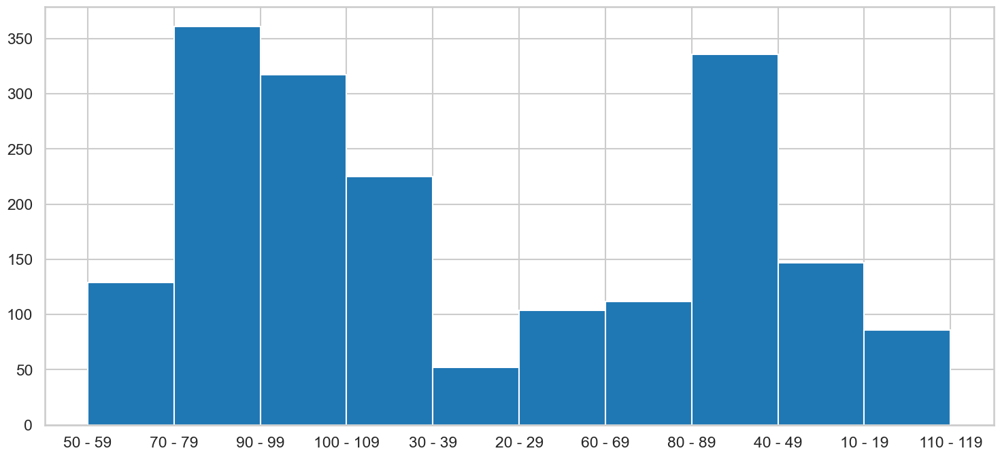

In [143]:
plt.figure(figsize=(18,8))
plt.hist(df_ppl_churning)

Ppl in monthly charge range 70-79(highest), 80-89 and 90-99 are high churners so to generalize ppl in range 70-99 are most likely to churn

Now lets find at what range seniors are most likely to churn

In [159]:
df_seniors_churning = target_1[target_1['SeniorCitizen']=='Yes']
labels = ["{0} - {1}".format(i, i + 9) for i in range(10, 130, 10)]
df_seniors_churning['MonthlyCharge_bins'] = pd.cut(target_1['MonthlyCharges'],np.arange(10,140,10),labels=labels)
df_seniors_churning.head()

C:\Users\rohit\AppData\Local\Temp\ipykernel_1788\2028336296.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_seniors_churning['MonthlyCharge_bins'] = pd.cut(target_1['MonthlyCharges'],np.arange(10,140,10),labels=labels)


,gender,SeniorCitizen,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,...,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,tenure_bins,MonthlyCharge_bins
20,Male,Yes,No,No,No,No phone service,DSL,No,No,Yes,...,No,Yes,Month-to-month,Yes,Electronic check,39.65,39.65,1,1 - 12,30 - 39
53,Female,Yes,Yes,No,Yes,Yes,Fiber optic,No,Yes,No,...,No,No,Month-to-month,Yes,Credit card (automatic),80.65,633.30,1,1 - 12,80 - 89
55,Male,Yes,No,No,Yes,Yes,Fiber optic,No,No,No,...,Yes,Yes,Month-to-month,Yes,Electronic check,95.45,1752.55,1,13 - 24,90 - 99
99,Female,Yes,Yes,No,Yes,No,Fiber optic,No,Yes,Yes,...,Yes,Yes,Month-to-month,Yes,Electronic check,98.50,2514.50,1,25 - 36,90 - 99
113,Female,Yes,Yes,No,Yes,Yes,Fiber optic,No,No,No,...,No,No,Month-to-month,Yes,Electronic check,76.50,2868.15,1,37 - 48,70 - 79


C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


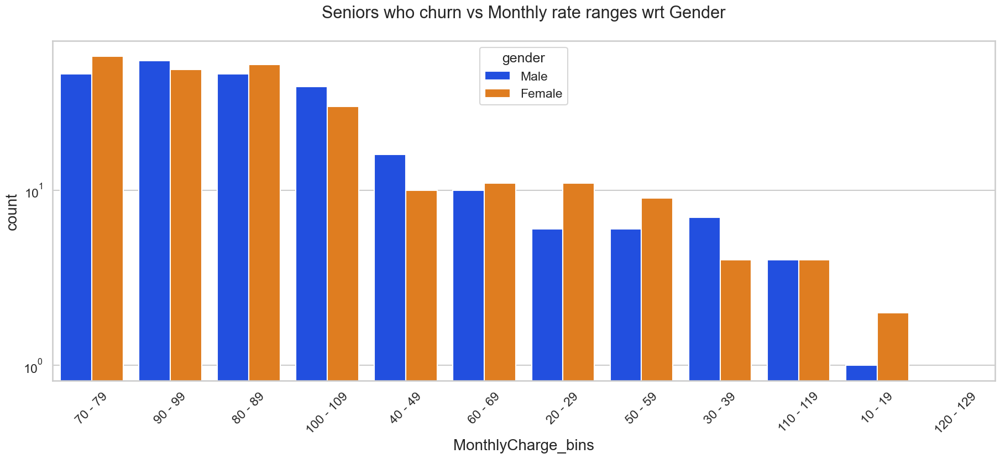

In [156]:
uniplot(df_seniors_churning,'MonthlyCharge_bins','Seniors who churn vs Monthly rate ranges wrt Gender','gender')

Insight:<br/>
It would seem that senior females are more likely to churn at ranges (70-79, 80-89, 60-69, 20-29, 50-59, 10-19) while senior males are more likely to churn at ranges (90-99, 100-109, 40-49, 30-39) 

Now lets find at what range non seniors are most likely to churn

In [158]:
df_non_seniors_churning = target_1[target_1['SeniorCitizen']=='No']
labels = ["{0} - {1}".format(i, i + 9) for i in range(10, 130, 10)]
df_non_seniors_churning['MonthlyCharge_bins'] = pd.cut(target_1['MonthlyCharges'],np.arange(10,140,10),labels=labels)
df_non_seniors_churning.head()

C:\Users\rohit\AppData\Local\Temp\ipykernel_1788\3803644881.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_non_seniors_churning['MonthlyCharge_bins'] = pd.cut(target_1['MonthlyCharges'],np.arange(10,140,10),labels=labels)


,gender,SeniorCitizen,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,...,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,tenure_bins,MonthlyCharge_bins
2,Male,No,No,No,Yes,No,DSL,Yes,Yes,No,...,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1,1 - 12,50 - 59
4,Female,No,No,No,Yes,No,Fiber optic,No,No,No,...,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1,1 - 12,70 - 79
5,Female,No,No,No,Yes,Yes,Fiber optic,No,No,Yes,...,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.50,1,1 - 12,90 - 99
8,Female,No,Yes,No,Yes,Yes,Fiber optic,No,No,Yes,...,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,1,25 - 36,100 - 109
13,Male,No,No,No,Yes,Yes,Fiber optic,No,Yes,Yes,...,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.30,1,49 - 60,100 - 109


C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\rohit\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


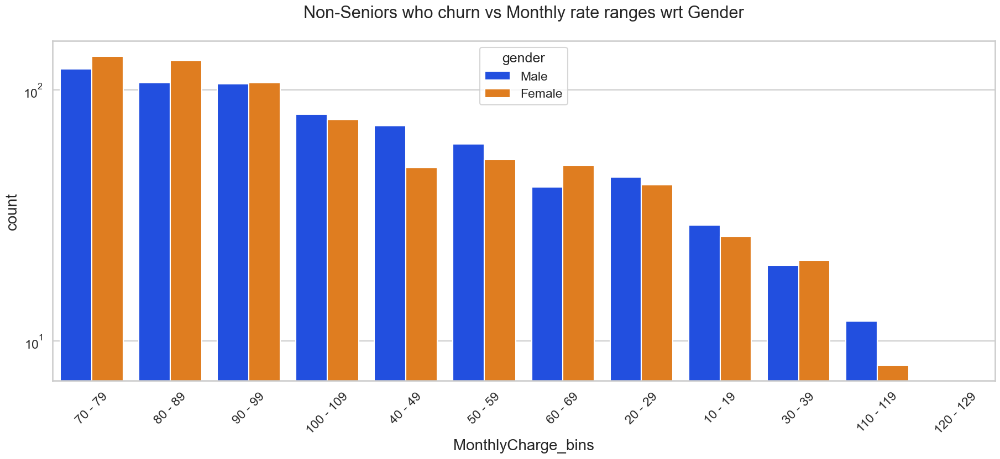

In [161]:
uniplot(df_non_seniors_churning,'MonthlyCharge_bins','Non-Seniors who churn vs Monthly rate ranges wrt Gender','gender')

Insight:<br/>
It would seem that non senior females are more likely to churn at ranges (70-79, 80-89, 60-69, 90-99, 30-39) while non senior males are more likely to churn at ranges (100-109, 40-49, 50-59, 20-29, 10-19, 110-119) 

Lets analyse the distribution for people with no phone service

In [170]:
new_target_1 = target_1[target_1['PhoneService']=='No']
df_with_family = new_target_1[['gender','Partner','Dependents']]
df_with_family['Partner'].replace(['Yes','No'],[1,0],inplace=True)
df_with_family['Dependents'].replace(['Yes','No'],[1,0],inplace=True)

df_with_family['Family'] = df_with_family['Partner'] | df_with_family['Dependents']
df_with_family.drop(['Partner','Dependents'],axis=1,inplace=True)
df_with_family['Family'].replace([1,0],['Yes','No'],inplace=True)

C:\Users\rohit\AppData\Local\Temp\ipykernel_1788\4291648883.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_with_family['Partner'].replace(['Yes','No'],[1,0],inplace=True)
C:\Users\rohit\AppData\Local\Temp\ipykernel_1788\4291648883.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_with_f

In [171]:
df_with_family.head()

,gender,Family
20,Male,No
27,Male,Yes
131,Female,Yes
133,Male,No
168,Male,Yes


<Axes: >

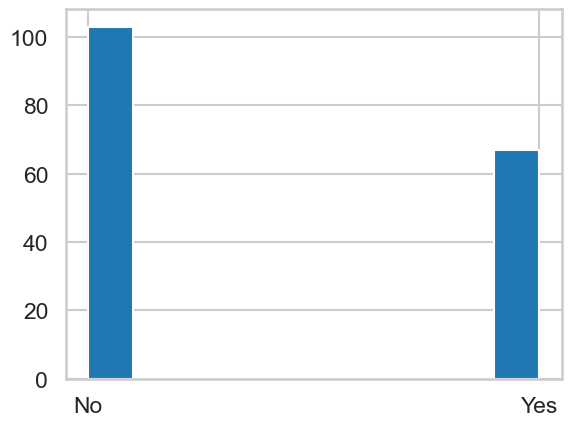

In [174]:
df_with_family['Family'].hist()

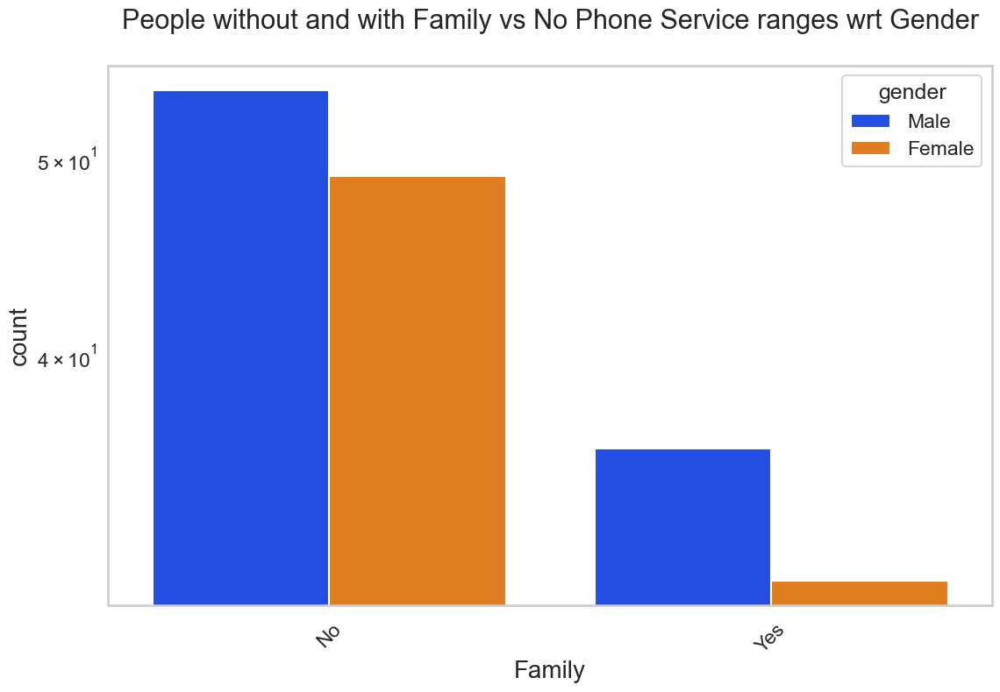

In [173]:
uniplot(df_with_family,'Family','People without and with Family vs No Phone Service ranges wrt Gender','gender')

Now lets analyse it with respect to poeple who have phone service

In [175]:
new_target_1 = target_1[target_1['PhoneService']=='Yes']
df_with_family = new_target_1[['gender','Partner','Dependents']]
df_with_family['Partner'].replace(['Yes','No'],[1,0],inplace=True)
df_with_family['Dependents'].replace(['Yes','No'],[1,0],inplace=True)

df_with_family['Family'] = df_with_family['Partner'] | df_with_family['Dependents']
df_with_family.drop(['Partner','Dependents'],axis=1,inplace=True)
df_with_family['Family'].replace([1,0],['Yes','No'],inplace=True)

C:\Users\rohit\AppData\Local\Temp\ipykernel_1788\1426286777.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_with_family['Partner'].replace(['Yes','No'],[1,0],inplace=True)
C:\Users\rohit\AppData\Local\Temp\ipykernel_1788\1426286777.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_with_f

<Axes: >

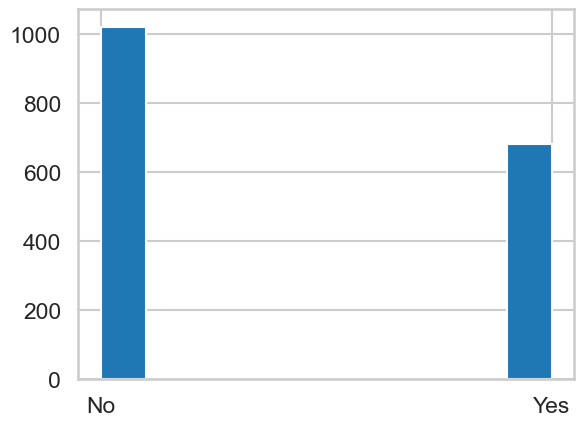

In [176]:
df_with_family['Family'].hist()

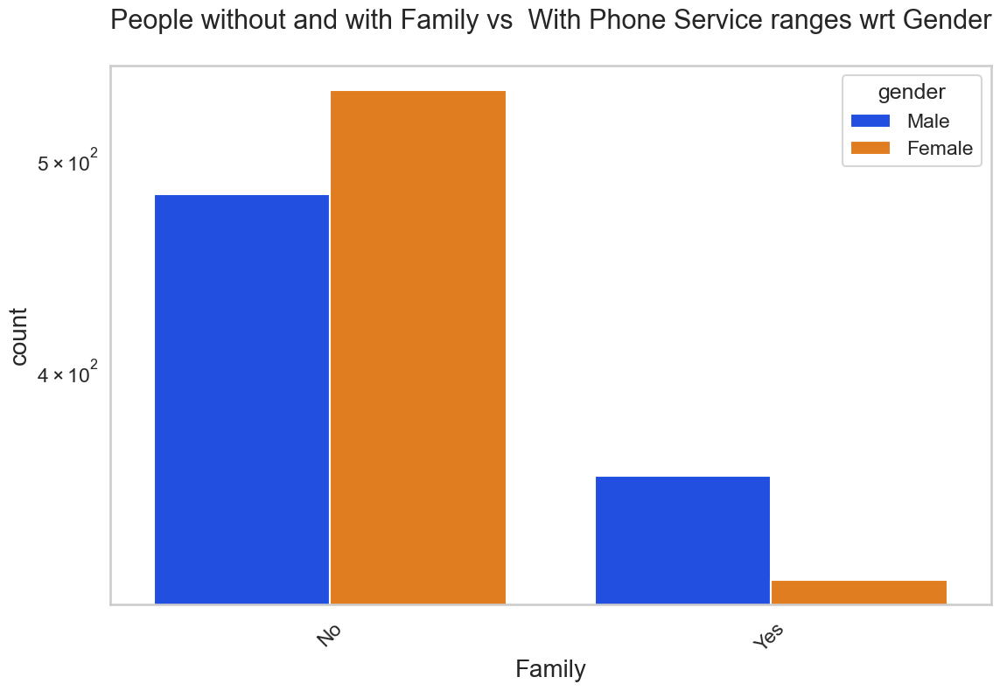

In [178]:
uniplot(df_with_family,'Family','People without and with Family vs  With Phone Service ranges wrt Gender','gender')